In [192]:
using Distributions, Distances, ForwardDiff, LinearAlgebra, Plots, Statistics

This notebook explores the Black-Box VI by Ranganath et al. (https://arxiv.org/pdf/1401.0118.pdf)

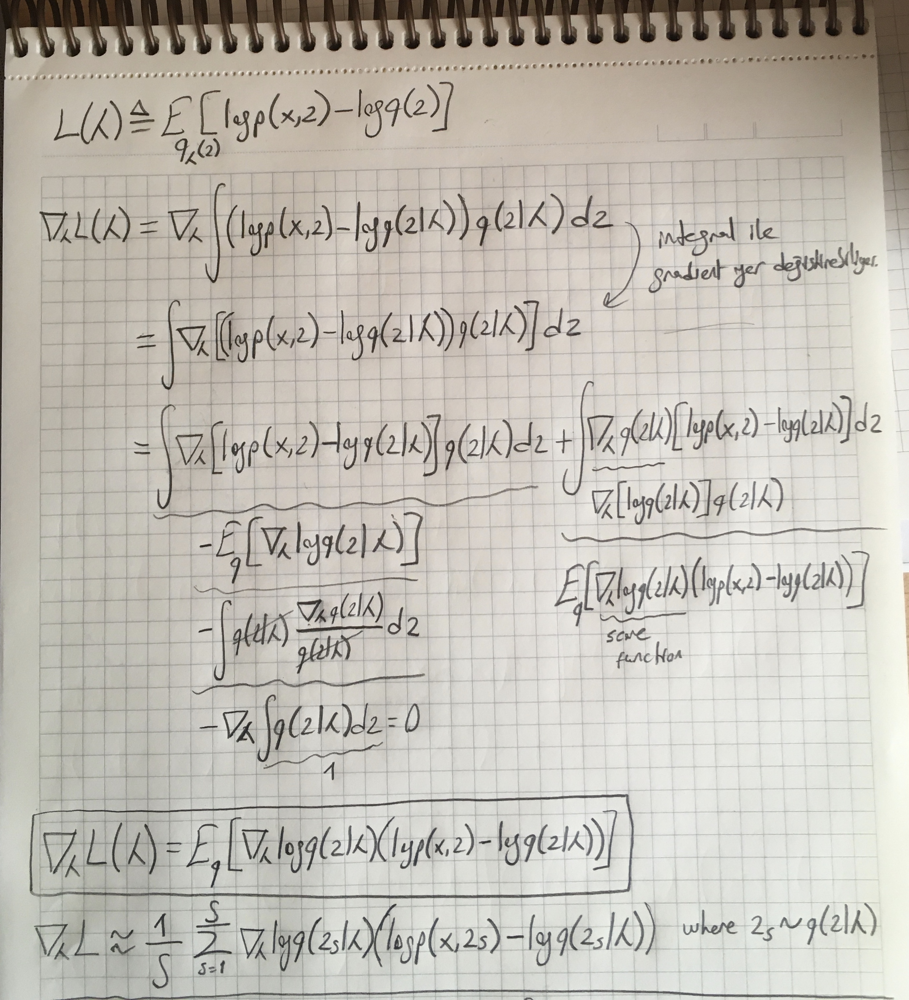

In [176]:
display("image/png", read("bbox.png"))

# Naive Implementation

## Beta-Bernoulli Model

In [107]:
#true data generative process
N = 100 #number of observations
f_real = Bernoulli(0.7) #true model is a Normal dist. with mean 18 and variance 4
data = rand(f_real,N)
;

In [109]:
prior = Beta(10,10)
true_posterior = Beta(10+sum(data),10+100-sum(data))

Beta{Float64}(α=83.0, β=37.0)

In [114]:
likelihood(z) = Bernoulli(z)
#define logpdf for factors
logpdf_prior(z) = logpdf(prior,z)
function logpdf_likelihood(data,z)
    logp = 0
    for d in data
        logp += logpdf(likelihood(z),d)
    end
    return logp
end
logpdf_model(data,z) = logpdf_likelihood(data,z)+logpdf_prior(z)
;

In [115]:
#recognition distribution
q(a,b) = Beta(a,b)

logpdf_q(z,a,b) = logpdf(q(a,b),z)
;

In [121]:
function optimize(data,logpdf_model,logpdf_q,q,a0,b0,num_iterations,num_samples)
    params = [a0,b0]
    log_pdf_q(z,params) = logpdf_q(z,params[1],params[2])
    for iteration=1:num_iterations
        #step_size = 0.00001/sqrt(iteration) #too small for Gaussian, ok for IG
        step_size = 0.1/sqrt(iteration) #ok for Gaussian, too large for IG
        #step_size = [0.0001,0.0001,0.00001, 0.00001] ./sqrt(iteration)
        component = zeros(2)
        for s=1:num_samples
            z_sample = rand(q(params[1],params[2]))
            lpdf_q(params) = log_pdf_q(z_sample,params)
            score = ForwardDiff.gradient(lpdf_q,params)
            eval = logpdf_model(data,z_sample) - log_pdf_q(z_sample,params)
            component += score .* eval
        end
        grad_est = component ./ num_samples
        new_params = params .+ step_size .* grad_est
        #check if the update leads to valid setup
        if new_params[1] < 0
            new_params[1] = 1e-5
        end
        if new_params[2] < 0
            new_params[2] = 1e-5
        end
        params = new_params
        @show params
    end
end

optimize (generic function with 2 methods)

In [122]:
optimize(data,logpdf_model,logpdf_q,q,10,10,1000,50)

params = [10.452367420791642, 9.560622481906508]
params = [10.70062396275, 9.252496851983437]
params = [10.788322994516278, 9.146711447223106]
params = [10.75896195876453, 9.183443456013144]
params = [10.723518071243793, 9.153690649389029]
params = [10.776932400568045, 9.103418492045487]
params = [11.084921783897345, 8.771797956694662]
params = [11.122303364960453, 8.693618076447875]
params = [11.350395042837857, 8.45964027710509]
params = [11.442838721934418, 8.360807444659294]
params = [11.515735205313801, 8.255630286146772]
params = [11.518002104785685, 8.250920155314127]
params = [11.510582732917845, 8.286529446748355]
params = [11.49789271267061, 8.307406569239191]
params = [11.535608685026451, 8.264865515319688]
params = [11.501210704930413, 8.325970277109151]
params = [11.525914503848407, 8.285771677965702]
params = [11.59350950550414, 8.236272582733477]
params = [11.686014051402278, 8.14017150167928]
params = [11.728116973844148, 8.079481254133887]
params = [11.77719825250203, 

params = [12.96672434349235, 6.478315992483152]
params = [12.980402961218918, 6.453621648919278]
params = [12.964320334122563, 6.495590322924453]
params = [12.96526587051713, 6.492990848217933]
params = [12.983281931970312, 6.460650528607578]
params = [12.97910759910681, 6.474062288663757]
params = [12.96955688640704, 6.50361203217048]
params = [12.979647246269298, 6.478863925629397]
params = [12.975551332281817, 6.493369867699547]
params = [12.976943516908936, 6.494386417425097]
params = [12.98522588040804, 6.489403908745994]
params = [12.987637513293775, 6.479963087411048]
params = [13.000883688254495, 6.459070211909337]
params = [13.008229301882741, 6.445013372832037]
params = [13.015336888730626, 6.432543725699851]
params = [12.996454641177039, 6.469922074064617]
params = [13.009241502203038, 6.442257002767657]
params = [13.026856842713654, 6.406215711622392]
params = [13.018618479104834, 6.4328641533257915]
params = [13.020149509642662, 6.436176342193377]
params = [13.039568690196

params = [13.329484893212928, 6.474887563656669]
params = [13.32592256010688, 6.482066122369123]
params = [13.32297416743449, 6.484952375446337]
params = [13.325190693912685, 6.480200701396104]
params = [13.320766569511918, 6.477528499859236]
params = [13.311988886349083, 6.497935619951574]
params = [13.312400310514596, 6.499654456253708]
params = [13.31053892869894, 6.497500515954747]
params = [13.304647455211903, 6.5045486311665295]
params = [13.312064427855649, 6.483155102182229]
params = [13.313197921839047, 6.478250807196958]
params = [13.316837906648825, 6.475969296558613]
params = [13.31815069380964, 6.475764551073246]
params = [13.32863328859915, 6.449394228880776]
params = [13.325992012290753, 6.451324431552583]
params = [13.327179173670505, 6.448660515879466]
params = [13.322608603767383, 6.460450330586059]
params = [13.315988625696377, 6.4713581994618865]
params = [13.320654071701998, 6.463214933302689]
params = [13.315182027331279, 6.475851037200223]
params = [13.3185649324

params = [13.509885185264846, 6.388727046900711]
params = [13.509865999855382, 6.385842483616093]
params = [13.504173419174665, 6.403565274200451]
params = [13.505459613337925, 6.402976245579968]
params = [13.516046833551485, 6.3831057027320055]
params = [13.523217364517855, 6.373758310283811]
params = [13.523465613876372, 6.373503492609672]
params = [13.529465100612967, 6.363962438298089]
params = [13.536207631585022, 6.349832101760723]
params = [13.53461098572922, 6.350929085590494]
params = [13.539984819543834, 6.344370892401506]
params = [13.546031349319263, 6.335543802246352]
params = [13.539492343843683, 6.352398717018048]
params = [13.537919415693217, 6.3514514237589585]
params = [13.534503871889443, 6.354222004014186]
params = [13.53498324893326, 6.351687082836168]
params = [13.532440593274503, 6.357456991359793]
params = [13.533423285926665, 6.3596091661920475]
params = [13.537537530868136, 6.349079571840773]
params = [13.529622877053258, 6.3663844667046705]
params = [13.52202

In [123]:
83/(83+37)

0.6916666666666667

In [124]:
13.46/(13.46+6.6)

0.6709870388833499

Estimation of the mean is pretty satisfactory but variance is not.

## Gaussian likelihood with Gaussian prior on mean and Inverse-Gamma prior on variance

In [125]:
#true data generative process
N = 100 #number of observations
f_real = Normal(18,2) #true model is a Normal dist. with mean 18 and variance 4
data = rand(f_real,N)
;

In [126]:
# model specification
f_m = Normal(10,sqrt(10)) #Gaussian prior on mean
f_v = InverseGamma(3,3) #InvGamma(shape,scale) prior on variance.
f_l(z1,z2) = Normal(z1,sqrt(z2)) #likelihood distribution

#define pdf for factors
pdf_m(z1) = pdf(f_m,z1)
pdf_v(z2) = pdf(f_v,z2)
function pdf_l(data,z1,z2)
    p = 1
    for d in data
        p *= pdf(f_l(z1,z2),d)
    end
    return p
end
pdf_model(data,z1,z2) = pdf_l(data,z1,z2)*pdf_m(z1)*pdf_v(z2)

#define logpdf for factors
logpdf_m(z1) = logpdf(f_m,z1)
logpdf_v(z2) = logpdf(f_v,z2)
function logpdf_l(data,z1,z2)
    logp = 0
    for d in data
        logp += logpdf(f_l(z1,z2),d)
    end
    return logp
end
logpdf_model(data,z1,z2) = logpdf_l(data,z1,z2)+logpdf_m(z1)+logpdf_v(z2)
;

In [127]:
#recognition distribution
q_m(a,b) = Normal(a,b) #mean a, s.d. b
q_v(c,d) = InverseGamma(c,d) #shape c, scale d

pdf_q(m,v,a,b,c,d) = pdf(q_m(a,b),m) * pdf(q_v(c,d),v) #pdf of recog. dist.
logpdf_q(m,v,a,b,c,d) = logpdf(q_m(a,b),m) + logpdf(q_v(c,d),v) #logpdf of recog. dist.
;

In [159]:
function optimize(data,logpdf_model,logpdf_q,q_m,q_v,a0,b0,c0,d0,num_iterations,num_samples)
    params = [a0,b0,c0,d0]
    log_pdf_q(z1,z2,params) = logpdf_q(z1,z2,params[1],params[2],params[3],params[4])
    for iteration=1:num_iterations
        #step_size = 0.00001/sqrt(iteration) #too small for Gaussian, ok for IG
        #step_size = 0.0001/sqrt(iteration) #ok for Gaussian, too large for IG
        step_size = [0.0001,0.0001,0.00001, 0.00001] ./sqrt(iteration)
        component = zeros(4)
        for s=1:num_samples
            z1_sample = rand(q_m(params[1],params[2]))
            z2_sample = rand(q_v(params[3],params[4]))
            lpdf_q(params) = log_pdf_q(z1_sample,z2_sample,params)
            score = ForwardDiff.gradient(lpdf_q,params)
            eval = logpdf_model(data,z1_sample,z2_sample) - log_pdf_q(z1_sample,z2_sample,params)
            component += score .* eval
        end
        grad_est = component ./ num_samples
        new_params = params .+ step_size .* grad_est
        #check if the update leads to valid setup
        if new_params[2] < 0
            new_params[2] = 1e-2
        end
        if new_params[3] < 2
            new_params[3] = 2 + 1e-2
        end
        if new_params[4] < 0
            new_params[4] = 1e-2
        end
        params = new_params
        @show params
    end
end

optimize (generic function with 2 methods)

In [160]:
optimize(data,logpdf_model,logpdf_q,q_m,q_v,10.0,1.0,3.0,3.0,20000,50)

params = [10.101657865592335, 0.9738750990754911, 2.9928033568239676, 3.0075672014178454]
params = [10.212408034917818, 0.9258928585173667, 2.982227420563756, 3.0190225967420488]
params = [10.183808199707624, 0.918671790032324, 2.978457311445839, 3.0220653673699522]
params = [10.195703759390241, 0.9479943707589513, 2.974309809187245, 3.0251726927593356]
params = [10.20781609641408, 0.921751406765428, 2.9694331327758303, 3.0302675755532023]
params = [10.259318117612256, 0.9307368572785781, 2.962767503924054, 3.0373165446553263]
params = [10.274877137279569, 0.9455395801441311, 2.957555223237098, 3.0443107533596017]
params = [10.29024118057492, 0.9723235895285385, 2.954601741165266, 3.047022892025255]
params = [10.325296313302255, 0.942801718892363, 2.95045118407778, 3.051082103517076]
params = [10.328618823438143, 0.9652424893390485, 2.946009960118191, 3.0552814544919857]
params = [10.35012077294053, 0.9639111286456268, 2.9430566493681876, 3.0580458776500876]
params = [10.35770464359187

params = [11.213384919334251, 1.041066924609498, 2.8104297231628386, 3.1812323270680003]
params = [11.22031837406634, 1.0429742029972728, 2.8094940791321545, 3.1820268200844017]
params = [11.233227565207043, 1.046475144211368, 2.808636281338664, 3.182694604656752]
params = [11.24110920350649, 1.043526759034624, 2.8079392751456993, 3.1832168706496473]
params = [11.241327810283428, 1.0417208735489647, 2.807184083389691, 3.183874078054146]
params = [11.247399996951664, 1.0333812443268116, 2.806535956925364, 3.1843731444436476]
params = [11.249719290463673, 1.0370242889822703, 2.805903534608125, 3.1849552303660515]
params = [11.252866832715078, 1.0447720506311886, 2.8052783226757336, 3.1859113689084952]
params = [11.254418516695617, 1.0474835111816108, 2.8043296460736737, 3.1867474873250017]
params = [11.258508007910784, 1.0489634133440517, 2.803624022971063, 3.1872903142751157]
params = [11.262992252762961, 1.0545222143762065, 2.8030618602143598, 3.1876949214529735]
params = [11.273465913

params = [11.740653593542039, 0.9871499785645643, 2.7392896127419726, 3.2444591621801413]
params = [11.744133757394133, 0.9887520502536105, 2.738550960788173, 3.245098197058044]
params = [11.747828085405857, 0.9903700490516915, 2.738082926179034, 3.245472202353739]
params = [11.7542392105538, 0.9846781227558324, 2.737596298014858, 3.2458148317179507]
params = [11.761217504636177, 0.9831095382901658, 2.736803545458543, 3.246606724204779]
params = [11.764286796708822, 0.9826779043064929, 2.736221383801436, 3.247321611306306]
params = [11.76938502347857, 0.9822051570721131, 2.735485735329222, 3.2479921424190428]
params = [11.773111995838375, 0.983517497044132, 2.7348200001250165, 3.2486244565428293]
params = [11.780900700513465, 0.9840871575878269, 2.73422937284409, 3.249166952992705]
params = [11.78251296038911, 0.9862819561807794, 2.7340159056194344, 3.2493076400747096]
params = [11.784924064798943, 0.9867355965846837, 2.733713246147631, 3.2495676105167077]
params = [11.787598465817494,

params = [12.074545948657962, 0.9340343013299608, 2.6949782582607655, 3.2814441836537687]
params = [12.074926565093307, 0.9359830238870889, 2.694585129711746, 3.281711016963538]
params = [12.080000654203223, 0.9289184236663356, 2.69441569905354, 3.2818094439964254]
params = [12.085802814962646, 0.926615458867818, 2.6941107523078873, 3.2820052118947305]
params = [12.090020482046882, 0.9206554060540438, 2.6936869614145857, 3.2823502230905994]
params = [12.09425981028009, 0.9176677459547385, 2.69336861584119, 3.282587716597934]
params = [12.097685527674205, 0.9206521577295605, 2.6928948892833353, 3.2829551470827654]
params = [12.097319109146788, 0.9220114524015021, 2.692752983657993, 3.2830264452112927]
params = [12.102936415639773, 0.9182460272559314, 2.6922328671490514, 3.283490697689335]
params = [12.103589805785374, 0.9200620906110257, 2.691846340348094, 3.283855977095563]
params = [12.105707594632328, 0.9212657413184415, 2.691618216364658, 3.2840288583342723]
params = [12.11101392931

params = [12.373265643063087, 0.8788971565154341, 2.6617958746247896, 3.3083810079885323]
params = [12.373359686680956, 0.8780301944301652, 2.6616336927562725, 3.308490480520654]
params = [12.375998447203433, 0.8787182658781556, 2.661310856938387, 3.3087987580832796]
params = [12.379085899263194, 0.8773327673962215, 2.661177747014027, 3.3088860346619224]
params = [12.3829770808683, 0.8747310486135669, 2.660787534964774, 3.3092149829558943]
params = [12.384505824025192, 0.8764105149183768, 2.6605371302600656, 3.3094371916597853]
params = [12.386489880252016, 0.8756462269487955, 2.6603150174543795, 3.3096078562926663]
params = [12.388462392535184, 0.8781004461606978, 2.6601160772831447, 3.3097631247837445]
params = [12.391616259493043, 0.8760277847823362, 2.659904212324373, 3.309888087807158]
params = [12.39340836730781, 0.8741936981766787, 2.6596795688242305, 3.3100734330888044]
params = [12.396145136856719, 0.8755586154518049, 2.6594357676064586, 3.310240796271832]
params = [12.3981288

params = [12.592581479502522, 0.8698326890661965, 2.6338894801345494, 3.3305896070771084]
params = [12.59485747511678, 0.8707340734827901, 2.6335479522685885, 3.330900921718977]
params = [12.597481085123604, 0.8702231124279483, 2.633356724263565, 3.331041140638976]
params = [12.598635259335136, 0.8699799113742613, 2.6331974598894647, 3.3311492945820573]
params = [12.599831556258883, 0.8716746006545972, 2.6330098133856352, 3.3313418580096807]
params = [12.600232561955586, 0.8709776636670515, 2.6328531079052144, 3.3314232770097414]
params = [12.602290488366759, 0.8718834548278265, 2.632620152505191, 3.3316233480649315]
params = [12.602887816702152, 0.8727870893641104, 2.632481100533981, 3.3317167685614755]
params = [12.607541200828054, 0.8689089810186033, 2.6322668020111766, 3.33191207849192]
params = [12.608279508255738, 0.86892758149088, 2.6320924000255017, 3.3320071582000144]
params = [12.610134807142607, 0.869345729457697, 2.631920421600231, 3.3321172468220137]
params = [12.614420988

params = [12.77717573983227, 0.843910833072395, 2.6117912067558287, 3.3482084612449645]
params = [12.776942838002316, 0.8463093285598348, 2.611638330513482, 3.348315365429978]
params = [12.776415183115356, 0.8482362473664453, 2.611392864049463, 3.348557419081908]
params = [12.776108907927537, 0.8499990527088624, 2.611284232597912, 3.3486239156498887]
params = [12.776028642075417, 0.8509297773963453, 2.611155701611059, 3.3487460886795817]
params = [12.776546984276795, 0.8520047979688893, 2.6110549263582907, 3.3487954087995147]
params = [12.776396555819408, 0.8523791924968744, 2.6109153671202536, 3.3489100539475776]
params = [12.77831088131283, 0.8514005791861138, 2.610827976678596, 3.3489615790826126]
params = [12.781077140897954, 0.8504636632413074, 2.6106362210432428, 3.3490901950409806]
params = [12.783603444640622, 0.8511490582692853, 2.610399941535708, 3.3492584988428153]
params = [12.786221228417634, 0.8506521865527045, 2.610136656104963, 3.34942712696119]
params = [12.78775295165

params = [12.995259534461349, 0.8330686661278578, 2.585033440658721, 3.3691177197855153]
params = [12.996087776046602, 0.8337567265211725, 2.5849542186980616, 3.3691578113794267]
params = [12.99779496410367, 0.8344003356344117, 2.5847219123950196, 3.369360611562633]
params = [12.998886239810984, 0.833967628049308, 2.584587123761182, 3.369472621206402]
params = [13.000102136089298, 0.8320387058271016, 2.584445670940221, 3.3695769592841383]
params = [13.003643649098732, 0.8290271184993058, 2.5842242181139237, 3.369822202692297]
params = [13.006746387011662, 0.8269705104921831, 2.583986330727387, 3.370027797136654]
params = [13.008290583819239, 0.8239122346007342, 2.583796970230007, 3.3701898146846814]
params = [13.00882177596111, 0.8233337400120753, 2.5836280744740407, 3.3703289316042606]
params = [13.01021562689291, 0.8237324631715202, 2.5834739858909304, 3.370412458263945]
params = [13.010269553029028, 0.8249013077458521, 2.5832563077189357, 3.3706512248570735]
params = [13.01147643494

params = [13.148163162285183, 0.8065106416522132, 2.568258094784417, 3.3823711694963157]
params = [13.150541780880369, 0.8052193387541317, 2.5681084420601556, 3.382460602986929]
params = [13.15115110663976, 0.8065998264148578, 2.5680194899805437, 3.3825229037608175]
params = [13.154197809551235, 0.8025456246884629, 2.5678310544089076, 3.3826765638458944]
params = [13.155692792217605, 0.8028548045405032, 2.56769838524794, 3.382792180184319]
params = [13.156499132509673, 0.8047655828261047, 2.5675459359106876, 3.38291635950769]
params = [13.156436345106304, 0.8067826529184121, 2.5673988840895317, 3.3830052269464668]
params = [13.157602309404998, 0.8074508833825661, 2.5672698027080245, 3.3831259781659195]
params = [13.158470971797895, 0.8081505122109504, 2.56718416099718, 3.383170244903697]
params = [13.15904073150167, 0.8083475007152485, 2.5670495099806345, 3.3832683275938646]
params = [13.160035738125158, 0.8092443119040164, 2.566822602014936, 3.3834801772484777]
params = [13.1612364467

params = [13.299053571350253, 0.789526135374606, 2.549043158369069, 3.3971550189392525]
params = [13.302273088517337, 0.7846194578152725, 2.5488995614598475, 3.397283006374439]
params = [13.302662995822153, 0.7849444071421452, 2.5488116293105896, 3.397349383329412]
params = [13.303303591023749, 0.7857317626904244, 2.548687398801293, 3.3974500618820516]
params = [13.304833930835043, 0.7849531146980938, 2.548570339172867, 3.397525223114717]
params = [13.307262774836483, 0.7830783820698501, 2.548381190648199, 3.397663123617287]
params = [13.308729447827547, 0.7816499859747486, 2.5482732402125183, 3.397757908710906]
params = [13.309263989039714, 0.7818393002173035, 2.5482080890797776, 3.3977849740352974]
params = [13.310214433648895, 0.7811431590188197, 2.548143675086425, 3.397822471069929]
params = [13.310418411628861, 0.7803426352477204, 2.548062746518284, 3.3978732510495506]
params = [13.311582604577113, 0.7798566382062232, 2.547971249729806, 3.39793627049389]
params = [13.3121781847838

params = [13.418823381814287, 0.745306210291177, 2.5360333104975985, 3.4070010102221917]
params = [13.420704813337954, 0.7455255373489568, 2.5358204900522763, 3.407187327166256]
params = [13.422406089602566, 0.7444551539759298, 2.5357591482687574, 3.407213375374822]
params = [13.422892473088197, 0.7455649839203105, 2.535662660772587, 3.407276447472115]
params = [13.423732195081298, 0.7450812699776047, 2.5355620048339715, 3.407364078411571]
params = [13.424186269764803, 0.7447763103685986, 2.5354929862259983, 3.4074111448217512]
params = [13.425487893271438, 0.7454823955437155, 2.535322388496025, 3.4075821402080146]
params = [13.427037305829842, 0.745148596424346, 2.535177296229945, 3.407681803083588]
params = [13.427538171318824, 0.7430609455330248, 2.5350773667524154, 3.4077448471091016]
params = [13.428246148603677, 0.7427373732328124, 2.535005296548189, 3.407794472491489]
params = [13.429575391167026, 0.7415443435150656, 2.5349118280196854, 3.4078637322969576]
params = [13.430436978

params = [13.565033981230089, 0.714858720281542, 2.5213295315976163, 3.41825943289029]
params = [13.565578989860379, 0.7155994679661107, 2.5212540791002183, 3.418322153359303]
params = [13.565304038791323, 0.7150357253890421, 2.5211516218778156, 3.418405416846864]
params = [13.56613349991508, 0.713889889646855, 2.5210837848141883, 3.41843909138547]
params = [13.567490399554872, 0.7139471782635394, 2.5210124808884884, 3.418488599664588]
params = [13.569032805626833, 0.7126533061324097, 2.5208909914513495, 3.418577099585995]
params = [13.56917729052501, 0.7130605642477013, 2.5208367316057516, 3.4186118359934894]
params = [13.56966455104547, 0.7134981648990851, 2.5207657426010535, 3.418657368236505]
params = [13.570669964600754, 0.7133080481717439, 2.5207061692736685, 3.418693902813554]
params = [13.570916100298758, 0.7132219687036904, 2.5206421959030885, 3.4187323633878597]
params = [13.57086291665312, 0.7136320144474997, 2.520611657302162, 3.4187592979999515]
params = [13.57230898837531

params = [13.663230922581718, 0.6989363403617685, 2.5112465529326764, 3.425625336704191]
params = [13.663117993552406, 0.6986941863077805, 2.5111321966505407, 3.42571531396506]
params = [13.664279353185611, 0.6976603056756142, 2.5110433202982567, 3.42578178544078]
params = [13.665283829426226, 0.6976759898707634, 2.510975021902961, 3.425831902270241]
params = [13.666483192762449, 0.6961402846032351, 2.5108956726184783, 3.4258909485749194]
params = [13.667422650613021, 0.6973117214847944, 2.510844312792325, 3.4259173810866925]
params = [13.668945022317041, 0.6972157292063433, 2.510797844485598, 3.425947891909787]
params = [13.671032652200147, 0.6963927637602916, 2.5107200521314295, 3.425990763785138]
params = [13.671533781619706, 0.697057543601389, 2.5105551325338586, 3.4261432837639676]
params = [13.671795148214887, 0.6972013903627972, 2.5104728371097424, 3.4261945991016765]
params = [13.671873468819948, 0.69710833206187, 2.5104004986210176, 3.426262218436106]
params = [13.673037481473

params = [13.789155745624813, 0.644882100492614, 2.498852638590704, 3.4348470061837992]
params = [13.788561245534778, 0.6452326931887782, 2.4988266042154277, 3.434878082055696]
params = [13.789719491857829, 0.6445288245562047, 2.4987692674055695, 3.4349137975281883]
params = [13.790318736551146, 0.6449382449848622, 2.4987047712414188, 3.4349635735095694]
params = [13.79059615890621, 0.6447179632674896, 2.4986508555175018, 3.434992245564175]
params = [13.791106067880806, 0.6453913611114048, 2.4985859526283827, 3.435042208362706]
params = [13.792700625507964, 0.6442438398223413, 2.4985134615488374, 3.435093088854485]
params = [13.793394030685237, 0.6442916866083503, 2.4984774232327776, 3.435111345066113]
params = [13.79309861673898, 0.6438518341736779, 2.4983978000051614, 3.4351597116661674]
params = [13.794063794433344, 0.6431685715003244, 2.4983279133756353, 3.4352178856884796]
params = [13.793824012771042, 0.6445020530124552, 2.498193934256486, 3.4353284187851583]
params = [13.7936485

params = [13.875602073926208, 0.6211409187493951, 2.490410201734119, 3.4410493999636462]
params = [13.877034929549215, 0.6209035065263402, 2.4902933445898827, 3.441146728285189]
params = [13.877072176513533, 0.6210663597494928, 2.490224846188031, 3.441190239420061]
params = [13.877655656096257, 0.6211765597401562, 2.4901142188308683, 3.441273736277604]
params = [13.878360157095852, 0.6214795544966673, 2.4900165271327883, 3.4413373975933967]
params = [13.879672964381893, 0.6204358172252903, 2.48992176921752, 3.4414081425199465]
params = [13.88074943440262, 0.6200167312298467, 2.4898278945456753, 3.441494176849887]
params = [13.88049357093592, 0.6215641266544898, 2.489750855791476, 3.441546133303762]
params = [13.881327981482656, 0.6221501988632399, 2.4897219768799252, 3.441555274640261]
params = [13.88283580584086, 0.6201281479247902, 2.4896579347243484, 3.4415920195489784]
params = [13.882920424680922, 0.6212533393259227, 2.489610886798006, 3.4416365976070473]
params = [13.884320780203

params = [13.96578601110641, 0.6051373455544503, 2.480485446411091, 3.4482553635870343]
params = [13.966277076144525, 0.604803429263478, 2.4804328404364586, 3.448282562603123]
params = [13.966626194781936, 0.605300615867826, 2.4803903078196354, 3.448306672058453]
params = [13.967405552380757, 0.6044007899516565, 2.480272445687489, 3.4484099937557797]
params = [13.969181467666285, 0.603385749169307, 2.480203149675746, 3.448449666580317]
params = [13.96994333126716, 0.6026077732579966, 2.4801396996398535, 3.4485003031462345]
params = [13.971284867734745, 0.6012029600985443, 2.4800730099721076, 3.4485441203693497]
params = [13.97157938460466, 0.6015815943253284, 2.4800544593782896, 3.4485538218336727]
params = [13.971960938113627, 0.6017429100413694, 2.480045351473428, 3.448557262099426]
params = [13.973563249819794, 0.5984786061000564, 2.4799229250095456, 3.4486640273019162]
params = [13.973224330480491, 0.596819797350434, 2.479850450418282, 3.4487198799012404]
params = [13.9730884511356

params = [14.050584987903632, 0.5742185986080975, 2.4731667450127612, 3.453576114998462]
params = [14.050704013690963, 0.5753664618150647, 2.473084685666919, 3.453636569635076]
params = [14.05171932799414, 0.5746088320982262, 2.472953736110504, 3.453756707958693]
params = [14.052133876744628, 0.5743213134740937, 2.4728847317429272, 3.4537969282250502]
params = [14.052369623245049, 0.574410945716548, 2.4728524593588297, 3.4538060886888537]
params = [14.053613413266437, 0.5735259704411412, 2.472832873433212, 3.453815360252597]
params = [14.05483877291655, 0.5729238659801953, 2.4727536682512197, 3.453867499034723]
params = [14.056248991633876, 0.5714430622104798, 2.4726268392575768, 3.4539646248516935]
params = [14.057048545992226, 0.5716807299120019, 2.472593167900369, 3.4539807245966485]
params = [14.057831683019097, 0.5722054570469934, 2.4725542547697104, 3.453999865232226]
params = [14.057748847216988, 0.5722842407123121, 2.4725320160348145, 3.454010347319988]
params = [14.05825961394

params = [14.13828568612324, 0.5713424959489454, 2.464344556498233, 3.4599504381894333]
params = [14.139655976223167, 0.5709624244938827, 2.4643158665064164, 3.4599663265461946]
params = [14.140155237960311, 0.5717425225329389, 2.4642574660142675, 3.460008633125266]
params = [14.140746859188065, 0.5715873912994074, 2.464154535874791, 3.4601074229744984]
params = [14.140775505676054, 0.5723336956306572, 2.4641023342652173, 3.46014692048801]
params = [14.141309210313915, 0.572327490656574, 2.464044817262593, 3.4601806043101333]
params = [14.141784147960195, 0.5729098505263727, 2.463998570886147, 3.4602206476864046]
params = [14.14318967005498, 0.5723334669560073, 2.463910616224504, 3.46028179422556]
params = [14.144394890266462, 0.5718454905222197, 2.463850351906082, 3.4603318679733186]
params = [14.145337306110765, 0.5715932476215009, 2.4638385817022623, 3.4603281590098653]
params = [14.145707384349317, 0.5719815069945086, 2.463805055636439, 3.460349357176779]
params = [14.1471626783277

params = [14.201103627333945, 0.5611435096080696, 2.458062860703759, 3.464560090388826]
params = [14.201067334742204, 0.5615545767281713, 2.457996150140643, 3.464601651149448]
params = [14.201147262809998, 0.5613304253918364, 2.4579843049341332, 3.4646037581678097]
params = [14.201965919239498, 0.5614956449526016, 2.457959181231237, 3.4646273109816814]
params = [14.202019609219915, 0.5624238428808302, 2.457911977967701, 3.464662785845046]
params = [14.202848500354031, 0.5618931552542765, 2.457879257926555, 3.4646776177162786]
params = [14.204014351675045, 0.5620066319711191, 2.4578099683837857, 3.4647225885804813]
params = [14.204607500496119, 0.5618747232508897, 2.4577614713932303, 3.464751139689469]
params = [14.205345964549833, 0.5629369406630949, 2.457688337409105, 3.4648011683697746]
params = [14.206290121977426, 0.5634122605504898, 2.4576278751724656, 3.4648510623690774]
params = [14.20686804906897, 0.5633524706818235, 2.4575825687387254, 3.4648780345643693]
params = [14.20793061

params = [14.291824319255454, 0.5490336843727879, 2.4496767751211452, 3.470482279375566]
params = [14.292030390733924, 0.5490090827760322, 2.449618615909099, 3.4705354704628784]
params = [14.292884832555316, 0.5483172106244529, 2.4495463083259224, 3.4705906982949526]
params = [14.293953214986125, 0.5479081996110503, 2.449492482283615, 3.470641649179185]
params = [14.294308995793653, 0.5477573260179122, 2.449464697892384, 3.470660668677181]
params = [14.294722758890645, 0.5463956755946879, 2.449422350820894, 3.4706858354739643]
params = [14.295605402645451, 0.5470433680149159, 2.4493425400738174, 3.4707430279438927]
params = [14.296177396122093, 0.5462521889634818, 2.4492976335455507, 3.4707662316473007]
params = [14.296711295880543, 0.5461786439297057, 2.4492537780347297, 3.470792755949123]
params = [14.297421539198655, 0.545336657452466, 2.4491814029025725, 3.470844793741395]
params = [14.297634764286347, 0.5460111982452207, 2.4491272850108285, 3.4708800981221297]
params = [14.2980105

params = [14.3531679092185, 0.5385358016461782, 2.444136533265644, 3.4744801206932463]
params = [14.35339847975615, 0.5392586468187176, 2.444105136243821, 3.4744936175486703]
params = [14.35279012171983, 0.540079303316752, 2.4440450870234534, 3.4745311788403455]
params = [14.353369815888195, 0.5405788701732857, 2.4440099231312593, 3.4745523252597557]
params = [14.35475906770793, 0.5393132474379553, 2.4439569856097934, 3.474597619776494]
params = [14.354963757251978, 0.5393068315209464, 2.443902319707202, 3.4746321333455916]
params = [14.355525721138989, 0.5399777111761005, 2.4438663943465713, 3.474648979536245]
params = [14.356242991103372, 0.5392416151877644, 2.4438154948963753, 3.474685700908321]
params = [14.35698603233587, 0.5388779174033242, 2.443770433191105, 3.4747204414732735]
params = [14.357743110218198, 0.5385372441094893, 2.443698219815634, 3.47477295595236]
params = [14.358704264099451, 0.538426489915795, 2.4436353089756313, 3.4748219073148308]
params = [14.358888787099078

params = [14.43826900764693, 0.5268546227175406, 2.436403841991358, 3.4799776938560085]
params = [14.438691604389382, 0.5265671605631964, 2.436370582989854, 3.4799989200851944]
params = [14.439303928790729, 0.527880673544745, 2.436311651796001, 3.4800477282588957]
params = [14.439238447654763, 0.5269886369937331, 2.436275788331653, 3.480076753372354]
params = [14.44015633487515, 0.526552176275149, 2.436221665096137, 3.480113388132101]
params = [14.441527022816903, 0.5265106540087025, 2.4361987425438847, 3.4801301241109814]
params = [14.442235096357502, 0.5258022348883044, 2.436130649082999, 3.4801834473301763]
params = [14.44256318062839, 0.5269558844697516, 2.436067868099277, 3.480221148592712]
params = [14.442866642942965, 0.5268035228504603, 2.436012351282318, 3.4802639525188153]
params = [14.443911763971403, 0.5267969270570866, 2.435997319736276, 3.480272461793809]
params = [14.444340447538275, 0.5264772925218658, 2.435974485113627, 3.480284541699223]
params = [14.44535012695824, 0

params = [14.492826401344756, 0.5037377615914751, 2.4316838943760337, 3.483300712513589]
params = [14.492564371796632, 0.5039537316629669, 2.431641104821855, 3.4833325141867117]
params = [14.493418723604751, 0.503082912833525, 2.431586318882491, 3.4833726491803914]
params = [14.494245652300977, 0.5027973630300248, 2.431546637327428, 3.4833954128959506]
params = [14.494624461049936, 0.5030278251467182, 2.4315072010036745, 3.483416190031094]
params = [14.494587869473301, 0.5034056223123594, 2.431475277599405, 3.4834345906396833]
params = [14.4953350648248, 0.5024034588629885, 2.4314190711106005, 3.483474739726245]
params = [14.49565584216509, 0.502569231021869, 2.4313935967802833, 3.4835007320765934]
params = [14.49578684976945, 0.5029132582198871, 2.4313456068973562, 3.4835490521548063]
params = [14.496031757506763, 0.5026767042517317, 2.4313159434444747, 3.483566410070769]
params = [14.496355285238774, 0.503727718078705, 2.4312574613533346, 3.483609555547598]
params = [14.4965160148263

params = [14.579391811005417, 0.48866883307509007, 2.4241311522933215, 3.4888479032435766]
params = [14.579986129448852, 0.48868377860764767, 2.4240774729713186, 3.4888910977651397]
params = [14.58093134015603, 0.48846106389567756, 2.4240254961187175, 3.488929010944233]
params = [14.581397728223466, 0.4874794908620175, 2.423984757414392, 3.4889512181812714]
params = [14.58191659087205, 0.48819997833109574, 2.4239343730864196, 3.488987030693444]
params = [14.582705975943911, 0.4868519230630872, 2.4239067205596543, 3.4889984718189253]
params = [14.58347442956884, 0.48641057630430656, 2.423861426458095, 3.4890305642223844]
params = [14.583850223546834, 0.4861302755347111, 2.4238354271510376, 3.489050046351938]
params = [14.584273139102187, 0.48626003110761234, 2.4237971594281476, 3.4890821668418965]
params = [14.584335321091633, 0.48744780305377844, 2.4237469742002697, 3.4891201086294843]
params = [14.584700628822523, 0.48826308765427445, 2.423716345964301, 3.489147339964526]
params = [14

params = [14.639626097957027, 0.4838081373942405, 2.419316327623569, 3.4924482125209964]
params = [14.64012793139608, 0.4839973407665601, 2.419279199798218, 3.492471241263251]
params = [14.640377329319527, 0.48456192828145395, 2.41922819414486, 3.492507285010641]
params = [14.641127322694864, 0.4847671707482525, 2.419184133246595, 3.492538816354372]
params = [14.640816392186286, 0.4848029458437736, 2.4191622716329233, 3.4925541762003713]
params = [14.641244181524716, 0.4850979144203038, 2.4191162599399334, 3.4925875178489676]
params = [14.641943996841478, 0.48561986776166116, 2.4190286686954474, 3.492672430584826]
params = [14.643073587821355, 0.4849212491476177, 2.4190139804525357, 3.4926792406717535]
params = [14.644087733129721, 0.48479970970946273, 2.418985201964758, 3.4926996171827107]
params = [14.644726477043164, 0.48509554662325105, 2.418932128902683, 3.4927423520866374]
params = [14.64525414991663, 0.4847142122104099, 2.4189157157845336, 3.492751495712464]
params = [14.6467130

params = [14.714503249475484, 0.47717406851263666, 2.412987149217282, 3.4969292701372]
params = [14.714100130502722, 0.4777779199663323, 2.4129450092277738, 3.4969610055657054]
params = [14.714569765722558, 0.47733947855105546, 2.412910028779013, 3.4969776711865865]
params = [14.714591815051323, 0.47790286301369056, 2.41287714669182, 3.4969983031711873]
params = [14.714879657190298, 0.47787710909249076, 2.412820960545508, 3.497034081354542]
params = [14.715557247742911, 0.47742830703180567, 2.4127638618923597, 3.4970788344589487]
params = [14.715688907353826, 0.4779396966268484, 2.4127247572134234, 3.497107690360123]
params = [14.716108366737467, 0.47736045188661524, 2.4126921173574907, 3.497131372011661]
params = [14.716514531632328, 0.4768106013244625, 2.412651906788102, 3.497157759919696]
params = [14.716575063985156, 0.47664952333526805, 2.4126226655757774, 3.497177399697226]
params = [14.716391120400441, 0.47689685379012436, 2.4125868629323426, 3.497201780087633]
params = [14.7170

params = [14.757314727500201, 0.4741569072357585, 2.408963523224066, 3.4997524693632798]
params = [14.757549662267458, 0.4748260906008966, 2.408948516968228, 3.4997603910189605]
params = [14.757660967175388, 0.4749228709886335, 2.408908090287795, 3.4997979506335475]
params = [14.758254384581857, 0.4740240584308792, 2.4088788067557743, 3.4998156687133966]
params = [14.758348203059379, 0.4733725669921274, 2.40885301474874, 3.4998342467209675]
params = [14.758752763165523, 0.47377790189255864, 2.4088252235101555, 3.49984931928542]
params = [14.759215882693757, 0.47402408868633794, 2.408797682574416, 3.4998680729457954]
params = [14.760004564643213, 0.47418079978625327, 2.408776338621951, 3.4998820497483085]
params = [14.76046943261337, 0.47440567888642066, 2.408745922165555, 3.4998952778155035]
params = [14.760813310439552, 0.47419862879744973, 2.4087226985231487, 3.499910932475235]
params = [14.760442931484558, 0.47429890670461955, 2.408695696513056, 3.4999251491194423]
params = [14.7607

params = [14.827853134102948, 0.45790581989047874, 2.4027387348447578, 3.5041904068574437]
params = [14.827863468349348, 0.4588189813429868, 2.4027103601210533, 3.50420366582642]
params = [14.827533983927914, 0.4592963201269759, 2.4026838028512127, 3.5042156801063813]
params = [14.827725113339334, 0.45880053054135617, 2.40265490981638, 3.50423491033369]
params = [14.828002341748299, 0.45857800424382683, 2.402633864927113, 3.504245595911933]
params = [14.828623584982967, 0.4585310324018399, 2.402606111661276, 3.5042603767280576]
params = [14.828822059209012, 0.45895416367499425, 2.4025943987915555, 3.5042653393265075]
params = [14.82960419290317, 0.45787466522562204, 2.4025896152452515, 3.5042640489241217]
params = [14.829518560436714, 0.45767282939408704, 2.4025589044114115, 3.5042823136502026]
params = [14.82978732908369, 0.45742674001614625, 2.4025250713779043, 3.5043008037370353]
params = [14.830240598674417, 0.4576751983749916, 2.4024899011394014, 3.5043275767051787]
params = [14.8

params = [14.872883700287177, 0.4457950235777115, 2.3991455887038153, 3.5066613021476885]
params = [14.872771331686803, 0.44591428592688015, 2.399109631357786, 3.506691395531636]
params = [14.873547040193687, 0.445876449231826, 2.399073243316788, 3.506722233394384]
params = [14.873671911184182, 0.4463312493513465, 2.399044896761742, 3.5067393112975402]
params = [14.874504417358711, 0.44484701541214694, 2.39901539636316, 3.506759777195859]
params = [14.87458271263473, 0.4445482842528837, 2.3989616049251943, 3.5068103688916867]
params = [14.875326362427748, 0.4444861378054267, 2.398928937186217, 3.5068294948276946]
params = [14.876813951024271, 0.44375509024441934, 2.3988728407711943, 3.5068686740394805]
params = [14.877830474449917, 0.4416898700729435, 2.3988404540644557, 3.5068888877563347]
params = [14.878437396401672, 0.4417723638211259, 2.398797649067727, 3.5069185352198216]
params = [14.879669245772433, 0.44209719542510756, 2.3987651452877046, 3.5069361613199073]
params = [14.88091

params = [14.941427136404565, 0.43531824577242006, 2.394491808300282, 3.5098755988390447]
params = [14.941973177343193, 0.4349976454907631, 2.394440950166483, 3.509920144471528]
params = [14.942682656516748, 0.4339145177136265, 2.394421452884259, 3.509931947513563]
params = [14.943124693650965, 0.4347200584877395, 2.3944044971029053, 3.5099430460604335]
params = [14.94385666151669, 0.434555543664448, 2.3943910278421603, 3.5099531582343495]
params = [14.943662296097855, 0.4351273925494868, 2.3943601033981325, 3.5099759191504947]
params = [14.94407292882222, 0.4348478199194597, 2.394336719285563, 3.5099883023020135]
params = [14.943909790310782, 0.43545042709229353, 2.394296362045062, 3.510020324662229]
params = [14.94442663758274, 0.4359472827502336, 2.3942512028800005, 3.510054504481138]
params = [14.94484424522506, 0.43632462950935, 2.3942342098829608, 3.510060582004511]
params = [14.945760417690867, 0.43612814248430726, 2.394205990568427, 3.510079348461877]
params = [14.9458018903287

params = [14.981905576021804, 0.4295628906161924, 2.3912900559550976, 3.5120506998872636]
params = [14.982185786398535, 0.4286412040134875, 2.3912620958625994, 3.5120692453050903]
params = [14.982094812270992, 0.42853871073314703, 2.3912414338828243, 3.5120840396476813]
params = [14.982483070064182, 0.42765635540280345, 2.3912193798869454, 3.512095423655302]
params = [14.98278434963063, 0.42788313700596453, 2.391200647103551, 3.5121064884186253]
params = [14.982635585266825, 0.42828074189620013, 2.391166055330639, 3.512130415035857]
params = [14.982646706536391, 0.42852897525572375, 2.3911433099699124, 3.512143360959602]
params = [14.983033443347674, 0.4289538877580885, 2.3911360811997047, 3.51214556611076]
params = [14.983258165325111, 0.4295496266659749, 2.391101410943585, 3.5121743976029487]
params = [14.984037702388429, 0.428981867186357, 2.3910549686742852, 3.512209504413598]
params = [14.984760746110286, 0.42916545266806905, 2.3910317546862316, 3.5122252333369213]
params = [14.98

params = [15.036414489633168, 0.4271826275104645, 2.3864529429598567, 3.515494017256715]
params = [15.037076302591302, 0.42675771031705895, 2.386434488347425, 3.5155067935960793]
params = [15.037915699851833, 0.4259289351300588, 2.386389473415774, 3.515542727322137]
params = [15.038060113201045, 0.4261745421084854, 2.38637807654166, 3.5155479177186786]
params = [15.038077589460077, 0.42655077967425514, 2.3863764522118345, 3.5155467870907446]
params = [15.037845098928894, 0.42667491447231565, 2.3863421561754365, 3.5155751255973184]
params = [15.037965717402324, 0.42684694808433427, 2.3863342249472743, 3.515581126983223]
params = [15.03820226570839, 0.4272020393300852, 2.3863086313615924, 3.5155961621364846]
params = [15.038703103548798, 0.42695668654737423, 2.386280135605572, 3.515620889932939]
params = [15.039199393942646, 0.4272533427597521, 2.3862354531056917, 3.5156630327243317]
params = [15.039463636054506, 0.4278531813255693, 2.3861924367398735, 3.515691768027771]
params = [15.039

params = [15.076677304863692, 0.4226975692707739, 2.383482277703991, 3.517554784723953]
params = [15.076725855236848, 0.42241722282184163, 2.3834673020801636, 3.51756230635116]
params = [15.077536150748703, 0.42223960247518877, 2.3834360490131647, 3.517589000344388]
params = [15.077509068521032, 0.42313351531181537, 2.3834069270797826, 3.517605858124898]
params = [15.077836183156041, 0.42397651170235373, 2.383361584361577, 3.517643650134768]
params = [15.077847569882412, 0.42401998336735613, 2.383342353224706, 3.5176536023017264]
params = [15.07868910112359, 0.42352490218653566, 2.3832856877317545, 3.517700434726524]
params = [15.078808694385378, 0.42358134887249244, 2.3832715304432, 3.5177096220687285]
params = [15.079047216983522, 0.4237114754028671, 2.383259993432861, 3.5177116887274353]
params = [15.07942092009463, 0.42373768919265925, 2.3832431126797986, 3.517720451082574]
params = [15.079511585529213, 0.4238669194275519, 2.383228062778515, 3.51772701287545]
params = [15.079522251

params = [15.129388132330352, 0.41797764171546614, 2.37938994537874, 3.520424947571422]
params = [15.129941561940791, 0.41759853066834035, 2.3793790422721, 3.520430021937487]
params = [15.130107917412817, 0.41736389096029586, 2.37934908168726, 3.5204529027676292]
params = [15.130185790504864, 0.4181819085110318, 2.379329121740645, 3.5204631812530445]
params = [15.130908500812948, 0.41808294750507957, 2.3793143839051036, 3.520469581770159]
params = [15.131336861246789, 0.4185235854798169, 2.3792791028993716, 3.520491316008641]
params = [15.132045404168997, 0.41819504487405823, 2.3792462603118247, 3.520514175415679]
params = [15.132415105310281, 0.41826608320973185, 2.3792314883819294, 3.520520313974667]
params = [15.132578787873742, 0.41824697688629003, 2.3792073761672032, 3.520542683823607]
params = [15.13291571918234, 0.4181177686495214, 2.37918947298975, 3.5205508157132592]
params = [15.133646438397026, 0.4172062103582671, 2.379164116834032, 3.5205708646086245]
params = [15.133649950

params = [15.163430742054683, 0.4178571053441682, 2.3765917917388117, 3.522355882706319]
params = [15.16316691309591, 0.4179146560380573, 2.376579451074778, 3.5223631529215487]
params = [15.163738166335646, 0.41766996513744814, 2.376546995597919, 3.522381931618196]
params = [15.164220592337232, 0.41787552608797734, 2.3765303586801725, 3.5223910257681097]
params = [15.164321093962451, 0.4179232999445072, 2.376501545940188, 3.522408359889557]
params = [15.164601458410115, 0.41806494778470693, 2.3764698389398125, 3.5224302990952965]
params = [15.164521486810354, 0.417297696470674, 2.3764507100200603, 3.522441254406421]
params = [15.164706163102641, 0.4176859114788598, 2.376442831522777, 3.5224462006963666]
params = [15.164425442663052, 0.4174220869049554, 2.3764105346628672, 3.522467904570523]
params = [15.164811501617821, 0.4169037211341538, 2.3763970376655625, 3.522478084817825]
params = [15.165358091582096, 0.4172848113163535, 2.3763671175763523, 3.522501604431071]
params = [15.1657476

params = [15.207737440471588, 0.41033205075690155, 2.3736412173048125, 3.5243699494752585]
params = [15.207830396897482, 0.4105885620057898, 2.373623066650901, 3.5243873759813966]
params = [15.208170098598353, 0.40999972476164964, 2.3736177137866465, 3.5243904371688153]
params = [15.208510246629947, 0.4104141665142776, 2.373594670441502, 3.52440934623607]
params = [15.2090394187307, 0.41025116745356516, 2.3735527221099124, 3.5244376607101953]
params = [15.209249132459073, 0.41037250989504215, 2.3735304368738253, 3.524451732419766]
params = [15.209505971880946, 0.4107777686920833, 2.373517386909563, 3.524459120277596]
params = [15.20948406642982, 0.41018873523532595, 2.3735041930268306, 3.5244678681736006]
params = [15.209613706194007, 0.4103175405252536, 2.3734733426011676, 3.5244894755008986]
params = [15.210232957704312, 0.4106722894060549, 2.373434916966657, 3.5245250088307087]
params = [15.210096652964408, 0.41138660743481087, 2.37341616327145, 3.524535595872416]
params = [15.21070

params = [15.239977211369096, 0.40320972559802604, 2.371282750976204, 3.5259922420235905]
params = [15.240078015532918, 0.4032755358690832, 2.3712714484755835, 3.5259970351368026]
params = [15.239650577316533, 0.4033881201800673, 2.3712517256458527, 3.5260127115493343]
params = [15.240173813962937, 0.4030638396900815, 2.3712369853557083, 3.52602154317156]
params = [15.24056820187909, 0.4027812266069653, 2.3712202604079544, 3.526030236515062]
params = [15.2406172246941, 0.4016517748000259, 2.3711945516062034, 3.5260543839469936]
params = [15.241150149140399, 0.4008992822259649, 2.3711687317359953, 3.5260704572586037]
params = [15.241130756592986, 0.4012871889932914, 2.3711558324184803, 3.5260763382734015]
params = [15.241265931212276, 0.40048359811696244, 2.3711298964378984, 3.526091876773245]
params = [15.241639038868135, 0.4010275851170252, 2.371110920029467, 3.526104045420472]
params = [15.2415787495728, 0.40117949152903004, 2.3710995957564056, 3.526113380613272]
params = [15.2417155

params = [15.274902490986864, 0.3967798788064891, 2.3682800448943113, 3.5280513409302885]
params = [15.27526800990499, 0.39689092688607747, 2.3682549655003764, 3.5280701596569304]
params = [15.275457824962766, 0.39687450634790117, 2.3682308060221287, 3.528084943451203]
params = [15.275512543995047, 0.3971092365061483, 2.3682129014265465, 3.5280975360168965]
params = [15.275833108771126, 0.3968981930785425, 2.368201635701262, 3.5281045502640582]
params = [15.276401380876376, 0.3972265032467015, 2.368180191357801, 3.528116614578393]
params = [15.277001932725804, 0.3977290678689918, 2.368166463915836, 3.5281260155794443]
params = [15.277142536472972, 0.39819108893602095, 2.368136966767549, 3.528147518356383]
params = [15.27740572972708, 0.3984584921223472, 2.3681090666799696, 3.5281681500020246]
params = [15.277812036405594, 0.39797434678369153, 2.3680782774651714, 3.5281917051221443]
params = [15.278549247036757, 0.3984269561056381, 2.3680411518884914, 3.528218468388828]
params = [15.278

params = [15.306522917830215, 0.393782860446112, 2.365761403976351, 3.529782851753652]
params = [15.306964545516868, 0.3924140362844385, 2.365749722375561, 3.5297898150152682]
params = [15.307218940625349, 0.39221777992509443, 2.365737374297817, 3.5298020697354873]
params = [15.307859142366917, 0.3926902105537889, 2.365725855799718, 3.5298117890333214]
params = [15.308490196358212, 0.3923093892332271, 2.3657155833640755, 3.529818773998076]
params = [15.308699502047524, 0.39203712444977584, 2.3656915879770932, 3.529833423167669]
params = [15.309123204903125, 0.39210041174074156, 2.3656711332889113, 3.5298449939868672]
params = [15.309372493533518, 0.3918601767498223, 2.365653635201584, 3.529859959633637]
params = [15.309391421601243, 0.39223745596511594, 2.3656376499726632, 3.529868294033348]
params = [15.310184556811329, 0.3918204587568757, 2.3656164101584722, 3.529888164116636]
params = [15.310749740890738, 0.39110134508437716, 2.3656015096142897, 3.529904853275998]
params = [15.31107

params = [15.344500014955594, 0.3931348145452756, 2.362576485305866, 3.53200783322965]
params = [15.344082146646302, 0.39347612509604124, 2.3625649213639064, 3.532013830525776]
params = [15.344440504672262, 0.3932645812950129, 2.3625373640846483, 3.5320349717860875]
params = [15.344549472992817, 0.3934544846942937, 2.3625233560670535, 3.5320397215182537]
params = [15.344802130401515, 0.3932922808656201, 2.362498845208071, 3.5320563958979445]
params = [15.344903575868766, 0.393647191519896, 2.3624875719850817, 3.532061735949562]
params = [15.344806550517973, 0.3933903487415464, 2.362473445045258, 3.5320672651594025]
params = [15.344991543026582, 0.3929354441612137, 2.362460134730722, 3.532076799751377]
params = [15.345360048357866, 0.39237509582035857, 2.362447411068739, 3.532084367632872]
params = [15.345239205410396, 0.39267217525828946, 2.3624330712323047, 3.5320938092187246]
params = [15.345209790275417, 0.39325277085964483, 2.362412364179822, 3.53211106009512]
params = [15.34527178

params = [15.373498426740316, 0.39300648936618326, 2.3604834536971704, 3.5334171563903944]
params = [15.373783928838778, 0.3933300472955031, 2.360464143640314, 3.5334287432058193]
params = [15.373660272011827, 0.3933270379956303, 2.36045399817881, 3.5334335576752345]
params = [15.37388493650204, 0.3936894217731276, 2.360406705892549, 3.533470482777486]
params = [15.37444036641623, 0.393622877504857, 2.3603986791436453, 3.5334726861374732]
params = [15.3743670619125, 0.39402140360826454, 2.360376552755541, 3.5334892737363344]
params = [15.374885001369845, 0.39328333793777687, 2.360368014701932, 3.533494349661256]
params = [15.37515936176308, 0.3937070675821877, 2.3603570394235898, 3.5334967519010885]
params = [15.375365358501833, 0.3939103794631446, 2.360340183061322, 3.533507280552324]
params = [15.375376918021468, 0.3944292852416708, 2.3603280205973958, 3.5335125323583667]
params = [15.375774172382188, 0.3948493399756469, 2.3602925915477977, 3.533541505724678]
params = [15.37591883581

params = [15.397447428091398, 0.3977418445587656, 2.358378236443099, 3.534856809812326]
params = [15.397955313140493, 0.39774490475239277, 2.358355972922089, 3.534871418747648]
params = [15.397916352781351, 0.39795186510362796, 2.358353416981407, 3.5348713011092943]
params = [15.398017801099266, 0.39794602267200535, 2.3583422446169298, 3.5348764765870273]
params = [15.398504932645507, 0.3973703713214688, 2.3583380614000946, 3.534875981386945]
params = [15.399005736487542, 0.39722898093471826, 2.35831198803229, 3.5348918066805957]
params = [15.399412220831945, 0.39755479993959275, 2.3582906367683454, 3.5349044825840057]
params = [15.399571556451034, 0.3976962427113899, 2.3582690796463215, 3.534917215791196]
params = [15.399493411947445, 0.39782011467356154, 2.358245021746071, 3.5349351396268114]
params = [15.3997089791348, 0.39777221438815846, 2.3582260034531957, 3.534949590750444]
params = [15.400131943549852, 0.3979586582333387, 2.3582050829733383, 3.5349619057366675]
params = [15.400

params = [15.425682593565899, 0.39448256722720826, 2.3562989624351007, 3.5362565385054716]
params = [15.425669961744763, 0.3945413418861393, 2.35628478488668, 3.536264594460992]
params = [15.426255499118835, 0.39452068869167206, 2.3562663151637024, 3.536279092227015]
params = [15.426309588754002, 0.39453883677644075, 2.3562451567139844, 3.536289905377431]
params = [15.426664927008813, 0.3941066482234665, 2.356229676737358, 3.53629975121895]
params = [15.426719769211127, 0.3945632863771309, 2.3562109852004425, 3.536311926630823]
params = [15.426426011793842, 0.3943801110811363, 2.3561950200975392, 3.5363221053301666]
params = [15.426687482915149, 0.394409167473444, 2.356179903681671, 3.5363304253048096]
params = [15.427291754478073, 0.39398588630617665, 2.3561819752275124, 3.5363285115565057]
params = [15.427825661152713, 0.3941247542827289, 2.3561549335557266, 3.536351578125627]
params = [15.427889194725074, 0.39475436767318967, 2.356141351032579, 3.536363611512818]
params = [15.428146

params = [15.457475697395436, 0.3858330762445776, 2.3537202032660103, 3.5380534340803758]
params = [15.458194022251474, 0.3852174045379089, 2.3537021222500227, 3.5380640768705485]
params = [15.45832374816604, 0.38561006398312, 2.353684811238398, 3.5380740787970923]
params = [15.458383989263893, 0.3859377193007792, 2.3536789475792297, 3.538080328141241]
params = [15.458856234634855, 0.3856622043878174, 2.353653982114863, 3.5380966039665944]
params = [15.45915494991317, 0.38514948492075696, 2.3536353818745837, 3.5381120845301446]
params = [15.459206899823286, 0.385388757728572, 2.353618683035944, 3.5381253820109686]
params = [15.459513639359633, 0.3851028544814676, 2.353600970435886, 3.538136841056146]
params = [15.45980560345354, 0.38525610989835635, 2.353580921731954, 3.5381516897626186]
params = [15.459677619773345, 0.3850848027291516, 2.3535762164504526, 3.5381523026521853]
params = [15.459855243187935, 0.38556627614638606, 2.3535720591972877, 3.5381546275219304]
params = [15.4599394

Excessive output truncated after 524335 bytes.


params = [15.480710261168019, 0.38526130637554423, 2.351815771949108, 3.5393643519118405]
params = [15.480962438770094, 0.3853754775178993, 2.351796810550533, 3.539374214350601]
params = [15.481592065803381, 0.3856876724394677, 2.351765509645093, 3.5393947406496187]
params = [15.48150101889916, 0.38603570992420244, 2.3517452362293385, 3.539405466795996]
params = [15.481409209922411, 0.3855757782153933, 2.3517322366758924, 3.5394166262256737]
params = [15.482015160648551, 0.38520030701340374, 2.3517132292101204, 3.5394267089213365]
params = [15.482190586909894, 0.3856554537501349, 2.351705728976326, 3.5394312907467813]
params = [15.482981737445837, 0.3850714192561294, 2.351678664849821, 3.539449506998061]
params = [15.483660611456923, 0.38425861261897437, 2.351660036178902, 3.539459385556937]
params = [15.484375233458161, 0.38390706814563275, 2.3516430427394077, 3.5394709477628212]
params = [15.485150977923363, 0.3837954174561031, 2.35163104821322, 3.539477278339696]
params = [15.48503

Note that different step sizes must be used for $q_m$ and $q_v$ estimates. This may be done by stochastic natural gradients method.

In [132]:
optimize(data,logpdf_model,logpdf_q,q_m,q_v,25.0,1.0,3.0,3.0,20000,50)

params = [25.005297778553242, 1.0195775858131482, 2.9922349282765324, 3.0072278284110756]
params = [24.96952553190448, 1.0905543863009708, 2.983513220458009, 3.0166357008908355]
params = [24.927794971405582, 1.0416796987928645, 2.9792034220909684, 3.020976556940695]
params = [24.878642407190153, 1.0108742947286353, 2.9730059425577595, 3.0271319977169315]
params = [24.889300767707503, 0.9896119131942221, 2.970703660934957, 3.0288518640357713]
params = [24.877417262073124, 1.0148788387034928, 2.9671140666521016, 3.032591839764834]
params = [24.828987396785255, 0.9540232968838218, 2.9617232488783913, 3.038191804318099]
params = [24.77605833775734, 0.8124815916720916, 2.958260801729219, 3.041156572615825]
params = [24.756215882164586, 0.8236200402920983, 2.955783578069109, 3.0431690974961265]
params = [24.73687645376026, 0.790183889076547, 2.953305457766819, 3.0457559044119535]
params = [24.665520285051528, 0.7103147555393629, 2.9503460363487988, 3.0481487277147785]
params = [24.6502415051

params = [23.837777707328414, 0.7643122272976234, 2.8596066532939988, 3.1305837012565583]
params = [23.833037909888084, 0.7662759833970402, 2.8589768443334935, 3.1310660732306133]
params = [23.82732769428095, 0.7649584589640804, 2.8586721377237803, 3.1312950474610894]
params = [23.821990346380986, 0.7572176630454001, 2.8579166498480095, 3.1321374809285705]
params = [23.815511108200706, 0.7545967220157297, 2.8574862039294078, 3.132430015991568]
params = [23.81509879565767, 0.7563760181787753, 2.8569181877298533, 3.132866287265096]
params = [23.816545553665634, 0.7600200347560737, 2.8567663974998587, 3.1328840950515136]
params = [23.81225067242273, 0.7533074373185674, 2.856523870803024, 3.133045770540994]
params = [23.80332524038371, 0.7452685361864201, 2.8561135462997878, 3.13333057678721]
params = [23.799831753532867, 0.7516697147220821, 2.855712512138306, 3.1335741791045066]
params = [23.79750144784373, 0.7434381228494796, 2.8553822678479843, 3.13384979296637]
params = [23.79725496796

params = [23.33338238228366, 0.6353476422229181, 2.81039704490206, 3.175175769102934]
params = [23.332567441638215, 0.6402398324955366, 2.809923861078091, 3.1756474952218414]
params = [23.32744793579124, 0.6359912853554823, 2.809708695331841, 3.1758280251797]
params = [23.324618637263146, 0.640671680649264, 2.809408127083759, 3.176135780969849]
params = [23.326745021396896, 0.6421376300217023, 2.809099911968754, 3.1763852805414987]
params = [23.322209490385404, 0.6428593862732996, 2.8087624845167625, 3.1767134683799383]
params = [23.31522677588199, 0.6387879406807008, 2.808535222468507, 3.17686938435496]
params = [23.314922000313782, 0.6441191051748035, 2.8083474698085586, 3.176995405726169]
params = [23.3116913655021, 0.6451524909383554, 2.8081849664274903, 3.1771062680129125]
params = [23.306730448037044, 0.6388180113862112, 2.8078277149275306, 3.177361241779207]
params = [23.30758319605667, 0.637663053441182, 2.8075647049777483, 3.177526619646605]
params = [23.30597882057198, 0.6408

params = [23.01060644192289, 0.5693773415589317, 2.7813829180244523, 3.2003062518193635]
params = [23.01286597439271, 0.5697751804063198, 2.781215885450008, 3.2004067742665567]
params = [23.00923285843471, 0.570479732349041, 2.7809525501144376, 3.200658207120362]
params = [23.006328967386345, 0.5742466948851719, 2.7806760257964056, 3.2009154805153]
params = [23.00407424877242, 0.5744933880755982, 2.7804710054851216, 3.20107593515565]
params = [23.00053236947993, 0.5750388407524122, 2.7801294838116446, 3.201449835160148]
params = [22.999834792183528, 0.5793667609399197, 2.7797624976122615, 3.201896302878529]
params = [23.00007234030818, 0.5819946574312402, 2.7796379105222715, 3.201984041411088]
params = [23.000363191426473, 0.5784692124627716, 2.7793859506992113, 3.2022152840177918]
params = [22.9990124146909, 0.5788670532634403, 2.779293107332867, 3.2023176997181784]
params = [22.995410199892024, 0.5805439406136736, 2.779109492519872, 3.2024406144270023]
params = [22.99097245882658, 0.

params = [22.73003518383247, 0.5756479714926156, 2.753236956735995, 3.2249960817991457]
params = [22.729720052439433, 0.5784174412467031, 2.7530793436266365, 3.2251285138860046]
params = [22.726296641420344, 0.5744922703701622, 2.752873538343875, 3.225318204563508]
params = [22.72690903902095, 0.5779869242729674, 2.7527480106245283, 3.2253928229948796]
params = [22.728703007446104, 0.5766995538401435, 2.7527018675541632, 3.225394631633536]
params = [22.725986239491412, 0.5754384087684573, 2.7525779609809637, 3.2254855212461417]
params = [22.71969278879902, 0.573177131660329, 2.7523419118346517, 3.2256782816384484]
params = [22.717713181216677, 0.5738642875496046, 2.752196982558537, 3.2258210581180458]
params = [22.715052065403327, 0.5702978642292709, 2.7520110356551326, 3.2259836778377253]
params = [22.713873648675875, 0.57234707877915, 2.751792752872175, 3.226179278446995]
params = [22.71259351223985, 0.5736830411681596, 2.7516347557308842, 3.226311114482825]
params = [22.712550108609

params = [22.556677400426796, 0.5607810328492217, 2.734639835200564, 3.2409726308987574]
params = [22.555677753938312, 0.5589388776718605, 2.7344724626461154, 3.2411022385107753]
params = [22.553414405649047, 0.5581564867298089, 2.734323902928646, 3.2412097979318832]
params = [22.549046898611394, 0.5575551106479089, 2.734118720533879, 3.24137514363337]
params = [22.549755428215924, 0.5593417148042771, 2.7340367258989167, 3.2414269855595634]
params = [22.549640605971717, 0.5611486868365829, 2.7339489175959297, 3.24151776700374]
params = [22.54805197512784, 0.5622634336702056, 2.7338255542170287, 3.2416069376485828]
params = [22.54667427445766, 0.563252494095901, 2.7338158462277637, 3.2416141757352346]
params = [22.548189597459828, 0.5617546565120535, 2.7336770312633805, 3.2417224282782087]
params = [22.54705999846323, 0.5626440865637271, 2.7336021737200813, 3.241754826493063]
params = [22.543353744424913, 0.5624697788868509, 2.733445032473625, 3.2418847341071015]
params = [22.5398464321

params = [22.288000316112832, 0.5201780894959098, 2.711807229758421, 3.2603202506512585]
params = [22.287771109712217, 0.5207829102683513, 2.7117607242862145, 3.260352948804853]
params = [22.286305280291607, 0.5187964941841874, 2.7116392119089427, 3.2604713272514863]
params = [22.285683144381597, 0.5192475718019489, 2.7115580294147814, 3.260532488715171]
params = [22.285593177881186, 0.51950622036833, 2.711458378406445, 3.260616386505572]
params = [22.282863078031557, 0.5192369463077203, 2.7112908742616053, 3.2607777764201122]
params = [22.280655719578515, 0.5206337203165876, 2.71112296040968, 3.2609505285973435]
params = [22.28052087183958, 0.5195967071621331, 2.7109628803776964, 3.261088062719637]
params = [22.28018747503515, 0.5216328534784616, 2.7108255847683234, 3.2612020853374397]
params = [22.278373616764046, 0.520340452948717, 2.710680079062179, 3.2613053399081666]
params = [22.27862224402343, 0.5227677455567468, 2.7105996687528937, 3.261384691212121]
params = [22.2762753151445

params = [22.146204599343925, 0.49408074814902425, 2.699605382996067, 3.2706339733220724]
params = [22.144859480649796, 0.4957507684233069, 2.699513390251616, 3.270689177900299]
params = [22.143303180269516, 0.49600994226288936, 2.6994514174537514, 3.2707402698456316]
params = [22.141338266233603, 0.4951288857267752, 2.6993431107999872, 3.270833826820163]
params = [22.140468849977793, 0.49393827259581163, 2.699230553153527, 3.270926720104094]
params = [22.138382562638544, 0.4908571518665526, 2.6991209814334494, 3.2710239938999797]
params = [22.136366660167738, 0.49187715705377516, 2.698984986456392, 3.2711174314350173]
params = [22.13527218287454, 0.49315205565232656, 2.6988254521922883, 3.2712518485478745]
params = [22.13229338727383, 0.49323518707905584, 2.698683420473518, 3.271389924521446]
params = [22.131913446059517, 0.493784486193577, 2.6986172333614644, 3.271429543195074]
params = [22.131267779045633, 0.49605836353813076, 2.6985451879713143, 3.2714766648013067]
params = [22.130

params = [21.95251140761147, 0.503563025015678, 2.6818133094004617, 3.2856710063508823]
params = [21.952664348906755, 0.5035059419969948, 2.681747840482509, 3.285715367806593]
params = [21.951175261062392, 0.5008501921783461, 2.681662467942141, 3.2857613607744107]
params = [21.950212727371834, 0.501388591660922, 2.681541963269031, 3.285865285383047]
params = [21.949093255231638, 0.5017924232267496, 2.6814211716572873, 3.2859908194720515]
params = [21.949733439532753, 0.5004096590578812, 2.6813632346092513, 3.2860357017445496]
params = [21.948655752592668, 0.5018880549499528, 2.6812778689618497, 3.2860916314508697]
params = [21.94846146533241, 0.5016042827721031, 2.6812352948019416, 3.2861184012025557]
params = [21.94782848916785, 0.5002529650835796, 2.6810698600496305, 3.286258342899144]
params = [21.94819814897596, 0.49988881626362053, 2.6810309983821137, 3.2862772945515544]
params = [21.94583319210385, 0.49791542833945956, 2.6809630741866592, 3.286341316476429]
params = [21.945673467

params = [21.84881274101398, 0.4812831085686537, 2.672975837071889, 3.2929441347644817]
params = [21.847364417095793, 0.47886518620697266, 2.672880957038018, 3.2930234041410307]
params = [21.847507611894667, 0.47907976605351416, 2.6728084450084832, 3.2931093755619223]
params = [21.844630228339227, 0.47962380202043775, 2.672662422548454, 3.2932487886381008]
params = [21.84416762690503, 0.4801484183852843, 2.6725779028782948, 3.2933173177064115]
params = [21.841946114179226, 0.4797643863161148, 2.672424160728828, 3.293457953972462]
params = [21.841220860401847, 0.4799707074151239, 2.67236606584158, 3.2935031393378926]
params = [21.84106424296435, 0.48091302151621534, 2.6722860746767725, 3.2935669988099874]
params = [21.839694456584134, 0.4820070705984291, 2.6722040703833088, 3.2936467765040254]
params = [21.836752620470204, 0.4780828122460326, 2.672063371584512, 3.29378252551008]
params = [21.836025984269245, 0.4773183369998759, 2.671961213318593, 3.2938731912576142]
params = [21.8363428

params = [21.711674512930344, 0.47062533588029465, 2.660984679197339, 3.302873970526297]
params = [21.710568491347754, 0.4692289318780282, 2.660938981975937, 3.3028973206326757]
params = [21.70877015870742, 0.4679089051936114, 2.660886452943788, 3.3029375561730694]
params = [21.706109561277234, 0.46625995291366634, 2.6608841935867353, 3.302921706813448]
params = [21.705147638772296, 0.46407410906383256, 2.6608337597546012, 3.302958855484677]
params = [21.70528101384917, 0.4643959460804283, 2.660750990144984, 3.303029493139356]
params = [21.704224613126012, 0.4657333241705003, 2.6607121384916694, 3.3030614109106287]
params = [21.70387020743663, 0.46636647250682944, 2.6606390718113544, 3.303123216290815]
params = [21.703729175040646, 0.4671969176134167, 2.660572565820053, 3.3031704546554836]
params = [21.703813932934928, 0.4684819906206368, 2.660511621841893, 3.3032198331296674]
params = [21.702353816129726, 0.4681924094006955, 2.660436860016269, 3.303273847260361]
params = [21.700940226

params = [21.63163127637124, 0.4645216831579828, 2.653992348921271, 3.308582394469349]
params = [21.630224254599955, 0.4649618476601322, 2.6538931699887103, 3.3086749935059054]
params = [21.629260843588582, 0.4628225138337477, 2.6538675333974067, 3.3086873024099064]
params = [21.628625364674733, 0.46198083582877825, 2.6538298449331994, 3.308723328929857]
params = [21.627564007058215, 0.4629218021120853, 2.6537608741952683, 3.3087828586186196]
params = [21.627481690188542, 0.46401826872747864, 2.6536888555002824, 3.308862154218099]
params = [21.6278394414855, 0.4636282619441979, 2.653690562428009, 3.3088538939285765]
params = [21.627362901096724, 0.4646690195448775, 2.6536214309575508, 3.308903068249292]
params = [21.626742551793576, 0.4663736114146002, 2.6535536735829477, 3.308978975149942]
params = [21.625832290948225, 0.46710157254974527, 2.6534853880056337, 3.309041538091242]
params = [21.623246193255607, 0.46580555196796636, 2.6534031932642224, 3.309099078242057]
params = [21.62215

params = [21.503016039482716, 0.46603013741397964, 2.643233455019143, 3.3173796115078855]
params = [21.50133123691512, 0.4640961686467286, 2.643195553343405, 3.317403303955854]
params = [21.500736562815124, 0.46458352627445787, 2.643096940142548, 3.3175018753849708]
params = [21.50136497237053, 0.4657472951910062, 2.643020140265028, 3.317567844418245]
params = [21.501029826462446, 0.46606905571316987, 2.642920591582411, 3.3176552643284447]
params = [21.50117786206149, 0.46705457672416567, 2.6428637981611867, 3.3176982689046426]
params = [21.501128431425638, 0.4674822100867906, 2.642813567218361, 3.3177322364707234]
params = [21.498830580444633, 0.4658305105165727, 2.6427542182706873, 3.317777003939884]
params = [21.49839758439233, 0.4665652022886725, 2.642711071410788, 3.317810217365946]
params = [21.497580607837467, 0.46681111687930804, 2.642671689315506, 3.31783557022209]
params = [21.49625935734342, 0.4667940972251642, 2.6426179769223896, 3.317876506723815]
params = [21.495707800903

params = [21.43528706206761, 0.46914098555992984, 2.6368439761707605, 3.3227580983161675]
params = [21.43514468816627, 0.4696535912906371, 2.6368097802537287, 3.3227918971177437]
params = [21.435234564292166, 0.4687301031844383, 2.636783565492603, 3.322806156189453]
params = [21.434355327808998, 0.4698306689543502, 2.6367108123282152, 3.322868760320608]
params = [21.4338653269805, 0.4710047999750764, 2.63665500466066, 3.3229075970390616]
params = [21.432842337905303, 0.4713314923543264, 2.6365789551774514, 3.322981250455463]
params = [21.43238985130161, 0.47109220577597805, 2.6365382827390853, 3.3230101589588923]
params = [21.430430884650924, 0.47076208684648485, 2.636508443414904, 3.323020496431486]
params = [21.4292788484666, 0.4709982311803328, 2.6364684611667144, 3.323045126903206]
params = [21.427941794094757, 0.4713726461528868, 2.6364267652580575, 3.3230678597777863]
params = [21.427111850986954, 0.47203737249752314, 2.6363496154315853, 3.3231386789476205]
params = [21.426583826

params = [21.313863413855028, 0.44286992260412494, 2.628065295335989, 3.329886241283016]
params = [21.31252960156692, 0.4423706477038167, 2.6280159472742506, 3.3299264702522837]
params = [21.312304245983068, 0.442893202159302, 2.627938133861684, 3.3299901904986307]
params = [21.31206446957151, 0.44369392932582336, 2.627890272646129, 3.3300286259156064]
params = [21.311266452210297, 0.4433233936163192, 2.6278637180250666, 3.330041821877677]
params = [21.310447280069432, 0.44328038442044443, 2.6278134402782345, 3.330084009296723]
params = [21.309196543017045, 0.44281718972344386, 2.6277549850150748, 3.33013367071993]
params = [21.308395768688158, 0.4438454869651736, 2.627701866738556, 3.3301668392391175]
params = [21.307585894796794, 0.4446427474281118, 2.6276534554408575, 3.3302060725122087]
params = [21.30723373130001, 0.4434729234834881, 2.6276194052286783, 3.330230424521425]
params = [21.307865596432865, 0.44439606462706965, 2.627582947841776, 3.3302603075405717]
params = [21.3079095

params = [21.25883615908954, 0.45339211242802024, 2.623459800998003, 3.333480570735793]
params = [21.258699502572505, 0.45341697278608317, 2.6233934685341334, 3.3335390597101364]
params = [21.257430515253, 0.45323788886206917, 2.623366839666631, 3.333559550774428]
params = [21.257676353783573, 0.4529815375398262, 2.623347697206787, 3.3335748687529962]
params = [21.257222906081964, 0.45350125028174487, 2.623311853555175, 3.3335981078131476]
params = [21.25694607968698, 0.453507213027157, 2.623267063642612, 3.333632476955405]
params = [21.25693756314156, 0.4541601807011317, 2.6232503142854466, 3.3336424646532787]
params = [21.256455601362386, 0.45403116148857536, 2.6232080733749377, 3.333669602451604]
params = [21.2561538737765, 0.4535575573783164, 2.6231687826971353, 3.3337002980527175]
params = [21.25607933701901, 0.454318330962135, 2.623116973368529, 3.333735843062885]
params = [21.256224776631406, 0.4538489496828393, 2.623093251090736, 3.333751209477883]
params = [21.25581741484883, 

params = [21.17040085442092, 0.43635109860098076, 2.6165003760327012, 3.3388504651682727]
params = [21.169723869032175, 0.43593062992185605, 2.6164679907553245, 3.338892419694498]
params = [21.169111915192747, 0.4355135775333034, 2.61644928566869, 3.338899555010466]
params = [21.16847364651003, 0.43492041573148965, 2.6163838067570695, 3.3389567988755924]
params = [21.166429255423953, 0.43318112257993585, 2.616331783750006, 3.3390076306146117]
params = [21.166406584628692, 0.4335891189735334, 2.6163023502455425, 3.339030704260649]
params = [21.166477467876557, 0.4334675816307063, 2.6162584969234466, 3.339059839136661]
params = [21.166319661333787, 0.4337873490696229, 2.616221461512635, 3.3390900713732345]
params = [21.165780666322217, 0.434193700697881, 2.6161861270750975, 3.3391101812495836]
params = [21.165579336528694, 0.43443461938058525, 2.6161439123432753, 3.3391415599783745]
params = [21.16485254075935, 0.4325502189300126, 2.6160885761529795, 3.3391898627527867]
params = [21.1632

params = [21.10609330648457, 0.4380661456084759, 2.611979594310082, 3.3424988562052493]
params = [21.10539968724511, 0.4378776786623409, 2.611952049805021, 3.3425173615564105]
params = [21.10515687754299, 0.43843155036614045, 2.6119210637151427, 3.34254061843349]
params = [21.104473485280668, 0.4379731541293182, 2.6118725047206532, 3.342578855140131]
params = [21.103673992970766, 0.4368518341227051, 2.611829309514219, 3.342614496470362]
params = [21.103719280699643, 0.4367248846288775, 2.6117875753379223, 3.342645965798567]
params = [21.102808542910577, 0.43568269048138747, 2.61177499439827, 3.342651578352382]
params = [21.102321114821727, 0.43470735003334177, 2.6117476312986243, 3.342668758418677]
params = [21.10190858078901, 0.4347406186912324, 2.6117399882127867, 3.342672633026634]
params = [21.10050996371845, 0.4338023875222618, 2.611699061603249, 3.3427052938394537]
params = [21.098550986459998, 0.4334133552144444, 2.6116548708736986, 3.342750202934375]
params = [21.09879459428529

params = [21.00776740035163, 0.4226014093401058, 2.6052073526223847, 3.3478654951438958]
params = [21.007522724729025, 0.4233743861974776, 2.6051708500835713, 3.3478902025736867]
params = [21.006290827038907, 0.4229954950412154, 2.6051299632665668, 3.3479403246514043]
params = [21.00579105859374, 0.4226426693636643, 2.605084162607922, 3.3479785261801633]
params = [21.005401557065774, 0.42311421020939033, 2.6050682954403492, 3.3479934198029366]
params = [21.00504311667799, 0.4228221226005191, 2.6050173417150786, 3.348032566086091]
params = [21.004909492937657, 0.42331791442440775, 2.604974792460212, 3.348062999921399]
params = [21.004675026296113, 0.4238108737248073, 2.6049233635224054, 3.3481131536634523]
params = [21.005210573421987, 0.4238731904143534, 2.6048951196847536, 3.3481301918779005]
params = [21.00463542150985, 0.42508530959418867, 2.604876683875554, 3.3481498476882927]
params = [21.00424058505095, 0.4249825918626033, 2.6048253126364895, 3.34818510967987]
params = [21.003490

params = [20.953428392621223, 0.41279109581482853, 2.601373531248203, 3.3510403384056717]
params = [20.95274890675856, 0.4114750459923351, 2.6013543467218483, 3.3510487589634153]
params = [20.95246410508261, 0.41228490996882194, 2.601333371031392, 3.3510600682476888]
params = [20.95115871300804, 0.41080766640102634, 2.6013089079934457, 3.3510737082041424]
params = [20.950302990081475, 0.4098047632325146, 2.6012807560043134, 3.3510980488602944]
params = [20.94978474208366, 0.40991594379917284, 2.6012704520504784, 3.3511008168993817]
params = [20.94904097062354, 0.4094425363062087, 2.601216496328154, 3.351150854439414]
params = [20.948984427328696, 0.40995775254904415, 2.601184282252309, 3.351174502624034]
params = [20.948757006030995, 0.4098734449622238, 2.6011522731962953, 3.351196396984515]
params = [20.948184376731067, 0.41016374937776867, 2.6011352177693197, 3.35120938589698]
params = [20.948335075284476, 0.41123362958975795, 2.601099558870776, 3.351237689907385]
params = [20.948134

params = [20.871417061713814, 0.40631343094979794, 2.5960178043978757, 3.3552678985459266]
params = [20.871389350130315, 0.40597941420595224, 2.595978990542295, 3.3552995178375555]
params = [20.87067249919424, 0.40569955785563555, 2.595959522394014, 3.355316857280267]
params = [20.87045310547032, 0.4062509917227928, 2.595944939291464, 3.355327585209403]
params = [20.87038401304733, 0.40481841612842484, 2.5959208900494115, 3.3553420347046283]
params = [20.868589818836767, 0.4030298310859816, 2.59587401031547, 3.355381142947786]
params = [20.868059338895957, 0.4030980375633393, 2.595831770502683, 3.355425425834742]
params = [20.867755354101423, 0.4030532451459806, 2.5958206567310698, 3.3554354158408475]
params = [20.867353501261952, 0.4035946310865741, 2.595768947951444, 3.355479827530367]
params = [20.867587531285174, 0.40433134351039224, 2.5957253108249567, 3.3555217408061524]
params = [20.86741910350509, 0.404161793792367, 2.5957237194581686, 3.3555256374492304]
params = [20.867264319

params = [20.833709968629762, 0.404492225779694, 2.593014274307031, 3.3575917362997987]
params = [20.83386183183369, 0.404139782987336, 2.5929790879422767, 3.3576180027592]
params = [20.83398404617634, 0.4044883055346062, 2.5929329089846735, 3.3576561444228363]
params = [20.834484155132515, 0.40524424969726497, 2.5929008043738624, 3.3576829277738036]
params = [20.833933832451446, 0.405115822161037, 2.5928956311175875, 3.3576820524096562]
params = [20.833023107397462, 0.40454569814382707, 2.5928793677727104, 3.357690284386304]
params = [20.832684081024414, 0.40407027267408385, 2.592858068850036, 3.357703543883583]
params = [20.832672758037738, 0.4052148008981385, 2.5928343801006526, 3.357722584271176]
params = [20.83288411930594, 0.4044830184318865, 2.5928098861252025, 3.3577412669517663]
params = [20.8325805876737, 0.4047469679762681, 2.592742175508687, 3.357805331015371]
params = [20.83240456342374, 0.40381983310087555, 2.5927172509257033, 3.35782496292471]
params = [20.83202325916959

params = [20.766627445158846, 0.3854938335180782, 2.5881583460751068, 3.3615220579811833]
params = [20.765988088865093, 0.385138464325811, 2.5881291731744613, 3.3615460691556645]
params = [20.765851870760496, 0.3860070964700744, 2.588122655315626, 3.36155186675705]
params = [20.765477108478045, 0.3865181847014449, 2.588099806121806, 3.361564785702651]
params = [20.76552849469461, 0.38666131155539757, 2.5880680957753324, 3.3615889573072253]
params = [20.76580998522737, 0.3873360734044599, 2.5880291570930885, 3.3616175420460634]
params = [20.766223867526058, 0.3870006957399087, 2.588011132767749, 3.3616318143580126]
params = [20.766422775032613, 0.3863605359996539, 2.5879759565654856, 3.361664515664962]
params = [20.765345486871606, 0.3868918218356058, 2.5879329698836697, 3.3617132448480995]
params = [20.765008075172293, 0.3878494720888914, 2.587924231592506, 3.3617200432449077]
params = [20.76461925581211, 0.3883856926339373, 2.587906554074182, 3.361731615493556]
params = [20.7645360939

params = [20.72824955525077, 0.38633310458214587, 2.5849646226204026, 3.3640744438343724]
params = [20.728151051392043, 0.3860114854747387, 2.5849407841604712, 3.3640921870625817]
params = [20.728007100281555, 0.3865506931445382, 2.5849115916443837, 3.364118308299534]
params = [20.7274171017812, 0.3861606047898641, 2.584878928587957, 3.3641439394258925]
params = [20.72719065320171, 0.38571441185739097, 2.5848581079371016, 3.36415517665864]
params = [20.727190935783266, 0.3853223237949675, 2.584829766933568, 3.364176586651028]
params = [20.726985038471355, 0.38542801055900283, 2.5847950832115547, 3.364200377326571]
params = [20.72726836524464, 0.38579067705919456, 2.5847726851504915, 3.3642165880458497]
params = [20.727509990916587, 0.38600534907020684, 2.5847544887352574, 3.3642290189525195]
params = [20.727422725980535, 0.3865076894658517, 2.5847361769080996, 3.3642374004774562]
params = [20.727361902441906, 0.38660221711837456, 2.584731091903708, 3.3642406002534893]
params = [20.7264

params = [20.673474902522997, 0.3770981347048957, 2.580845041515926, 3.3673573837130335]
params = [20.673307965390883, 0.3768554153596152, 2.5808054863546395, 3.367394875772081]
params = [20.672916426563074, 0.37755277345879407, 2.580768283891273, 3.367423933481773]
params = [20.672620789347288, 0.3771421369556055, 2.580735006877418, 3.3674504465428288]
params = [20.672516536887024, 0.37630509126364325, 2.5807068112711624, 3.3674693156943714]
params = [20.672168432055845, 0.37680771793791706, 2.5806927633778427, 3.3674802131379913]
params = [20.67169283185595, 0.3768376726942938, 2.5806737653746876, 3.367491891732002]
params = [20.671718958896314, 0.3767717922697511, 2.5806539128796637, 3.367507124631816]
params = [20.672217788578713, 0.37721072207341183, 2.5806367380174193, 3.36751750188394]
params = [20.67223667152468, 0.376957152832858, 2.5806354381645726, 3.3675157342267337]
params = [20.671642809780923, 0.37652352990756505, 2.580605493341499, 3.3675428606984115]
params = [20.67072

params = [20.636320122747094, 0.3741322222740313, 2.5782247450380256, 3.3693794188359134]
params = [20.636086201213867, 0.3737331599239541, 2.578207293749233, 3.3693893888336803]
params = [20.635949479012254, 0.37346881161752576, 2.578188985139781, 3.369398368502208]
params = [20.6357959122721, 0.3737466746328338, 2.578177901917707, 3.369408243746522]
params = [20.635173003622146, 0.37420246650539135, 2.578164309474671, 3.3694166071787564]
params = [20.63520278133705, 0.375140255616858, 2.5781395619200875, 3.3694364463050075]
params = [20.63481487691866, 0.3747367829636117, 2.5780932567955093, 3.3694850285811624]
params = [20.634634731755938, 0.37526006716733223, 2.578067213888263, 3.3695085123931774]
params = [20.634455364986394, 0.3755791119820393, 2.578039834167023, 3.369532748057043]
params = [20.633991110567152, 0.37599353624919585, 2.577980153242364, 3.3695965452161847]
params = [20.633512099401887, 0.3761508643877554, 2.577964406715955, 3.3696096305841747]
params = [20.633203970

params = [20.579493268394568, 0.3704501065928002, 2.5739497348040854, 3.3728820809813285]
params = [20.579700709741807, 0.3699490570589775, 2.5739241151840817, 3.372906341851854]
params = [20.579154257549273, 0.3698665729715427, 2.573921356687319, 3.372914193540494]
params = [20.579380575094827, 0.37027947226725777, 2.5738948974946685, 3.3729355164088406]
params = [20.579253657200525, 0.37046016650221913, 2.5738612759857804, 3.3729706276055897]
params = [20.579034897182613, 0.3708469447954783, 2.5738554886441887, 3.37297587022867]
params = [20.57849977107436, 0.37039939740763755, 2.5738395168342163, 3.3729885979763816]
params = [20.578241289531363, 0.37089346887366337, 2.573830082347428, 3.3729937389141447]
params = [20.578306734479597, 0.3710594568960026, 2.5738052464296186, 3.373012475162185]
params = [20.577551193652248, 0.3708765599230251, 2.573765671520412, 3.373046145772059]
params = [20.577430623147652, 0.37118309560232465, 2.5737457733529876, 3.3730597899722428]
params = [20.57

params = [20.540021080513554, 0.36562877497464075, 2.571711970519994, 3.374599742152392]
params = [20.539571230248693, 0.36451412898092517, 2.571692998235992, 3.374618379671059]
params = [20.53954189990184, 0.3640638120813318, 2.571653675956188, 3.3746559880596627]
params = [20.53945299750849, 0.36467311298626237, 2.5716390080989315, 3.3746666034974893]
params = [20.538920182293946, 0.36448858978988025, 2.5716289399040875, 3.374669305501589]
params = [20.53853609568847, 0.36524689114102044, 2.5716165567764406, 3.374673688990211]
params = [20.53843002689976, 0.3654923258631847, 2.571595415435348, 3.374694179543045]
params = [20.538475793526928, 0.365227563223544, 2.5715654514382904, 3.374715776175042]
params = [20.53786010829404, 0.36400357839220104, 2.5715493221951897, 3.3747262621383918]
params = [20.537712376738124, 0.3641557709984619, 2.5715197322091896, 3.3747678814928133]
params = [20.53741870548183, 0.36450058957884124, 2.5714950315701746, 3.3747878917601715]
params = [20.5372170

params = [20.520484378729073, 0.3670504617639975, 2.5698244219908104, 3.3761228665787897]
params = [20.51953360366734, 0.36736114473776227, 2.569789344787374, 3.376150440441038]
params = [20.519175356690262, 0.36753135513436164, 2.5697688235180514, 3.3761698503882203]
params = [20.518833562252123, 0.3677600760818925, 2.569749789618033, 3.3761797951227717]
params = [20.518444034663002, 0.3674115643956893, 2.5697251934328644, 3.376200992291669]
params = [20.51807289614522, 0.3664537263045001, 2.569710000169773, 3.3762097231977117]
params = [20.51821459356265, 0.3665291723526755, 2.569694080755318, 3.3762203476560995]
params = [20.51796270481654, 0.36675321040834596, 2.5696761327997364, 3.376229474125011]
params = [20.517053306725693, 0.3662771210064938, 2.569650226386772, 3.3762542329366916]
params = [20.51675065065055, 0.36610575552759134, 2.569635501291895, 3.3762653834558285]
params = [20.516140758165985, 0.36612102712447975, 2.5696158946082472, 3.3762796488763476]
params = [20.516030

params = [20.48664391773667, 0.35194417660311467, 2.567731020568033, 3.3777631787734492]
params = [20.48679697530128, 0.35277641621061495, 2.5677133723983623, 3.377776540386996]
params = [20.48671402965908, 0.3530412231837482, 2.567694442317433, 3.3777917666222175]
params = [20.485508148430043, 0.3514868981081093, 2.567662479280335, 3.3778156897005185]
params = [20.485847878840143, 0.35149731692172825, 2.5676575944756665, 3.377820983160988]
params = [20.485449289924635, 0.35079789131142974, 2.5676309504037746, 3.377840798627887]
params = [20.485147174460437, 0.3504022292903934, 2.5676092447593812, 3.3778617628076892]
params = [20.485123373701196, 0.35009949084954783, 2.5675735668971886, 3.3778876707424366]
params = [20.484244733428746, 0.3487707164625183, 2.567550895417097, 3.377904438220864]
params = [20.483963979382796, 0.34906070052467336, 2.5675357563771293, 3.3779132719158564]
params = [20.483980273713644, 0.34949793168094373, 2.5675203273611316, 3.37792021957163]
params = [20.483

params = [20.448424373122123, 0.341786845629746, 2.565457526777253, 3.379590561376138]
params = [20.44782281802349, 0.34220088474059873, 2.5654448304895094, 3.379598555535614]
params = [20.44788712005943, 0.3423927077582515, 2.565408691391619, 3.3796259780503086]
params = [20.447636070710818, 0.3427088369707418, 2.5653826014476175, 3.3796513560675865]
params = [20.447064813143932, 0.34256790391352765, 2.565374840225341, 3.37965959775881]
params = [20.446586827353993, 0.3423462668415169, 2.5653401636221633, 3.3796963863265552]
params = [20.445770721779635, 0.34171388442328626, 2.5653234361341286, 3.379707884187714]
params = [20.445199066000974, 0.3413335986829891, 2.5653125126269654, 3.379716037637025]
params = [20.44503329194528, 0.34195691356707064, 2.5652955251952254, 3.3797353247397868]
params = [20.444648651804883, 0.3423339499496164, 2.565267611690172, 3.379760176158916]
params = [20.44432224794366, 0.3425992132335899, 2.5652550143965573, 3.3797666275212634]
params = [20.444138402

params = [20.398270490382608, 0.34014696519478066, 2.5619694587385635, 3.3823473049609003]
params = [20.397648377192642, 0.3409056025534766, 2.56195770737424, 3.382358253236062]
params = [20.39736343203618, 0.3408851608717544, 2.5619216558767497, 3.382388226586486]
params = [20.396789820386136, 0.3405541441198752, 2.5619013550418193, 3.3824104796270293]
params = [20.397071622118418, 0.3403940149564085, 2.5618751232272303, 3.3824313644836623]
params = [20.396797644811556, 0.3394673832509698, 2.56187244184708, 3.3824347730477595]
params = [20.39680199943878, 0.33950192857931494, 2.5618496000004525, 3.382457146320492]
params = [20.396446398565526, 0.3401655296940712, 2.5618314110077196, 3.3824693043848173]
params = [20.39565861996069, 0.3397339466883092, 2.56181302622938, 3.382483888875228]
params = [20.394894546847635, 0.34007096118499625, 2.561798448533559, 3.3824953673309404]
params = [20.394559807636487, 0.3395157332999115, 2.5617852118276367, 3.382506661770103]
params = [20.394159663

params = [20.368028956511168, 0.3394100616312432, 2.5600093265116874, 3.3838707416565357]
params = [20.367790213692146, 0.33900543246599396, 2.5600042635070293, 3.383876048072834]
params = [20.367707098838824, 0.3389413639554827, 2.5599865486268554, 3.3838892209142766]
params = [20.367414200091325, 0.33914691494525007, 2.559972315581247, 3.3838990517221825]
params = [20.36627117139746, 0.3398034875813417, 2.559936772624101, 3.3839276224276222]
params = [20.366189854256735, 0.339664193407886, 2.5599246874105215, 3.383935217967043]
params = [20.366322970444415, 0.34006341508575144, 2.559908274484251, 3.383945734624541]
params = [20.36601436841299, 0.3401450526229774, 2.559898937770026, 3.383954241430271]
params = [20.3653913219251, 0.33995596446486565, 2.559880608848331, 3.383972744522155]
params = [20.365363452902642, 0.34018546191304927, 2.5598870061989154, 3.3839661237390377]
params = [20.365454715134547, 0.3402455215939004, 2.5598854794333312, 3.3839683975924633]
params = [20.3651787

params = [20.329324918170542, 0.3421841673767996, 2.55715768049197, 3.3860332354266496]
params = [20.329465055167674, 0.34302058745272995, 2.5571375689677396, 3.3860515620335856]
params = [20.328927978415376, 0.3434398597706033, 2.5571273443096274, 3.3860593877908305]
params = [20.328959857435198, 0.3437636943632267, 2.5571172693722186, 3.3860664929216497]
params = [20.32842719240192, 0.34410395567298296, 2.5571134688086437, 3.3860708954683196]
params = [20.328592259945417, 0.34465441932082935, 2.5570852842769334, 3.3861032583873354]
params = [20.32824654443547, 0.3444572358517529, 2.557074045117546, 3.386111632434367]
params = [20.328094700961216, 0.3443378995701862, 2.5570579076796376, 3.386126907405009]
params = [20.328227134523, 0.3448660877077808, 2.5570378310292763, 3.386143202455624]
params = [20.328411276295583, 0.34533558343008497, 2.5570205974079148, 3.38615534866675]
params = [20.328643677518638, 0.34552880397008895, 2.5570182228395373, 3.38615393343032]
params = [20.3287065

params = [20.302977229692342, 0.3466373336935803, 2.5552474880780305, 3.387546156098447]
params = [20.303025424942863, 0.34639470260593813, 2.5552330892545436, 3.387558081114782]
params = [20.30266553039675, 0.34655972055562895, 2.555205938967631, 3.38758080693675]
params = [20.302470577496283, 0.34693881829369494, 2.5551997927831795, 3.387585616343519]
params = [20.30178596694356, 0.3453861512955418, 2.5551858730628045, 3.3875930909695082]
params = [20.301359280056342, 0.34539526379386226, 2.555165701193527, 3.3876070122110336]
params = [20.301112561993534, 0.34516466319392985, 2.5551534592556235, 3.3876162591170833]
params = [20.300917997049197, 0.3450442501786618, 2.555131124457493, 3.3876317633378705]
params = [20.300912853912624, 0.3448677836232132, 2.555116306887967, 3.3876469666995495]
params = [20.30072230386875, 0.3448999544256119, 2.5551017773701497, 3.387660731059454]
params = [20.30068631518392, 0.34425831156998643, 2.555083817467679, 3.3876726995714272]
params = [20.300469

params = [20.26482169745143, 0.3458983511557055, 2.5523134825584863, 3.389818567699445]
params = [20.263832458602494, 0.34434183252789596, 2.5522955273429266, 3.389829644893052]
params = [20.263776251136747, 0.34472004129990746, 2.5522796394597353, 3.3898419389370344]
params = [20.26338601870318, 0.34468980040632574, 2.5522614006053423, 3.3898598556537185]
params = [20.26307719142512, 0.3451593538951143, 2.552242949253272, 3.389874606067165]
params = [20.263195961521415, 0.34489566580841013, 2.5522275314624117, 3.389886211094687]
params = [20.263244275774124, 0.3449654041397812, 2.55220757526632, 3.389904454433548]
params = [20.263211025921407, 0.34483155582410235, 2.5521985239618354, 3.3899138370096047]
params = [20.26297515042643, 0.3447923842578432, 2.5521809270194655, 3.3899302503854734]
params = [20.262734828908762, 0.34505471810415694, 2.55217332676962, 3.389936280993754]
params = [20.26266035573754, 0.3454325718169582, 2.552158270391836, 3.3899445475913224]
params = [20.26244036

params = [20.23880037347352, 0.34184954326662265, 2.5506113516412676, 3.3912241166014736]
params = [20.238557095801443, 0.34157069978243787, 2.5506111429987626, 3.3912228352778877]
params = [20.238464366831042, 0.34178959517628155, 2.5506012388984014, 3.391234762649861]
params = [20.238568525283686, 0.34206709091550763, 2.550587377502054, 3.3912439256974167]
params = [20.2385742562387, 0.34195405455850564, 2.5505792842921653, 3.3912519283410356]
params = [20.237954209765256, 0.3411931854289204, 2.550572160154222, 3.3912576748001673]
params = [20.237662166934935, 0.3414241940960929, 2.5505613662345232, 3.391263403962325]
params = [20.237218966250314, 0.34110281325567193, 2.5505473138140116, 3.391270508174944]
params = [20.236344507528866, 0.3407310323572691, 2.5505336237722767, 3.391279326006529]
params = [20.236194261719394, 0.3411938296558292, 2.550511286302133, 3.39129527643193]
params = [20.23579582522664, 0.34131523851186835, 2.550486862825188, 3.3913135949705717]
params = [20.2355

params = [20.198453968537397, 0.34072786915813513, 2.547962076765617, 3.393301793775388]
params = [20.197849623760273, 0.34052890954347104, 2.5479519225127243, 3.393311726286836]
params = [20.197521140359896, 0.3404013130880442, 2.547944188572707, 3.3933152955315014]
params = [20.197071719098822, 0.34017924403234423, 2.5479272541259883, 3.3933277281296967]
params = [20.197154035008985, 0.3404364389565225, 2.547921575698037, 3.393329267923703]
params = [20.197125824382816, 0.34008663047628634, 2.5479029321920703, 3.3933459634971292]
params = [20.196965623122075, 0.3398456859756455, 2.5478970165226835, 3.3933517402651585]
params = [20.196389323129214, 0.3400276099317252, 2.547883438153193, 3.393362913091706]
params = [20.19637905787571, 0.34035238032051834, 2.547872002513135, 3.3933686922182305]
params = [20.19610075105595, 0.3402621710535805, 2.5478585624052728, 3.3933761519594037]
params = [20.196163254145848, 0.3404340770633816, 2.5478432603099717, 3.3933859766027834]
params = [20.195

params = [20.174039002044086, 0.33169679523706364, 2.5464370939811043, 3.394498193322306]
params = [20.17428138491762, 0.33218441400479076, 2.54642696826935, 3.3945046160503765]
params = [20.173366584265953, 0.33241198996427695, 2.546401291640397, 3.3945281379383716]
params = [20.172132927865526, 0.33065801738704403, 2.546378673207579, 3.394547071906161]
params = [20.172111817942447, 0.3313963126766654, 2.5463599818019302, 3.3945608553260485]
params = [20.172009922088215, 0.33134453294240696, 2.5463403018865383, 3.3945801539074028]
params = [20.171544557759898, 0.33173575685047957, 2.5463273275523117, 3.394590214704255]
params = [20.171681088373617, 0.3317488985005232, 2.5463189770738643, 3.3945951207880447]
params = [20.171431687744086, 0.3312275766690507, 2.5463074234652754, 3.394607147633042]
params = [20.171277159971687, 0.33173407566479474, 2.5462966398547002, 3.3946172019614305]
params = [20.170910912521418, 0.33128809210118015, 2.546285381640347, 3.3946260165677127]
params = [20

params = [20.129430708476182, 0.3218546901219656, 2.5437399643155003, 3.3966566724015723]
params = [20.12873447604524, 0.3217178435618953, 2.5437353294306093, 3.3966577668155353]
params = [20.128705307598842, 0.3220826679179717, 2.543724601799048, 3.3966660544038665]
params = [20.128592257401497, 0.321848100687438, 2.5437132287522033, 3.3966782737674097]
params = [20.128467089319898, 0.3216367713724488, 2.5437187810113766, 3.396674212511945]
params = [20.128814737262665, 0.3218077228907278, 2.5437053262846785, 3.3966838388718603]
params = [20.12870162257385, 0.3222309591330186, 2.5436992610881135, 3.3966866255607013]
params = [20.12840616303811, 0.3223758619507143, 2.5436830533894357, 3.3967035905883236]
params = [20.128254246134365, 0.32211238312305335, 2.5436791113366426, 3.3967039027138415]
params = [20.12792714987713, 0.32271084719722204, 2.5436724532256005, 3.3967071146448413]
params = [20.128369930001593, 0.32326042445995373, 2.5436550160347924, 3.3967214109392345]
params = [20.1

Excessive output truncated after 524320 bytes.


params = [20.105860581005285, 0.32147368134694976, 2.542335142585058, 3.3977697715468826]
params = [20.105859548253807, 0.3216987221534094, 2.5423253956147183, 3.397780396544034]
params = [20.106096409306303, 0.32199431804068634, 2.542311039189343, 3.397789687562082]
params = [20.106082875894884, 0.32291897906114597, 2.542293663309397, 3.3978014244133066]
params = [20.10599796586824, 0.32329780967029276, 2.542289203956213, 3.397804086126157]
params = [20.10562830762753, 0.3228967634011157, 2.542281269773201, 3.3978086104105665]
params = [20.105676523875825, 0.3225205151599235, 2.5422621625202373, 3.397824427949195]
params = [20.10530096441845, 0.32229891376989545, 2.5422505489680396, 3.3978317073651123]
params = [20.10473492599788, 0.32165205571207955, 2.542236383722158, 3.3978498768987255]
params = [20.10442882004525, 0.3220438589493042, 2.5422293928696127, 3.3978558727495187]
params = [20.103990368708104, 0.32193009890322805, 2.5422168390734075, 3.3978645540281924]
params = [20.1039

Variance of ELBO gradient estimatior can be too large which requires small step sizes and slows down the convergence. In the paper, authors provide two techniques to reduce this variance.

### Rao-Blackwellization

Explained well here http://artem.sobolev.name/posts/2016-07-05-neural-variational-inference-blackbox.html. Also to see its practical correspondence check https://miguelbiron.github.io/docs/STAT548_report_1_BBVI.pdf. Replace the gradient estimator with another one that has the same expectation with original estimator but lower variance.

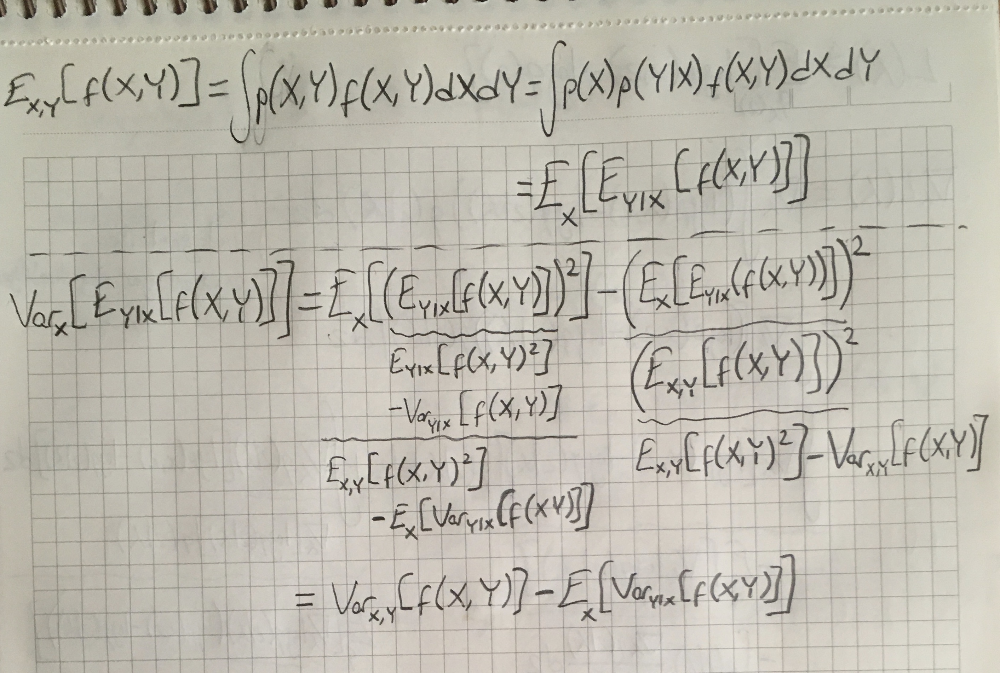

In [177]:
display("image/png", read("rao-blackwell.png"))
#f(X,Y) is an estimator

In [173]:
#with mean field assumption
function optimize2(data,logpdf_l,logpdf_m,logpdf_v,logpdf_q,q_m,q_v,a0,b0,c0,d0,num_iterations,num_samples)
    params1 = [a0,b0]
    params2 = [c0,d0]
    log_pdf_q(z1,z2,params1,params2) = logpdf_q(z1,z2,params1[1],params1[2],param2[1],param2[1])
    for iteration=1:num_iterations
        step_size2 = 0.0001/sqrt(iteration) #too small for Gaussian, ok for IG
        step_size1 = 0.001/sqrt(iteration) #ok for Gaussian, too large for IG
        #step_size = [0.0001,0.0001,0.00001, 0.00001] ./sqrt(iteration)
        component1 = zeros(2)
        component2 = zeros(2)
        for s=1:num_samples
            z1_sample = rand(q_m(params1[1],params1[2]))
            z2_sample = rand(q_v(params2[1],params2[2]))
            lpdf_q1(params1) = logpdf(q_m(params1[1],params1[2]),z1_sample)
            lpdf_q2(params2) = logpdf(q_v(params2[1],params2[2]),z2_sample)
            score1 = ForwardDiff.gradient(lpdf_q1,params1)
            score2 = ForwardDiff.gradient(lpdf_q2,params2)
            eval1 = logpdf_l(data,z1_sample,z2_sample) + logpdf_m(z1_sample) - lpdf_q1(params1)
            eval2 = logpdf_l(data,z1_sample,z2_sample) + logpdf_v(z2_sample) - lpdf_q2(params2)
            component1 += score1 .* eval1
            component2 += score2 .* eval2
        end
        grad_est1 = component1 ./ num_samples
        grad_est2 = component2 ./ num_samples
        new_params1 = params1 .+ step_size1 .* grad_est1
        new_params2 = params2 .+ step_size2 .* grad_est2
        #check if the update leads to valid setup
        if new_params1[2] < 0
            new_params1[2] = 1e-2
        end
        if new_params2[1] < 2
            new_params2[1] = 2 + 1e-2
        end
        if new_params2[2] < 0
            new_params2[2] = 1e-2
        end
        params1 = new_params1
        params2 = new_params2
        @show params1
        @show params2
    end
end

optimize2 (generic function with 2 methods)

In [174]:
optimize2(data,logpdf_l,logpdf_m,logpdf_v,logpdf_q,q_m,q_v,10.0,1.0,3.0,3.0,20000,50)

params1 = [10.156996745778295, 0.8197355144032503]
params2 = [2.9201006626436485, 3.063265633880401]
params1 = [10.755950547460616, 0.01]
params2 = [2.856802376666886, 3.1144849172620286]
params1 = [1.1169394716122731, 0.3437943096679376]
params2 = [2.7988268608593327, 3.1826138650207]
params1 = [2.1412948403839054, 4.3771906116216925]
params2 = [2.5248184887724654, 3.456690345977377]
params1 = [2.6860616188793167, 4.203205404362995]
params2 = [2.367216424268883, 3.5588527201963402]
params1 = [2.9121900524478144, 4.651177693946868]
params2 = [2.200487802159987, 3.6771150821173304]
params1 = [3.427353855323264, 4.581540835658103]
params2 = [2.01, 3.8105145069051214]
params1 = [3.6978478953286826, 4.629749731751241]
params2 = [2.01, 3.8370260718852545]
params1 = [3.885356201794598, 4.541719890378699]
params2 = [2.01, 3.836635998403386]
params1 = [4.119783079042153, 4.445454708079874]
params2 = [2.01, 3.876925157895866]
params1 = [4.252103116579964, 4.532797978805874]
params2 = [2.01, 3.9

params1 = [10.930220069323275, 2.1792130463004367]
params2 = [2.01, 4.772663386496385]
params1 = [10.96491211263109, 2.18343101781488]
params2 = [2.0026432912279177, 4.775650041475025]
params1 = [10.984008248510586, 2.1801285719297474]
params2 = [2.01, 4.777283684151545]
params1 = [11.012671342766124, 2.178743658821135]
params2 = [2.002224563419977, 4.781179776498793]
params1 = [11.042652913409363, 2.148589098848372]
params2 = [2.01, 4.784217589392627]
params1 = [11.064826090869346, 2.1559142162043794]
params2 = [2.003482816131532, 4.787555547621742]
params1 = [11.089003020586178, 2.15728201519199]
params2 = [2.0001978327158767, 4.78862390774132]
params1 = [11.112570479568058, 2.1599515369380007]
params2 = [2.01, 4.789740520076004]
params1 = [11.15244782586273, 2.133770895266152]
params2 = [2.006047067689567, 4.791036050272216]
params1 = [11.165532610588322, 2.1403563197937627]
params2 = [2.0011705772355914, 4.7930455199635515]
params1 = [11.1768507323904, 2.1478927157013414]
params2 =

params1 = [13.556662593668262, 1.298138122076223]
params2 = [2.0020396768539426, 4.954995666477717]
params1 = [13.560187920975798, 1.2959395547854398]
params2 = [2.0015150892437723, 4.9551059784774205]
params1 = [13.568807400664742, 1.292584189419113]
params2 = [2.0000040351880783, 4.955779711604162]
params1 = [13.583016918178407, 1.2834894906155871]
params2 = [2.01, 4.956105484420245]
params1 = [13.598329323562863, 1.2888063627820365]
params2 = [2.007548150431843, 4.9572984169396985]
params1 = [13.605973617212616, 1.2897273051728237]
params2 = [2.0052253803368485, 4.958255029360349]
params1 = [13.614202593931097, 1.2922215379686932]
params2 = [2.003727265996489, 4.958809155072617]
params1 = [13.628455484407711, 1.288144802045768]
params2 = [2.0021041217808437, 4.959457856300059]
params1 = [13.640067515952204, 1.284190681118106]
params2 = [2.01, 4.960922867314397]
params1 = [13.64295037430346, 1.2903154715983853]
params2 = [2.0088871707759783, 4.961268967537071]
params1 = [13.657759818

params1 = [14.90239748137603, 0.8856039977390359]
params2 = [2.0059480211814975, 5.015346143526378]
params1 = [14.907261652446739, 0.8896689670205068]
params2 = [2.0055728334993876, 5.0154551367429505]
params1 = [14.91841580513572, 0.8896276400286116]
params2 = [2.004230827768947, 5.016036690625292]
params1 = [14.923132763124332, 0.8927147526675105]
params2 = [2.0034195731145954, 5.016461024911412]
params1 = [14.933662649706132, 0.8879346444619213]
params2 = [2.0030372794264193, 5.016562204371029]
params1 = [14.938204395833925, 0.8932871747480184]
params2 = [2.002387132747363, 5.01688394537347]
params1 = [14.945017110419602, 0.8847692062610272]
params2 = [2.00171502596448, 5.017207248208442]
params1 = [14.950567235074633, 0.880247699840904]
params2 = [2.0006905799435017, 5.017716671981785]
params1 = [14.955128730909749, 0.8631181717130003]
params2 = [2.01, 5.018318287195059]
params1 = [14.958429642364655, 0.8664639526053327]
params2 = [2.0092154229951973, 5.018655860645797]
params1 = [

params1 = [15.668440294472047, 0.7066705589499268]
params2 = [2.0038671686400957, 5.042093457597574]
params1 = [15.672359066336249, 0.6937362238952878]
params2 = [2.003483350689185, 5.0422653903979695]
params1 = [15.680503879838026, 0.6925836477083199]
params2 = [2.002955737944325, 5.042632531504414]
params1 = [15.686485781507086, 0.6969371074787081]
params2 = [2.002883040332386, 5.042631088907808]
params1 = [15.690013987611152, 0.697385373550449]
params2 = [2.0027168040880805, 5.0426419392149935]
params1 = [15.690649009672649, 0.7041435027533368]
params2 = [2.0022782807349246, 5.0428463138880595]
params1 = [15.691689171219544, 0.6970716445919408]
params2 = [2.0020032412266424, 5.042925008449858]
params1 = [15.698872564329859, 0.695587136834738]
params2 = [2.0018726513390206, 5.042933622227675]
params1 = [15.702193759890502, 0.6952873583350145]
params2 = [2.0018616107442293, 5.043050441526042]
params1 = [15.70252436358589, 0.6972615765511445]
params2 = [2.001755602286533, 5.04307158992

params1 = [16.186503806799855, 0.5928830807304549]
params2 = [2.0028255264551835, 5.055987190049349]
params1 = [16.188848061264295, 0.5813405664584478]
params2 = [2.0026471910182795, 5.056007519357924]
params1 = [16.193108966193346, 0.5690040015084693]
params2 = [2.0026981507456263, 5.055971779909146]
params1 = [16.202659926579205, 0.5671245570493061]
params2 = [2.0024230282451807, 5.05611533201736]
params1 = [16.209564444266153, 0.564397010451066]
params2 = [2.0025553943813126, 5.05608809822418]
params1 = [16.210547251429144, 0.5610674055415443]
params2 = [2.0019688424423245, 5.0563454297561785]
params1 = [16.215878713934842, 0.561644326707187]
params2 = [2.001833838125835, 5.056427251614628]
params1 = [16.225389578034736, 0.5616411528598309]
params2 = [2.0013701991144663, 5.056694453956759]
params1 = [16.231089294306972, 0.565085370542112]
params2 = [2.0012117798193696, 5.0567420196808115]
params1 = [16.233910690602997, 0.566917864250093]
params2 = [2.000975722233839, 5.0569081203936

params2 = [2.005282838693783, 5.064336700546457]
params1 = [16.525741536381044, 0.528453400346657]
params2 = [2.0053141945352646, 5.064331585262811]
params1 = [16.525369414419693, 0.5289427630959844]
params2 = [2.005223205257997, 5.064417883912162]
params1 = [16.525936344098632, 0.5300267664891257]
params2 = [2.0051543991416936, 5.064447826877214]
params1 = [16.52477699883412, 0.531973929032554]
params2 = [2.0048884487709002, 5.064561280074599]
params1 = [16.528957222339926, 0.5306485073493364]
params2 = [2.0048541550738466, 5.064582040387001]
params1 = [16.533058427971618, 0.5339723138596464]
params2 = [2.004748041347349, 5.064608777362013]
params1 = [16.531225790814034, 0.5404251858226304]
params2 = [2.0045272114392048, 5.064705330505368]
params1 = [16.534572357127406, 0.5412221737306359]
params2 = [2.0043557383447435, 5.064783688588887]
params1 = [16.54128799012181, 0.5417747437910091]
params2 = [2.0042970612917728, 5.064840815360993]
params1 = [16.542754938348068, 0.546182572695453

params1 = [16.810937651565254, 0.4504557122006522]
params2 = [2.002582718116176, 5.071376994328287]
params1 = [16.808180235096394, 0.4480275963216206]
params2 = [2.002437065601795, 5.071437245388982]
params1 = [16.808899924053648, 0.4426757535156319]
params2 = [2.0022223769130933, 5.071551694343818]
params1 = [16.815377967384496, 0.43671098299310357]
params2 = [2.0023872118694332, 5.07151956875743]
params1 = [16.811304213478298, 0.4302670393697413]
params2 = [2.0023785778448144, 5.071529935324419]
params1 = [16.813292191509664, 0.43062100316709484]
params2 = [2.0023186768104946, 5.071567761654887]
params1 = [16.813709730855376, 0.4225098992687418]
params2 = [2.00241793855621, 5.071565074207607]
params1 = [16.819202976098353, 0.41802967706861893]
params2 = [2.002287956977437, 5.071652296693577]
params1 = [16.82597176154135, 0.41744697223726385]
params2 = [2.002108732037331, 5.0717166005245415]
params1 = [16.825681469543976, 0.4158211874207207]
params2 = [2.0021799144079853, 5.0717050585

params1 = [17.047897072090063, 0.4195254849126467]
params2 = [2.0023908629441824, 5.076416871655467]
params1 = [17.047646024012696, 0.4250041160932955]
params2 = [2.002524639207212, 5.076398340193769]
params1 = [17.044998744400186, 0.4222755991403714]
params2 = [2.0024014454198293, 5.076441632577808]
params1 = [17.04794677132152, 0.4201983144012254]
params2 = [2.0022755731412896, 5.076490849277028]
params1 = [17.048336849520034, 0.40750880258023625]
params2 = [2.002235455598454, 5.076498535979939]
params1 = [17.04579945451366, 0.41124484538564715]
params2 = [2.00229951805819, 5.076452204892481]
params1 = [17.044103070321924, 0.4077646267539546]
params2 = [2.002236635927675, 5.076475805560197]
params1 = [17.050193518454474, 0.40081270191067125]
params2 = [2.0021083452930672, 5.0765125503699915]
params1 = [17.050770533440133, 0.4003045020361816]
params2 = [2.0021165079652614, 5.076489946523248]
params1 = [17.051352285462006, 0.4028445317663664]
params2 = [2.0020914660240177, 5.0764950338

params1 = [17.202899919184226, 0.3967376008346504]
params2 = [2.0056191468006155, 5.079853198139734]
params1 = [17.205513523000736, 0.4031163867574336]
params2 = [2.0056401000518616, 5.07983344825701]
params1 = [17.20943976157707, 0.40263898180956614]
params2 = [2.0056876202733407, 5.079826935490723]
params1 = [17.20975732512297, 0.40364989840772353]
params2 = [2.005817515347995, 5.07978333977505]
params1 = [17.215352272063736, 0.40270975360164846]
params2 = [2.0057511080545036, 5.079795768347637]
params1 = [17.21440830281169, 0.40276189870253615]
params2 = [2.0057126071220566, 5.0798129088097586]
params1 = [17.221110512759598, 0.4001122357556172]
params2 = [2.005856378694111, 5.0797953947954575]
params1 = [17.221955629607134, 0.4024679846881321]
params2 = [2.0057729737086056, 5.0798220693182845]
params1 = [17.223458775560317, 0.40459061251895306]
params2 = [2.0057825510968574, 5.079824617511567]
params1 = [17.222994013614844, 0.40227746951533655]
params2 = [2.0055045614240217, 5.08000

params1 = [17.35518885381785, 0.3611656160195726]
params2 = [2.000983739349033, 5.083218402046912]
params1 = [17.35520957369627, 0.360411051360953]
params2 = [2.0008160650100266, 5.083304621174268]
params1 = [17.356669980524824, 0.3593971738853445]
params2 = [2.0007263480801822, 5.083347616983388]
params1 = [17.35371823344301, 0.36094469089502973]
params2 = [2.000845934688679, 5.083315649542991]
params1 = [17.352495300853036, 0.36025482472356624]
params2 = [2.000809822199724, 5.083348515297312]
params1 = [17.352362725424328, 0.3519690801298897]
params2 = [2.000873084295709, 5.083358361429425]
params1 = [17.35146140963025, 0.35331031220872816]
params2 = [2.000764719042275, 5.083397531618924]
params1 = [17.352797022468565, 0.3491220770289083]
params2 = [2.000700018019112, 5.083412696782238]
params1 = [17.350830433104246, 0.352767879101674]
params2 = [2.00062219207569, 5.083449965583469]
params1 = [17.350171338495283, 0.35827875151953315]
params2 = [2.0005903232598596, 5.083537716049433]


params1 = [17.469340882683912, 0.2870516642930325]
params2 = [2.0063612509025055, 5.086464901238782]
params1 = [17.470398380828172, 0.292242056046209]
params2 = [2.006290148587315, 5.086491291056412]
params1 = [17.47055304297125, 0.2907167178990901]
params2 = [2.0062473994050034, 5.086508712001776]
params1 = [17.475215351925804, 0.2867996084386566]
params2 = [2.0062346845725516, 5.086524972920754]
params1 = [17.477562188925447, 0.2857426256242555]
params2 = [2.006188414888237, 5.08654920046641]
params1 = [17.47830139924353, 0.2783664810616493]
params2 = [2.0060822756974894, 5.086588143676722]
params1 = [17.482474503023447, 0.27592264911871783]
params2 = [2.0060062035865673, 5.086609011955601]
params1 = [17.479134188971614, 0.28070220784421274]
params2 = [2.0058975647270265, 5.086641089635625]
params1 = [17.474727478472275, 0.28694002026281]
params2 = [2.005892016691939, 5.086637483541045]
params1 = [17.47590835900161, 0.28446495442776304]
params2 = [2.00580425294129, 5.086692440483916]

params1 = [17.513209339175365, 0.2926771956024149]
params2 = [2.003870064992728, 5.088392206919127]
params1 = [17.515639953492453, 0.2952282890288425]
params2 = [2.0037382239600112, 5.088437418237356]
params1 = [17.514536244453815, 0.2964051244739893]
params2 = [2.00368337110227, 5.088448743275418]
params1 = [17.514921327326803, 0.30521796556620023]
params2 = [2.0036287617586477, 5.08847534107659]
params1 = [17.5171625420808, 0.3048378941213704]
params2 = [2.003685909379687, 5.088455021026119]
params1 = [17.51601134972948, 0.3052484879964336]
params2 = [2.003739493026755, 5.088431990534476]
params1 = [17.518795757254207, 0.3054414072495628]
params2 = [2.0035460880614915, 5.088523686714029]
params1 = [17.522732490156578, 0.31363825688215896]
params2 = [2.0033790757813748, 5.088571801611874]
params1 = [17.520125286676095, 0.31671714982757776]
params2 = [2.003277685790833, 5.088629958577013]
params1 = [17.5189434739371, 0.31500901864802966]
params2 = [2.003289998632128, 5.08861171360047]


params1 = [17.58244142755345, 0.23783557448276696]
params2 = [2.0101358589053624, 5.090762994756432]
params1 = [17.578343351728822, 0.2441991700299826]
params2 = [2.010019010318438, 5.090794943095942]
params1 = [17.5826201140542, 0.24222822081312873]
params2 = [2.0098944427196144, 5.09085032168847]
params1 = [17.58116901251019, 0.2449986187854731]
params2 = [2.0098378488373374, 5.090881002895143]
params1 = [17.584643625098415, 0.23741546442658942]
params2 = [2.0097863897170343, 5.090909870379352]
params1 = [17.591064273897718, 0.24232985462487905]
params2 = [2.0097312987609808, 5.090943384014283]
params1 = [17.59244029445374, 0.2436539650134886]
params2 = [2.0095229881672965, 5.091018796451362]
params1 = [17.59604115322318, 0.24052439864818898]
params2 = [2.0093684497284148, 5.091085369514828]
params1 = [17.60382509193956, 0.23653376540419135]
params2 = [2.0093121836849224, 5.091131590769656]
params1 = [17.6102339865864, 0.23478381173703758]
params2 = [2.0092157860649302, 5.09116971159

params1 = [17.71794635725119, 0.29319319891648443]
params2 = [2.006976808290084, 5.0928342090371395]
params1 = [17.714468915309798, 0.29736161768044217]
params2 = [2.0069756713568263, 5.092820134023182]
params1 = [17.713551872493802, 0.29211184808430085]
params2 = [2.0068477381817367, 5.092851626946627]
params1 = [17.716029641983514, 0.2905463265156544]
params2 = [2.0069319965490293, 5.092824645982898]
params1 = [17.715677235089778, 0.2821968997307524]
params2 = [2.006909065408366, 5.0928510348905265]
params1 = [17.71472104765809, 0.28774887661550336]
params2 = [2.006841882049384, 5.092910690777435]
params1 = [17.714629368134435, 0.2905495335280763]
params2 = [2.0067971826761717, 5.092935065933689]
params1 = [17.71733324061963, 0.29186341448526865]
params2 = [2.0068614434369403, 5.09292572220544]
params1 = [17.71727157948568, 0.29076949189063106]
params2 = [2.0068883175070678, 5.092929165359167]
params1 = [17.717627706002418, 0.29341086767743385]
params2 = [2.0067916593205273, 5.092949

params1 = [17.755141580983675, 0.35279576045954014]
params2 = [2.0038002699905824, 5.095203832131573]
params1 = [17.75970318290555, 0.3486136817299334]
params2 = [2.0038787362920836, 5.095216934507935]
params1 = [17.75614537011874, 0.3467649101000574]
params2 = [2.0037204188886824, 5.095312586347514]
params1 = [17.758344462980485, 0.34170172899934526]
params2 = [2.0037116198894607, 5.095326546482636]
params1 = [17.758522771763005, 0.34164793206154026]
params2 = [2.0036980791985033, 5.095323117392896]
params1 = [17.758898742060218, 0.3414680214800335]
params2 = [2.0036686966411246, 5.095334230767895]
params1 = [17.75790314935333, 0.34371860034714746]
params2 = [2.0036037131992024, 5.09535449915006]
params1 = [17.759480841229877, 0.3449134669201708]
params2 = [2.0036263670227914, 5.095342078088627]
params1 = [17.76125486856944, 0.34562190014747757]
params2 = [2.003600187613919, 5.095364741510851]
params1 = [17.762913722917375, 0.3469640886989363]
params2 = [2.0036228647539898, 5.09539086

params1 = [17.76112365884059, 0.32383405096839757]
params2 = [2.000536023491249, 5.0975157637254]
params1 = [17.762872380729235, 0.3233169082491397]
params2 = [2.0004817660216205, 5.097558787347467]
params1 = [17.76232869576008, 0.3298629147629014]
params2 = [2.0004925701210867, 5.09756745519048]
params1 = [17.765498588958696, 0.3289857498678738]
params2 = [2.000522761102694, 5.097572867937485]
params1 = [17.765701101429475, 0.3277468404127298]
params2 = [2.000549927499224, 5.097562398660872]
params1 = [17.766128184619017, 0.3304702770874611]
params2 = [2.000380275815328, 5.097623362527908]
params1 = [17.766696711164304, 0.33264814284021726]
params2 = [2.000428574056442, 5.0976319508187276]
params1 = [17.766801866020643, 0.33780346407683143]
params2 = [2.0005214880396665, 5.09762626367142]
params1 = [17.76697178510701, 0.33672233656996453]
params2 = [2.0004436815494833, 5.097656333887251]
params1 = [17.763884248939974, 0.3309821843806041]
params2 = [2.00047779360446, 5.097639290038816]

params1 = [17.80798062020261, 0.32228641717023304]
params2 = [2.0081747368939755, 5.099475305648878]
params1 = [17.807031570765215, 0.3185838709342046]
params2 = [2.0080995175220453, 5.099490409459094]
params1 = [17.80546806178816, 0.31597587660049115]
params2 = [2.0080478923870557, 5.099517786215768]
params1 = [17.803568320133305, 0.30908771912827926]
params2 = [2.007979233266416, 5.09954622123532]
params1 = [17.807666810062425, 0.30491576494245737]
params2 = [2.0079666404878713, 5.099560509557506]
params1 = [17.804318486114333, 0.29885319446711306]
params2 = [2.0078899494595523, 5.099579169104085]
params1 = [17.80627320441589, 0.29875152492426366]
params2 = [2.0078803743196256, 5.099572832970464]
params1 = [17.803869723940767, 0.29544648316547356]
params2 = [2.007816281999227, 5.0995990837017215]
params1 = [17.80070516427175, 0.2950111006928596]
params2 = [2.0078114051041913, 5.099610408958387]
params1 = [17.803584248413163, 0.2912446237961153]
params2 = [2.0078963586563945, 5.099582

params2 = [2.0062512189195183, 5.100980142610834]
params1 = [17.852187042756462, 0.29696682831119975]
params2 = [2.006063215734501, 5.101063139402198]
params1 = [17.852034646817845, 0.2946365376077831]
params2 = [2.00612484450546, 5.1010601345117825]
params1 = [17.854959915992712, 0.2905977878447488]
params2 = [2.0061040444423384, 5.101067856827823]
params1 = [17.85265732760156, 0.29136532453944375]
params2 = [2.0060338280512164, 5.1010975425265945]
params1 = [17.851394794808787, 0.28927526328335307]
params2 = [2.0060321912595085, 5.101096759808869]
params1 = [17.851166681812874, 0.29002480354563454]
params2 = [2.0060311635406025, 5.101083802361912]
params1 = [17.851439313988504, 0.297785374919244]
params2 = [2.0060111251537256, 5.101092071029953]
params1 = [17.853294812136607, 0.29689918765331486]
params2 = [2.0059229405092385, 5.101130992643111]
params1 = [17.848559416277816, 0.2942425148471583]
params2 = [2.0059571176690754, 5.101144833077562]
params1 = [17.84965353861644, 0.2957958

params1 = [17.86434204046937, 0.2748003141320465]
params2 = [2.0037030020482383, 5.102654770100444]
params1 = [17.86436482812633, 0.2752296957744252]
params2 = [2.0037077513300328, 5.102678475786608]
params1 = [17.86195850154868, 0.2769905877552643]
params2 = [2.0037338913337757, 5.102674266925688]
params1 = [17.86412875989056, 0.27401272086308265]
params2 = [2.0037281709813546, 5.102680054796814]
params1 = [17.864012972478992, 0.27811571348925584]
params2 = [2.0038231310383736, 5.102661378816704]
params1 = [17.864813588788444, 0.2822353638002187]
params2 = [2.00382970532266, 5.102663570649303]
params1 = [17.866542008048945, 0.2812453180750291]
params2 = [2.0038400325796166, 5.102666126033454]
params1 = [17.869206742942346, 0.2711451080290224]
params2 = [2.0038705395427634, 5.1026508619587805]
params1 = [17.869385778520268, 0.27206482358946205]
params2 = [2.0039240357901527, 5.10263432417795]
params1 = [17.869308303217885, 0.2685572333081271]
params2 = [2.0039735808636796, 5.1026276521

params1 = [17.88756479814433, 0.3007053258218638]
params2 = [2.0020251293925764, 5.103720596733193]
params1 = [17.88900131060496, 0.3063412317739837]
params2 = [2.0020384709152914, 5.103712505008256]
params1 = [17.887870896652725, 0.30770857094073256]
params2 = [2.0019742900703186, 5.103747431982032]
params1 = [17.8904090800915, 0.30611512002052155]
params2 = [2.0020069111313044, 5.103734507205728]
params1 = [17.89017124853415, 0.30881845127873153]
params2 = [2.001907021203402, 5.103784793207025]
params1 = [17.889064261725842, 0.3091896841997898]
params2 = [2.001825902159637, 5.103811552141394]
params1 = [17.891211770724755, 0.3126106673236221]
params2 = [2.0017658066050896, 5.103851577451475]
params1 = [17.889521289849036, 0.31289781064476996]
params2 = [2.001632788805438, 5.103914035226018]
params1 = [17.889632279088673, 0.3156940512472079]
params2 = [2.001710288302407, 5.103903961037285]
params1 = [17.887611215984197, 0.31913067673796464]
params2 = [2.001679872187838, 5.103916722511

params1 = [17.89050779252613, 0.2889622841131895]
params2 = [2.0010446755985045, 5.104773968131608]
params1 = [17.890219638811587, 0.2942934439137093]
params2 = [2.001007613907428, 5.104802509967624]
params1 = [17.88941430166499, 0.2921781936190731]
params2 = [2.0009575290604165, 5.104830284728449]
params1 = [17.89246483522256, 0.29046272028705866]
params2 = [2.0009160832051838, 5.104839551208464]
params1 = [17.89473452961721, 0.29215392300977083]
params2 = [2.0008684597498876, 5.104843522742159]
params1 = [17.893521751747212, 0.2874509348908082]
params2 = [2.000968711687093, 5.104813193175752]
params1 = [17.893460331441315, 0.28782845537881796]
params2 = [2.000869542348462, 5.104852346394663]
params1 = [17.890503891880165, 0.27818642874306104]
params2 = [2.000857990395556, 5.104870393968939]
params1 = [17.891016741070228, 0.28326254287194486]
params2 = [2.000792492652284, 5.1048911394197845]
params1 = [17.89280542750898, 0.28718759085737655]
params2 = [2.0008038566488215, 5.1048766487

params1 = [17.91741520927207, 0.27690583667271546]
params2 = [2.008504087827604, 5.106408220001334]
params1 = [17.920436248535864, 0.27154986437893297]
params2 = [2.008421085728988, 5.106428956797653]
params1 = [17.922761119242463, 0.2665950398836389]
params2 = [2.0084490759134392, 5.106422153544628]
params1 = [17.923797102424523, 0.27117963459590155]
params2 = [2.0083600490248794, 5.106454167723212]
params1 = [17.924224689251968, 0.27448005311796925]
params2 = [2.0083713759473056, 5.106443634100066]
params1 = [17.925235595402526, 0.2797461536722238]
params2 = [2.00844186005246, 5.106426363359681]
params1 = [17.923142157604403, 0.28021001893539743]
params2 = [2.008492535605968, 5.10640948125467]
params1 = [17.92152292241138, 0.28389703328494165]
params2 = [2.0084623402323953, 5.106433707112551]
params1 = [17.921802650156522, 0.2793372254150744]
params2 = [2.008446184942101, 5.1064276703101115]
params1 = [17.925031248991544, 0.2764835499791662]
params2 = [2.0084475266879016, 5.106442812

params1 = [17.931515802334392, 0.23769978675569642]
params2 = [2.0064779442998226, 5.107881148540354]
params1 = [17.93337110122062, 0.235002525953767]
params2 = [2.006492949163821, 5.107872597992999]
params1 = [17.936853287109017, 0.23470018863253908]
params2 = [2.006415321149852, 5.107895093037515]
params1 = [17.93415817869695, 0.23818143475144207]
params2 = [2.006276435204672, 5.107949218603721]
params1 = [17.938760949956762, 0.24010371737260264]
params2 = [2.006271053402963, 5.107952685635163]
params1 = [17.939730853850744, 0.24011734157237782]
params2 = [2.006148548826974, 5.10801377054358]
params1 = [17.941352738544747, 0.2406119492400739]
params2 = [2.0061315831639592, 5.108022638992854]
params1 = [17.940401617405694, 0.24128793850079422]
params2 = [2.0061877898213916, 5.108010149341844]
params1 = [17.94259721394659, 0.24487883999395574]
params2 = [2.006229210639265, 5.107985127750064]
params1 = [17.94391231380481, 0.24534734728496221]
params2 = [2.006125404867837, 5.108046505602

params1 = [17.973798937706928, 0.2637468849084321]
params2 = [2.0048163035109017, 5.109586251501765]
params1 = [17.97197572081627, 0.262802009524936]
params2 = [2.004846993580608, 5.109580039277378]
params1 = [17.969860474572656, 0.2596379453690241]
params2 = [2.0048616384916023, 5.10958506338663]
params1 = [17.973162820947714, 0.25471804253299857]
params2 = [2.0048758566281957, 5.109578871425095]
params1 = [17.973836399901938, 0.24864165760297244]
params2 = [2.0048515249334167, 5.109585304143503]
params1 = [17.971679454269502, 0.24565797283810573]
params2 = [2.004839386462305, 5.109605272595107]
params1 = [17.97048082936211, 0.24479032017321642]
params2 = [2.004798066330397, 5.109626861184013]
params1 = [17.97337088770569, 0.24843926987090856]
params2 = [2.0047800892113314, 5.109634182437584]
params1 = [17.978825933389164, 0.24866991357210216]
params2 = [2.004652072686906, 5.109696246236303]
params1 = [17.979919346491265, 0.25336073555411814]
params2 = [2.0045699828367223, 5.109717748

params1 = [17.98358365221745, 0.253435588283309]
params2 = [2.002403247138073, 5.111150288940381]
params1 = [17.984891386265684, 0.24907284711344077]
params2 = [2.002295375975361, 5.111196323306819]
params1 = [17.98570629113679, 0.2500231758403647]
params2 = [2.0022169631182765, 5.111228824732593]
params1 = [17.984232550682012, 0.25038512049828177]
params2 = [2.002106553606294, 5.111269299655058]
params1 = [17.982227387993333, 0.2476550819142762]
params2 = [2.0021436597878783, 5.111266007017905]
params1 = [17.98509084964284, 0.25166159547622585]
params2 = [2.002149235370463, 5.11126101502211]
params1 = [17.98632677150398, 0.2509674743808002]
params2 = [2.0020209088713865, 5.11130135385591]
params1 = [17.983515634013273, 0.24612111173884152]
params2 = [2.0021197005833566, 5.111277723650944]
params1 = [17.982356803778092, 0.24736910186157623]
params2 = [2.0021592879981664, 5.111274082996472]
params1 = [17.984147474946752, 0.25262634561540476]
params2 = [2.002160106437887, 5.1112780318376

params1 = [17.986303369429763, 0.29191147121674327]
params2 = [2.0002737483552786, 5.112659544774689]
params1 = [17.983416225722223, 0.2885316500759759]
params2 = [2.0002197411176272, 5.112684446149917]
params1 = [17.985191998728066, 0.2876817782680959]
params2 = [2.000216591850313, 5.112703775681362]
params1 = [17.981796477967325, 0.28846701026158583]
params2 = [2.000114883417772, 5.112757959521264]
params1 = [17.98516042567353, 0.2873751997979254]
params2 = [2.0001602165785943, 5.1127480761812905]
params1 = [17.98591438028815, 0.2847531975922598]
params2 = [2.000168004782042, 5.112740648001079]
params1 = [17.988342558641907, 0.2859477136375559]
params2 = [2.000159115802797, 5.1127509066551715]
params1 = [17.987438784640013, 0.28691343098417604]
params2 = [2.000146472792517, 5.112759184825223]
params1 = [17.988170009979715, 0.2877994089970571]
params2 = [2.000069920686397, 5.112775782730332]
params1 = [17.988745643450116, 0.288111151212873]
params2 = [2.0000656975332465, 5.11277416830

params1 = [17.994360639989534, 0.21602770672800886]
params2 = [2.008407186718725, 5.114019676884182]
params1 = [17.99471852607961, 0.22132135802162642]
params2 = [2.0084245394580793, 5.1140165092623615]
params1 = [17.997527376116707, 0.21955758430231334]
params2 = [2.008447568768321, 5.113997311835065]
params1 = [17.996391704337675, 0.22093304464423483]
params2 = [2.008408329177986, 5.114026752579612]
params1 = [17.99532915190568, 0.2253926240668482]
params2 = [2.0083283901063393, 5.114055924580799]
params1 = [17.994943646358184, 0.22641265222947213]
params2 = [2.0082334543444293, 5.1140956551294545]
params1 = [17.992657530314485, 0.22848943715645]
params2 = [2.008272946349969, 5.114084834510797]
params1 = [17.989245223740763, 0.2248217737266635]
params2 = [2.008144226420897, 5.1141266721466385]
params1 = [17.986107560035517, 0.22422483937133472]
params2 = [2.00807698311856, 5.114164885957445]
params1 = [17.986466336640305, 0.21976007286719382]
params2 = [2.0080864457550875, 5.11414775

params1 = [17.930949826647762, 0.18465756846240663]
params2 = [2.0075326057664866, 5.115011754568411]
params1 = [17.92820763298394, 0.18161899989823424]
params2 = [2.0075650870883543, 5.115004037034917]
params1 = [17.93145619085787, 0.17901911116035796]
params2 = [2.0075651219384563, 5.115004014632853]
params1 = [17.937116760352318, 0.18261759720973916]
params2 = [2.0075582047507052, 5.115012142794663]
params1 = [17.932481645979284, 0.1775819990439732]
params2 = [2.007577042197695, 5.115002475825132]
params1 = [17.931910440973578, 0.1755493773754274]
params2 = [2.0075631584080975, 5.115011657862316]
params1 = [17.932723231740276, 0.1736265289668025]
params2 = [2.007553320524129, 5.115019677009418]
params1 = [17.930799923136195, 0.17360602102235756]
params2 = [2.0075359351895137, 5.115030129576473]
params1 = [17.92877974586142, 0.17791740550876836]
params2 = [2.0075700918475934, 5.115022714684664]
params1 = [17.934973443206133, 0.17758978172741935]
params2 = [2.007558818666091, 5.115020

params2 = [2.005571155217693, 5.116294116491965]
params1 = [17.925044179956636, 0.18546432968129611]
params2 = [2.0056991906991204, 5.11627993033631]
params1 = [17.925490767441612, 0.18559162004458477]
params2 = [2.005663534012024, 5.11631401255043]
params1 = [17.92883889731011, 0.1921389731851849]
params2 = [2.005609293266897, 5.116326848448936]
params1 = [17.932466776729918, 0.19000386187808857]
params2 = [2.005590331315594, 5.116334474191685]
params1 = [17.931486255034738, 0.18986671510875508]
params2 = [2.0054941823209025, 5.116385897451288]
params1 = [17.929741523747662, 0.19344203049215308]
params2 = [2.0054991810278864, 5.116390328770852]
params1 = [17.931839815918053, 0.19535992934226962]
params2 = [2.005483241688593, 5.11638678080182]
params1 = [17.931943126007308, 0.19448228673950116]
params2 = [2.0054642120190316, 5.116401572648341]
params1 = [17.930367820122537, 0.1923553155011478]
params2 = [2.0055147121131682, 5.116414384964523]
params1 = [17.929317067802167, 0.1994843672

params1 = [17.920104137907387, 0.22450328175773418]
params2 = [2.004310644642528, 5.11748378775383]
params1 = [17.91682735757807, 0.2238475600862612]
params2 = [2.0042559128647186, 5.117509469579021]
params1 = [17.909058157673982, 0.2218875172293446]
params2 = [2.0042717192914004, 5.117510854732242]
params1 = [17.909790851136425, 0.22007101344532295]
params2 = [2.004286966805626, 5.117512734551581]
params1 = [17.91112303142832, 0.22195664945041618]
params2 = [2.004286294606259, 5.117510600339861]
params1 = [17.914496025727967, 0.22318029421201546]
params2 = [2.004260820583213, 5.117518827743078]
params1 = [17.915659510104025, 0.22370009668232022]
params2 = [2.00421028930494, 5.1175430006555]
params1 = [17.915860879328164, 0.22264662528904375]
params2 = [2.0041953963369417, 5.117541067275703]
params1 = [17.915720578427834, 0.224446611867788]
params2 = [2.004177887841136, 5.117561960813441]
params1 = [17.917011632286926, 0.2245486519089033]
params2 = [2.0041754174480495, 5.11756827492283

params1 = [17.94312283068386, 0.2669434932269637]
params2 = [2.0025900738968696, 5.118585834163666]
params1 = [17.943531021474247, 0.2688408446417871]
params2 = [2.002641647394182, 5.118574715435737]
params1 = [17.94470762385788, 0.2706440764817781]
params2 = [2.0025963572726244, 5.118605812026298]
params1 = [17.943367703613536, 0.2723481226576614]
params2 = [2.002587858865163, 5.118604756101129]
params1 = [17.94537572310686, 0.2711014524623898]
params2 = [2.0025871541929656, 5.118613934851832]
params1 = [17.94475092334934, 0.2684661328645796]
params2 = [2.002619445409359, 5.11859843533574]
params1 = [17.94409237202098, 0.26687020307656223]
params2 = [2.00267848512282, 5.118583636711592]
params1 = [17.944730069196265, 0.26559214930154473]
params2 = [2.0026185948679043, 5.11860906685399]
params1 = [17.946067009746294, 0.26548859545233255]
params2 = [2.0026034161148134, 5.118615713107652]
params1 = [17.9451204444975, 0.2680933373971506]
params2 = [2.002598844270396, 5.118614789756811]
pa

params1 = [17.90873950530955, 0.3017870205866898]
params2 = [2.0009051071168167, 5.119824171948424]
params1 = [17.909111256278504, 0.29820606677331585]
params2 = [2.0009031855058566, 5.119838651692549]
params1 = [17.908529550876096, 0.2979506145323246]
params2 = [2.0009292406310344, 5.119831328184232]
params1 = [17.9082420026522, 0.29377880887744034]
params2 = [2.00099135605032, 5.119804634030999]
params1 = [17.90860832307892, 0.2949548499537694]
params2 = [2.000930543840148, 5.11983231595224]
params1 = [17.90905786163735, 0.298584801887816]
params2 = [2.0008499062202443, 5.119849922142242]
params1 = [17.90666753562431, 0.29690179914254133]
params2 = [2.0008728756402947, 5.119840882838283]
params1 = [17.907069121751142, 0.3001845347559748]
params2 = [2.000882196330955, 5.119851665777451]
params1 = [17.904685377752724, 0.2932354799766944]
params2 = [2.000909645328508, 5.119859417350586]
params1 = [17.901823358461687, 0.29595601054610554]
params2 = [2.000957660521927, 5.119863351448863]


params1 = [17.892101989115602, 0.2851538892625423]
params2 = [2.009483311885273, 5.120788584269761]
params1 = [17.893684683861093, 0.28709745064559833]
params2 = [2.009557863818514, 5.120769745242286]
params1 = [17.891602530004715, 0.2865095113224912]
params2 = [2.0095153765071685, 5.120791238725648]
params1 = [17.892927427558973, 0.2800184992218377]
params2 = [2.009463456607296, 5.120838600239744]
params1 = [17.89229481985941, 0.27915298103506553]
params2 = [2.0095097744993153, 5.120836073856026]
params1 = [17.89316928990752, 0.2798136852014222]
params2 = [2.0094860404615202, 5.1208496696169075]
params1 = [17.894876451811367, 0.27877584012260415]
params2 = [2.009492723341911, 5.120843439017628]
params1 = [17.89461230131146, 0.28010726311426754]
params2 = [2.0094599778909803, 5.1208491594583565]
params1 = [17.892864838276374, 0.2803785299306286]
params2 = [2.0095487031469705, 5.120834150435357]
params1 = [17.8940240889676, 0.27920396194045044]
params2 = [2.009528302014887, 5.1208382114

params1 = [17.92243987561668, 0.22610923065457694]
params2 = [2.0079729370240447, 5.121906390333085]
params1 = [17.920824976664935, 0.22706228512781818]
params2 = [2.007970731698679, 5.121914623988211]
params1 = [17.918714502331962, 0.22684265054731745]
params2 = [2.008002319001092, 5.121921612772894]
params1 = [17.920993382456995, 0.2293192303017806]
params2 = [2.0080129796947883, 5.121928834495074]
params1 = [17.921800419080608, 0.22449741631082412]
params2 = [2.0080312990058067, 5.121926547985403]
params1 = [17.92113360533972, 0.2201421805414973]
params2 = [2.0079457978998363, 5.121962719665675]
params1 = [17.917806496668387, 0.21689517728757896]
params2 = [2.0079434257924813, 5.121959763794783]
params1 = [17.920965639832158, 0.21735179403493213]
params2 = [2.0079913955469544, 5.1219647528928185]
params1 = [17.922404502235626, 0.21875824885798412]
params2 = [2.0078751074626977, 5.122008046721488]
params1 = [17.921151127679977, 0.21891671465354012]
params2 = [2.007806042472384, 5.122

params1 = [17.966894105502117, 0.16462004709214337]
params2 = [2.0067158953445534, 5.122874925522931]
params1 = [17.967197549100018, 0.15883365306695107]
params2 = [2.006763526140369, 5.122862213287893]
params1 = [17.968815720908026, 0.15974901244021267]
params2 = [2.006708708354832, 5.122884565430497]
params1 = [17.97257252448154, 0.1646293380800571]
params2 = [2.0067152479336796, 5.122888567608295]
params1 = [17.973821707974757, 0.16632259541234243]
params2 = [2.006734199682954, 5.122879512478545]
params1 = [17.976113662519058, 0.16913874529483394]
params2 = [2.006724531576982, 5.1228876477738226]
params1 = [17.979930097097622, 0.16711322037079554]
params2 = [2.0067333970004344, 5.122889164648161]
params1 = [17.979300215167857, 0.1594349517494638]
params2 = [2.0067297466007528, 5.1228898411057395]
params1 = [17.978857336596548, 0.1569610177557506]
params2 = [2.0066601310039864, 5.122926134024344]
params1 = [17.98105368540245, 0.15246622743062746]
params2 = [2.0066156066659335, 5.1229

params1 = [17.962143004638186, 0.1587449736238692]
params2 = [2.0044347128328495, 5.124300612084317]
params1 = [17.958646946987567, 0.16104504125895389]
params2 = [2.004406056489834, 5.124311204438332]
params1 = [17.959166519867424, 0.1605703817642134]
params2 = [2.0043653798205816, 5.124333860042226]
params1 = [17.96314037338167, 0.16074600892827567]
params2 = [2.0043184414146578, 5.124338027576409]
params1 = [17.96430225255363, 0.16729754447204728]
params2 = [2.004278122095236, 5.124348968169871]
params1 = [17.960082353208396, 0.1651907311076377]
params2 = [2.004261700415728, 5.124372584519894]
params1 = [17.959782606317113, 0.16768633311500858]
params2 = [2.0042825070134462, 5.124366673897885]
params1 = [17.958838946301217, 0.17080481351648627]
params2 = [2.0042793422163987, 5.124384092621405]
params1 = [17.95469741543428, 0.17236104901390956]
params2 = [2.004429396210714, 5.124357062865638]
params1 = [17.955545705606117, 0.17074133746193948]
params2 = [2.0044112779028413, 5.1243619

params1 = [17.94079480497008, 0.20898493751885952]
params2 = [2.0031169250525434, 5.125506101878287]
params1 = [17.940282207757445, 0.20722929726356723]
params2 = [2.0031043674468916, 5.12551926028128]
params1 = [17.938486491666403, 0.20741962644923037]
params2 = [2.0031016806449324, 5.125524933057888]
params1 = [17.94231588153906, 0.20933547084396578]
params2 = [2.003100787536988, 5.125530199401331]
params1 = [17.941401096211383, 0.2129122396784006]
params2 = [2.003115634727263, 5.125537805214752]
params1 = [17.9405528432826, 0.21240332055313432]
params2 = [2.003090666321993, 5.125549559547217]
params1 = [17.94198661870498, 0.21735642457982332]
params2 = [2.0030407893930517, 5.1255814783834905]
params1 = [17.944625535416623, 0.2149715474421255]
params2 = [2.0030148006244124, 5.125587793271764]
params1 = [17.945881065923796, 0.2141284530411916]
params2 = [2.0030257838170114, 5.12558602555773]
params1 = [17.945430242100883, 0.21001428276146178]
params2 = [2.002929709365227, 5.1256187684

Excessive output truncated after 524314 bytes.

params1 = [17.958704558642495, 0.1979688371530807]
params2 = [2.002605041431187, 5.125805273802352]
params1 = [17.9541456264664, 0.2007902420236262]
params2 = [2.0025918164043612, 5.125808379459773]
params1 = [17.956336328684465, 0.1990726186712324]
params2 = [2.00267285585968, 5.125777617133754]
params1 = [17.95185148095757, 0.1983526785128259]
params2 = [2.002674502165331, 5.125788676159445]
params1 = [17.952172610712633, 0.19747757509404368]
params2 = [2.0026220941624273, 5.1258134386030605]
params1 = [17.949642118784254, 0.20305193341818903]
params2 = [2.0026943192265625, 5.1258032603614865]
params1 = [17.949927778196173, 0.20004151574992193]
params2 = [2.0027708144975183, 5.125781609858696]
params1 = [17.95156414855152, 0.20426976730928223]
params2 = [2.002767333130168, 5.12578617222363]
params1 = [17.95303256224887, 0.20171768771390014]
params2 = [2.0027760203679237, 5.125772808715178]
params1 = [17.95253227345783, 0.19996921169913714]
params2 = [2.0028113777323173, 5.12575578005

Thanks to Rao-Blackwellization, we use larger step sizes and this leads to faster convergence.

### Control Variates

This section in the paper is particularly elegant.

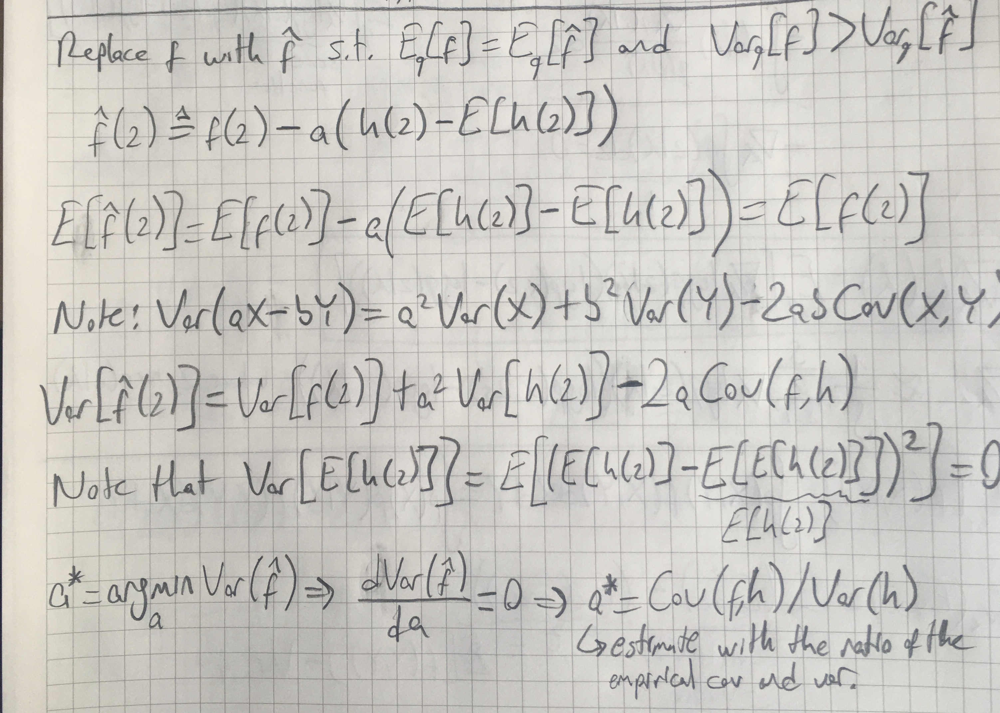

In [178]:
display("image/png", read("controlvar.png"))

In [191]:
#with mean field assumption
function optimize3(data,logpdf_l,logpdf_m,logpdf_v,logpdf_q,q_m,q_v,a0,b0,c0,d0,num_iterations,num_samples)
    params1 = [a0,b0]
    params2 = [c0,d0]
    log_pdf_q(z1,z2,params1,params2) = logpdf_q(z1,z2,params1[1],params1[2],param2[1],param2[1])
    for iteration=1:num_iterations
        step_size2 = 0.0001/sqrt(iteration) #too small for Gaussian, ok for IG
        step_size1 = 0.001/sqrt(iteration) #ok for Gaussian, too large for IG
        #step_size = [0.0001,0.0001,0.00001, 0.00001] ./sqrt(iteration)
        f11, f12, f21, f22, h11, h12, h21, h22 = [], [], [], [], [], [], [], []
        for s=1:num_samples
            z1_sample = rand(q_m(params1[1],params1[2]))
            z2_sample = rand(q_v(params2[1],params2[2]))
            lpdf_q1(params1) = logpdf(q_m(params1[1],params1[2]),z1_sample)
            lpdf_q2(params2) = logpdf(q_v(params2[1],params2[2]),z2_sample)
            score1 = ForwardDiff.gradient(lpdf_q1,params1)
            score2 = ForwardDiff.gradient(lpdf_q2,params2)
            eval1 = logpdf_l(data,z1_sample,z2_sample) + logpdf_m(z1_sample) - lpdf_q1(params1)
            eval2 = logpdf_l(data,z1_sample,z2_sample) + logpdf_v(z2_sample) - lpdf_q2(params2)
            component1 = score1 .* eval1
            component2 = score2 .* eval2
            push!(f11,component1[1])
            push!(f12,component1[2])
            push!(f21,component2[1])
            push!(f22,component2[2])
            push!(h11,score1[1])
            push!(h12,score1[2])
            push!(h21,score2[1])
            push!(h22,score2[2])
        end
        a1 = (cov(f11,h11)+cov(f12,h12))/(var(h11)+var(h12))
        a2 = (cov(f21,h21)+cov(f22,h22))/(var(h21)+var(h22))
        grad_est11 = (sum(f11)-a1*sum(h11)) ./ num_samples
        grad_est12 = (sum(f12)-a1*sum(h12)) ./ num_samples
        grad_est21 = (sum(f21)-a2*sum(h21)) ./ num_samples
        grad_est22 = (sum(f22)-a2*sum(h22)) ./ num_samples
        grad_est1 = [grad_est11,grad_est12]
        grad_est2 = [grad_est21,grad_est22]
        new_params1 = params1 .+ step_size1 .* grad_est1
        new_params2 = params2 .+ step_size2 .* grad_est2
        #check if the update leads to valid setup
        if new_params1[2] < 0
            new_params1[2] = 1e-2
        end
        if new_params2[1] < 2
            new_params2[1] = 2 + 1e-2
        end
        if new_params2[2] < 0
            new_params2[2] = 1e-2
        end
        params1 = new_params1
        params2 = new_params2
        @show params1
        @show params2
    end
end

optimize3 (generic function with 1 method)

In [193]:
optimize3(data,logpdf_l,logpdf_m,logpdf_v,logpdf_q,q_m,q_v,10.0,1.0,3.0,3.0,20000,50)

params1 = [10.77237641608975, 0.2130305699648588]
params2 = [2.897115638953604, 3.1023323504150047]
params1 = [11.474204896061368, 1.0768914203760698]
params2 = [2.8312913764747862, 3.1819446662695343]
params1 = [11.895630644400631, 1.3202719748255949]
params2 = [2.7936512633663533, 3.2267539590318948]
params1 = [12.118057565216589, 1.1632199884005845]
params2 = [2.738226346094574, 3.277027499555379]
params1 = [12.128178508739309, 0.6029292693729793]
params2 = [2.6882445327506828, 3.3159452365740716]
params1 = [12.384003825303436, 0.5288932550722956]
params2 = [2.6627915727502938, 3.3368839199105365]
params1 = [12.512830432802359, 0.3298567054231403]
params2 = [2.645467687110114, 3.3499298365714663]
params1 = [12.708000031908036, 0.01]
params2 = [2.6354686753437218, 3.3588957324577344]
params1 = [6.610295033450157, 3.2354220212509417]
params2 = [2.6143669850796503, 3.375959191859893]
params1 = [6.847236656808511, 3.3306422991127804]
params2 = [2.5784408889545074, 3.4034155586737933]
pa

params1 = [12.86906088742001, 1.525509977573923]
params2 = [2.00641594968364, 4.100836744196584]
params1 = [12.897176921555756, 1.5212138203959586]
params2 = [2.0027723856972512, 4.102638977753864]
params1 = [12.91768252176765, 1.502602275266146]
params2 = [2.01, 4.104714776633565]
params1 = [12.958753300682888, 1.4730860840500843]
params2 = [2.0029789345442337, 4.108509400166451]
params1 = [12.981380831317267, 1.444194065784483]
params2 = [2.01, 4.110312000835726]
params1 = [13.008236286271604, 1.4517876657392845]
params2 = [2.005556074371046, 4.112220773683668]
params1 = [13.022044269244219, 1.456479977602148]
params2 = [2.0041630526203433, 4.112635549261131]
params1 = [13.039810639045523, 1.4615278652742478]
params2 = [2.000068681690131, 4.114657744874827]
params1 = [13.057876717659182, 1.456234841058488]
params2 = [2.01, 4.116152904326485]
params1 = [13.06940141215114, 1.4516983001647863]
params2 = [2.0085925280172128, 4.116621012520936]
params1 = [13.102654653751195, 1.43187926414

params1 = [14.59568539089873, 1.0218893167195242]
params2 = [2.00599620658655, 4.209185866885493]
params1 = [14.610326385192131, 1.0193459579300095]
params2 = [2.0045556041340546, 4.209862946334272]
params1 = [14.625349813576912, 1.0164370621386642]
params2 = [2.0036485520620695, 4.210217014529665]
params1 = [14.641506910295645, 1.014662060843377]
params2 = [2.0029253567071903, 4.210558970770934]
params1 = [14.650694561999273, 1.015498580609315]
params2 = [2.0017924360052266, 4.211186103138055]
params1 = [14.65769679810254, 1.0147530827657574]
params2 = [2.0008843167254264, 4.211513741657426]
params1 = [14.66952861624176, 1.0102942163028332]
params2 = [2.01, 4.212652193556032]
params1 = [14.67669841504593, 0.9940019072376729]
params2 = [2.0085667912091494, 4.213360754419466]
params1 = [14.690575154082497, 0.9920947481333829]
params2 = [2.0073483141732593, 4.214026308283164]
params1 = [14.708519362503582, 0.9921616102472739]
params2 = [2.0063229863090175, 4.21462836491615]
params1 = [14

params1 = [15.656246565032587, 0.7829892108981394]
params2 = [2.000658229556597, 4.2603149843359605]
params1 = [15.66580118607743, 0.7756860118546698]
params2 = [2.01, 4.260628688982857]
params1 = [15.670467160654768, 0.7768350152186935]
params2 = [2.0095634016713393, 4.26086429586154]
params1 = [15.674425072789825, 0.7774690758109214]
params2 = [2.009232773179349, 4.260995666661507]
params1 = [15.680641306733412, 0.7787558507657772]
params2 = [2.008845854924531, 4.2611612859405135]
params1 = [15.687138808478343, 0.7750792877108035]
params2 = [2.008454721195142, 4.261363967500693]
params1 = [15.693587682735865, 0.7730555856629121]
params2 = [2.0080357697057716, 4.261581676759325]
params1 = [15.699827553207182, 0.7680682071554736]
params2 = [2.0076004113244976, 4.261817726516157]
params1 = [15.705720757341389, 0.7701359828060261]
params2 = [2.0071445428981476, 4.2620238640870625]
params1 = [15.709530659341526, 0.772056382404171]
params2 = [2.0066675462392825, 4.262268661242851]
params1 

params1 = [16.24260719958125, 0.5754807343756704]
params2 = [2.006978518955605, 4.283325015283717]
params1 = [16.247690125113557, 0.5749285486451283]
params2 = [2.0065981976812757, 4.283535070606126]
params1 = [16.251099756823297, 0.5769456889687655]
params2 = [2.0062879728020486, 4.283703489734196]
params1 = [16.25442770533958, 0.5727533571821777]
params2 = [2.006070563796087, 4.283802992891]
params1 = [16.25869250714201, 0.5715212640623016]
params2 = [2.0057642897611827, 4.283946873963896]
params1 = [16.264078977335497, 0.5704664990546784]
params2 = [2.005198476489366, 4.284247641169351]
params1 = [16.267236940986006, 0.5654424904386375]
params2 = [2.004995999139781, 4.284339846569413]
params1 = [16.269816734879054, 0.5663821459036498]
params2 = [2.004849842621921, 4.284404245871751]
params1 = [16.275302645956074, 0.5609112915511395]
params2 = [2.0045983573444253, 4.284530045117886]
params1 = [16.279388991771853, 0.5594302050377209]
params2 = [2.0043358047757995, 4.284664717538238]
p

params1 = [16.59759282719247, 0.4647228786626386]
params2 = [2.003535222824362, 4.295777232501399]
params1 = [16.59916878717416, 0.46464751501749]
params2 = [2.0034072739464306, 4.295834886270343]
params1 = [16.602503423628605, 0.4637880237274528]
params2 = [2.0032124681827885, 4.295919985558376]
params1 = [16.605785891429257, 0.4648607710681957]
params2 = [2.0029920710581246, 4.296031031495544]
params1 = [16.60876083984582, 0.46448348103155795]
params2 = [2.0028506030009976, 4.29610027568741]
params1 = [16.611404985123222, 0.46417791533865416]
params2 = [2.0026097340770734, 4.296213608790393]
params1 = [16.61400853916834, 0.46316438226564133]
params2 = [2.002416517410889, 4.296324258640829]
params1 = [16.61715250185704, 0.4631697302200993]
params2 = [2.0022521937875273, 4.296411818933597]
params1 = [16.61832006063232, 0.46158397379420774]
params2 = [2.0020274421915327, 4.2965455031926565]
params1 = [16.620818771474898, 0.460651628345677]
params2 = [2.001875695983044, 4.296621855767126

params1 = [16.895298014481597, 0.37953822714689367]
params2 = [2.004211494355515, 4.306350599086664]
params1 = [16.896528875332955, 0.37966956901951715]
params2 = [2.0041456880216053, 4.306398432835256]
params1 = [16.898378654617982, 0.38031198224945606]
params2 = [2.0040964374851713, 4.306432551671577]
params1 = [16.90049450204385, 0.38037799087975266]
params2 = [2.0039606826463086, 4.306502685799523]
params1 = [16.901066624808518, 0.3810832520774463]
params2 = [2.003868533542208, 4.306543271666379]
params1 = [16.90442355907678, 0.37605841075684504]
params2 = [2.0037188568630806, 4.306622264603763]
params1 = [16.90619327405798, 0.3750053466815813]
params2 = [2.003602975993477, 4.306689616215251]
params1 = [16.908940294669947, 0.37436301353395873]
params2 = [2.0034118994887145, 4.306795942964484]
params1 = [16.9104763177033, 0.3750797618468022]
params2 = [2.0032950358022865, 4.306849249261334]
params1 = [16.912189592837457, 0.37460482146791485]
params2 = [2.003203487753327, 4.306894075

params1 = [17.085776412799223, 0.3269981065021623]
params2 = [2.0028101535934293, 4.313089219062224]
params1 = [17.086844415312783, 0.3270008630079345]
params2 = [2.0027208786088178, 4.313131847799623]
params1 = [17.089884050517647, 0.32615799468907475]
params2 = [2.0025972868077484, 4.31321569480492]
params1 = [17.093944198869316, 0.32378449651665475]
params2 = [2.002567513211821, 4.3132613296501425]
params1 = [17.096101868740252, 0.3204055585676362]
params2 = [2.0024715949946605, 4.313317472744042]
params1 = [17.096767673439775, 0.31970310273569646]
params2 = [2.0024738097592296, 4.313351887252852]
params1 = [17.097267862563026, 0.31832558513890274]
params2 = [2.0023847341714855, 4.313404550215239]
params1 = [17.09964417485865, 0.3154681084804955]
params2 = [2.002261338437382, 4.313482360237147]
params1 = [17.10039914129273, 0.3141112685171784]
params2 = [2.0021694076420866, 4.313546886751211]
params1 = [17.1018718819109, 0.3120605755205714]
params2 = [2.002074011914936, 4.3136025758

params2 = [2.0028662673490443, 4.319171185131605]
params1 = [17.26715578272542, 0.27522626566988]
params2 = [2.0027689521057566, 4.3192322155650205]
params1 = [17.26891635401366, 0.2756428097832159]
params2 = [2.0027038440776344, 4.319263113865917]
params1 = [17.269350797179982, 0.27605719896043884]
params2 = [2.0026583577615766, 4.319312027653945]
params1 = [17.271093684005486, 0.2769439129811993]
params2 = [2.002567281712167, 4.319370180190255]
params1 = [17.270950181899476, 0.27697524830041936]
params2 = [2.0024879799577895, 4.319417522289398]
params1 = [17.272325021476263, 0.27791308261779973]
params2 = [2.002432632242097, 4.319460847742221]
params1 = [17.273558737578377, 0.27763644729515646]
params2 = [2.0023824470359664, 4.319489028203022]
params1 = [17.274737591479855, 0.2783085797868009]
params2 = [2.0022890905701747, 4.319543377210944]
params1 = [17.276444458445642, 0.27908209929816785]
params2 = [2.0022120044193845, 4.319587518148889]
params1 = [17.277678908709397, 0.27897243

params1 = [17.409004454424807, 0.26008393188795337]
params2 = [2.0043132973225974, 4.324610508496004]
params1 = [17.410790016824276, 0.2624338650904885]
params2 = [2.004177693601566, 4.32470261142206]
params1 = [17.411498807615118, 0.2632000951037198]
params2 = [2.0041102955758907, 4.324741066768769]
params1 = [17.411768542232366, 0.26408716064556487]
params2 = [2.0040577939966964, 4.324770386644952]
params1 = [17.41310867673083, 0.2652227085496255]
params2 = [2.003998260410817, 4.324804236920571]
params1 = [17.41241211373737, 0.26449007687122095]
params2 = [2.003962683973133, 4.324838966204757]
params1 = [17.41203175112978, 0.26446855314687534]
params2 = [2.0039152487848155, 4.324877570493107]
params1 = [17.412950131955366, 0.2644070369544788]
params2 = [2.0038823050882355, 4.324897451807887]
params1 = [17.41457102616329, 0.26468492813869376]
params2 = [2.0038292598547214, 4.32492694935155]
params1 = [17.415326039037815, 0.2649102144350783]
params2 = [2.0037848998833616, 4.32495078269

params1 = [17.508991507796296, 0.24778099059383765]
params2 = [2.007427398632082, 4.328995158981225]
params1 = [17.508867302730263, 0.24833553771888514]
params2 = [2.007384315067152, 4.329018834306734]
params1 = [17.50894801686815, 0.24677641132808006]
params2 = [2.0073289747016254, 4.3290562382091515]
params1 = [17.508797769148295, 0.24795265804461483]
params2 = [2.007272150838813, 4.329087441144975]
params1 = [17.508819270726015, 0.24887802150000318]
params2 = [2.007235612143614, 4.329111286571372]
params1 = [17.509158229770847, 0.24777241174710793]
params2 = [2.007182969026427, 4.329139521554111]
params1 = [17.508932515404403, 0.2485321116716808]
params2 = [2.0071375776045133, 4.329167259531536]
params1 = [17.51029279866518, 0.24891642043565296]
params2 = [2.007097847761101, 4.329200722297098]
params1 = [17.510639334760814, 0.24860359800279938]
params2 = [2.0070060569479407, 4.329250900748835]
params1 = [17.512261375298703, 0.24934937543514893]
params2 = [2.0069402619621686, 4.32928

params1 = [17.589319187114505, 0.2272009530520909]
params2 = [2.0014557371117916, 4.3327355465171795]
params1 = [17.589434504213013, 0.22708700167430806]
params2 = [2.0014149322951935, 4.332761208922181]
params1 = [17.58889224424668, 0.22580368727380676]
params2 = [2.0013691540304643, 4.332790122453873]
params1 = [17.58945001592179, 0.22538205514899923]
params2 = [2.0013506282210876, 4.332808777079125]
params1 = [17.591560932950028, 0.2239758320601314]
params2 = [2.001295908363702, 4.3328456611809445]
params1 = [17.592285376803403, 0.22414121451132485]
params2 = [2.0012539857279417, 4.332878692840611]
params1 = [17.59249220415297, 0.22488663626765415]
params2 = [2.001192092194809, 4.332915735139271]
params1 = [17.592754271458343, 0.22387486826822972]
params2 = [2.0011621110274556, 4.332932092959136]
params1 = [17.594161956803294, 0.2229294349326619]
params2 = [2.0010852181761365, 4.3329883881056945]
params1 = [17.595246527015664, 0.2231210704263041]
params2 = [2.0010612136222123, 4.333

params1 = [17.658431593366956, 0.20374969723217365]
params2 = [2.0057465481871275, 4.33648556958855]
params1 = [17.65872916123079, 0.20322379072123606]
params2 = [2.005718936432936, 4.336501559206919]
params1 = [17.658650757154653, 0.2046320775020933]
params2 = [2.005689533004305, 4.336523996008649]
params1 = [17.658514683485613, 0.20463082335490987]
params2 = [2.0056424019953214, 4.336552629923113]
params1 = [17.65886202909938, 0.2053772753046698]
params2 = [2.0055982360110134, 4.336580130187767]
params1 = [17.658200863786988, 0.20631668862657657]
params2 = [2.005556086923352, 4.336602499098397]
params1 = [17.658179453519455, 0.20722275477839558]
params2 = [2.005525857490287, 4.336622752778792]
params1 = [17.657860343963662, 0.2063283192152076]
params2 = [2.0054982276669366, 4.336639066168977]
params1 = [17.658426964340006, 0.2041959729242206]
params2 = [2.005470635228198, 4.336656912905969]
params1 = [17.658770066018697, 0.205647315362473]
params2 = [2.005445213057707, 4.336672286214

params2 = [2.0005285793206986, 4.339985791980224]
params1 = [17.712014656477443, 0.20097760917034277]
params2 = [2.0004727333407004, 4.340024398770216]
params1 = [17.711951610126288, 0.20210473909533525]
params2 = [2.000430622351231, 4.340063542584574]
params1 = [17.712576526628563, 0.20265232014957096]
params2 = [2.000399526999564, 4.340081183284066]
params1 = [17.71528617812999, 0.20084501038994504]
params2 = [2.0003392058033898, 4.3401177633944155]
params1 = [17.715890819720613, 0.20169725091870555]
params2 = [2.00030762185124, 4.340136084663295]
params1 = [17.71685455530029, 0.20024976673228623]
params2 = [2.000276513752166, 4.340152719722749]
params1 = [17.71654528696855, 0.20014871874615858]
params2 = [2.000246287251728, 4.340170724899358]
params1 = [17.717895158391283, 0.200776072616313]
params2 = [2.0001995479428487, 4.340199007529815]
params1 = [17.717525395192137, 0.20161606070141438]
params2 = [2.00018331511086, 4.340216316823372]
params1 = [17.71860030818768, 0.201136773036

params1 = [17.763062086034314, 0.18895369192939068]
params2 = [2.0060368342657853, 4.342971160649605]
params1 = [17.76363309274241, 0.18909599538820301]
params2 = [2.0059987637926437, 4.34299522864262]
params1 = [17.763719291053302, 0.1901531995166493]
params2 = [2.005955218466626, 4.343026940328578]
params1 = [17.763971297402925, 0.1910595622871354]
params2 = [2.0059107193705485, 4.343055289020724]
params1 = [17.76453239555748, 0.19119335149517722]
params2 = [2.005894837425812, 4.343064407221598]
params1 = [17.76507595149098, 0.18995320948709155]
params2 = [2.0058448781297136, 4.343100685472156]
params1 = [17.764955627043545, 0.19045486549794113]
params2 = [2.00582311711916, 4.343117804609615]
params1 = [17.763270727855375, 0.18572521769253533]
params2 = [2.0057808981677243, 4.343151295299127]
params1 = [17.76336437218797, 0.18601429900014987]
params2 = [2.005741260911063, 4.343186785159185]
params1 = [17.76262896902637, 0.18619812740206793]
params2 = [2.005686463852738, 4.34321566679

params2 = [2.0024771046527157, 4.345470007552643]
params1 = [17.79406138933816, 0.1837800959675583]
params2 = [2.0024378560846223, 4.345495874235785]
params1 = [17.794513690399583, 0.18390633983385898]
params2 = [2.002386898222345, 4.3455265329927215]
params1 = [17.794893862408003, 0.18464511619096632]
params2 = [2.0023608192079934, 4.345542889015308]
params1 = [17.79566873149616, 0.18531806166257553]
params2 = [2.0023334960260724, 4.345562604358082]
params1 = [17.79551557246879, 0.18581214803281468]
params2 = [2.0022836729152225, 4.345593987914858]
params1 = [17.795792730708936, 0.18588607903735635]
params2 = [2.002260947440546, 4.345606218445503]
params1 = [17.795907491768073, 0.18649313300804715]
params2 = [2.002223547970607, 4.3456330966489185]
params1 = [17.795490827300572, 0.18564212913438766]
params2 = [2.002194694662069, 4.345653983200391]
params1 = [17.79821697401228, 0.18542216866830613]
params2 = [2.0021013958267124, 4.345713466804198]
params1 = [17.79700267935851, 0.1841538

params1 = [17.831313375238995, 0.17709054930190765]
params2 = [2.0089104820223698, 4.34781917773925]
params1 = [17.830435346308732, 0.1779529742527199]
params2 = [2.008869729483605, 4.3478442419916306]
params1 = [17.82915066746151, 0.17841657763141477]
params2 = [2.0088288012302145, 4.347867113525062]
params1 = [17.82928102125094, 0.17859948765197314]
params2 = [2.008808600533895, 4.347878525301551]
params1 = [17.830202334388282, 0.17869766179636434]
params2 = [2.0087837835307765, 4.347893170700584]
params1 = [17.83061094077908, 0.17891197553726035]
params2 = [2.0087575637036603, 4.347908565907523]
params1 = [17.830677071826557, 0.18000868106345908]
params2 = [2.008723798323265, 4.347938124642457]
params1 = [17.831808759296635, 0.18160740240296142]
params2 = [2.0086810173078837, 4.347971029350235]
params1 = [17.83240528651442, 0.18119790972184727]
params2 = [2.0086528922865527, 4.347987233457973]
params1 = [17.833104441852605, 0.17946640242857442]
params2 = [2.0086182615768444, 4.34801

params1 = [17.863491379181614, 0.15664941709263444]
params2 = [2.0053993942034163, 4.3501988310648345]
params1 = [17.864538947220208, 0.1562513615882347]
params2 = [2.0053817703717614, 4.350214627532274]
params1 = [17.86496618055348, 0.15761064443885228]
params2 = [2.005367292635522, 4.350233528753376]
params1 = [17.86679324068552, 0.1552931124490273]
params2 = [2.0053278398501555, 4.350266282271286]
params1 = [17.868020173976753, 0.15588127614932631]
params2 = [2.00529382480261, 4.350288886850447]
params1 = [17.868621242092928, 0.15688235060432298]
params2 = [2.0052420172708816, 4.350321446311221]
params1 = [17.86991663299346, 0.15664819753830156]
params2 = [2.0051927862794274, 4.3503559622368835]
params1 = [17.869974897893783, 0.15820663090310905]
params2 = [2.0051643717167806, 4.35037644766471]
params1 = [17.86947104330567, 0.15950440103171773]
params2 = [2.005147198671557, 4.3503895740262895]
params1 = [17.869240478775474, 0.15965819772395767]
params2 = [2.005132502850953, 4.350404

params1 = [17.889280755448514, 0.17566265298385136]
params2 = [2.001334347737576, 4.352981585716846]
params1 = [17.88978869317511, 0.1762060193280825]
params2 = [2.0013188045960875, 4.352992336854707]
params1 = [17.890962618047883, 0.17652267214031211]
params2 = [2.0012600252095747, 4.353048417799403]
params1 = [17.89122551215212, 0.17532996801571704]
params2 = [2.001228824979934, 4.353067269210992]
params1 = [17.890904923186742, 0.17578751481232707]
params2 = [2.0012015770214626, 4.353085969745747]
params1 = [17.890000488526386, 0.17515916685784147]
params2 = [2.001174687917096, 4.3531009308975905]
params1 = [17.89033303123675, 0.1741930917755962]
params2 = [2.0011368901621656, 4.353125283686203]
params1 = [17.89048857189464, 0.17418641278325303]
params2 = [2.001117672804906, 4.353137633740495]
params1 = [17.891186738780736, 0.17508000390574516]
params2 = [2.001106580713238, 4.353147953670629]
params1 = [17.890613888531988, 0.1761321508303851]
params2 = [2.0010829918111654, 4.35316586

params2 = [2.0082004963747027, 4.355178882016349]
params1 = [17.910690951946634, 0.160890855156957]
params2 = [2.0081683875932255, 4.355197811678034]
params1 = [17.910344285089973, 0.16110000862645446]
params2 = [2.008126626438165, 4.35522631382846]
params1 = [17.910033577766423, 0.16111356226302728]
params2 = [2.008105543090309, 4.355240586095631]
params1 = [17.91010616083099, 0.16111795833713824]
params2 = [2.0080871404377776, 4.355250376309171]
params1 = [17.909635912450145, 0.16166924804315513]
params2 = [2.008057146555471, 4.355266918758822]
params1 = [17.90992102822812, 0.16100823506715686]
params2 = [2.008039663413652, 4.3552789334706254]
params1 = [17.911542666992347, 0.16010386498844495]
params2 = [2.0079848026481617, 4.3553132351597705]
params1 = [17.914065169311257, 0.15808162876592283]
params2 = [2.0079364316595414, 4.355342147645508]
params1 = [17.91423767199686, 0.1572949927243759]
params2 = [2.007918174389671, 4.355355026546742]
params1 = [17.914655143156846, 0.157276458

params1 = [17.92595587300927, 0.14721375358225225]
params2 = [2.004668369472077, 4.357548529464731]
params1 = [17.927059399279187, 0.145672203393944]
params2 = [2.0046391457950343, 4.357565989732002]
params1 = [17.927331303590595, 0.1468603316201338]
params2 = [2.0045958750909825, 4.3575964705046735]
params1 = [17.92705993745677, 0.14645401369182073]
params2 = [2.0045760839227564, 4.3576080878446435]
params1 = [17.927637193698544, 0.14691069898808257]
params2 = [2.004559951925145, 4.3576182766721]
params1 = [17.92717812127702, 0.1467868739036813]
params2 = [2.0045220227185396, 4.357640116537409]
params1 = [17.92670360103284, 0.1463000318253153]
params2 = [2.0044980534097467, 4.3576545612423345]
params1 = [17.92632819455413, 0.14431123874279755]
params2 = [2.0044631375237323, 4.357673034808046]
params1 = [17.92694092990718, 0.14491692163356412]
params2 = [2.0044184147108326, 4.357700275306308]
params1 = [17.92786992388083, 0.14437294725737582]
params2 = [2.0043858393791756, 4.3577255775

params1 = [17.932266145009013, 0.14456417794781942]
params2 = [2.0013164151958187, 4.359827400822156]
params1 = [17.93330911934244, 0.14453748231411834]
params2 = [2.0013055187786533, 4.359834049788805]
params1 = [17.93351803260705, 0.14500995154926863]
params2 = [2.001284854038507, 4.359845980569981]
params1 = [17.93386767083371, 0.14465235449523825]
params2 = [2.001272308576672, 4.359855971917833]
params1 = [17.936137593218042, 0.1433186811194047]
params2 = [2.0012441681971187, 4.3598903253624215]
params1 = [17.937659663291882, 0.14307010575859733]
params2 = [2.001226124678161, 4.359900623335527]
params1 = [17.938821149437832, 0.1420932059570411]
params2 = [2.0011860096278404, 4.359923936923831]
params1 = [17.938417655204326, 0.1432369284493001]
params2 = [2.001164065653885, 4.359937472050333]
params1 = [17.938348919552954, 0.1438820337204283]
params2 = [2.001144164639285, 4.359950329347513]
params1 = [17.93783485400532, 0.14392160131792778]
params2 = [2.0011210701840727, 4.359968752

params1 = [17.939991142877055, 0.15258711596513758]
params2 = [2.0084935530138277, 4.361824067814785]
params1 = [17.941155497245113, 0.15226025059104054]
params2 = [2.008460874706338, 4.361849325826421]
params1 = [17.941513504667494, 0.15197653710500836]
params2 = [2.0084312832155162, 4.361866135222701]
params1 = [17.944106608616405, 0.1518815537457474]
params2 = [2.008409786537149, 4.361882145886833]
params1 = [17.9449611947019, 0.15198798720565337]
params2 = [2.0083845582697797, 4.361898545066117]
params1 = [17.94377086346321, 0.15176911175711183]
params2 = [2.008349526205351, 4.36192015791334]
params1 = [17.945173084760395, 0.14979557319580727]
params2 = [2.0083167756587392, 4.361942678591662]
params1 = [17.945369708510725, 0.14931631294737552]
params2 = [2.008293975909084, 4.361959340535444]
params1 = [17.945548576321027, 0.14838199452827283]
params2 = [2.0082709916133608, 4.361971748429489]
params1 = [17.94627988276136, 0.14917130014512972]
params2 = [2.008249602061158, 4.36198516

params2 = [2.005133674969542, 4.364133455947554]
params1 = [17.94497974606546, 0.13996051101892526]
params2 = [2.00511416476102, 4.364145230507543]
params1 = [17.94391693056583, 0.1399773635165557]
params2 = [2.0050846014926154, 4.364160332189163]
params1 = [17.944265144753043, 0.13913775075412954]
params2 = [2.0050320837402675, 4.364197363935786]
params1 = [17.944264827372706, 0.1403770971281908]
params2 = [2.0050126364900303, 4.36420919219502]
params1 = [17.944479432293132, 0.14129767149192038]
params2 = [2.004994653583229, 4.364220180782184]
params1 = [17.94520403391741, 0.14145133351992709]
params2 = [2.0049708603091596, 4.364233349637916]
params1 = [17.946572674005658, 0.14091127841091855]
params2 = [2.004964503725311, 4.364249309621949]
params1 = [17.94747818550428, 0.14134773189958388]
params2 = [2.004936127728306, 4.364267356320119]
params1 = [17.948318567304106, 0.14191037488440722]
params2 = [2.00490430830724, 4.364291469658805]
params1 = [17.94865888323449, 0.142180655075411

params1 = [17.978118225285428, 0.1326370668537745]
params2 = [2.0018430343078952, 4.366373790568337]
params1 = [17.978088724336548, 0.13207454935004195]
params2 = [2.0018276154728194, 4.366383600641491]
params1 = [17.97826683171106, 0.1310785595133287]
params2 = [2.001807906686611, 4.366397805093599]
params1 = [17.97891119981854, 0.13101165402547968]
params2 = [2.0017808450847756, 4.3664183984502065]
params1 = [17.97788895559829, 0.130180333232036]
params2 = [2.0017530279150217, 4.366440843061483]
params1 = [17.977778526064384, 0.1294218992731037]
params2 = [2.0017205947701755, 4.366463993259531]
params1 = [17.977934905789866, 0.13060040780281196]
params2 = [2.0017043620377586, 4.366475937980326]
params1 = [17.97756534987865, 0.1312136644069388]
params2 = [2.001675881272971, 4.366493442373688]
params1 = [17.977071960557385, 0.13106712705583712]
params2 = [2.0016379565658737, 4.366513218401971]
params1 = [17.97774834216465, 0.13194443757544852]
params2 = [2.0016218093081592, 4.366526649

params1 = [17.995020287563204, 0.13655943007855367]
params2 = [2.009000681570229, 4.368359466998975]
params1 = [17.99589997642731, 0.13499199179603538]
params2 = [2.008965365090747, 4.368382842728511]
params1 = [17.99576143500096, 0.13402346929554204]
params2 = [2.0089323133607535, 4.368403204640209]
params1 = [17.995004417042512, 0.1331900928864394]
params2 = [2.008904315936186, 4.368420092601669]
params1 = [17.995204727973434, 0.1344384372592752]
params2 = [2.008881678120537, 4.368433730147984]
params1 = [17.995192961186486, 0.1343616632448413]
params2 = [2.0088644540322695, 4.368443551186507]
params1 = [17.995619026137998, 0.132050664364245]
params2 = [2.008823070423376, 4.368471705369854]
params1 = [17.995490984146713, 0.13197800497326287]
params2 = [2.0088000155395567, 4.368485645742113]
params1 = [17.995193346835016, 0.13167647158274018]
params2 = [2.008784866376456, 4.36849559763569]
params1 = [17.995203607753215, 0.13259323005341875]
params2 = [2.0087632188153526, 4.36850834211

params2 = [2.0057519825781456, 4.370578165360323]
params1 = [18.00459797020345, 0.13169450935715918]
params2 = [2.005737098504348, 4.370588736182067]
params1 = [18.0041146182026, 0.13186360605892175]
params2 = [2.0057174025006295, 4.3706004056626915]
params1 = [18.00397390420545, 0.13174353917358994]
params2 = [2.0057094885551225, 4.370607560985564]
params1 = [18.00363472545823, 0.13106037415845698]
params2 = [2.0056929553835556, 4.3706204880590755]
params1 = [18.003735322208577, 0.13271232036933706]
params2 = [2.0056758397082612, 4.3706349256394486]
params1 = [18.004274443630386, 0.13374274397952318]
params2 = [2.0056383196457546, 4.370659397128492]
params1 = [18.004243682739745, 0.1337458021543576]
params2 = [2.005622573518519, 4.370668662805995]
params1 = [18.00422670607839, 0.1298405318518947]
params2 = [2.0055914831654307, 4.370688058374222]
params1 = [18.00389968376914, 0.12606614986882003]
params2 = [2.005566845575536, 4.370704697325809]
params1 = [18.0039082238976, 0.1260622823

params1 = [18.02373097464587, 0.12752647141377518]
params2 = [2.002935873124076, 4.3725356758749605]
params1 = [18.024585880846026, 0.12802362795747424]
params2 = [2.0029022121156794, 4.372553390931969]
params1 = [18.02488301948765, 0.12697126675002807]
params2 = [2.00287748607168, 4.372572263151933]
params1 = [18.025434291752124, 0.12603503610990974]
params2 = [2.002853005083076, 4.372588765556504]
params1 = [18.026347950147475, 0.12743970306414606]
params2 = [2.0028236405437037, 4.372608027033643]
params1 = [18.026465190368082, 0.12636051076919375]
params2 = [2.002790297779982, 4.372630182357983]
params1 = [18.026344843093245, 0.12701785881072364]
params2 = [2.002777588952753, 4.3726375481423405]
params1 = [18.02741125389416, 0.12778396809992382]
params2 = [2.002748397875029, 4.372658166807521]
params1 = [18.02599305523017, 0.12761872396380305]
params2 = [2.0027161086696843, 4.372679053738413]
params1 = [18.025606154676336, 0.1279473990297648]
params2 = [2.0026997142155265, 4.3726946

params1 = [18.042355357827137, 0.13560422156843008]
params2 = [2.000007505575665, 4.3745411941504395]
params1 = [18.04156697642179, 0.13524807849534348]
params2 = [2.01, 4.374555324489305]
params1 = [18.04155751482621, 0.13416508125773316]
params2 = [2.0099730818966495, 4.374570235107743]
params1 = [18.041831164805323, 0.13368604708903967]
params2 = [2.009954632768027, 4.3745833735980275]
params1 = [18.04299525075293, 0.13432808442408345]
params2 = [2.009924649466088, 4.374600722635074]
params1 = [18.042748821785718, 0.13461147068254783]
params2 = [2.0099033176098313, 4.374612791977996]
params1 = [18.043678689200814, 0.13446628505933303]
params2 = [2.0098759145068157, 4.374636467898381]
params1 = [18.043538386049395, 0.1345823513401291]
params2 = [2.0098657404640434, 4.374642412725572]
params1 = [18.043616533034445, 0.13615058750840994]
params2 = [2.009839611088952, 4.374661778371394]
params1 = [18.042653569134288, 0.13698857590913055]
params2 = [2.0098132151650856, 4.374678992628446]


params1 = [18.05026435423805, 0.14451034373385302]
params2 = [2.007984174542356, 4.375960210728673]
params1 = [18.050463250349665, 0.14453242780455672]
params2 = [2.007969470055813, 4.375969059459942]
params1 = [18.050304408625443, 0.14434423751941675]
params2 = [2.0079347048271696, 4.375991222209431]
params1 = [18.050002208381294, 0.14392354123743273]
params2 = [2.0079210760718835, 4.376002192599903]
params1 = [18.04918334052792, 0.14429133467793254]
params2 = [2.0079131480420305, 4.376012079864895]
params1 = [18.049735365086658, 0.14423055173835436]
params2 = [2.007877559230933, 4.376033671380201]
params1 = [18.050473287221074, 0.14472867908735101]
params2 = [2.00785521404208, 4.376052451197044]
params1 = [18.05050499379795, 0.14550149610313104]
params2 = [2.007856712055916, 4.376066688113376]
params1 = [18.05094263453981, 0.14653524200616552]
params2 = [2.0078253553829435, 4.376085607496056]
params1 = [18.051790960985965, 0.14660764517764382]
params2 = [2.007808184591085, 4.37609561

params1 = [18.045662182334166, 0.1404806555758661]
params2 = [2.0058495314869393, 4.377441014967109]
params1 = [18.04653809005562, 0.1409764481494397]
params2 = [2.0058164602596653, 4.377462921745356]
params1 = [18.046054359326988, 0.14189930700763478]
params2 = [2.0057930678949427, 4.377483356345659]
params1 = [18.046452592923636, 0.1424274449009778]
params2 = [2.005774197960598, 4.377495846086342]
params1 = [18.04636566565072, 0.14262537996673552]
params2 = [2.0057606919652518, 4.377505252764472]
params1 = [18.04687817366003, 0.14294363378843253]
params2 = [2.0057523121538248, 4.377513088103535]
params1 = [18.04704059711478, 0.14377367076846367]
params2 = [2.0057348267046815, 4.377522773961373]
params1 = [18.04725816536546, 0.14401919809502747]
params2 = [2.005706997318427, 4.377540816713078]
params1 = [18.0467866057361, 0.1439346713202632]
params2 = [2.0056894889522727, 4.377553681829282]
params1 = [18.047014050271763, 0.14450648676161082]
params2 = [2.0056615102325037, 4.3775720173

params1 = [18.05478962453541, 0.14249372153891082]
params2 = [2.00380955618294, 4.378878127628907]
params1 = [18.054743911327122, 0.142958658553203]
params2 = [2.003795637695312, 4.378886876155897]
params1 = [18.0551003789347, 0.14323296768548413]
params2 = [2.0037650564827723, 4.378908119709807]
params1 = [18.05460589798148, 0.14428959298429178]
params2 = [2.0037297624901087, 4.378931087312128]
params1 = [18.05490054405216, 0.1448988848412558]
params2 = [2.003716694473815, 4.378938029564389]
params1 = [18.055290846473522, 0.14456388528815856]
params2 = [2.0037169262354713, 4.378947466732828]
params1 = [18.0565199388582, 0.14518183272598087]
params2 = [2.0036937847931657, 4.378962372661541]
params1 = [18.056829685186056, 0.14355818257780384]
params2 = [2.0036735757086923, 4.378974811378561]
params1 = [18.05680821273942, 0.1436138577173586]
params2 = [2.003657385922515, 4.378992721490903]
params1 = [18.057015644159595, 0.14284238996733697]
params2 = [2.0036352144606613, 4.37900605554483

params1 = [18.055538620064468, 0.16031772498844654]
params2 = [2.0012477169719767, 4.380624572003806]
params1 = [18.056144164227742, 0.160694614610894]
params2 = [2.001226414920899, 4.38063707934949]
params1 = [18.056434910727273, 0.15993229495141642]
params2 = [2.001216500741203, 4.380647550009819]
params1 = [18.05609905521269, 0.15968112647383226]
params2 = [2.001199830392809, 4.380657104229916]
params1 = [18.0555406377359, 0.15952715288371216]
params2 = [2.001183538770629, 4.380668176579634]
params1 = [18.05584738746688, 0.1593980729435902]
params2 = [2.0011745841985156, 4.380675309972612]
params1 = [18.055478818093988, 0.15741299478179882]
params2 = [2.001150986236457, 4.3806942245857545]
params1 = [18.05559285346886, 0.15746782622799463]
params2 = [2.0011318834949257, 4.380709253154283]
params1 = [18.055008301244982, 0.1566843881237266]
params2 = [2.001117522058684, 4.380719629744079]
params1 = [18.055162473844224, 0.15610076332840564]
params2 = [2.0010849565566535, 4.380740560200

params1 = [18.05561476106203, 0.13929755622610496]
params2 = [2.008602541285427, 4.382470047448106]
params1 = [18.056346219503183, 0.13924961858225987]
params2 = [2.0085828589134125, 4.382484169974851]
params1 = [18.056513190497807, 0.13630821652099473]
params2 = [2.008554952633007, 4.382501985531192]
params1 = [18.056359413852512, 0.13579215451169113]
params2 = [2.008546484575005, 4.382509744370815]
params1 = [18.056116393927148, 0.1344357422670057]
params2 = [2.0085363261879388, 4.382522386662346]
params1 = [18.055671494699798, 0.13448954607525934]
params2 = [2.0085219911902388, 4.382531147745985]
params1 = [18.05564540579753, 0.13589175666974035]
params2 = [2.00850611233796, 4.382552390025116]
params1 = [18.056073600176088, 0.13644190219714764]
params2 = [2.008501599042995, 4.382557621381097]
params1 = [18.055777159968187, 0.13688058975544504]
params2 = [2.0085011973133997, 4.382562264351061]
params1 = [18.056324483906245, 0.1361352255580331]
params2 = [2.0084926323777137, 4.3825696

params1 = [18.043665691077187, 0.13196973861607827]
params2 = [2.006144306135557, 4.384241906335634]
params1 = [18.044294777967835, 0.13252872980850092]
params2 = [2.0061339339143966, 4.384252539345082]
params1 = [18.044736219410275, 0.13249226269120115]
params2 = [2.006119197538526, 4.384261776019109]
params1 = [18.044182082708357, 0.1317362154831774]
params2 = [2.006102904715201, 4.384274574340608]
params1 = [18.043273012235513, 0.13150258470510265]
params2 = [2.0060870771364505, 4.38428499928537]
params1 = [18.042396021238083, 0.13169234134564303]
params2 = [2.0060534582594363, 4.384306127504238]
params1 = [18.041871109710304, 0.13275614893888196]
params2 = [2.0060145920149, 4.3843261191321234]
params1 = [18.0411769950457, 0.13249304653521277]
params2 = [2.00599819872016, 4.384336631055545]
params1 = [18.041547849047014, 0.13293213942295348]
params2 = [2.0059772384144328, 4.38435047692919]
params1 = [18.040995420526517, 0.1332358100333625]
params2 = [2.005971470911338, 4.38435664506

params2 = [2.0040675482508394, 4.385655033270349]
params1 = [18.04518106628333, 0.1318078038416137]
params2 = [2.0040486180177317, 4.385666825037558]
params1 = [18.045044697802354, 0.13283381681957945]
params2 = [2.00403367777628, 4.3856760546504026]
params1 = [18.04492851818932, 0.13218330304865017]
params2 = [2.00402636156196, 4.385682675592602]
params1 = [18.04565939531862, 0.13352336396740305]
params2 = [2.0040100155107083, 4.385693913612892]
params1 = [18.045361289635625, 0.1347680054965678]
params2 = [2.004000163371833, 4.385706192766606]
params1 = [18.045346028493093, 0.13600411957316344]
params2 = [2.003975539707307, 4.385720757038574]
params1 = [18.045288062814837, 0.13622136608553362]
params2 = [2.0039669865584355, 4.385730456306366]
params1 = [18.045341281995352, 0.1367442349056606]
params2 = [2.0039460514106144, 4.38574326136014]
params1 = [18.046121640239694, 0.13705662989226816]
params2 = [2.0039238457250463, 4.3857549985595226]
params1 = [18.04596095005997, 0.13691364277

params1 = [18.04307698578757, 0.12164441091262192]
params2 = [2.001635171474537, 4.387339368754702]
params1 = [18.04422283393759, 0.12054151993409197]
params2 = [2.001607443413758, 4.387357761440136]
params1 = [18.044662813129275, 0.12209296484648438]
params2 = [2.0015928145567785, 4.387369757961708]
params1 = [18.04414369244048, 0.12057174707581685]
params2 = [2.001573233461089, 4.387383273233643]
params1 = [18.044094934322242, 0.12115496586324055]
params2 = [2.0015659599304656, 4.387390241326387]
params1 = [18.043931175162914, 0.12102443606975491]
params2 = [2.0015495220349044, 4.3874012100487825]
params1 = [18.04382015853309, 0.12114094599821482]
params2 = [2.0015359610021126, 4.387409273096254]
params1 = [18.044196486648566, 0.12198458397671837]
params2 = [2.001519696341098, 4.387421715252059]
params1 = [18.044482175156816, 0.12284476071363698]
params2 = [2.0014953846604095, 4.387437871717602]
params1 = [18.044517851377307, 0.12411607909314376]
params2 = [2.0014805478100945, 4.3874

params1 = [18.04262571954013, 0.1401796972901398]
params2 = [2.0092691810327774, 4.38900401200923]
params1 = [18.04304981716649, 0.14042769016217765]
params2 = [2.009261714724437, 4.389011707890057]
params1 = [18.04356190005277, 0.14006735639492568]
params2 = [2.009245043352025, 4.38902425639526]
params1 = [18.04353581448333, 0.13939299106732356]
params2 = [2.009235342844772, 4.389029500775531]
params1 = [18.04394094650566, 0.1396885973259839]
params2 = [2.009216970964963, 4.389041075257307]
params1 = [18.044218745771204, 0.14111317553021527]
params2 = [2.0091894213131445, 4.389074799700986]
params1 = [18.044162053848087, 0.1407802321255076]
params2 = [2.009168362053128, 4.3890893135117635]
params1 = [18.044335227801078, 0.1409088353240339]
params2 = [2.009152856315196, 4.389097530110419]
params1 = [18.044786651116084, 0.14082459469976003]
params2 = [2.0091482013931277, 4.389103213792777]
params1 = [18.0444790636974, 0.13895537827803622]
params2 = [2.009118142388368, 4.389124631848813]

params1 = [18.045889479872784, 0.13563224486614564]
params2 = [2.006961770998209, 4.390662172100812]
params1 = [18.04634958829036, 0.13602378161850326]
params2 = [2.006938908795375, 4.3906779971818475]
params1 = [18.04781830583516, 0.13503431700271654]
params2 = [2.00691540104105, 4.390695332212921]
params1 = [18.047009611770797, 0.13594211736926934]
params2 = [2.0068993543886298, 4.390707210840798]
params1 = [18.047381597606694, 0.13547418920857268]
params2 = [2.006873238235821, 4.390727490285909]
params1 = [18.047775924861472, 0.13508754193650066]
params2 = [2.006846940657218, 4.390746119721254]
params1 = [18.047582736073974, 0.13649167929891257]
params2 = [2.006802909990252, 4.390774373585828]
params1 = [18.047671961903472, 0.13593877181648314]
params2 = [2.006789886852345, 4.390783607494429]
params1 = [18.04776304209984, 0.13685418501988755]
params2 = [2.006779800254331, 4.390791162817353]
params1 = [18.04825715442485, 0.13687342170950864]
params2 = [2.006759264170275, 4.3908078073

params1 = [18.04812170095519, 0.139873137349668]
params2 = [2.0043030952977214, 4.392488948859758]
params1 = [18.047930873607278, 0.13974225934928367]
params2 = [2.004297722992507, 4.392495972779677]
params1 = [18.047831376455182, 0.14020703063469775]
params2 = [2.004294134765216, 4.3925037527335276]
params1 = [18.047489911805396, 0.14085749299670838]
params2 = [2.0042745024357767, 4.392516177889321]
params1 = [18.04786761536513, 0.14130095817462698]
params2 = [2.004256398175605, 4.392529488641781]
params1 = [18.047464128977555, 0.14096626014654262]
params2 = [2.004237033481946, 4.392544467010852]
params1 = [18.04725067527418, 0.14194308512679646]
params2 = [2.0042214371105906, 4.392555095721249]
params1 = [18.047874002339018, 0.14340550045862763]
params2 = [2.004216282451878, 4.392563826013143]
params1 = [18.047537825357566, 0.14369450415245028]
params2 = [2.0042028649794963, 4.392572630299698]
params1 = [18.047918537088794, 0.1436180885992107]
params2 = [2.0041693861247176, 4.3925922

params2 = [2.0020189757471916, 4.394158281911035]
params1 = [18.053479109465265, 0.1368678469192096]
params2 = [2.0020120035425357, 4.3941650066431714]
params1 = [18.053713562847644, 0.13621440480053235]
params2 = [2.0020035108814067, 4.394169777789107]
params1 = [18.054082445609023, 0.1373177441399742]
params2 = [2.001985894916475, 4.394181322689769]
params1 = [18.053429106268993, 0.13796247540751752]
params2 = [2.0019631752668365, 4.3941951735571685]
params1 = [18.05369798454094, 0.13816100442820134]
params2 = [2.0019572018097107, 4.394203762677428]
params1 = [18.054039454395447, 0.13730083327296644]
params2 = [2.0019370112448867, 4.394216115973669]
params1 = [18.05359641877558, 0.1367382587647712]
params2 = [2.001917464034512, 4.394228732468881]
params1 = [18.05355125675205, 0.13786784400404697]
params2 = [2.001890028949321, 4.3942516084052485]
params1 = [18.053283882104623, 0.1359582578299655]
params2 = [2.001876138754926, 4.39426151646256]
params1 = [18.053370941539303, 0.13633637

params1 = [18.054954021470554, 0.137910257476721]
params2 = [2.0097179406656815, 4.3957702132202465]
params1 = [18.055400134927208, 0.13670379527535428]
params2 = [2.0096985223034287, 4.395783980523644]
params1 = [18.056465367369434, 0.13663446998424256]
params2 = [2.0096795876728333, 4.395795462562741]
params1 = [18.05674930643296, 0.1371436911299894]
params2 = [2.0096631338257116, 4.395807407669019]
params1 = [18.056668456362445, 0.13729832678210788]
params2 = [2.0096572821530354, 4.395812628873623]
params1 = [18.05751398154251, 0.13663798929241988]
params2 = [2.009637472650213, 4.39582859995335]
params1 = [18.05650299037811, 0.13242547121994597]
params2 = [2.0096184938172077, 4.395844259840174]
params1 = [18.056459200207044, 0.13321206811279038]
params2 = [2.009598264677756, 4.395860967882105]
params1 = [18.056086850587544, 0.13369276446864553]
params2 = [2.0095800016357437, 4.395872189598692]
params1 = [18.055452600230673, 0.13345918306509152]
params2 = [2.009551397879418, 4.395893

params1 = [18.057295848852405, 0.1281273700678563]
params2 = [2.007321941516746, 4.397473533706865]
params1 = [18.05777706371558, 0.12853017919919832]
params2 = [2.0072978298846857, 4.3974867685085375]
params1 = [18.0582225222081, 0.12735231315383175]
params2 = [2.0072802492556754, 4.39749876826591]
params1 = [18.05838056573856, 0.12792937548878258]
params2 = [2.0072694930558006, 4.397508685734914]
params1 = [18.058893253205458, 0.1278743931018849]
params2 = [2.007245854492266, 4.397523204207008]
params1 = [18.058878046469005, 0.1282951625023248]
params2 = [2.0072164748656487, 4.397545249069816]
params1 = [18.058716080606654, 0.12865619596491687]
params2 = [2.007189549795891, 4.397561144455866]
params1 = [18.058184084707325, 0.1283697260848124]
params2 = [2.007178881294957, 4.397571496227531]
params1 = [18.057572799928426, 0.12781868772981853]
params2 = [2.0071542624018925, 4.397590444820512]
params1 = [18.05743865721662, 0.1283080571866448]
params2 = [2.0071362732990505, 4.39760436943

Excessive output truncated after 524307 bytes.

params1 = [18.06213271234933, 0.12574208472863355]
params2 = [2.0050310780042717, 4.398986394389117]
params1 = [18.06266531433971, 0.12646231457285334]
params2 = [2.0050150266139184, 4.3989964937720485]
params1 = [18.062885001117472, 0.1254464457315308]
params2 = [2.0049872798254387, 4.399013582295611]


### AdaGrad

In [229]:
#with mean field assumption
function optimize4(data,logpdf_l,logpdf_m,logpdf_v,logpdf_q,q_m,q_v,a0,b0,c0,d0,num_iterations,num_samples,eta)
    params1 = [a0,b0]
    params2 = [c0,d0]
    params = [a0,b0,c0,d0]
    log_pdf_q(z1,z2,params1,params2) = logpdf_q(z1,z2,params1[1],params1[2],param2[1],param2[1])
    G = zeros(4,4)
    for iteration=1:num_iterations
        f11, f12, f21, f22, h11, h12, h21, h22 = [], [], [], [], [], [], [], []
        for s=1:num_samples
            z1_sample = rand(q_m(params1[1],params1[2]))
            z2_sample = rand(q_v(params2[1],params2[2]))
            lpdf_q1(params1) = logpdf(q_m(params1[1],params1[2]),z1_sample)
            lpdf_q2(params2) = logpdf(q_v(params2[1],params2[2]),z2_sample)
            score1 = ForwardDiff.gradient(lpdf_q1,params1)
            score2 = ForwardDiff.gradient(lpdf_q2,params2)
            eval1 = logpdf_l(data,z1_sample,z2_sample) + logpdf_m(z1_sample) - lpdf_q1(params1)
            eval2 = logpdf_l(data,z1_sample,z2_sample) + logpdf_v(z2_sample) - lpdf_q2(params2)
            component1 = score1 .* eval1
            component2 = score2 .* eval2
            push!(f11,component1[1])
            push!(f12,component1[2])
            push!(f21,component2[1])
            push!(f22,component2[2])
            push!(h11,score1[1])
            push!(h12,score1[2])
            push!(h21,score2[1])
            push!(h22,score2[2])
        end
        a1 = (cov(f11,h11)+cov(f12,h12))/(var(h11)+var(h12))
        a2 = (cov(f21,h21)+cov(f22,h22))/(var(h21)+var(h22))
        grad_est11 = (sum(f11)-a1*sum(h11)) ./ num_samples
        grad_est12 = (sum(f12)-a1*sum(h12)) ./ num_samples
        grad_est21 = (sum(f21)-a2*sum(h21)) ./ num_samples
        grad_est22 = (sum(f22)-a2*sum(h22)) ./ num_samples
        grad_est1 = [grad_est11,grad_est12]
        grad_est2 = [grad_est21,grad_est22]
        grad_est = [grad_est11,grad_est12,grad_est21,grad_est22]
        G = G + diagm(diag(grad_est*grad_est'))
        step_size = eta .* 1 ./ diag(sqrt.(G))
        new_params = params .+ step_size .* grad_est
        #check if the update leads to valid setup
        if new_params[2] < 0
            new_params[2] = 1e-2
        end
        if new_params[3] < 2
            new_params[3] = 2 + 1e-2
        end
        if new_params[4] < 0
            new_params[4] = 1e-2
        end
        params = new_params
        params1 = params[1:2]
        params2 = params[3:4]
        @show params1
        @show params2
    end
end

optimize4 (generic function with 2 methods)

In [230]:
optimize4(data,logpdf_l,logpdf_m,logpdf_v,logpdf_q,q_m,q_v,10.0,1.0,3.0,3.0,20000,100,1.0)

params1 = [11.0, 2.0]
params2 = [2.0, 4.0]
params1 = [11.347231477893375, 2.316829843399004]
params2 = [2.01, 4.208034074974916]
params1 = [11.556268958205964, 2.317102159754]
params2 = [2.01, 4.35768634589338]
params1 = [11.76229765935395, 2.142180147337126]
params2 = [2.01, 4.444284309432099]
params1 = [12.086123233931051, 1.5743850199804164]
params2 = [2.01, 4.572873186443331]
params1 = [12.304861881068451, 1.4827634493272983]
params2 = [2.01, 4.640513764974229]
params1 = [12.522720166240827, 1.0863063063731164]
params2 = [2.01, 4.742032565292503]
params1 = [12.75493118741609, 1.2024469671604503]
params2 = [2.01, 4.850929015208841]
params1 = [12.84792371282965, 1.4611029947795287]
params2 = [2.01, 4.9367193089475165]
params1 = [13.045313225366492, 0.9244063202524051]
params2 = [2.01, 5.018107841900878]
params1 = [13.202890210838735, 1.07767176072188]
params2 = [2.01, 5.102243581775708]
params1 = [13.386125056541145, 0.9881483790496247]
params2 = [2.01, 5.151169889135686]
params1 = [

params1 = [17.601857694167816, 0.3079161660379235]
params2 = [2.008011178979935, 6.1526531703706455]
params1 = [17.611924926479567, 0.303106020318098]
params2 = [2.007869436559873, 6.153741098161071]
params1 = [17.624184184030064, 0.3093289104667374]
params2 = [2.0066692174784313, 6.15570741292566]
params1 = [17.622226158254872, 0.29155783419853354]
params2 = [2.0073492934223025, 6.156607857361111]
params1 = [17.634292143104332, 0.2896028073778852]
params2 = [2.006532787297333, 6.157768465069101]
params1 = [17.64107309792666, 0.28478622038613255]
params2 = [2.0060687540299793, 6.159058037383458]
params1 = [17.644515951203278, 0.2864880370955401]
params2 = [2.0051323898223674, 6.160657010958326]
params1 = [17.650032001252605, 0.2865061183224049]
params2 = [2.00422258535724, 6.162761878314736]
params1 = [17.654708641502623, 0.2948330466415149]
params2 = [2.0022735584434064, 6.16448609477398]
params1 = [17.66368681429903, 0.2748634870260449]
params2 = [2.01, 6.167838764190627]
params1 = [

params1 = [18.028590461750387, 0.17257845332148805]
params2 = [2.01236659246918, 6.3042684155030395]
params1 = [18.035032690441735, 0.14832611976511548]
params2 = [2.014137497762311, 6.30500884159471]
params1 = [18.018635492382707, 0.12790532602997848]
params2 = [2.016663256118532, 6.305591185122695]
params1 = [18.023705520980148, 0.11262024804162232]
params2 = [2.018471099272924, 6.306426171789034]
params1 = [18.02370468497938, 0.09860809473495426]
params2 = [2.0184790433080346, 6.307500298267519]
params1 = [18.023514372707368, 0.09245575236657683]
params2 = [2.0207348818600614, 6.308239991089705]
params1 = [18.015360032608037, 0.10741148389729813]
params2 = [2.0212324279627816, 6.309125639312531]
params1 = [18.02843153962153, 0.11378747730287485]
params2 = [2.022722682255822, 6.309633873687869]
params1 = [18.035180050380305, 0.12444605051754737]
params2 = [2.0220186403954052, 6.3109075658897575]
params1 = [18.03791345428612, 0.10614475753322819]
params2 = [2.0218266216528433, 6.31208

params1 = [18.039818254168672, 0.2069739181444476]
params2 = [2.0489070848601347, 6.448364417238306]
params1 = [18.04292446913068, 0.18863804664223865]
params2 = [2.047734693363672, 6.449989112533315]
params1 = [18.039372530188874, 0.186364244330815]
params2 = [2.047309525913107, 6.45104163891644]
params1 = [18.02684486138137, 0.16918292151575554]
params2 = [2.045954426121815, 6.452353708646407]
params1 = [18.039926668704226, 0.1765745224190537]
params2 = [2.049771614090648, 6.452436138506375]
params1 = [18.021660684692975, 0.18197307103199611]
params2 = [2.0487127809680383, 6.454648334375729]
params1 = [18.02402129453195, 0.17244754026510517]
params2 = [2.048662183731849, 6.4559724789273165]
params1 = [18.028585688950578, 0.16152252503316125]
params2 = [2.0482996029865275, 6.457313152206059]
params1 = [18.0258741580296, 0.14015168712063736]
params2 = [2.0491599877888738, 6.457903141003613]
params1 = [18.03561646205382, 0.1295758762952463]
params2 = [2.0496199621556457, 6.4585636189025

params1 = [18.067430651568056, 0.13851132596206772]
params2 = [2.088979462095583, 6.581382781250332]
params1 = [18.063473981156438, 0.16057824401933804]
params2 = [2.0877378200031336, 6.583030424596115]
params1 = [18.058573467559043, 0.1586183954085721]
params2 = [2.0876996080853294, 6.583799755465867]
params1 = [18.065715563780945, 0.16093632377318368]
params2 = [2.086813724511109, 6.5854880767856505]
params1 = [18.068402254051808, 0.15769530212944263]
params2 = [2.0873779890534534, 6.58640727534701]
params1 = [18.06138666137667, 0.15475701921841678]
params2 = [2.0865166221430034, 6.587799989238286]
params1 = [18.04963887594649, 0.16564589946342312]
params2 = [2.0872865288892326, 6.5885049991407465]
params1 = [18.04179409875117, 0.1415248202839577]
params2 = [2.0867678654734503, 6.58953915854752]
params1 = [18.042418373722878, 0.13191660179847406]
params2 = [2.087728178922119, 6.590443822475912]
params1 = [18.030034158498452, 0.1176205753226365]
params2 = [2.0914073245442415, 6.590659

params1 = [18.082108182279256, 0.18723225744864855]
params2 = [2.112575647317022, 6.713663049725383]
params1 = [18.07977984536645, 0.1850509174525412]
params2 = [2.1133755193976653, 6.714246414774313]
params1 = [18.070274976197098, 0.18910522784092845]
params2 = [2.115197232311055, 6.715122079893112]
params1 = [18.071060174592, 0.19016479716004167]
params2 = [2.114863744630016, 6.716049040139529]
params1 = [18.07116776300411, 0.1882620981594766]
params2 = [2.114539317426203, 6.716925775998332]
params1 = [18.07501510014777, 0.18520689611233027]
params2 = [2.1149711044772164, 6.717842010563324]
params1 = [18.079422683932375, 0.19162901317852413]
params2 = [2.114757865859519, 6.718669836710182]
params1 = [18.079311237256444, 0.20173673127500064]
params2 = [2.1141194494492725, 6.720126994966505]
params1 = [18.08606224532191, 0.20735295823953465]
params2 = [2.1167323577877317, 6.721057121413236]
params1 = [18.08261158917623, 0.1989158782404389]
params2 = [2.116585399302872, 6.72178272515688

params1 = [18.129909224828268, 0.20947867761943212]
params2 = [2.1468089034722198, 6.830932236209595]
params1 = [18.136626675255915, 0.2028534751628734]
params2 = [2.148283134688152, 6.831376057697619]
params1 = [18.13367559080467, 0.20816134773096318]
params2 = [2.146639483046219, 6.832922581023143]
params1 = [18.127227380728876, 0.1595673613844742]
params2 = [2.1474727080385603, 6.834227374056516]
params1 = [18.1238534446115, 0.16851615044234988]
params2 = [2.1467549821916054, 6.835284645537924]
params1 = [18.138390650597252, 0.17302747765303308]
params2 = [2.1454465167264285, 6.836999334509051]
params1 = [18.13958566869333, 0.17612664911246784]
params2 = [2.1477047389758153, 6.837426183475619]
params1 = [18.141855140817054, 0.18118518208555182]
params2 = [2.146263596641043, 6.838986318094251]
params1 = [18.140834350481196, 0.17001667132934595]
params2 = [2.1471656351978137, 6.8397171113175785]
params1 = [18.136039884438325, 0.17379384563467246]
params2 = [2.146804204658974, 6.840564

params1 = [18.104727590850153, 0.22220434890466667]
params2 = [2.1777119367549935, 6.9490666808946715]
params1 = [18.10219244268431, 0.23260762118480457]
params2 = [2.17819604568221, 6.949889987246477]
params1 = [18.101552712940606, 0.23822442472251987]
params2 = [2.1780650142228404, 6.9507933560579485]
params1 = [18.111557104310148, 0.23374348890996302]
params2 = [2.1788573280352677, 6.951679618579383]
params1 = [18.10749126841453, 0.2366682078385035]
params2 = [2.1782495605396206, 6.952820905623947]
params1 = [18.106657680762087, 0.23530529653450685]
params2 = [2.179276068410212, 6.953451833281409]
params1 = [18.10281194091913, 0.2366118986108232]
params2 = [2.1810399461367025, 6.954308486152378]
params1 = [18.09888445063693, 0.22675039022745302]
params2 = [2.1830259718179255, 6.954964028220179]
params1 = [18.100018563327584, 0.22745873198365674]
params2 = [2.1823003904941634, 6.956045441393819]
params1 = [18.10499794668219, 0.22973413004738058]
params2 = [2.180660360564964, 6.958136

params1 = [18.08697952055803, 0.16102530635927076]
params2 = [2.198775922630827, 7.06858566007457]
params1 = [18.081240453687894, 0.16871037423571325]
params2 = [2.1992106473728965, 7.069757557749739]
params1 = [18.0789168340586, 0.17164567650719417]
params2 = [2.2014731238002025, 7.0699767571247225]
params1 = [18.086168879769936, 0.16755120375064708]
params2 = [2.2025455924339647, 7.070503424658867]
params1 = [18.09127988888549, 0.1584915828681522]
params2 = [2.202292592918164, 7.071722178146843]
params1 = [18.088877446472374, 0.16218363125619226]
params2 = [2.202525180482049, 7.072849207759135]
params1 = [18.07782277348336, 0.16278421237634325]
params2 = [2.2015468887123295, 7.074630743073753]
params1 = [18.082768353692895, 0.16099686379727943]
params2 = [2.201145983542259, 7.075704443561311]
params1 = [18.081138175422563, 0.17529494850806734]
params2 = [2.2009801339887147, 7.076480244492664]
params1 = [18.08075080039736, 0.18179242455396913]
params2 = [2.201832168397614, 7.077332004

params1 = [18.04065652749522, 0.20290033004199048]
params2 = [2.2216146235007894, 7.17157528170005]
params1 = [18.02915089488573, 0.18553060658017095]
params2 = [2.2216385289192617, 7.172428267277169]
params1 = [18.038040176953206, 0.17706733024041263]
params2 = [2.2203334780240596, 7.1738570313834575]
params1 = [18.027039416613412, 0.1834359055479677]
params2 = [2.2210806641399388, 7.174678614279817]
params1 = [18.028993202258476, 0.18995673069551403]
params2 = [2.2214266453940565, 7.175441956851595]
params1 = [18.036432620267544, 0.18920929764615937]
params2 = [2.222764532725403, 7.176080873974381]
params1 = [18.04090011877235, 0.197007330348727]
params2 = [2.2235137501638467, 7.176720489969275]
params1 = [18.03596925370491, 0.20091954508507254]
params2 = [2.2243497737648648, 7.177616696334335]
params1 = [18.04076861248624, 0.20087930891457398]
params2 = [2.22305407864709, 7.178996139123263]
params1 = [18.031999487653145, 0.20462712800676844]
params2 = [2.2256349326663734, 7.17928401

params1 = [18.061293994925887, 0.1982719139035654]
params2 = [2.2462105709600997, 7.259972749791884]
params1 = [18.073400699041944, 0.19359490015027644]
params2 = [2.2459759522527474, 7.261177584560279]
params1 = [18.073131017897616, 0.19928642486880122]
params2 = [2.2469233728139177, 7.261673393049432]
params1 = [18.07025332357714, 0.21368006390481425]
params2 = [2.2457866461364566, 7.262824105276027]
params1 = [18.071041053963647, 0.20732410012634425]
params2 = [2.246262810726008, 7.263553202066939]
params1 = [18.07402218802533, 0.20040234384834396]
params2 = [2.2469184937678985, 7.2640874630222845]
params1 = [18.07814754623807, 0.20218634266100324]
params2 = [2.245932659923292, 7.265099665558345]
params1 = [18.07809959820987, 0.21170034121605785]
params2 = [2.2464786797068244, 7.265606974320426]
params1 = [18.07577007761029, 0.2142154336500365]
params2 = [2.245954070413945, 7.266597314829495]
params1 = [18.07721687706669, 0.20411116849745745]
params2 = [2.246304417184686, 7.26724072

params1 = [18.08260867276759, 0.22919090672518583]
params2 = [2.2680016338757936, 7.363114600664434]
params1 = [18.079568336839987, 0.22649566993889367]
params2 = [2.269009730294675, 7.363746484486368]
params1 = [18.086062934844314, 0.2188500194822292]
params2 = [2.269660385602433, 7.364182317018256]
params1 = [18.084510536208803, 0.21822119149941763]
params2 = [2.268385787980345, 7.366221342209302]
params1 = [18.09053783883534, 0.1908217048781944]
params2 = [2.269230350067113, 7.36722396168704]
params1 = [18.094437266281556, 0.19448997400574625]
params2 = [2.2686925974114236, 7.368661060374133]
params1 = [18.10190965840688, 0.19372386850201545]
params2 = [2.2689106882431203, 7.369249859297451]
params1 = [18.093840451242887, 0.199871281661085]
params2 = [2.271562748535671, 7.3694877648051005]
params1 = [18.092153040743995, 0.18805677613676233]
params2 = [2.271823468812729, 7.37033706397579]
params1 = [18.09495899889629, 0.18420855116697615]
params2 = [2.272604334617805, 7.3709865328719

params1 = [18.157982616475493, 0.16382790500324185]
params2 = [2.302200700813334, 7.472695130724117]
params1 = [18.15909511643213, 0.16395367528069923]
params2 = [2.304473455019725, 7.472899311684213]
params1 = [18.15696817011638, 0.16883408307189537]
params2 = [2.3042406088928513, 7.473841726944796]
params1 = [18.151732627641046, 0.16765131592366508]
params2 = [2.3040154305662504, 7.474725372032186]
params1 = [18.14133054353178, 0.16541076366832191]
params2 = [2.303860251053063, 7.475638555245157]
params1 = [18.13226043513982, 0.16774498137180208]
params2 = [2.3040631516754875, 7.476500383778286]
params1 = [18.1424242532634, 0.16269176672787217]
params2 = [2.305286148944006, 7.47669163412263]
params1 = [18.152043193956032, 0.15025527014833126]
params2 = [2.3057846121492602, 7.477239689398759]
params1 = [18.147492463766866, 0.157812943838235]
params2 = [2.30467620034511, 7.478729761598577]
params1 = [18.15513898714351, 0.15645290315998883]
params2 = [2.3037195410997144, 7.4799933907876

params1 = [18.099193597086558, 0.18779596426321854]
params2 = [2.321060801681269, 7.577404931592574]
params1 = [18.100913898968, 0.1886947287657019]
params2 = [2.3213636912419955, 7.577916579980125]
params1 = [18.10354232659946, 0.1901426239326652]
params2 = [2.322378664939176, 7.578551263037384]
params1 = [18.110985792471784, 0.1851220304526294]
params2 = [2.3218320184718904, 7.579585845785982]
params1 = [18.11856019317406, 0.183726580326539]
params2 = [2.3222620101313654, 7.580368593466991]
params1 = [18.121392663935218, 0.1764651167023241]
params2 = [2.3228770811296213, 7.58102068846571]
params1 = [18.11097722042516, 0.16839367549957412]
params2 = [2.3229818141277443, 7.581995266193496]
params1 = [18.113106736243267, 0.170204095860698]
params2 = [2.322928082790082, 7.582632700163793]
params1 = [18.11330870906137, 0.16935329810033634]
params2 = [2.322240078785238, 7.583470269259207]
params1 = [18.108484811600583, 0.1676184823222598]
params2 = [2.322931775985358, 7.584052971828976]
pa

params1 = [18.06210276259546, 0.15123052710836213]
params2 = [2.334802297507952, 7.6754821821712795]
params1 = [18.054657781189693, 0.15870184560654238]
params2 = [2.3346737150808514, 7.676238070931569]
params1 = [18.055014173094836, 0.1594151219815959]
params2 = [2.3369171200368846, 7.6763992424274825]
params1 = [18.067168829563165, 0.1598312883328882]
params2 = [2.337215234910821, 7.67728825769389]
params1 = [18.069116736450958, 0.15391047418296275]
params2 = [2.3366412564288406, 7.6784458438773395]
params1 = [18.06606454398075, 0.15542289557898653]
params2 = [2.337184044599063, 7.679039595759633]
params1 = [18.066456755415828, 0.15511380144012463]
params2 = [2.3370965028718933, 7.679935051447382]
params1 = [18.063299383668674, 0.15658474722308027]
params2 = [2.336396697037103, 7.6813158720293755]
params1 = [18.06087423444174, 0.16202978265840834]
params2 = [2.3363564491387754, 7.6821280335497395]
params1 = [18.060122527991478, 0.16296791159827897]
params2 = [2.3351046789962524, 7.68

params1 = [18.111175373020217, 0.19164307614015721]
params2 = [2.3735629977762986, 7.7700126877412306]
params1 = [18.113314110766233, 0.18753502480560216]
params2 = [2.3734781308316477, 7.770717349731135]
params1 = [18.1041077112654, 0.1773497786897701]
params2 = [2.3738761689654315, 7.771324558970816]
params1 = [18.110746150289906, 0.17970731300140094]
params2 = [2.373234456608538, 7.772143050129343]
params1 = [18.111383457880923, 0.18003944302494265]
params2 = [2.373376632230513, 7.772877568193088]
params1 = [18.112692900487946, 0.18138536514663828]
params2 = [2.3740728496219172, 7.77330756966501]
params1 = [18.107711940179666, 0.18386727915468978]
params2 = [2.37457613932595, 7.773747347993276]
params1 = [18.10651376823051, 0.18935279361967278]
params2 = [2.374937283008527, 7.774391136904486]
params1 = [18.10923136628935, 0.19041254528666743]
params2 = [2.374424376568954, 7.775536733668817]
params1 = [18.111482508243, 0.1911038828713999]
params2 = [2.374997033135991, 7.7761724568847

params1 = [18.018464787200056, 0.18282454299883955]
params2 = [2.3987247120682667, 7.872060169847534]
params1 = [18.023560458055936, 0.18796086767403858]
params2 = [2.3994496486511094, 7.872972760171635]
params1 = [18.023631316489528, 0.18783282073489613]
params2 = [2.3993916278053278, 7.873735809948183]
params1 = [18.025948854808423, 0.18364210317686008]
params2 = [2.398951786409259, 7.874611590350546]
params1 = [18.020981573849188, 0.1810980764789919]
params2 = [2.3996193833899473, 7.875190490956792]
params1 = [18.01523669163327, 0.1738325597031482]
params2 = [2.4001880313335406, 7.875946349051432]
params1 = [18.016433710626757, 0.18089755414110703]
params2 = [2.4001191269810245, 7.876657833048888]
params1 = [18.020581050034593, 0.17861881224979226]
params2 = [2.4003310571925187, 7.877086768124994]
params1 = [18.020254655659112, 0.17423009137526332]
params2 = [2.4022043430934583, 7.877381183130256]
params1 = [18.025781318171692, 0.17685721009886302]
params2 = [2.402058244455826, 7.87

params1 = [18.072004603564434, 0.14232052357252925]
params2 = [2.4356069545576617, 7.95994538383319]
params1 = [18.071553936593162, 0.14547715410595108]
params2 = [2.434854943612434, 7.960824613856912]
params1 = [18.06226335655112, 0.1535583742656432]
params2 = [2.4345344696615485, 7.961783694688375]
params1 = [18.0559846946537, 0.15179886811252039]
params2 = [2.43408100203522, 7.962633585731872]
params1 = [18.060349852357668, 0.1558886255275808]
params2 = [2.434185978779084, 7.96309272711292]
params1 = [18.04195154494259, 0.15232420624023402]
params2 = [2.4353455542002482, 7.963547911703025]
params1 = [18.041044614365145, 0.15261624632130585]
params2 = [2.435650522564402, 7.963994844640294]
params1 = [18.035048605045223, 0.14002724788692777]
params2 = [2.4364568919605896, 7.9648193881573786]
params1 = [18.048301519453428, 0.15278670138765646]
params2 = [2.438210135250277, 7.965131242903339]
params1 = [18.054748370603544, 0.15821089922767156]
params2 = [2.438993418495505, 7.96548533107

params1 = [18.07545641231577, 0.20765538222185528]
params2 = [2.467575073722576, 8.055530501892898]
params1 = [18.070448874035332, 0.20079580698001173]
params2 = [2.4672483134649954, 8.056090334464868]
params1 = [18.06665560496353, 0.2036019587125884]
params2 = [2.4663955886507387, 8.057066255982061]
params1 = [18.068039458824405, 0.20437438745557868]
params2 = [2.466002582635754, 8.058287151251374]
params1 = [18.070044604249627, 0.20559858894395203]
params2 = [2.4662066834450576, 8.058734402977382]
params1 = [18.071320935818974, 0.20771982040167766]
params2 = [2.466064965979967, 8.059597777793627]
params1 = [18.06993607290943, 0.20829988401216065]
params2 = [2.465755828029742, 8.0601971418892]
params1 = [18.05685846585293, 0.20733900570986463]
params2 = [2.4663576252262938, 8.061009423171647]
params1 = [18.063123899777267, 0.21135455705099643]
params2 = [2.4657045199160157, 8.061993712385032]
params1 = [18.0616571430363, 0.2115800710069426]
params2 = [2.4655340764196665, 8.06272024386

params1 = [18.072369894955337, 0.16215919970080545]
params2 = [2.4862494200165846, 8.149889829456606]
params1 = [18.073808145267094, 0.1628681822675922]
params2 = [2.48612216668252, 8.150727493992049]
params1 = [18.067298746403516, 0.16063053426936832]
params2 = [2.4864444897347564, 8.151328911045058]
params1 = [18.076778609472377, 0.14991780396915375]
params2 = [2.4874631903370656, 8.151912870520071]
params1 = [18.072745036312245, 0.15735828957360903]
params2 = [2.4880172597917523, 8.152310451353516]
params1 = [18.07604732322873, 0.16210336864966973]
params2 = [2.487257023437695, 8.153202145892724]
params1 = [18.082290652968624, 0.16018985202164154]
params2 = [2.4876035523212314, 8.153730840803789]
params1 = [18.07534854471658, 0.1648785567762985]
params2 = [2.4880928320774647, 8.154341770370943]
params1 = [18.073532815982187, 0.16153399929747297]
params2 = [2.488302115140846, 8.155202543167665]
params1 = [18.07019415689427, 0.1658096637105853]
params2 = [2.4890255624286195, 8.1556849

params1 = [18.075010184073165, 0.1529582676532594]
params2 = [2.5099521890341037, 8.236762464913852]
params1 = [18.074840464008364, 0.1556387204192413]
params2 = [2.509269182530549, 8.237516701292792]
params1 = [18.075365382134283, 0.15252140293775723]
params2 = [2.509639704178609, 8.237949286367495]
params1 = [18.07333966428334, 0.1547795772406155]
params2 = [2.5093701220855547, 8.238894991451543]
params1 = [18.079562514222054, 0.15396315040828]
params2 = [2.5097095308540958, 8.239328133409789]
params1 = [18.07971684252245, 0.14028469469715693]
params2 = [2.509325654717391, 8.241371805289903]
params1 = [18.071942083196408, 0.15217264690605384]
params2 = [2.5087966076952006, 8.242412953036714]
params1 = [18.0788174077362, 0.15094790070047878]
params2 = [2.5083432912486185, 8.243165292974918]
params1 = [18.08402708772781, 0.15052854927687542]
params2 = [2.508738764776923, 8.243739144094546]
params1 = [18.08038699946112, 0.15291681146676575]
params2 = [2.509276714605261, 8.24407912400775

params1 = [18.062590941097675, 0.17793004344057786]
params2 = [2.5224119928141446, 8.328262296931882]
params1 = [18.06833391811038, 0.1803580465367772]
params2 = [2.5240049858700386, 8.328334672310158]
params1 = [18.069787889171014, 0.1870729783200133]
params2 = [2.523642762632237, 8.329236587598766]
params1 = [18.06587561694364, 0.19139514841395172]
params2 = [2.523857992771382, 8.329768202301242]
params1 = [18.066736038627308, 0.18922106546247078]
params2 = [2.524215301412016, 8.330217091147855]
params1 = [18.070233924860005, 0.19306917632283627]
params2 = [2.525303764412302, 8.330791816946435]
params1 = [18.066366738108478, 0.19487469846773334]
params2 = [2.5243320310364146, 8.331948068570824]
params1 = [18.069052627981797, 0.19810755484419443]
params2 = [2.524951807280876, 8.332576586218241]
params1 = [18.069737183818766, 0.20083916738332447]
params2 = [2.5259586206033884, 8.332926817083916]
params1 = [18.069291381993885, 0.20237934169449523]
params2 = [2.525378686374269, 8.3339532

params1 = [18.039090170541836, 0.19157943782955233]
params2 = [2.55634810294651, 8.409574826941112]
params1 = [18.04376778205936, 0.19389400779161736]
params2 = [2.55780790084329, 8.410250928072864]
params1 = [18.04575460125468, 0.1970194930896197]
params2 = [2.558030786226105, 8.410915006625537]
params1 = [18.044514560102137, 0.19546186458869141]
params2 = [2.557941292971096, 8.411536337497697]
params1 = [18.043137803146543, 0.19434254321993744]
params2 = [2.5585083650307983, 8.412062491067063]
params1 = [18.042344235634822, 0.19696652452702884]
params2 = [2.5585495773529097, 8.412650484237899]
params1 = [18.043116913209662, 0.19836126710707025]
params2 = [2.558122040754484, 8.413440595324062]
params1 = [18.036178995038924, 0.199350142327616]
params2 = [2.5608274806530935, 8.413336075448257]
params1 = [18.04193215646873, 0.20047543141886298]
params2 = [2.5612113601834317, 8.413855043526361]
params1 = [18.044625054659782, 0.2010088090117793]
params2 = [2.5613466659569393, 8.41467274776

params1 = [18.08897979097392, 0.17959523759205853]
params2 = [2.5718716106715207, 8.487093939015175]
params1 = [18.0868948218579, 0.17901012921025228]
params2 = [2.57174737932975, 8.487710872162248]
params1 = [18.083340881633813, 0.1834977763308825]
params2 = [2.5719850297825375, 8.488338472048271]
params1 = [18.086026291617195, 0.17666342675732052]
params2 = [2.57174056825685, 8.488992838092246]
params1 = [18.08559715123987, 0.18044792375861973]
params2 = [2.570421482117323, 8.490300621766492]
params1 = [18.08025705438078, 0.1766461117772788]
params2 = [2.570079842962187, 8.491078622800435]
params1 = [18.076915166317345, 0.17920242445086518]
params2 = [2.569191539062737, 8.493010408028406]
params1 = [18.07398084521722, 0.17884528302154848]
params2 = [2.569279943233332, 8.493405057722564]
params1 = [18.075961318791293, 0.17887325731094642]
params2 = [2.5698441603467366, 8.494004538084988]
params1 = [18.078136511511726, 0.18421261831340155]
params2 = [2.5700209812368024, 8.4944136852280

params1 = [18.116506478024572, 0.165699628392442]
params2 = [2.5800073390819995, 8.550410677288717]
params1 = [18.128773954683236, 0.16581590540329433]
params2 = [2.580406578000832, 8.551099565829253]
params1 = [18.132881136020604, 0.16353772471712136]
params2 = [2.5824978033351234, 8.551336727236949]
params1 = [18.129729257972684, 0.15987573813791364]
params2 = [2.5822023852330482, 8.552927183590944]
params1 = [18.1275359702751, 0.16440092070399498]
params2 = [2.5826016598001176, 8.553550843215527]
params1 = [18.124430706167896, 0.16463666970739976]
params2 = [2.5822717494123952, 8.55426033748066]
params1 = [18.116476030758815, 0.15780873416824526]
params2 = [2.5829803761235692, 8.554874597379397]
params1 = [18.118151477654198, 0.16141542954832144]
params2 = [2.5828094894417712, 8.555757273314969]
params1 = [18.11930237455076, 0.1573200611408275]
params2 = [2.5821115989332997, 8.55658683427823]
params1 = [18.12285698501138, 0.16003646879362646]
params2 = [2.5819068834002463, 8.5572036

params1 = [18.117145763089347, 0.14721595517535344]
params2 = [2.6066395527311355, 8.61934745927427]
params1 = [18.113764628107504, 0.14639001280140562]
params2 = [2.605933995096918, 8.620055552529957]
params1 = [18.113126688792352, 0.15521993205078302]
params2 = [2.6056081976609624, 8.620749210096825]
params1 = [18.11240745169419, 0.15640710644281428]
params2 = [2.6056288856782275, 8.621582953816226]
params1 = [18.11023829183651, 0.15374797732830978]
params2 = [2.605878760428079, 8.622029051381675]
params1 = [18.105521703268018, 0.15038818457071584]
params2 = [2.6058762990676168, 8.622443326492068]
params1 = [18.111035188277416, 0.15065965891309926]
params2 = [2.6063613784717887, 8.622958039015492]
params1 = [18.11051974394959, 0.15370844505838493]
params2 = [2.6049203857038443, 8.624139389193042]
params1 = [18.099356155669316, 0.14628800717722745]
params2 = [2.6042451220365814, 8.624885231659219]
params1 = [18.103621377488547, 0.15114438099242541]
params2 = [2.6046508713628134, 8.625

params2 = [2.6283758507425463, 8.695935269954846]
params1 = [18.06381717794248, 0.1866233027480161]
params2 = [2.629825552146313, 8.69613424061025]
params1 = [18.07541412895544, 0.18672481617445946]
params2 = [2.6312986442046142, 8.69637221058264]
params1 = [18.0728776799684, 0.19286482696893512]
params2 = [2.630563957279003, 8.697229421600358]
params1 = [18.07329436605537, 0.1833136491417712]
params2 = [2.629142985328075, 8.69865030640213]
params1 = [18.071241048227677, 0.18598423273450482]
params2 = [2.629614974604155, 8.699075510760638]
params1 = [18.06831952704632, 0.18635548773414173]
params2 = [2.629868117277187, 8.699440539722826]
params1 = [18.077921964119295, 0.18835095779958272]
params2 = [2.628738280113037, 8.70033113170278]
params1 = [18.081283425497325, 0.18932069572388616]
params2 = [2.630043525588126, 8.700489779087198]
params1 = [18.08218068866799, 0.1883301561603453]
params2 = [2.6302638267308796, 8.70096624345644]
params1 = [18.080605220956574, 0.19033266364321558]
pa

params1 = [18.066441660844806, 0.17506964750288045]
params2 = [2.6443796750996356, 8.771319956052967]
params1 = [18.06452308973786, 0.1752964698847328]
params2 = [2.6455531874603335, 8.771714654599696]
params1 = [18.06892429500453, 0.171782242372627]
params2 = [2.645042920409353, 8.77254279544919]
params1 = [18.065300839662182, 0.17613554987765553]
params2 = [2.6451061613309528, 8.773114253157964]
params1 = [18.061932539323834, 0.1836766477136348]
params2 = [2.647387368741443, 8.773358823248934]
params1 = [18.062583626510268, 0.18534308551598427]
params2 = [2.646804440428539, 8.774131125393787]
params1 = [18.071732841561616, 0.18038455540819573]
params2 = [2.645659414178952, 8.775543337583017]
params1 = [18.070445414316456, 0.18835181882183683]
params2 = [2.646140484499866, 8.775969188077244]
params1 = [18.06754542231569, 0.19269852010035385]
params2 = [2.645976121541674, 8.776839939142441]
params1 = [18.063609166597903, 0.19020401035341822]
params2 = [2.6467723289390794, 8.77703980169

params1 = [18.120447460212173, 0.1614356981053097]
params2 = [2.665690131068698, 8.82884810994393]
params1 = [18.117493487734087, 0.161461981400372]
params2 = [2.665968047847975, 8.829520114024817]
params1 = [18.11783287640097, 0.15862230713698874]
params2 = [2.6656769026696057, 8.830197345181238]
params1 = [18.11474889153838, 0.1566593072727305]
params2 = [2.666455342748943, 8.830652270906468]
params1 = [18.126452663916464, 0.15369004554308188]
params2 = [2.667694982503129, 8.830998163014478]
params1 = [18.124876729365216, 0.1590294143185986]
params2 = [2.6683614876899404, 8.831542919931525]
params1 = [18.122895913179992, 0.1667241897808625]
params2 = [2.6682085949214565, 8.832249449340923]
params1 = [18.125804883032856, 0.1719591867433404]
params2 = [2.6678465425230735, 8.83292119248687]
params1 = [18.126844059022876, 0.1676048860380221]
params2 = [2.667480691352483, 8.833622161305465]
params1 = [18.123433207072, 0.16969966804184505]
params2 = [2.6670360633068153, 8.834304429467178]


params1 = [18.06575813016728, 0.1694708070380811]
params2 = [2.691146565305488, 8.893531711517719]
params1 = [18.063883594516785, 0.1738581625637752]
params2 = [2.6904182595224486, 8.894636237714868]
params1 = [18.055883197923574, 0.1789832509938135]
params2 = [2.691717107039324, 8.895222984402723]
params1 = [18.058535736194226, 0.18106976885631668]
params2 = [2.6918077059464522, 8.895808724915646]
params1 = [18.054195227593173, 0.1795084365529769]
params2 = [2.692094649065042, 8.896245208842357]
params1 = [18.053294069999954, 0.1828819986125709]
params2 = [2.6930575413510556, 8.896722415201216]
params1 = [18.052383601681562, 0.1811974852357596]
params2 = [2.6934934686958085, 8.897288648751822]
params1 = [18.049750615115112, 0.17893797654724053]
params2 = [2.6941345907024314, 8.8975353949077]
params1 = [18.053429198848544, 0.1835471343158923]
params2 = [2.6941253073933265, 8.898016660103448]
params1 = [18.057633831081006, 0.18298717296640216]
params2 = [2.69508326244611, 8.898506349821

params1 = [18.08912372894912, 0.17570505558630814]
params2 = [2.696849598197109, 8.968467136733798]
params1 = [18.09028824958109, 0.18107752618640258]
params2 = [2.6981801213988117, 8.968868900284336]
params1 = [18.08829073778956, 0.17833057622602771]
params2 = [2.6972309166980484, 8.969914926696859]
params1 = [18.085074375220312, 0.17571738938120637]
params2 = [2.69817910602959, 8.970031515538334]
params1 = [18.086579203625764, 0.17790518029085914]
params2 = [2.697759517294267, 8.970823776748496]
params1 = [18.08983554040988, 0.17435409092904916]
params2 = [2.697729707409569, 8.971337940472111]
params1 = [18.092658221255228, 0.1786140987601844]
params2 = [2.697917446625925, 8.971697284916608]
params1 = [18.087934991365838, 0.18126467161508167]
params2 = [2.698298805566719, 8.972015448103575]
params1 = [18.086837845084776, 0.16574243140506806]
params2 = [2.6991730858163074, 8.972454102293716]
params1 = [18.08412161639977, 0.17436642655035187]
params2 = [2.701756214806103, 8.97247799706

params1 = [18.08007738960887, 0.2033560560072834]
params2 = [2.7221786580996308, 9.0349184654292]
params1 = [18.086299058663773, 0.20163850032105385]
params2 = [2.7227205303781985, 9.035386806199464]
params1 = [18.080475560362277, 0.1932922439672071]
params2 = [2.7217370987755563, 9.036585149889339]
params1 = [18.08114645502208, 0.19495417406183424]
params2 = [2.7235667061994535, 9.03668229840404]
params1 = [18.081056497457823, 0.19485255580474067]
params2 = [2.725871696219395, 9.036967874121702]
params1 = [18.083557739165673, 0.19593946842250326]
params2 = [2.7258085239645045, 9.03740225008332]
params1 = [18.087198949202847, 0.19614270852533194]
params2 = [2.725893473959883, 9.037955162422142]
params1 = [18.08862549313813, 0.19025785227280262]
params2 = [2.7256111819868623, 9.038563165209242]
params1 = [18.086567703618666, 0.19445663951220474]
params2 = [2.7255862229452434, 9.039199313661692]
params1 = [18.086808641469307, 0.19000913829081256]
params2 = [2.724935161685834, 9.040430843

params1 = [18.059960693071467, 0.17762319802256324]
params2 = [2.7349268321657725, 9.107775821463191]
params1 = [18.05953021696889, 0.17662575503133712]
params2 = [2.735055165587898, 9.108241754721975]
params1 = [18.056375407758388, 0.18115547787277217]
params2 = [2.734913946022127, 9.10878634070095]
params1 = [18.059320464402795, 0.18227272189405308]
params2 = [2.7340543870032703, 9.109930855908196]
params1 = [18.057743797422898, 0.1859956711560753]
params2 = [2.7346180387099803, 9.110153840925026]
params1 = [18.06294272768156, 0.18460433256992653]
params2 = [2.7357903763099243, 9.110422105349421]
params1 = [18.061416169422845, 0.1848263692449032]
params2 = [2.7358569495163607, 9.111008499294883]
params1 = [18.064756467751373, 0.1826584109592852]
params2 = [2.7365514506407975, 9.111270880216068]
params1 = [18.06362249897775, 0.1808909920834476]
params2 = [2.736458719291547, 9.11167791631471]
params1 = [18.063212365065382, 0.1831898651033428]
params2 = [2.7364078966929872, 9.1123252768

params1 = [18.082799843757943, 0.18326835845588849]
params2 = [2.745815997356161, 9.18640456012895]
params1 = [18.067388708271924, 0.17784336791045607]
params2 = [2.74493098456255, 9.18729293970406]
params1 = [18.07171499167096, 0.1798770556991093]
params2 = [2.745480175160606, 9.187689317642656]
params1 = [18.069860910666375, 0.1808122003512936]
params2 = [2.7452688466144908, 9.188390821831552]
params1 = [18.070312784974284, 0.17484073753816454]
params2 = [2.7451460667676777, 9.188904646692308]
params1 = [18.072330513987456, 0.1726896092616584]
params2 = [2.7462182679992475, 9.189127393618124]
params1 = [18.068892190547636, 0.17014093385156615]
params2 = [2.7467092899848966, 9.189356679990006]
params1 = [18.068576407888298, 0.17195207595361833]
params2 = [2.7464343794350783, 9.189935678755868]
params1 = [18.062609492282785, 0.1754268746264343]
params2 = [2.7464961928881455, 9.190428152080955]
params1 = [18.056924917940005, 0.16688230005495328]
params2 = [2.7457989309430295, 9.19146091

params1 = [18.07764117191158, 0.18979989429348357]
params2 = [2.76131185416976, 9.244042362099073]
params1 = [18.079268002900296, 0.1883761069747996]
params2 = [2.76129222606145, 9.244554785299192]
params1 = [18.07776624859871, 0.1921076646647843]
params2 = [2.761482633092944, 9.2449217906919]
params1 = [18.080526169285537, 0.19205408428693105]
params2 = [2.760902731609205, 9.245761062599142]
params1 = [18.077525756804697, 0.1918083703748735]
params2 = [2.7613914186060047, 9.245925616953397]
params1 = [18.07848731303385, 0.18961967105347385]
params2 = [2.7637289414710757, 9.24603187534428]
params1 = [18.074640822702232, 0.1881622538845188]
params2 = [2.7633194451547434, 9.246573399875397]
params1 = [18.063475245904883, 0.18892454763380503]
params2 = [2.7629911398936637, 9.247428654323338]
params1 = [18.052338987975485, 0.17928470746838435]
params2 = [2.763288587998183, 9.247937849511592]
params1 = [18.047360327840007, 0.17486462737880681]
params2 = [2.764065562034076, 9.248366876979706

params1 = [18.034255910708787, 0.12691735281615182]
params2 = [2.775825873566542, 9.301143003717007]
params1 = [18.027066602842762, 0.1321180133853037]
params2 = [2.776661375556366, 9.301567528295058]
params1 = [18.03019951849103, 0.12394406085377267]
params2 = [2.7777231304779106, 9.301719973926419]
params1 = [18.038680143643518, 0.12281783024939798]
params2 = [2.7776069604573674, 9.302283739239963]
params1 = [18.034163996695508, 0.12063076410175004]
params2 = [2.777372040961016, 9.302660476529336]
params1 = [18.03832154291775, 0.1253770781133279]
params2 = [2.7778548051036354, 9.303026075069656]
params1 = [18.038883993622594, 0.1257898654843405]
params2 = [2.7778970369333873, 9.303624065833755]
params1 = [18.044913367986197, 0.1183025520048846]
params2 = [2.77790601375778, 9.304137982607921]
params1 = [18.0373964055094, 0.12292035237855806]
params2 = [2.7785011371241266, 9.30444679706888]
params1 = [18.05221118798399, 0.13082782078800098]
params2 = [2.7771865230804087, 9.306419621810

params1 = [18.075265482904115, 0.19382515219051683]
params2 = [2.786435844556591, 9.365579829006853]
params1 = [18.082356313177314, 0.19426024406937284]
params2 = [2.785945780681373, 9.366378540798776]
params1 = [18.08248303017114, 0.19314980460603656]
params2 = [2.7861735280878346, 9.366835353212217]
params1 = [18.08559017000543, 0.19046963895345592]
params2 = [2.786429650953527, 9.367321896615229]
params1 = [18.07648047657655, 0.18737637033232724]
params2 = [2.786884076807846, 9.367811955944827]
params1 = [18.077727445914295, 0.1832687917183372]
params2 = [2.7870301624791836, 9.368462123056998]
params1 = [18.07576176612994, 0.1832160301910391]
params2 = [2.786461523584178, 9.369252532491032]
params1 = [18.071005653353012, 0.1829687465146909]
params2 = [2.7866386803438115, 9.369706853959903]
params1 = [18.077314680232696, 0.17898900965240475]
params2 = [2.78631925256519, 9.370349742462766]
params1 = [18.069794525723, 0.17862128474220962]
params2 = [2.787702886562505, 9.37070768991237]

params1 = [18.14133438458922, 0.17832419492763005]
params2 = [2.803388557513393, 9.426462286129553]
params1 = [18.143818118623035, 0.1809910561495978]
params2 = [2.8031997952946255, 9.42696848503362]
params1 = [18.146518547189256, 0.18088299492350304]
params2 = [2.8037099300287003, 9.427375688822453]
params1 = [18.148117897818995, 0.18100153563467888]
params2 = [2.8058135292137343, 9.427447954868159]
params1 = [18.157038816843585, 0.18058536235650877]
params2 = [2.806408717045807, 9.427802023975298]
params1 = [18.15120303345436, 0.17709607841453193]
params2 = [2.8064561407089283, 9.428479711897053]
params1 = [18.148467627937322, 0.1739261845942259]
params2 = [2.8064670758692283, 9.428842288117336]
params1 = [18.138436069171046, 0.17351978797719086]
params2 = [2.8063716091414475, 9.42925188058544]
params1 = [18.13516668178705, 0.17700549286750222]
params2 = [2.806527530747737, 9.429802103461968]
params1 = [18.130414511699456, 0.17676089577333487]
params2 = [2.8066758790003563, 9.4301108

params1 = [18.105482351517512, 0.16761310929539872]
params2 = [2.8194343278986493, 9.477809819450977]
params1 = [18.106302755371672, 0.16973882336931786]
params2 = [2.8191549453323623, 9.478341105407774]
params1 = [18.10563142705728, 0.16699694841377946]
params2 = [2.8191493164416745, 9.478956504150249]
params1 = [18.113024600612025, 0.16851806251711432]
params2 = [2.8197725707963417, 9.479303577754688]
params1 = [18.115208074877472, 0.169257703748728]
params2 = [2.8205831645504844, 9.479609722129263]
params1 = [18.116897996983333, 0.16596768643317636]
params2 = [2.820640616738194, 9.480226591672404]
params1 = [18.11448824317457, 0.16555899464358745]
params2 = [2.8217562722399343, 9.480507645739499]
params1 = [18.112355863862454, 0.16892250732046563]
params2 = [2.8237398053977834, 9.480730379382463]
params1 = [18.110778303284434, 0.16941816555446348]
params2 = [2.8219345442455714, 9.481975151573536]
params1 = [18.112727058033883, 0.17249135091048384]
params2 = [2.821978826325304, 9.482

params1 = [18.092408663033225, 0.2002396105622343]
params2 = [2.83772824706738, 9.53513172708811]
params1 = [18.090860720999732, 0.20426862278899488]
params2 = [2.837543680917468, 9.53552012560022]
params1 = [18.093088282124516, 0.20423246192376704]
params2 = [2.8378307118823054, 9.53579414342713]
params1 = [18.102242778887646, 0.20770490733043565]
params2 = [2.837512090485231, 9.53642651624451]
params1 = [18.101238341170745, 0.2126991187199667]
params2 = [2.8376755007691434, 9.537151028850213]
params1 = [18.10087170305652, 0.21017648301328867]
params2 = [2.8372071170055317, 9.537931700583076]
params1 = [18.100312097394017, 0.2120634759933756]
params2 = [2.8368533081646703, 9.53846199125774]
params1 = [18.106026749677973, 0.2142065786181607]
params2 = [2.83735520031564, 9.538878603293249]
params1 = [18.107841877731293, 0.2130486810000821]
params2 = [2.8369651457864355, 9.539477213637646]
params1 = [18.11304042055524, 0.21221166367646907]
params2 = [2.837087931611266, 9.539857244599995]

params1 = [18.087105667261216, 0.16431649866744258]
params2 = [2.85165562076997, 9.60339638360942]
params1 = [18.084442797423513, 0.16551618993236902]
params2 = [2.854065313614152, 9.603583528346617]
params1 = [18.082388710461426, 0.16386830869085492]
params2 = [2.8539361818812883, 9.604047255568421]
params1 = [18.080227351879323, 0.16504151460636832]
params2 = [2.8542203989904755, 9.60438259818173]
params1 = [18.07688872152705, 0.1651687987976119]
params2 = [2.854584182978312, 9.604644331249055]
params1 = [18.07645163742611, 0.16195284378338648]
params2 = [2.8537267600339398, 9.60531848883931]
params1 = [18.0701319747737, 0.1627807635329583]
params2 = [2.85367741096938, 9.605767278101595]
params1 = [18.071929659296764, 0.16240289313289274]
params2 = [2.8538629297613007, 9.606224217981163]
params1 = [18.08460023990534, 0.1606557112589082]
params2 = [2.853181330679964, 9.607119409432089]
params1 = [18.082788136658447, 0.16790121782452921]
params2 = [2.8531995798114846, 9.60771462405019]

params1 = [18.115000316789157, 0.12498472821454938]
params2 = [2.8575394994952137, 9.647252797132978]
params1 = [18.114837528161313, 0.1280978994572588]
params2 = [2.857518096808086, 9.647596708640835]
params1 = [18.11908136984302, 0.13094895030901146]
params2 = [2.8577225806088653, 9.647927428429822]
params1 = [18.124170749698788, 0.13477761029664506]
params2 = [2.856822019411657, 9.649020116346742]
params1 = [18.13074921847181, 0.13445753600166632]
params2 = [2.8561575297113064, 9.649802614405964]
params1 = [18.132021261407296, 0.11632913819863223]
params2 = [2.859193196950486, 9.649707178633555]
params1 = [18.13609389778054, 0.11625169368031839]
params2 = [2.860034796575359, 9.649871033167614]
params1 = [18.12822272169973, 0.11523585608391014]
params2 = [2.860228104885731, 9.650333092085472]
params1 = [18.134430238203773, 0.11358579316711506]
params2 = [2.860804098116929, 9.650572832145654]
params1 = [18.140786818074275, 0.10766636892153024]
params2 = [2.8603114361925557, 9.65119672

params1 = [18.084019120031677, 0.1651161624744724]
params2 = [2.878715207442008, 9.700920681049983]
params1 = [18.078237182505266, 0.1605457371719988]
params2 = [2.8788204277202367, 9.701307870972919]
params1 = [18.075365595041124, 0.1553563351933477]
params2 = [2.8786972265599475, 9.7017990962051]
params1 = [18.07228148426786, 0.14769250028987407]
params2 = [2.8784880815075633, 9.702718636429383]
params1 = [18.07954793569068, 0.15100136434202083]
params2 = [2.8781434461371664, 9.703373376287269]
params1 = [18.083428587185715, 0.1530662831648307]
params2 = [2.879133193141326, 9.703870537101269]
params1 = [18.084424803174258, 0.15780737743136145]
params2 = [2.8785879716804157, 9.704592403060715]
params1 = [18.08172761346224, 0.1572798407655972]
params2 = [2.877323452658118, 9.705633391471276]
params1 = [18.07948740003826, 0.16212610399871039]
params2 = [2.8765332795951, 9.706496716683764]
params1 = [18.07080295346031, 0.1553354955245832]
params2 = [2.8767432420474277, 9.707034913239024]

params1 = [18.084922344946, 0.1662250666453002]
params2 = [2.8940601431071054, 9.75836376782243]
params1 = [18.08276345562767, 0.1603670039817409]
params2 = [2.8945290276297486, 9.75863023381781]
params1 = [18.08361706046816, 0.16438045671238838]
params2 = [2.8942384344510055, 9.759168036614644]
params1 = [18.08346613107753, 0.16812876746052172]
params2 = [2.8929797330341054, 9.7602095609895]
params1 = [18.07919002756636, 0.16350557497889207]
params2 = [2.892884440747492, 9.760889819237095]
params1 = [18.078382601380238, 0.16037309358271953]
params2 = [2.8940163446281315, 9.76113923429008]
params1 = [18.08026799729192, 0.16416910300364984]
params2 = [2.8956995446251095, 9.761148825203463]
params1 = [18.08332215732306, 0.16788310224248307]
params2 = [2.8967875736353297, 9.76131860940905]
params1 = [18.087453515337874, 0.16691146156634795]
params2 = [2.8964244888228317, 9.76199729006059]
params1 = [18.087842646298455, 0.16925756559207952]
params2 = [2.8960783089038915, 9.762578671462201]

params1 = [18.113115327580932, 0.15414707524080679]
params2 = [2.912105544102007, 9.819161159110964]
params1 = [18.112904358790217, 0.15672887450418377]
params2 = [2.9115976289791536, 9.819798421210082]
params1 = [18.1145531253584, 0.15971176522404576]
params2 = [2.911475430464437, 9.82008941531591]
params1 = [18.11464376136043, 0.15743519369723485]
params2 = [2.9111657636422863, 9.820775938980006]
params1 = [18.114888967718926, 0.1579351286426874]
params2 = [2.910688282862839, 9.821497470707412]
params1 = [18.115725462078277, 0.15827803207388844]
params2 = [2.9109669300730103, 9.821904219813794]
params1 = [18.111433555605856, 0.15722855817571607]
params2 = [2.9110504451515253, 9.822250928636052]
params1 = [18.10781978856716, 0.15669522286912058]
params2 = [2.9113682978037185, 9.822542889434793]
params1 = [18.10854605042551, 0.15774755776512708]
params2 = [2.9109980018463184, 9.822997915248056]
params1 = [18.11031910617745, 0.16333679122227754]
params2 = [2.9116415852880677, 9.82318179

Excessive output truncated after 524315 bytes.

[2.9202192842635544, 9.845449508896277]
params1 = [18.123053205447796, 0.1849969077911897]
params2 = [2.920768858649903, 9.845722477314398]
params1 = [18.12600973324849, 0.1872153553446393]
params2 = [2.9209046402526564, 9.84634352933806]
params1 = [18.12176604758253, 0.18896420581647516]
params2 = [2.9216622846391553, 9.846546431286507]
params1 = [18.123908333954983, 0.19150659865577171]
params2 = [2.921748726941918, 9.84693114438121]
params1 = [18.123836287247443, 0.18625697900559796]
params2 = [2.923140170760762, 9.847122722229589]
params1 = [18.124357553533443, 0.18588972369444523]
params2 = [2.922578154421127, 9.847771043426542]
params1 = [18.12864173963498, 0.18577828413760628]
params2 = [2.9221160628369307, 9.848440974262559]
params1 = [18.123748761372624, 0.18614609253417488]
params2 = [2.921659538697571, 9.848927989068901]
params1 = [18.125315591481453, 0.18869203710771845]
params2 = [2.9212088234343607, 9.84960727650064]
params1 = [18.119791275224387, 0.18136979108378262]
par

In [231]:
optimize4(data,logpdf_l,logpdf_m,logpdf_v,logpdf_q,q_m,q_v,10.0,1.0,3.0,3.0,20000,100,0.1)

params1 = [10.1, 0.9]
params2 = [2.9, 3.1]
params1 = [10.131567059107882, 0.8353919999393404]
params2 = [2.8245173610573593, 3.1801739885644107]
params1 = [10.201947905176349, 0.7784897588613834]
params2 = [2.769953953051681, 3.226609996721549]
params1 = [10.2660472768599, 0.6787209332989466]
params2 = [2.7136854246612248, 3.2762234871333793]
params1 = [10.275140083535797, 0.7502689555872138]
params2 = [2.674821994709011, 3.309833196824688]
params1 = [10.31901051573871, 0.7440225187907588]
params2 = [2.6333583322154657, 3.3436659706332885]
params1 = [10.357163630327111, 0.7306453424987146]
params2 = [2.5929162964727968, 3.3802355876367196]
params1 = [10.377276817575622, 0.7201176440982536]
params2 = [2.5663796094903613, 3.4061551415864457]
params1 = [10.422895832162977, 0.7051629612294542]
params2 = [2.548690919452846, 3.4295875344578195]
params1 = [10.454371235240032, 0.6512744001345021]
params2 = [2.514809936054949, 3.4590805565099174]
params1 = [10.477272829484875, 0.683971855848822

params1 = [11.365117436665535, 0.4244869876751762]
params2 = [2.01, 4.322988190559128]
params1 = [11.371269743908679, 0.4124727546719943]
params2 = [2.001517172586022, 4.329416675166459]
params1 = [11.371447144731848, 0.42389539071265925]
params2 = [2.01, 4.336406285821451]
params1 = [11.38031964687982, 0.4192723734158482]
params2 = [2.0014664586042477, 4.342698157618569]
params1 = [11.388901864995626, 0.4291131555361328]
params2 = [2.01, 4.350998650350634]
params1 = [11.388557674146899, 0.423347133164596]
params2 = [2.01, 4.359120020271801]
params1 = [11.389330778008706, 0.42681997037580144]
params2 = [2.0022355416252755, 4.3640363634387445]
params1 = [11.39855310788058, 0.42045338877993826]
params2 = [2.01, 4.3706854571795155]
params1 = [11.404838706884178, 0.4143879311507355]
params2 = [2.004356329228903, 4.374280879970291]
params1 = [11.415833178232559, 0.41446835283023187]
params2 = [2.01, 4.378311877220626]
params1 = [11.425165657444303, 0.41710505657749314]
params2 = [2.00071311

params1 = [11.987614712381106, 0.4297305463800963]
params2 = [2.01, 4.8528000373739575]
params1 = [11.9882307687866, 0.43421205951680164]
params2 = [2.005893031730754, 4.85623661260155]
params1 = [11.989473473338066, 0.43694675624505636]
params2 = [2.0024875724864244, 4.858585111226218]
params1 = [11.993216682397343, 0.4421546980883938]
params2 = [2.01, 4.861112939098453]
params1 = [12.000467145971852, 0.43238406775526694]
params2 = [2.004683255125751, 4.8650640054113135]
params1 = [12.006071946789778, 0.43581427054203375]
params2 = [2.0002362930473865, 4.869010013432726]
params1 = [12.00726344269126, 0.4406656818813944]
params2 = [2.01, 4.87224642898552]
params1 = [12.011475302797296, 0.4345549911100847]
params2 = [2.0066561696956016, 4.874378403514929]
params1 = [12.014687836014302, 0.43726178081501926]
params2 = [2.0030847416297637, 4.876874775950868]
params1 = [12.014390560605523, 0.43829262815670206]
params2 = [2.01, 4.87958202965002]
params1 = [12.01876881768921, 0.43891580167029

params1 = [12.474182618764093, 0.4784816694964208]
params2 = [2.0059816163381963, 5.229619618877731]
params1 = [12.479339248294696, 0.478584523952255]
params2 = [2.003117046080786, 5.231555661554226]
params1 = [12.480277076325775, 0.48143399804290726]
params2 = [2.01, 5.234098522534374]
params1 = [12.481813989123392, 0.47969305435552306]
params2 = [2.0066165856553497, 5.236501322764029]
params1 = [12.48346712075495, 0.4804303712634214]
params2 = [2.0039439587293857, 5.238203096107385]
params1 = [12.486736012878668, 0.47918188904442716]
params2 = [2.001553914388606, 5.239669983540793]
params1 = [12.48759771540136, 0.4787509404795774]
params2 = [2.01, 5.241923905764378]
params1 = [12.489478192374728, 0.4768855941779496]
params2 = [2.0076480961632335, 5.243738092695451]
params1 = [12.494759671538166, 0.48115400432462874]
params2 = [2.0042174604872973, 5.246504012253737]
params1 = [12.497877755534521, 0.4820463944117696]
params2 = [2.0012585273216184, 5.248112154941019]
params1 = [12.49879

params1 = [12.826174768968738, 0.4362169993772438]
params2 = [2.0060138203124027, 5.484214431347142]
params1 = [12.829018638058646, 0.4356492404014137]
params2 = [2.0036484846738856, 5.485629904754638]
params1 = [12.833099396857955, 0.4360738110764699]
params2 = [2.0012083222617743, 5.487559426805564]
params1 = [12.835721602350002, 0.4362467191778987]
params2 = [2.01, 5.489990491419043]
params1 = [12.83842301836641, 0.43471180160371936]
params2 = [2.0075075943329934, 5.491570341536658]
params1 = [12.84068345060037, 0.4340363026942758]
params2 = [2.0048375611063527, 5.493431009789922]
params1 = [12.843279699546704, 0.43107278800585064]
params2 = [2.002662909843153, 5.494962969122482]
params1 = [12.845370444695018, 0.4323544626101011]
params2 = [2.0000871251758388, 5.4965870294930115]
params1 = [12.848323721194536, 0.4320999951773925]
params2 = [2.01, 5.498088796554439]
params1 = [12.851760982558547, 0.42868252257729034]
params2 = [2.0079526281348477, 5.499484504778598]
params1 = [12.855

params1 = [13.113237841041725, 0.4398543867357944]
params2 = [2.0038481609705663, 5.678403304681726]
params1 = [13.11924096300209, 0.43897340739184293]
params2 = [2.0016393618316184, 5.6798118762007075]
params1 = [13.123182932168577, 0.43837685493787715]
params2 = [2.01, 5.681343854710589]
params1 = [13.125493791259494, 0.43661675860286503]
params2 = [2.0083520191291684, 5.682317270229668]
params1 = [13.127590846509303, 0.4373560056944821]
params2 = [2.00628546805344, 5.683833062991038]
params1 = [13.131323702080406, 0.43763465099102805]
params2 = [2.0045377304053558, 5.685303792987958]
params1 = [13.134114011561287, 0.44086815703721766]
params2 = [2.002567949344786, 5.686678893432463]
params1 = [13.137181413752016, 0.44169638268559613]
params2 = [2.01, 5.6885269266433]
params1 = [13.140873788001011, 0.4421178394755937]
params2 = [2.0081635265825595, 5.6899422155360355]
params1 = [13.14261255626113, 0.44358491077200046]
params2 = [2.0058728991189136, 5.691491868777908]
params1 = [13.14

params1 = [13.396294300707574, 0.4090476408678977]
params2 = [2.01, 5.853704322335496]
params1 = [13.399461512526829, 0.4103637493964909]
params2 = [2.0081469298660464, 5.855136023533827]
params1 = [13.401440583933704, 0.41015952640138165]
params2 = [2.0060746512412266, 5.8566625124603]
params1 = [13.403049435666087, 0.40859680681470273]
params2 = [2.004445583474393, 5.8577536455980574]
params1 = [13.40508302032006, 0.4078296819755695]
params2 = [2.0024367641720087, 5.859069747611673]
params1 = [13.407397161285077, 0.407053338647893]
params2 = [2.0004446947239956, 5.860521343226067]
params1 = [13.409577745131962, 0.4099857275339695]
params2 = [2.01, 5.8615193026067764]
params1 = [13.412318908353072, 0.4114924689123532]
params2 = [2.0080525878937543, 5.863000236411419]
params1 = [13.414674810779692, 0.40905577272874066]
params2 = [2.0064969611435317, 5.864017249302014]
params1 = [13.414514598189507, 0.4081130231103237]
params2 = [2.004891207028846, 5.864956513675373]
params1 = [13.41781

params1 = [13.626576444301602, 0.39829805386719547]
params2 = [2.001996763791949, 5.991656812917764]
params1 = [13.628822026543725, 0.396462855871445]
params2 = [2.0001922918630486, 5.992771665761782]
params1 = [13.628157364661764, 0.3979787457638387]
params2 = [2.01, 5.993871913905525]
params1 = [13.630744502404166, 0.39588770811358964]
params2 = [2.008408334732643, 5.994929228376063]
params1 = [13.631049287831305, 0.3981998930756168]
params2 = [2.0070011686086775, 5.9958603421299825]
params1 = [13.634340453104956, 0.39306112499330276]
params2 = [2.0053058835521242, 5.9971219114938625]
params1 = [13.635024903821247, 0.39336975369856864]
params2 = [2.0043138628231425, 5.997681766345437]
params1 = [13.636978262227657, 0.3938256149489811]
params2 = [2.002566943773793, 5.9991018849559286]
params1 = [13.639277047223658, 0.3945919363207904]
params2 = [2.000362382316401, 6.000773954243206]
params1 = [13.642382273941168, 0.39578740015455033]
params2 = [2.01, 6.001957711451667]
params1 = [13.6

params1 = [13.841575415142003, 0.37966886463695915]
params2 = [2.00228577239063, 6.115607528731346]
params1 = [13.843277614026906, 0.3790449870572112]
params2 = [2.0003996410997735, 6.117023055734593]
params1 = [13.846024910686939, 0.37833336951008384]
params2 = [2.01, 6.117898999442601]
params1 = [13.847292572970444, 0.37934693290022814]
params2 = [2.0088592556512745, 6.118639511850817]
params1 = [13.849432492574337, 0.38008958034525564]
params2 = [2.007416569293064, 6.119620580266268]
params1 = [13.85060355481622, 0.38116169491829244]
params2 = [2.0061747094275315, 6.120346281886199]
params1 = [13.852747220599529, 0.37934055508512904]
params2 = [2.0045728918083223, 6.121455819164544]
params1 = [13.855347329691543, 0.38222693392944146]
params2 = [2.0030728949120116, 6.122789228867718]
params1 = [13.856964735021805, 0.381360662493616]
params2 = [2.0017104349658874, 6.1236477332886725]
params1 = [13.857873237202469, 0.3802474985846543]
params2 = [2.0004941928089366, 6.124442843093827]
p

params1 = [14.062692670495771, 0.3795298587456891]
params2 = [2.0033465863274538, 6.232694359451122]
params1 = [14.063741039413065, 0.38227163325096747]
params2 = [2.00189681953692, 6.233750480902346]
params1 = [14.06490006243324, 0.3843752155829425]
params2 = [2.0007077082969955, 6.234703954202321]
params1 = [14.065895643654285, 0.3849702952596442]
params2 = [2.01, 6.235386811955502]
params1 = [14.067319474339778, 0.3847936324197886]
params2 = [2.008827983134077, 6.2361120941259145]
params1 = [14.068272922038519, 0.38551229788932095]
params2 = [2.007693509881456, 6.236820050646851]
params1 = [14.069659428358671, 0.38868587846607594]
params2 = [2.0062870898847374, 6.237758367733974]
params1 = [14.072192627511322, 0.39037168095822866]
params2 = [2.004940930426884, 6.238754948688851]
params1 = [14.074660009775702, 0.38815830452669203]
params2 = [2.0032799147407045, 6.239995642010304]
params1 = [14.075613148886857, 0.39052835549831916]
params2 = [2.0021658575062338, 6.240719720123162]
par

params1 = [14.214908586675534, 0.39176432855713866]
params2 = [2.007584403162227, 6.3156802823275875]
params1 = [14.216221976417316, 0.3904000832389794]
params2 = [2.006419991762245, 6.316649154383915]
params1 = [14.217459386977767, 0.3922617979668799]
params2 = [2.0051074179377535, 6.317584903364525]
params1 = [14.218143715546837, 0.39200433150762215]
params2 = [2.003994023880886, 6.318396517934565]
params1 = [14.219101781480735, 0.3907749290242172]
params2 = [2.0027937069007846, 6.319194186973652]
params1 = [14.221339036864155, 0.38923702600141097]
params2 = [2.001847742660551, 6.3198443451302335]
params1 = [14.22272238380653, 0.39018884767035156]
params2 = [2.0008385827259403, 6.320486428771396]
params1 = [14.224350878326035, 0.390066755704272]
params2 = [2.01, 6.321042368923023]
params1 = [14.22531256392989, 0.39259779921651755]
params2 = [2.0089838026259734, 6.321700308653334]
params1 = [14.226028758319465, 0.39346082506635793]
params2 = [2.007845431972589, 6.322472584142143]
para

params1 = [14.37017992376147, 0.3705250804801221]
params2 = [2.004282161234554, 6.396721861938695]
params1 = [14.372578580401024, 0.3706547432848687]
params2 = [2.0031309356626483, 6.397455649509225]
params1 = [14.374016191952064, 0.37170429550459344]
params2 = [2.002216744088536, 6.397992886366816]
params1 = [14.375026589557049, 0.3715126061014192]
params2 = [2.001059580035626, 6.398767911923182]
params1 = [14.376141471780748, 0.37048665195711933]
params2 = [2.0001350391147907, 6.399388429390713]
params1 = [14.377097011294063, 0.3709645080742465]
params2 = [2.01, 6.399958191137286]
params1 = [14.377841772456673, 0.3729229818310321]
params2 = [2.008842293565806, 6.400867529129951]
params1 = [14.379052230443069, 0.3730285450406743]
params2 = [2.007981197399946, 6.40138755599243]
params1 = [14.380889414734657, 0.3726897539367704]
params2 = [2.0067444069516966, 6.4021381611333466]
params1 = [14.381768379659146, 0.37288998128722645]
params2 = [2.005937390150239, 6.402692629688239]
params1 

params2 = [2.0046060628026074, 6.476415945186657]
params1 = [14.543785302138968, 0.3446887923006599]
params2 = [2.0038336708417237, 6.477062788724658]
params1 = [14.54485467809748, 0.34434290294398556]
params2 = [2.002912426153882, 6.477687778733456]
params1 = [14.545995723116715, 0.3438842158464828]
params2 = [2.0020774045570384, 6.4782143323338195]
params1 = [14.546776216459445, 0.3443493480642686]
params2 = [2.001145104560003, 6.478801436235623]
params1 = [14.548732605077989, 0.3431604233536083]
params2 = [2.000219921280278, 6.479385258533296]
params1 = [14.549549942685433, 0.34338717961662035]
params2 = [2.01, 6.479971726339994]
params1 = [14.551181361561618, 0.3450582757461527]
params2 = [2.0091567602068596, 6.480444556463502]
params1 = [14.55213132206214, 0.3457392848762982]
params2 = [2.0083895474804803, 6.480890081022495]
params1 = [14.553321130449381, 0.3456464049203296]
params2 = [2.007458282563717, 6.481531353129215]
params1 = [14.554327712954752, 0.34594939776648326]
params

params1 = [14.691840266350622, 0.36547222127078177]
params2 = [2.01, 6.543591853733767]
params1 = [14.692763948053683, 0.3651772092792325]
params2 = [2.0091865041396284, 6.544115510839445]
params1 = [14.693940633535329, 0.36594511902600113]
params2 = [2.008637842393052, 6.544513256254584]
params1 = [14.695246786264972, 0.36621259686325536]
params2 = [2.0079655233304776, 6.544935014319756]
params1 = [14.696814774955499, 0.3666798727862539]
params2 = [2.006893593493612, 6.545639459575373]
params1 = [14.697577979909543, 0.3672380262804278]
params2 = [2.0060566320843654, 6.546177751304844]
params1 = [14.698544515048587, 0.36778884380304294]
params2 = [2.005243803294314, 6.546736048765381]
params1 = [14.699452452760822, 0.367373259367265]
params2 = [2.004545646323059, 6.54718504527083]
params1 = [14.70103757947798, 0.36814210196561775]
params2 = [2.003861925593152, 6.547694295478639]
params1 = [14.702017868127534, 0.36594102237656045]
params2 = [2.0031696183561225, 6.5481484802785666]
param

params1 = [14.824224594559276, 0.36117298173454265]
params2 = [2.0026132215187435, 6.6029989190572875]
params1 = [14.824858814624735, 0.3607400265758418]
params2 = [2.0017355305252598, 6.6036129163631765]
params1 = [14.82622380936946, 0.3604457556216348]
params2 = [2.0009258409083817, 6.6041104314812165]
params1 = [14.828246993935153, 0.3584382928303356]
params2 = [2.0002482642036705, 6.604585068255955]
params1 = [14.829325693271558, 0.3583695190887619]
params2 = [2.01, 6.605055883346649]
params1 = [14.830152693504251, 0.35733906300332113]
params2 = [2.009471416326259, 6.6053809001024195]
params1 = [14.83071552186684, 0.35770305030731914]
params2 = [2.008770895148053, 6.605845646157642]
params1 = [14.83105542557276, 0.3586356934655174]
params2 = [2.0078616021391964, 6.606456239679092]
params1 = [14.832301044746266, 0.35876970573620376]
params2 = [2.0072823898105923, 6.606827065935811]
params1 = [14.834112498619517, 0.35682801562490113]
params2 = [2.0064895809211385, 6.607403240079247]


params1 = [14.961506236364412, 0.3606636290329292]
params2 = [2.0093584514018135, 6.660697819345676]
params1 = [14.962292192357365, 0.3602029344607613]
params2 = [2.008772469479865, 6.661067445194225]
params1 = [14.963670543667122, 0.36069994845909936]
params2 = [2.008113257947361, 6.661583153223375]
params1 = [14.964043497874721, 0.3595466906131283]
params2 = [2.007552522199088, 6.661932474203831]
params1 = [14.965245834948252, 0.3576441603762907]
params2 = [2.006860083100204, 6.662416747067546]
params1 = [14.966333473452705, 0.35766035739840746]
params2 = [2.006390172220871, 6.662702394375964]
params1 = [14.967304858926589, 0.3578542425055417]
params2 = [2.0058724917490376, 6.6629911776291415]
params1 = [14.96852968813027, 0.35719910190119114]
params2 = [2.005210121888773, 6.663447236431882]
params1 = [14.96955853699106, 0.3569340902579673]
params2 = [2.004664251584064, 6.663777147571669]
params1 = [14.970393035474457, 0.3581970990773191]
params2 = [2.0040893327184435, 6.664155025383

params1 = [15.088435837492089, 0.3420472898890709]
params2 = [2.0061999276356035, 6.7122401220223145]
params1 = [15.08921139259229, 0.34373820451147913]
params2 = [2.005571533639681, 6.7126689545475315]
params1 = [15.089830246531626, 0.34412016892241803]
params2 = [2.0049412910315003, 6.713106622421456]
params1 = [15.09071412345555, 0.3441732180064976]
params2 = [2.004386868509554, 6.713420749043958]
params1 = [15.091965405581435, 0.3433756779724609]
params2 = [2.0038255631467727, 6.713804753195901]
params1 = [15.092870820452191, 0.3443705922447573]
params2 = [2.003282517500469, 6.7141646584063475]
params1 = [15.094230753066993, 0.34469905829172287]
params2 = [2.002739263748111, 6.714520699043201]
params1 = [15.095045683813964, 0.34215200129625534]
params2 = [2.0021371271856974, 6.714929953387536]
params1 = [15.096125321973378, 0.34066657529494065]
params2 = [2.0014922390815437, 6.715480239495778]
params1 = [15.096690374879566, 0.34181394170320717]
params2 = [2.0007295095986453, 6.7159

params1 = [15.201726304427085, 0.338008446537457]
params2 = [2.002262650620693, 6.75679967542458]
params1 = [15.202573151956354, 0.33859675147383184]
params2 = [2.0017374069353253, 6.757157797750055]
params1 = [15.203515954834677, 0.3380870154217361]
params2 = [2.0012971247341795, 6.757447445956477]
params1 = [15.203922437796784, 0.33804056601682725]
params2 = [2.000779713625778, 6.757768698024718]
params1 = [15.20467106840914, 0.3380473119281964]
params2 = [2.0002782668309314, 6.7581094739846215]
params1 = [15.205910508383369, 0.3373964212157627]
params2 = [2.01, 6.758468358436273]
params1 = [15.207290060993666, 0.33816038906574036]
params2 = [2.009379017036733, 6.758938410696201]
params1 = [15.208030626738255, 0.33690540892783993]
params2 = [2.0087762242001372, 6.759302670225591]
params1 = [15.209423789054165, 0.3374792883677061]
params2 = [2.0083354188939273, 6.759727204029984]
params1 = [15.209739824858026, 0.33726719331318095]
params2 = [2.0076981243984955, 6.7601649927929826]
par

params1 = [15.29141569202012, 0.33779672341517175]
params2 = [2.003781166537938, 6.791421882272759]
params1 = [15.292251738867396, 0.33784235241489124]
params2 = [2.0033622042531896, 6.7916731808152315]
params1 = [15.293262421849915, 0.33850587575824215]
params2 = [2.0028992416413214, 6.791946299014929]
params1 = [15.294098779760754, 0.3390012089842439]
params2 = [2.0025654765317085, 6.792181710141073]
params1 = [15.294900710284898, 0.33847889430255784]
params2 = [2.0022217840069727, 6.792389485892246]
params1 = [15.294480892091755, 0.33629870896233494]
params2 = [2.001619060356276, 6.792743940977283]
params1 = [15.295554609243782, 0.33620817136392483]
params2 = [2.0011596845930586, 6.79302385247146]
params1 = [15.296384352992785, 0.334700052378131]
params2 = [2.000758404464005, 6.793294517473726]
params1 = [15.297007752784198, 0.3356122961294542]
params2 = [2.000223050047773, 6.793671232243553]
params1 = [15.297663821312154, 0.33590814019485493]
params2 = [2.01, 6.793916202955572]
par

params1 = [15.371699860736427, 0.31789414867246196]
params2 = [2.0011914061243616, 6.8207711494213195]
params1 = [15.372661191059706, 0.31838055582696406]
params2 = [2.0007585640632835, 6.82103680677893]
params1 = [15.37319431963401, 0.31758285079322135]
params2 = [2.000295169662561, 6.821314228942455]
params1 = [15.373536073192728, 0.3181283792578597]
params2 = [2.01, 6.821569784628144]
params1 = [15.374167122842096, 0.31850365129805974]
params2 = [2.0096230027758524, 6.821831327168107]
params1 = [15.375374165251854, 0.31704029060532973]
params2 = [2.009154933172314, 6.822149144996143]
params1 = [15.376005915874732, 0.3166809494717709]
params2 = [2.0088205766653964, 6.8223660851110886]
params1 = [15.37681556507104, 0.3174024913295998]
params2 = [2.008323446783872, 6.822695752049676]
params1 = [15.377522114014988, 0.31595427419054967]
params2 = [2.0078762111432553, 6.823072517421644]
params1 = [15.378187738019786, 0.3169969744758501]
params2 = [2.007481676859485, 6.823349182316257]
par

params1 = [15.45139318940005, 0.3094426687679364]
params2 = [2.0015455638955424, 6.84854978073546]
params1 = [15.45236049803578, 0.30881950753295484]
params2 = [2.001164513781282, 6.848815669288544]
params1 = [15.45270961069271, 0.3095334295529996]
params2 = [2.000729057252804, 6.849135880118407]
params1 = [15.4532683529477, 0.310300177652566]
params2 = [2.0004324326905234, 6.8493122187201045]
params1 = [15.454036498127671, 0.3107213920464018]
params2 = [2.0000573187163, 6.849608057294449]
params1 = [15.455140857440902, 0.31021374980934446]
params2 = [2.01, 6.849839398729709]
params1 = [15.455698931956539, 0.3091211539827978]
params2 = [2.0094716739290637, 6.850178731535106]
params1 = [15.456599205220476, 0.3099576099415146]
params2 = [2.0090871029960717, 6.850464703729571]
params1 = [15.457880814812889, 0.3096329608000998]
params2 = [2.0086929045806228, 6.850707865835956]
params1 = [15.458878963229758, 0.31133236852891055]
params2 = [2.008204438954824, 6.851135693984347]
params1 = [15

params1 = [15.530752834295495, 0.30205876204933774]
params2 = [2.002469445883841, 6.876026981134952]
params1 = [15.531753476079594, 0.3028042085308826]
params2 = [2.002180279343979, 6.876223151989479]
params1 = [15.532787029943023, 0.2999643615594347]
params2 = [2.0016259951995687, 6.87658479640016]
params1 = [15.533476008560935, 0.2991607401104026]
params2 = [2.001268689446799, 6.87678794816447]
params1 = [15.533767739735474, 0.3001342209095326]
params2 = [2.0008253696813596, 6.877092296638997]
params1 = [15.534379369555904, 0.2995572297015714]
params2 = [2.000260300228118, 6.877504232368934]
params1 = [15.534627760751611, 0.3001025056443866]
params2 = [2.01, 6.87781536392213]
params1 = [15.53529391749722, 0.3007490557832419]
params2 = [2.009467663996943, 6.878250620688933]
params1 = [15.536068131951215, 0.3002163327313055]
params2 = [2.009078714896048, 6.878512257501269]
params1 = [15.536921165653867, 0.29891644309555254]
params2 = [2.008739149319469, 6.878741030634389]
params1 = [15

params1 = [15.602914596689343, 0.3052605153425531]
params2 = [2.004917745388274, 6.902699819213804]
params1 = [15.603660377652927, 0.305318454471955]
params2 = [2.0045447638980085, 6.902935035838477]
params1 = [15.604186293725675, 0.3053247036170847]
params2 = [2.004145141270778, 6.903186313057172]
params1 = [15.604655976989022, 0.3052583390023118]
params2 = [2.003818770233374, 6.903454472884024]
params1 = [15.605644498971424, 0.3050515707819015]
params2 = [2.0033333307086982, 6.903840380848158]
params1 = [15.606463557598902, 0.3041995194615756]
params2 = [2.002990401142436, 6.9040516645109635]
params1 = [15.607097041247838, 0.30423663669698686]
params2 = [2.002636743844522, 6.904279788556099]
params1 = [15.607667374408306, 0.3039009043143787]
params2 = [2.002175617671376, 6.904580407275855]
params1 = [15.608721255789545, 0.30394186038086446]
params2 = [2.0016980356307275, 6.904911436483628]
params1 = [15.61012531532954, 0.30363062312175765]
params2 = [2.001098306740697, 6.905423584307

params1 = [15.662914964231167, 0.294796287866523]
params2 = [2.0045903245211165, 6.924562263746358]
params1 = [15.663421868079311, 0.29521210222705435]
params2 = [2.004251938607633, 6.924789912944897]
params1 = [15.664239463780556, 0.2960593085996944]
params2 = [2.003948196483708, 6.924985218282826]
params1 = [15.664962225572552, 0.2957650700920716]
params2 = [2.003604987314966, 6.925193806720996]
params1 = [15.666068486175906, 0.2948543882943634]
params2 = [2.0032285476517324, 6.925445808883574]
params1 = [15.66707573258386, 0.2941844450027551]
params2 = [2.0028749911085395, 6.925656572145727]
params1 = [15.66756083109658, 0.29446660653211754]
params2 = [2.002553637481105, 6.925873071059777]
params1 = [15.668685063506812, 0.2937129667465612]
params2 = [2.0020900897903773, 6.926205310607989]
params1 = [15.669717591312681, 0.29299325182989133]
params2 = [2.0017313605563705, 6.926446545160912]
params1 = [15.670754847795232, 0.2919948716212874]
params2 = [2.0013437459648484, 6.92675248063

params1 = [15.748289468898472, 0.29055747190932885]
params2 = [2.0056685136005568, 6.952289424497772]
params1 = [15.749064043570824, 0.29089257031206195]
params2 = [2.005413745703167, 6.952449112149266]
params1 = [15.749693243534367, 0.2917481588851771]
params2 = [2.0051202434432955, 6.952664591332339]
params1 = [15.750213369603449, 0.2923928855540436]
params2 = [2.0048068794047107, 6.95288811322524]
params1 = [15.7507840426601, 0.2918010819187867]
params2 = [2.004505495572011, 6.953078910389108]
params1 = [15.751506764566022, 0.29158098957645173]
params2 = [2.004264513180458, 6.953270669843208]
params1 = [15.753055604817767, 0.2902855608889297]
params2 = [2.0038497882881625, 6.95359341368482]
params1 = [15.753731998305993, 0.29093365968751644]
params2 = [2.00350003205764, 6.953837827821751]
params1 = [15.755030122180017, 0.2910151311601568]
params2 = [2.0031609434674227, 6.954097643364959]
params1 = [15.756958897131565, 0.2904794142776101]
params2 = [2.002868737005479, 6.9543169899411

params1 = [15.837302575895214, 0.28617857953483766]
params2 = [2.007620286334152, 6.97965341945662]
params1 = [15.837954115912353, 0.2853992626951107]
params2 = [2.0073613271102686, 6.979815460679802]
params1 = [15.838770678268043, 0.2850998780232037]
params2 = [2.007102724844391, 6.979992483960145]
params1 = [15.83992533166721, 0.2840597532157181]
params2 = [2.0066823457483447, 6.980321417168248]
params1 = [15.841012271326479, 0.28443768524498264]
params2 = [2.006403785635176, 6.980518391542755]
params1 = [15.841724896756139, 0.28433104222266864]
params2 = [2.0060855878245274, 6.980784558779414]
params1 = [15.8424363401892, 0.2844603625394841]
params2 = [2.0057950340931656, 6.9809752067259545]
params1 = [15.842909628983778, 0.2848520321358224]
params2 = [2.005485145526257, 6.98119198173122]
params1 = [15.843551645695358, 0.2852642454815673]
params2 = [2.0050444913895955, 6.981507608172187]
params1 = [15.84460020963922, 0.2848968024099694]
params2 = [2.004775136741716, 6.98171133541500

params1 = [15.906046271019108, 0.27278499804567036]
params2 = [2.001242289427185, 6.998925075892618]
params1 = [15.906786433458256, 0.27302681838774595]
params2 = [2.0008994214576057, 6.999138522729971]
params1 = [15.907108677224945, 0.27390578171817626]
params2 = [2.000567277781631, 6.999369019179435]
params1 = [15.907541006207136, 0.2743953403058515]
params2 = [2.000416440719231, 6.9994844930141875]
params1 = [15.908358670030545, 0.27507044158156485]
params2 = [2.000154275183727, 6.999707644937764]
params1 = [15.908978860158818, 0.2754947124085886]
params2 = [2.01, 6.9999327988753866]
params1 = [15.909550275704879, 0.2751421932974347]
params2 = [2.009702671714176, 7.000165503248927]
params1 = [15.910056288300803, 0.2755909307475166]
params2 = [2.0094226412575984, 7.000367369656353]
params1 = [15.910664914526155, 0.27622594244883986]
params2 = [2.0091879893553317, 7.000540429259067]
params1 = [15.911078345628692, 0.27625001279459854]
params2 = [2.008960263030335, 7.000691034556696]
pa

params1 = [15.95975656641067, 0.2821592348845253]
params2 = [2.009455388401197, 7.015003202494803]
params1 = [15.960299146948907, 0.2826868236995849]
params2 = [2.009150457341794, 7.015213859557345]
params1 = [15.960802354204699, 0.28236446907956336]
params2 = [2.008903619202824, 7.015384417106774]
params1 = [15.96144484087623, 0.2825040953030547]
params2 = [2.0087128021406166, 7.015522862178199]
params1 = [15.962120259676409, 0.28244942949464763]
params2 = [2.008497420262835, 7.015671534963003]
params1 = [15.962933948493696, 0.2823192419669826]
params2 = [2.0083390192434925, 7.0157695516298215]
params1 = [15.963335621566024, 0.2818860124306651]
params2 = [2.0081647400791747, 7.015936856884556]
params1 = [15.96363316915652, 0.2802021187395112]
params2 = [2.0079181068883103, 7.016095062133424]
params1 = [15.96455708852387, 0.2802050958747734]
params2 = [2.0075671041132095, 7.0163419237303675]
params1 = [15.965629196193483, 0.27844372626258995]
params2 = [2.007333743621461, 7.01650279740

params1 = [16.01248514385951, 0.26782945627954724]
params2 = [2.009497568021561, 7.030173234489486]
params1 = [16.013063705520214, 0.2683046754727583]
params2 = [2.009181027638115, 7.030455646404552]
params1 = [16.01372835961701, 0.26829879113325833]
params2 = [2.0089120014388033, 7.030679718663797]
params1 = [16.014700678314345, 0.26830595065000956]
params2 = [2.008657094327868, 7.030850273455704]
params1 = [16.015018593314366, 0.2671274040901261]
params2 = [2.008446288318029, 7.031018997215991]
params1 = [16.01582193752857, 0.2677420847807488]
params2 = [2.0081980272991973, 7.031202051934715]
params1 = [16.016240091152124, 0.2673014105159106]
params2 = [2.007936407897613, 7.0313858554956195]
params1 = [16.01699636321501, 0.2670094995442286]
params2 = [2.0077242789296044, 7.031519660361258]
params1 = [16.017589309116055, 0.26679235759631]
params2 = [2.0074750158500048, 7.03169431464951]
params1 = [16.018371193459064, 0.26654843490947416]
params2 = [2.0073081359330813, 7.03180723275820

params1 = [16.071378134383433, 0.26529020228360417]
params2 = [2.007645413398172, 7.046584711001894]
params1 = [16.071746822466036, 0.26552044592094576]
params2 = [2.0074733963838787, 7.046698397974511]
params1 = [16.072813526274675, 0.26486662026092506]
params2 = [2.0072593498484097, 7.046848736157504]
params1 = [16.07350458358497, 0.2650748352562733]
params2 = [2.0070020490037632, 7.047042160229234]
params1 = [16.07446212951678, 0.2654461834636498]
params2 = [2.0067136367375276, 7.047246157024434]
params1 = [16.07502719524371, 0.26501017833038654]
params2 = [2.0065247370224326, 7.047356955257714]
params1 = [16.075579172421353, 0.26562028537758015]
params2 = [2.0062768464796346, 7.0475383079077805]
params1 = [16.07611341914309, 0.26592351909084117]
params2 = [2.006007463645147, 7.047739689996139]
params1 = [16.07652502082316, 0.2657063011316185]
params2 = [2.005827399520066, 7.047866764100694]
params1 = [16.077040481997383, 0.2651692256649531]
params2 = [2.0055345656442207, 7.04806257

params1 = [16.14521774946458, 0.257826060280578]
params2 = [2.01, 7.067177158148436]
params1 = [16.14582312678906, 0.2588153929252179]
params2 = [2.0097958364962443, 7.067336301521603]
params1 = [16.146535855701238, 0.2586476547683627]
params2 = [2.009525054745901, 7.067589701888089]
params1 = [16.147170906041534, 0.2581475515464815]
params2 = [2.0093437258669558, 7.06773689971793]
params1 = [16.147238245724854, 0.25832225255895963]
params2 = [2.0091593444797544, 7.067885350196249]
params1 = [16.14788129792417, 0.2580124910908354]
params2 = [2.009007580850291, 7.0679887670866846]
params1 = [16.14875955865094, 0.25853744738907974]
params2 = [2.008745234004152, 7.068188239405022]
params1 = [16.149022216020725, 0.2585705574937914]
params2 = [2.0086270263543526, 7.068268876647116]
params1 = [16.15006169189092, 0.2579262124664331]
params2 = [2.00839646241641, 7.068441190257548]
params1 = [16.150863903500692, 0.25766292869783863]
params2 = [2.0081345518188223, 7.068618832153429]
params1 = [1

params1 = [16.214528721566438, 0.2523338488998414]
params2 = [2.0060750731180934, 7.085969021305487]
params1 = [16.21579204718213, 0.25214343166469955]
params2 = [2.005843156451379, 7.086153628654406]
params1 = [16.216329738126635, 0.2516833824868211]
params2 = [2.0056574329046275, 7.086286976993207]
params1 = [16.21660838433654, 0.25197839421077384]
params2 = [2.0054790131875815, 7.086441483130915]
params1 = [16.217058531136676, 0.2520710034126111]
params2 = [2.0053351249940623, 7.086557198007577]
params1 = [16.217622137904122, 0.2520955007246003]
params2 = [2.0051321747886885, 7.086725033146374]
params1 = [16.218168897335644, 0.25247287449182826]
params2 = [2.0049917210263355, 7.086825117399888]
params1 = [16.218520317490047, 0.25287026398886264]
params2 = [2.0048352338614, 7.086958733210167]
params1 = [16.219012565057202, 0.25170114475646294]
params2 = [2.0046280635826523, 7.0871231300122695]
params1 = [16.219813914474813, 0.25108838268952316]
params2 = [2.0043897847587524, 7.087289

params1 = [16.28755154248002, 0.24668457138506064]
params2 = [2.003446010960202, 7.103878003922054]
params1 = [16.28794647365484, 0.24646081663596894]
params2 = [2.003300678845843, 7.103992088181386]
params1 = [16.288173287880923, 0.24661926310771748]
params2 = [2.003128886114164, 7.104128898171827]
params1 = [16.288290148188665, 0.2471330345725453]
params2 = [2.002969866068342, 7.10424566221806]
params1 = [16.2884178217358, 0.2477028537916671]
params2 = [2.0028288913842864, 7.1043487597133455]
params1 = [16.28910862224454, 0.24843772282620985]
params2 = [2.002692772052759, 7.104453297186789]
params1 = [16.289885938414084, 0.2469570158386227]
params2 = [2.002490498409656, 7.104614785399571]
params1 = [16.29059674051932, 0.24689216874557926]
params2 = [2.002322895005152, 7.104742191539288]
params1 = [16.29131273776433, 0.24680438100863517]
params2 = [2.0021622614612617, 7.104876903215554]
params1 = [16.291678580185543, 0.246367192690674]
params2 = [2.002082564347932, 7.10497334754259]
p

params1 = [16.356059287990373, 0.23749605736536664]
params2 = [2.004397554317623, 7.119196570097668]
params1 = [16.3564134758167, 0.23792930876730392]
params2 = [2.0042288604635043, 7.119333652983491]
params1 = [16.357202240145664, 0.23802218331965883]
params2 = [2.0040618839424016, 7.119472482921768]
params1 = [16.357597903902796, 0.23818010077256999]
params2 = [2.003934968814535, 7.119579388567565]
params1 = [16.35808908630022, 0.23781672203461574]
params2 = [2.0037304221872585, 7.119733868543984]
params1 = [16.358479265108933, 0.23845367247725213]
params2 = [2.0036425827808686, 7.119816620589515]
params1 = [16.359071429950045, 0.23817156318584926]
params2 = [2.0034758660061653, 7.119947660337456]
params1 = [16.359474939465702, 0.2381030514629758]
params2 = [2.0033230659634422, 7.1200624265776575]
params1 = [16.359825536467607, 0.2382992603557396]
params2 = [2.0032277114687664, 7.1201334237691425]
params1 = [16.359767474470395, 0.23791678405343542]
params2 = [2.0030810095530245, 7.12

params1 = [16.41487949242569, 0.23573048341326686]
params2 = [2.0077417675436866, 7.1334189639349095]
params1 = [16.415347011281415, 0.2357224293761205]
params2 = [2.007655496312717, 7.13349967722556]
params1 = [16.41587355702268, 0.23598365776264207]
params2 = [2.0074318539338063, 7.1337227753673895]
params1 = [16.416362102434903, 0.23596997609568127]
params2 = [2.0073158777645115, 7.133813871006734]
params1 = [16.41670522209795, 0.2364602459175629]
params2 = [2.0071517893687085, 7.133934665198532]
params1 = [16.417024631598167, 0.23649453818560548]
params2 = [2.007019839552145, 7.134034858940445]
params1 = [16.417394493147256, 0.23646102400622254]
params2 = [2.0068926279155854, 7.1341412633293375]
params1 = [16.417781279550727, 0.23678027215864642]
params2 = [2.0067853555993795, 7.134243448196578]
params1 = [16.418328564711214, 0.23675394173737152]
params2 = [2.006640664360934, 7.13436773353771]
params1 = [16.41875455156557, 0.23597230342837888]
params2 = [2.006532175392324, 7.134448

params1 = [16.47360997372506, 0.2308382554293828]
params2 = [2.0015812373840096, 7.147396608078798]
params1 = [16.473956438254163, 0.231354742351488]
params2 = [2.001438951940428, 7.147531529265357]
params1 = [16.474389001089342, 0.23140071129712084]
params2 = [2.0013540264264043, 7.147620840638572]
params1 = [16.475029204661556, 0.23144430554680365]
params2 = [2.001206132815267, 7.147732675371677]
params1 = [16.475351626112893, 0.2317340229899616]
params2 = [2.001061337757427, 7.147858848466766]
params1 = [16.47573204001406, 0.23254834796054488]
params2 = [2.0009843498305, 7.14795279882897]
params1 = [16.476084506921026, 0.23201381763263168]
params2 = [2.000900945582508, 7.148042144763136]
params1 = [16.476454546869096, 0.23222006243816246]
params2 = [2.000812806022782, 7.148136108468424]
params1 = [16.47681441751707, 0.23231856793005645]
params2 = [2.0007301901106067, 7.148221051333324]
params1 = [16.476921269961455, 0.23240117952047099]
params2 = [2.000715170929677, 7.14830168513893

params1 = [16.526910466400633, 0.23188120518132002]
params2 = [2.007203822905274, 7.160242684756701]
params1 = [16.52776786104254, 0.2309467112226965]
params2 = [2.0070707349810144, 7.160349252806987]
params1 = [16.527977991112024, 0.23142400539883884]
params2 = [2.006967620734925, 7.160435917321832]
params1 = [16.528443925424618, 0.23199330784219627]
params2 = [2.0068340569365053, 7.160576193674694]
params1 = [16.5289332629613, 0.2323879906659178]
params2 = [2.006738330979885, 7.160683293583189]
params1 = [16.52955874704996, 0.23234152451627113]
params2 = [2.006613837826032, 7.160799149335269]
params1 = [16.529824356435928, 0.23258385611744364]
params2 = [2.006513599171665, 7.1608975106633075]
params1 = [16.5301320398904, 0.23269330669585367]
params2 = [2.006407531290569, 7.16098719833272]
params1 = [16.530736163713367, 0.23262698926331019]
params2 = [2.006309484581565, 7.161076615016093]
params1 = [16.53128659398264, 0.2325209891746649]
params2 = [2.0061507621129, 7.161211248913646]


params1 = [16.58259032245722, 0.2249493935700366]
params2 = [2.004269144465989, 7.172238779417183]
params1 = [16.583055147274237, 0.2252613385122745]
params2 = [2.004188423312176, 7.172318169695044]
params1 = [16.583397346977492, 0.22582430190085787]
params2 = [2.0040907273736703, 7.172399949523686]
params1 = [16.583848158890497, 0.2255169476768309]
params2 = [2.003992800629306, 7.172485788509952]
params1 = [16.58410859416106, 0.22585333658914433]
params2 = [2.0038735584818363, 7.172597179389323]
params1 = [16.584546100395848, 0.22681327605673943]
params2 = [2.0037495672644736, 7.172709572786659]
params1 = [16.58527337866485, 0.22670451099096145]
params2 = [2.0036249031095985, 7.172810104207138]
params1 = [16.585786429117864, 0.22661589366367954]
params2 = [2.00349278791184, 7.172915215694031]
params1 = [16.586091429168647, 0.22668442521607118]
params2 = [2.0034237436283826, 7.172971668673014]
params1 = [16.586410336231975, 0.22616169155494403]
params2 = [2.003317057030885, 7.173069468

params1 = [16.623496620415512, 0.22522978354174372]
params2 = [2.0045195993002833, 7.18120218259788]
params1 = [16.623690033484383, 0.2249467883289217]
params2 = [2.004379829112993, 7.181340475067077]
params1 = [16.62422725649115, 0.22502009535437098]
params2 = [2.004321558694977, 7.18140332122283]
params1 = [16.624534510619398, 0.22460072326453567]
params2 = [2.0042135083086703, 7.181495955572002]
params1 = [16.625102126586775, 0.22462079178599723]
params2 = [2.004127427255648, 7.18157533109972]
params1 = [16.62583557567242, 0.22452825731960788]
params2 = [2.004026219377053, 7.181664948199375]
params1 = [16.626298460743087, 0.2247859092555071]
params2 = [2.003975512504298, 7.181725757618371]
params1 = [16.626988540066204, 0.22418141270961758]
params2 = [2.0038607437138225, 7.1818466259055525]
params1 = [16.62742102361099, 0.2246075817808656]
params2 = [2.003793289464288, 7.181913067498121]
params1 = [16.627882353417704, 0.22401308640010117]
params2 = [2.0037390156359325, 7.18198648006

params2 = [2.0057979248926525, 7.189685818153653]
params1 = [16.66722780534699, 0.22460999248219435]
params2 = [2.005725686810396, 7.189751626637993]
params1 = [16.667848984623713, 0.22485852238190795]
params2 = [2.005623065624586, 7.189842322966581]
params1 = [16.668383225872248, 0.22477627177265966]
params2 = [2.0055402406370813, 7.189932488337162]
params1 = [16.668947209799875, 0.22505548793914124]
params2 = [2.005464533125561, 7.1900043743335225]
params1 = [16.669340944058884, 0.22548247777109848]
params2 = [2.005418069685227, 7.190072099165502]
params1 = [16.66974164919489, 0.22567965263335413]
params2 = [2.005365133961254, 7.190133564307436]
params1 = [16.67035620500961, 0.2261550982386218]
params2 = [2.00524869148865, 7.190239517658052]
params1 = [16.67072004526527, 0.22624065092932097]
params2 = [2.0052289565807424, 7.190279074772691]
params1 = [16.671022797096597, 0.22624775724733284]
params2 = [2.0051762232357095, 7.1903377443172545]
params1 = [16.671074928043048, 0.226490481

params2 = [2.008628493076189, 7.196932384664276]
params1 = [16.703398078603687, 0.22348031879801722]
params2 = [2.008505038613441, 7.1970449297510815]
params1 = [16.703663620997986, 0.22351470436964227]
params2 = [2.0084861627589756, 7.197108850651661]
params1 = [16.704230344173897, 0.223303588744476]
params2 = [2.008409638783687, 7.197183656917401]
params1 = [16.704448660986152, 0.22320698586430998]
params2 = [2.0083217635533237, 7.197275806684565]
params1 = [16.70496299426591, 0.22346281765229956]
params2 = [2.0082637885113184, 7.197348064514278]
params1 = [16.705482741153432, 0.22305077829683262]
params2 = [2.00821127638098, 7.197411365987209]
params1 = [16.705958799791663, 0.22261929472702105]
params2 = [2.0081118456218783, 7.197490599451383]
params1 = [16.70642593034436, 0.22285389789741156]
params2 = [2.0080028553652274, 7.197592971938693]
params1 = [16.706876076499203, 0.22289979825727704]
params2 = [2.007857386202, 7.197705284921823]
params1 = [16.707166693071432, 0.22317336561

params1 = [16.740965517183547, 0.22119660782791425]
params2 = [2.0015238745383384, 7.20454720953113]
params1 = [16.741445638203874, 0.2219383980160902]
params2 = [2.0014433321832614, 7.204622405452636]
params1 = [16.74184209986782, 0.22210112162669024]
params2 = [2.0014224240917007, 7.204681553774067]
params1 = [16.742401198516426, 0.2215680232664906]
params2 = [2.001354476261269, 7.204750494590554]
params1 = [16.742709062522664, 0.2218315570396352]
params2 = [2.0013171844464526, 7.204797426736842]
params1 = [16.743278374790926, 0.22225919040890102]
params2 = [2.0012076649849124, 7.204913537606797]
params1 = [16.743579927942477, 0.22235053223446627]
params2 = [2.001124149221783, 7.204993186192394]
params1 = [16.743753562926386, 0.2221884641420525]
params2 = [2.0010756816082593, 7.205050914932049]
params1 = [16.744177233907177, 0.22220983818302448]
params2 = [2.0010579914919195, 7.205097001956898]
params1 = [16.74454397683864, 0.22283154575459105]
params2 = [2.000991187731358, 7.2051803

params1 = [16.77322173908793, 0.22109855280509078]
params2 = [2.0064328835473777, 7.210457364425702]
params1 = [16.77346879105849, 0.22119228893712142]
params2 = [2.0064231406839443, 7.210498868362904]
params1 = [16.773655764194444, 0.22157103988385288]
params2 = [2.006361922604708, 7.210564878388905]
params1 = [16.774149232754397, 0.2216873758799148]
params2 = [2.0063025077634173, 7.210620543799055]
params1 = [16.774752923090855, 0.22137970335814713]
params2 = [2.006267737164017, 7.21068489243603]
params1 = [16.774957430961013, 0.22167162823532965]
params2 = [2.006214619367728, 7.210743574891481]
params1 = [16.77518910805564, 0.2218297031618062]
params2 = [2.0061073633323807, 7.2108342845849736]
params1 = [16.775496264058162, 0.22192239484836648]
params2 = [2.006046262632742, 7.210902578066468]
params1 = [16.775988891518253, 0.2222939560430034]
params2 = [2.005987187015624, 7.210967293158082]
params1 = [16.77636479739115, 0.22287957770954842]
params2 = [2.005894703789186, 7.2110599231

params1 = [16.80410474380738, 0.22315970055331388]
params2 = [2.0007757575500387, 7.216771353878314]
params1 = [16.80445039425979, 0.22284335281668965]
params2 = [2.000791668620629, 7.216815738450519]
params1 = [16.804827634488912, 0.2231684452785957]
params2 = [2.0007358621029483, 7.216874422769096]
params1 = [16.805160604298695, 0.22308669763388755]
params2 = [2.0007220286071394, 7.21692252806793]
params1 = [16.805523074385928, 0.2230446995227179]
params2 = [2.0006688888440016, 7.216973984979242]
params1 = [16.805826076336825, 0.22314662916797565]
params2 = [2.0006185360063498, 7.217038957926315]
params1 = [16.806212732141134, 0.2230525392219662]
params2 = [2.0005137175991607, 7.217120480893357]
params1 = [16.806543737466846, 0.22327145844146562]
params2 = [2.0004086793852607, 7.2172157160681385]
params1 = [16.806945289431926, 0.22347788107875813]
params2 = [2.0003435443260127, 7.217285601582803]
params1 = [16.807226291212473, 0.22347934158778202]
params2 = [2.000331196068612, 7.2173

params1 = [16.834149649695487, 0.21616608381567287]
params2 = [2.006019818010194, 7.222402792921363]
params1 = [16.834683858846297, 0.21616849135669255]
params2 = [2.005954955787453, 7.222499240935027]
params1 = [16.834940364999746, 0.2161528515951112]
params2 = [2.0059092982340334, 7.222562348838699]
params1 = [16.835186531353884, 0.21585021244233085]
params2 = [2.0058587376641097, 7.222623766231349]
params1 = [16.835228542392155, 0.21631601637171488]
params2 = [2.0057752734382928, 7.222724560716488]
params1 = [16.835477194216736, 0.2164295252460911]
params2 = [2.005739616696922, 7.222783105592442]
params1 = [16.835687389652353, 0.21675412425830684]
params2 = [2.005687196060702, 7.2228413113137195]
params1 = [16.83590945614704, 0.21689769118902422]
params2 = [2.005638436520496, 7.2229394360675]
params1 = [16.836106785093726, 0.21653331649948387]
params2 = [2.005578887182919, 7.222995802051287]
params1 = [16.836424222889654, 0.21640998085928867]
params2 = [2.005557308936255, 7.22304125

params1 = [16.861769864116077, 0.21778582792833948]
params2 = [2.001588386277, 7.2279021292843755]
params1 = [16.862272064910158, 0.2170392861698644]
params2 = [2.001523297594337, 7.227986610573343]
params1 = [16.86247227732128, 0.2172164217306405]
params2 = [2.001495215420309, 7.228041446608751]
params1 = [16.862675032799775, 0.2176558145490337]
params2 = [2.0014576130254995, 7.228095775594678]
params1 = [16.863245146319535, 0.21809305682181723]
params2 = [2.00148525372277, 7.2281425864386035]
params1 = [16.863866358766725, 0.21765570023639885]
params2 = [2.0014107417035443, 7.228223765236858]
params1 = [16.864290905117493, 0.2178880252381429]
params2 = [2.001350039248264, 7.228280306749506]
params1 = [16.86451145651, 0.2177756201122752]
params2 = [2.001320604716649, 7.228322907009595]
params1 = [16.864701790619403, 0.2177123121574651]
params2 = [2.0012906304290095, 7.2283709559703615]
params1 = [16.864973157789038, 0.2182421202341909]
params2 = [2.001247306191573, 7.228425081938849]


params1 = [16.89760323091621, 0.2151136761569257]
params2 = [2.0068035419155263, 7.234205750179991]
params1 = [16.897882807620835, 0.21486401152370482]
params2 = [2.0067436837030295, 7.234273643526771]
params1 = [16.8982988883811, 0.2151768060778705]
params2 = [2.006667146040502, 7.234365425096229]
params1 = [16.89857874130551, 0.2151500855769725]
params2 = [2.006642916097144, 7.234435245513876]
params1 = [16.898798567478803, 0.215171630205239]
params2 = [2.006615708649844, 7.234474557761146]
params1 = [16.89938964288569, 0.21483315327626076]
params2 = [2.0065544157528366, 7.234558366516514]
params1 = [16.899644053231594, 0.21527621028559724]
params2 = [2.006492121064608, 7.234621164722929]
params1 = [16.89994718547784, 0.21575635897591688]
params2 = [2.0064739987140983, 7.234668508094753]
params1 = [16.900366232147466, 0.2153186624452823]
params2 = [2.0064003781234, 7.234742152993325]
params1 = [16.90060801831494, 0.21549152843952424]
params2 = [2.006354686233327, 7.234791878754759]
p

params1 = [16.934141097327892, 0.21351564576413948]
params2 = [2.002007351549107, 7.240611422099994]
params1 = [16.934373370502353, 0.21345824557549103]
params2 = [2.0020004218354774, 7.240646458620377]
params1 = [16.93464868552972, 0.2141260431961338]
params2 = [2.002007511039509, 7.2406841928738865]
params1 = [16.935054442653673, 0.21371374068936203]
params2 = [2.0019364976560285, 7.240756296329976]
params1 = [16.93552878963042, 0.2138874186345197]
params2 = [2.0018761202991926, 7.240828316226801]
params1 = [16.93585113737775, 0.21366892875262794]
params2 = [2.001858384503825, 7.240870557800469]
params1 = [16.93606289231775, 0.21418982080296511]
params2 = [2.0018178083719853, 7.240927792692852]
params1 = [16.936391316608578, 0.21423723665929895]
params2 = [2.0017692860422436, 7.240987087139648]
params1 = [16.936912231882328, 0.21460111486667005]
params2 = [2.0016923619093627, 7.241074330554051]
params1 = [16.937137708189194, 0.21438131614913492]
params2 = [2.001652489187431, 7.241127

params1 = [16.963934059558433, 0.21512786812101495]
params2 = [2.0083699872630056, 7.246082416296487]
params1 = [16.964201458147066, 0.2147504759661971]
params2 = [2.008308939709341, 7.246145664315651]
params1 = [16.964435953103678, 0.21516289141642264]
params2 = [2.0083040952383175, 7.246191304860169]
params1 = [16.964849616829788, 0.21544595182137125]
params2 = [2.008224666988841, 7.2462802400653175]
params1 = [16.9652030970187, 0.21527167982815185]
params2 = [2.0081557225577487, 7.246350178401085]
params1 = [16.965485321943408, 0.2154843168344996]
params2 = [2.008135095101868, 7.246383201448103]
params1 = [16.96569924903271, 0.2155286549804364]
params2 = [2.008103989940898, 7.246435396619666]
params1 = [16.966110085578705, 0.2150035461641308]
params2 = [2.0081491139717165, 7.24646942597585]
params1 = [16.96679764999085, 0.21470910295258022]
params2 = [2.0080504994470916, 7.2465985707941964]
params1 = [16.96707770422151, 0.21458649202690386]
params2 = [2.0080327347129496, 7.246644048

Excessive output truncated after 524293 bytes.

params1 = [16.977472055361993, 0.2127618432544477]
params2 = [2.006745206234531, 7.248679284544216]
params1 = [16.97766501775048, 0.21292249677666436]
params2 = [2.0067126004512095, 7.248723400641537]
params1 = [16.977934878265916, 0.21294346825001248]
params2 = [2.0066687974860975, 7.248779295229778]
params1 = [16.97836228850312, 0.212881167895559]
params2 = [2.0066518173873678, 7.248828090050534]
params1 = [16.978684540413678, 0.21224739668042683]
params2 = [2.0066052765490525, 7.248875996259521]
params1 = [16.978885086208233, 0.21154249242527967]
params2 = [2.0065520675779482, 7.248966349438262]
params1 = [16.978992361593814, 0.21083197872148213]
params2 = [2.006454479586285, 7.249079633755808]
params1 = [16.979588632541873, 0.2097379668392003]
params2 = [2.0063671281710773, 7.249257538411096]
params1 = [16.979694469913866, 0.20967245935522327]
params2 = [2.0063293109744276, 7.249302612311335]
params1 = [16.980120977941006, 0.20892145542831786]
params2 = [2.0064057064896756, 7.24932

### Updating q_m with coordinate ascent and q_v with BBVI 

In [261]:
function prod(m_list,var)
    d = length(m_list)
    var_new = var^d / (d*var^(d-1))
    m_new = sum(m_list) / d
    return m_new, var_new
end

prod (generic function with 2 methods)

In [262]:
function prod(m1,m2,var1,var2)
    var_new = var1*var2/(var1+var2)
    m_new = (m1*var2 + m2*var1)/(var1+var2)
    return m_new, var_new
end

prod (generic function with 2 methods)

In [263]:
deneme = Normal(2,3)
var(deneme)

9.0

In [281]:
#with mean field assumption
function optimize5(data,logpdf_l,logpdf_m,logpdf_v,logpdf_q,q_m,q_v,a0,b0,c0,d0,num_iterations,num_samples,eta)
    params1 = [a0,b0]
    params2 = [c0,d0]
    params = [a0,b0,c0,d0]
    log_pdf_q(z1,z2,params1,params2) = logpdf_q(z1,z2,params1[1],params1[2],param2[1],param2[1])
    G = zeros(2,2)
    for iteration=1:num_iterations
        #update q_m
        message_m, message_v = prod(data,mean(q_v(params2[1],params2[2])))
        q_m_m, q_m_v = prod(message_m, params1[1], message_v, params1[2]^2)
        params1 = [q_m_m, sqrt(q_m_v)]
        #update q_v
        f21, f22, h21, h22 = [], [], [], []
        for s=1:num_samples
            z1_sample = rand(q_m(params1[1],params1[2]))
            z2_sample = rand(q_v(params2[1],params2[2]))
            lpdf_q2(params2) = logpdf(q_v(params2[1],params2[2]),z2_sample)
            score2 = ForwardDiff.gradient(lpdf_q2,params2)
            eval2 = logpdf_l(data,z1_sample,z2_sample) + logpdf_v(z2_sample) - lpdf_q2(params2)
            component2 = score2 .* eval2
            push!(f21,component2[1])
            push!(f22,component2[2])
            push!(h21,score2[1])
            push!(h22,score2[2])
        end
        a2 = (cov(f21,h21)+cov(f22,h22))/(var(h21)+var(h22))
        grad_est21 = (sum(f21)-a2*sum(h21)) ./ num_samples
        grad_est22 = (sum(f22)-a2*sum(h22)) ./ num_samples
        grad_est2 = [grad_est21,grad_est22]
        G = G + diagm(diag(grad_est2*grad_est2'))
        step_size2 = eta .* 1 ./ diag(sqrt.(G))
        new_params2 = params2 .+ step_size2 .* grad_est2
        #check if the update leads to valid setup
        if new_params2[1] < 2
            new_params2[1] = 2 + 1e-2
        end
        if new_params2[2] < 0
            new_params2[2] = 1e-2
        end
        params2 = new_params2
        @show params1
        @show params2
    end
end

optimize5 (generic function with 1 method)

In [276]:
optimize5(data,logpdf_l,logpdf_m,logpdf_v,logpdf_q,q_m,q_v,10.0,1.0,3.0,3.0,20000,100,1.0)

params1 = [17.991174539573507, 0.12156613477096617]
params2 = [2.0, 4.0]
params1 = [18.023512925749834, 0.10388150415966656]
params2 = [2.01, 4.265738797078257]
params1 = [18.041325939201236, 0.09271042708754162]
params2 = [2.01, 4.4289241255188925]
params1 = [18.052751537981685, 0.08477367427218029]
params2 = [2.01, 4.5590423290164885]
params1 = [18.060757368572393, 0.07873720371561463]
params2 = [2.01, 4.724100554423397]
params1 = [18.066642328548355, 0.07398647221111722]
params2 = [2.01, 4.910792312320382]
params1 = [18.0711351913886, 0.07014327312419193]
params2 = [2.01, 5.050817322777004]
params1 = [18.074709776406145, 0.06692811633123831]
params2 = [2.01, 5.115633955682139]
params1 = [18.077661864187778, 0.06415148972330223]
params2 = [2.0005234499474702, 5.179610154465231]
params1 = [18.080120039883315, 0.0617442167360108]
params2 = [2.01, 5.2474154902304955]
params1 = [18.082233941901208, 0.05959637596181125]
params2 = [2.01, 5.437944269715056]
params1 = [18.084016726814337, 0.

params1 = [18.108675899962048, 0.017080189754436224]
params2 = [2.972643268068705, 9.529549622289878]
params1 = [18.108690103901306, 0.01702884895014971]
params2 = [2.94619775617501, 9.549378083650444]
params1 = [18.108703922710315, 0.016978751229165343]
params2 = [2.926521130036088, 9.568953909399571]
params1 = [18.108717415309922, 0.016929693085699558]
params2 = [2.963981074993929, 9.579765249600868]
params1 = [18.1087309956608, 0.016880171915837405]
params2 = [2.9472272007078457, 9.602934821609448]
params1 = [18.108744272500104, 0.01683161666012626]
params2 = [2.957845755218774, 9.615362661816862]
params1 = [18.108757451873146, 0.016783278921883013]
params2 = [2.9396584119398548, 9.635380531350387]
params1 = [18.108770333913156, 0.016735896783687237]
params2 = [2.9448458572473677, 9.644829764691853]
params1 = [18.108783092931834, 0.01668883453335229]
params2 = [2.9263796025222986, 9.662548076468491]
params1 = [18.108795567515823, 0.01664269276882103]
params2 = [2.9387155563625447, 9

params1 = [18.10958612740989, 0.013398212780446665]
params2 = [3.269327159740428, 10.890273942364782]
params1 = [18.109591553673855, 0.013373223567091991]
params2 = [3.26503642182337, 10.901622059517674]
params1 = [18.109596923922222, 0.013348446259099969]
params2 = [3.269524697470407, 10.909237551829424]
params1 = [18.109602261364188, 0.013323774658403549]
params2 = [3.258705363732866, 10.921583410150166]
params1 = [18.109607528423556, 0.01329938352495904]
params2 = [3.255570198601524, 10.935574146256434]
params1 = [18.109612743203076, 0.01327519034346918]
params2 = [3.251515142350789, 10.950839213747068]
params1 = [18.109617903757986, 0.013251205245163865]
params2 = [3.284348688135178, 10.954548941758269]
params1 = [18.10962309987283, 0.013227010928586117]
params2 = [3.293730941009355, 10.964640762017222]
params1 = [18.109628274570635, 0.013202872272333467]
params2 = [3.286858292517323, 10.977497014714064]
params1 = [18.10963339035272, 0.013178964982803854]
params2 = [3.2791882960651

params1 = [18.109976022060092, 0.01146483726943673]
params2 = [3.4552611227629537, 11.902108226084636]
params1 = [18.10997890506933, 0.011449325355572295]
params2 = [3.4503554130347314, 11.914685277520721]
params1 = [18.10998176380175, 0.011433923282888765]
params2 = [3.4455774465510807, 11.926530612951405]
params1 = [18.10998459886248, 0.011418628229006344]
params2 = [3.465066682600062, 11.928565541363941]
params1 = [18.10998744073267, 0.011403275849338436]
params2 = [3.4761666457010274, 11.935273669939228]
params1 = [18.109990278472743, 0.011387925129570577]
params2 = [3.4825824006291786, 11.941387434162664]
params1 = [18.109993106832327, 0.011372604535698123]
params2 = [3.4959308316235984, 11.945011054860334]
params1 = [18.10999593425216, 0.01135726837558071]
params2 = [3.4719823665030924, 11.961764562040495]
params1 = [18.10999871566982, 0.011342161501839917]
params2 = [3.4888923604218296, 11.966638284485846]
params1 = [18.110001500081577, 0.011327018185478861]
params2 = [3.4946700

params1 = [18.11020857895302, 0.010137595973165816]
params2 = [3.645597987243767, 12.78113445446941]
params1 = [18.110210348443125, 0.010126830399821991]
params2 = [3.643599150035781, 12.791285623750726]
params1 = [18.110212107713988, 0.010116115642642219]
params2 = [3.6403044195281926, 12.804310807417417]
params1 = [18.110213855604034, 0.01010545894900974]
params2 = [3.6408379579854007, 12.8125780807337]
params1 = [18.11021559537829, 0.010094840564872573]
params2 = [3.6450807404094903, 12.823051216692571]
params1 = [18.110217329222667, 0.01008424724893008]
params2 = [3.6476567392509747, 12.829859595920322]
params1 = [18.110219056571005, 0.010073682544787611]
params2 = [3.6471147458075004, 12.836464936816942]
params1 = [18.110220775465173, 0.010063158537586872]
params2 = [3.6457249604993676, 12.845708209331438]
params1 = [18.11022248506981, 0.010052680477669884]
params2 = [3.642636589887727, 12.857067858277397]
params1 = [18.11022418409, 0.010042256457712699]
params2 = [3.6624251611167

params1 = [18.110365862337254, 0.009131242254168477]
params2 = [3.9157866344086902, 13.610022932944931]
params1 = [18.11036706825562, 0.009123097553637835]
params2 = [3.9032199595180495, 13.621782658313943]
params1 = [18.110368263680286, 0.00911501654397408]
params2 = [3.896743714875959, 13.632751324538681]
params1 = [18.110369451271673, 0.0091069813865854]
params2 = [3.8931221975930344, 13.639423788331392]
params1 = [18.110370632630584, 0.00909898135774514]
params2 = [3.910433259253064, 13.641564011394856]
params1 = [18.110371816693544, 0.009090955953178879]
params2 = [3.9143059417103014, 13.648761796362521]
params1 = [18.11037299753354, 0.009082945331340372]
params2 = [3.9247794372269342, 13.65097710024143]
params1 = [18.110374178250666, 0.00907492847297321]
params2 = [3.928830996250528, 13.654972654097596]
params1 = [18.110375356091254, 0.009066924083270521]
params2 = [3.9324303378532486, 13.661283908076555]
params1 = [18.11037653068333, 0.009058934726526717]
params2 = [3.9383952607

params1 = [18.110472138963043, 0.008383130442545985]
params2 = [4.107222169225525, 14.309504209831791]
params1 = [18.110473007497472, 0.008376741342527121]
params2 = [4.097609261409155, 14.31973083377153]
params1 = [18.110473870098847, 0.008370391060207712]
params2 = [4.102756156685216, 14.32635890339548]
params1 = [18.11047473111831, 0.00836404761548407]
params2 = [4.105424144940898, 14.33002690144034]
params1 = [18.110475590050065, 0.008357714754498532]
params2 = [4.0912060246929105, 14.340674066249576]
params1 = [18.110476441838628, 0.008351429817474871]
params2 = [4.110784230462298, 14.341150948827645]
params1 = [18.11047729641197, 0.008345119576349067]
params2 = [4.118772945708588, 14.345779513968719]
params1 = [18.110478150316855, 0.008338809501588993]
params2 = [4.111648086523065, 14.35219289353785]
params1 = [18.110478999323014, 0.008332530889346395]
params2 = [4.113206196542105, 14.356316564213786]
params1 = [18.110479845957297, 0.008326265102975527]
params2 = [4.1029770479062

params1 = [18.110552479828957, 0.007769926225650925]
params2 = [4.277576655188085, 14.976279709279439]
params1 = [18.110553125958685, 0.007764798326103356]
params2 = [4.285392646418398, 14.979306488923886]
params1 = [18.1105537717899, 0.0077596694093087]
params2 = [4.292433772512336, 14.98112921556502]
params1 = [18.110554417217763, 0.007754540306623919]
params2 = [4.310701169887469, 14.985113936447728]
params1 = [18.110555064336882, 0.007749394355665583]
params2 = [4.295643718006759, 14.995736772887717]
params1 = [18.110555706355097, 0.007744285588487354]
params2 = [4.299905511731168, 14.998123383137186]
params1 = [18.110556347408167, 0.007739181136526897]
params2 = [4.296066007210066, 15.006376711787409]
params1 = [18.11055698568017, 0.007734095482079936]
params2 = [4.294185112289831, 15.01046103504783]
params1 = [18.110557621741524, 0.0077290241127829845]
params2 = [4.327616866573819, 15.00908694504756]
params1 = [18.110558262625688, 0.007723910923120039]
params2 = [4.32296431598073

params1 = [18.11061542295141, 0.007253383803025418]
params2 = [4.402390819660244, 15.612257714629015]
params1 = [18.110615911671413, 0.007249229126653483]
params2 = [4.408377915992609, 15.615412533826468]
params1 = [18.110616400031745, 0.007245075128041136]
params2 = [4.418174757695525, 15.617765816712705]
params1 = [18.11061688859965, 0.007240916979162798]
params2 = [4.425092673038423, 15.622701285370438]
params1 = [18.110617376878825, 0.007236758900583921]
params2 = [4.426687315135451, 15.627207990078965]
params1 = [18.110617864124187, 0.007232607242782599]
params2 = [4.4224766222538365, 15.633140810097565]
params1 = [18.110618349472322, 0.007228469380058194]
params2 = [4.418451449571015, 15.637899902521054]
params1 = [18.110618832995456, 0.007224344719786203]
params2 = [4.420647185412442, 15.640468852531871]
params1 = [18.110619315646858, 0.007220225145841349]
params2 = [4.435561019170932, 15.640674664798828]
params1 = [18.110619799289715, 0.007216094750507383]
params2 = [4.43635930

params1 = [18.11066155086995, 0.006850147778806183]
params2 = [4.581869428701293, 16.117431947997435]
params1 = [18.110661947364903, 0.006846578797920775]
params2 = [4.586688521304714, 16.122345843768752]
params1 = [18.110662343445778, 0.006843011685816746]
params2 = [4.580600799432466, 16.12858304222198]
params1 = [18.11066273787967, 0.006839457557608179]
params2 = [4.585041466453716, 16.130651076036145]
params1 = [18.11066313193237, 0.006835905019101673]
params2 = [4.59451744413163, 16.130708223629544]
params1 = [18.110663526204338, 0.006832348655065521]
params2 = [4.591520010918347, 16.136581457890987]
params1 = [18.1106639191862, 0.006828802084829047]
params2 = [4.590265117455612, 16.141185523395386]
params1 = [18.11066431110457, 0.006825263276980784]
params2 = [4.5900948152325505, 16.144380068569824]
params1 = [18.110664702115752, 0.006821730831101496]
params2 = [4.58710215730938, 16.149818842831134]
params1 = [18.11066509186241, 0.006818207987876613]
params2 = [4.562167684434555,

params1 = [18.110701362345367, 0.006481991883040896]
params2 = [4.68295960261558, 16.64647605023211]
params1 = [18.110701678851193, 0.00647898118333729]
params2 = [4.688717793091447, 16.648818840586177]
params1 = [18.110701995218655, 0.006475970401023726]
params2 = [4.686490736012047, 16.652457311533034]
params1 = [18.11070231073937, 0.006472966282174107]
params2 = [4.6908799479698295, 16.654784371445153]
params1 = [18.110702626005903, 0.006469963190226019]
params2 = [4.681179497929769, 16.663485721856635]
params1 = [18.110702939698022, 0.0064669737113317366]
params2 = [4.688280181639733, 16.666366166862176]
params1 = [18.11070325336028, 0.00646398313464293]
params2 = [4.682422318855876, 16.673303018242436]
params1 = [18.11070356581629, 0.006461002682533743]
params2 = [4.693622403441588, 16.6741032229383]
params1 = [18.110703878629398, 0.00645801744629046]
params2 = [4.692223473437248, 16.678254124763914]
params1 = [18.110704190669285, 0.006455038213548499]
params2 = [4.698760396755957

params1 = [18.110730863357865, 0.006195084884086991]
params2 = [4.777190847101085, 17.118168968540196]
params1 = [18.11073112675418, 0.006192463397265611]
params2 = [4.774298375603794, 17.123428095470537]
params1 = [18.110731389423318, 0.006189848042163935]
params2 = [4.764937825024325, 17.130416246411087]
params1 = [18.110731650892767, 0.0061872435342326575]
params2 = [4.767482925700271, 17.133169924642957]
params1 = [18.110731912056963, 0.006184640972013805]
params2 = [4.773737046242985, 17.13529367516587]
params1 = [18.110732173182306, 0.006182037701545357]
params2 = [4.774072075171334, 17.142377083795036]
params1 = [18.110732433783944, 0.006179438558737622]
params2 = [4.767826146901643, 17.148170460220165]
params1 = [18.110732693429902, 0.006176847859824697]
params2 = [4.768380281751724, 17.15355080494161]
params1 = [18.11073295259774, 0.006174260847479459]
params2 = [4.760020943993017, 17.16029232489309]
params1 = [18.110733210657045, 0.006171683823019609]
params2 = [4.76271773031

params1 = [18.110758297534428, 0.005915805289540911]
params2 = [4.947343919669882, 17.592067127644086]
params1 = [18.110758520264746, 0.005913483921362895]
params2 = [4.937011364086798, 17.600489932236002]
params1 = [18.110758741958097, 0.005911172455507255]
params2 = [4.935627472601722, 17.604647457974014]
params1 = [18.110758963175204, 0.0059088650538544054]
params2 = [4.930244182424576, 17.61008004849778]
params1 = [18.110759183677374, 0.005906564212356808]
params2 = [4.912975527747607, 17.621976016788707]
params1 = [18.110759402721996, 0.005904277691962084]
params2 = [4.916581326232143, 17.624497934972606]
params1 = [18.110759621597843, 0.005901992048509939]
params2 = [4.9160860562560975, 17.627997622804592]
params1 = [18.110759840064137, 0.005899709798885042]
params2 = [4.926675999571715, 17.62962306687039]
params1 = [18.1107600587621, 0.005897424244457133]
params2 = [4.929004620312401, 17.63312756764655]
params1 = [18.1107602772075, 0.005895140444940386]
params2 = [4.905837060656

params1 = [18.110779738013466, 0.005688003430011333]
params2 = [5.03327668341523, 18.020328854664328]
params1 = [18.110779927901234, 0.005685945128127589]
params2 = [5.043736845081494, 18.021620027730446]
params1 = [18.11078011799218, 0.005683883877290494]
params2 = [5.039018806676244, 18.026617529923914]
params1 = [18.110780307533904, 0.005681827837437717]
params2 = [5.037322264017645, 18.030481128173225]
params1 = [18.11078049668167, 0.0056797753290570374]
params2 = [5.049634460052568, 18.033439860194566]
params1 = [18.110780686100885, 0.005677719131506546]
params2 = [5.054810676595796, 18.036717141165514]
params1 = [18.110780875453255, 0.005675662915040747]
params2 = [5.050759464275864, 18.041192648571716]
params1 = [18.110781064295974, 0.005673611490766461]
params2 = [5.0672289934782, 18.04415116991916]
params1 = [18.110781253601026, 0.005671554299381592]
params2 = [5.062963436076231, 18.048932035913882]
params1 = [18.11078144238368, 0.005669502041570981]
params2 = [5.0583112231141

params1 = [18.11079868469447, 0.0054788202181675644]
params2 = [5.155100340605074, 18.41168422142259]
params1 = [18.110798849517824, 0.005476965411841833]
params2 = [5.1573094668995445, 18.414202887902626]
params1 = [18.110799014183115, 0.005475111756835818]
params2 = [5.161189705832534, 18.417793206158677]
params1 = [18.110799178746987, 0.005473258616292389]
params2 = [5.158017950843312, 18.421441243241567]
params1 = [18.110799342930573, 0.005471409132654679]
params2 = [5.154704332601347, 18.425347993947724]
params1 = [18.110799506727137, 0.005469563385540853]
params2 = [5.15139735022595, 18.428906834675516]
params1 = [18.11079967014121, 0.005467721327650358]
params2 = [5.151560662565394, 18.43167592612082]
params1 = [18.110799833317238, 0.005465881333609544]
params2 = [5.14752137237578, 18.436287775722985]
params1 = [18.11079999607466, 0.005464045442560851]
params2 = [5.149110304835598, 18.439339423559833]
params1 = [18.110800158648935, 0.005462211001414268]
params2 = [5.165928557547

params1 = [18.110814853466046, 0.005293774064030956]
params2 = [5.207289154681267, 18.811487024985816]
params1 = [18.110814995844862, 0.005292115847084837]
params2 = [5.210351720397888, 18.812860185828242]
params1 = [18.11081513813849, 0.0052904581030223915]
params2 = [5.214379195726734, 18.814580304951157]
params1 = [18.110815280376826, 0.005288800483822922]
params2 = [5.210571896700057, 18.819040149903234]
params1 = [18.110815422275163, 0.005287146309076201]
params2 = [5.208650945956987, 18.826916894111356]
params1 = [18.110815563872265, 0.0052854951298730605]
params2 = [5.211467444623507, 18.82915863025327]
params1 = [18.110815705370367, 0.00528384458969175]
params2 = [5.217353344483629, 18.83111943140798]
params1 = [18.11081584687452, 0.005282193463149299]
params2 = [5.21803051504322, 18.834260754246507]
params1 = [18.110815988201054, 0.0052805438938008185]
params2 = [5.2117832168440925, 18.839791547117205]
params1 = [18.110816129100915, 0.005278898791519961]
params2 = [5.207374732

params1 = [18.11083089188119, 0.0051035956127835225]
params2 = [5.271537443823066, 19.242531116331282]
params1 = [18.11083101396348, 0.005102120814883865]
params2 = [5.265608006993825, 19.246840817157334]
params1 = [18.110831135708338, 0.005100649668667828]
params2 = [5.270503575339292, 19.247494322216248]
params1 = [18.11083125744823, 0.005099178158011011]
params2 = [5.2669800672373475, 19.252657414452308]
params1 = [18.110831378914902, 0.005097709526515615]
params2 = [5.275381026704938, 19.254063426753763]
params1 = [18.110831500471598, 0.005096239382824186]
params2 = [5.28204582381905, 19.254717450873326]
params1 = [18.11083162207321, 0.005094768271484719]
params2 = [5.285770203005787, 19.25636486439857]
params1 = [18.110831743629703, 0.005093297281329807]
params2 = [5.302465602773705, 19.255670577025775]
params1 = [18.11083186552301, 0.005091821788545086]
params2 = [5.298692047811304, 19.25987855260599]
params1 = [18.110831987141886, 0.0050903491914299675]
params2 = [5.296613162656

params1 = [18.110843474186726, 0.004949285993647094]
params2 = [5.43365545042057, 19.57923364464118]
params1 = [18.11084358433363, 0.004947913901504486]
params2 = [5.430574121222918, 19.58301123348819]
params1 = [18.110843694260847, 0.004946544166447813]
params2 = [5.434484671865083, 19.58494584160016]
params1 = [18.110843804152438, 0.0049451744961081295]
params2 = [5.439585239673978, 19.58665938343676]
params1 = [18.11084391403898, 0.004943804509274974]
params2 = [5.440774186306511, 19.589260933446496]
params1 = [18.110844023818643, 0.004942435475744185]
params2 = [5.441383445027245, 19.592239206902324]
params1 = [18.110844133475165, 0.004941067599205578]
params2 = [5.452489205158573, 19.59215313987849]
params1 = [18.1108442432846, 0.00493969743560899]
params2 = [5.453137225420379, 19.594682473404585]
params1 = [18.11084435297412, 0.004938328388727349]
params2 = [5.46893340887913, 19.593768223988636]
params1 = [18.11084446293569, 0.0049369555652615665]
params2 = [5.472519071772257, 19

params1 = [18.110854624117014, 0.004808406308058118]
params2 = [5.509538924254983, 19.921116212849203]
params1 = [18.11085472221781, 0.004807148479318369]
params2 = [5.508827381556916, 19.9253435339163]
params1 = [18.11085482017979, 0.004805892101904006]
params2 = [5.515468689129447, 19.926286909306118]
params1 = [18.110854918178855, 0.0048046349201453595]
params2 = [5.516326700626899, 19.930814165557702]
params1 = [18.11085501607181, 0.004803378771157619]
params2 = [5.514568932941513, 19.934054796624512]
params1 = [18.110855113808533, 0.004802124299109534]
params2 = [5.517508420297209, 19.936473973573932]
params1 = [18.110855211494908, 0.004800870145720539]
params2 = [5.5266438367652215, 19.93662322754438]
params1 = [18.110855309275802, 0.004799614450644133]
params2 = [5.522114789857959, 19.940785203498272]
params1 = [18.110855406836425, 0.004798361256754631]
params2 = [5.52498363278985, 19.943221881521577]
params1 = [18.11085550434511, 0.004797108402928022]
params2 = [5.5289948266753

params1 = [18.11086490501109, 0.004674746299211558]
params2 = [5.58532636906709, 20.285159987132065]
params1 = [18.110864992526835, 0.004673592115086431]
params2 = [5.582655522373918, 20.289662726633892]
params1 = [18.110865079885922, 0.004672439712681534]
params2 = [5.5838262521354, 20.292372192932067]
params1 = [18.11086516716953, 0.004671288021987338]
params2 = [5.588370107564588, 20.293046495715277]
params1 = [18.11086525445063, 0.004670136080382118]
params2 = [5.592003959930613, 20.298235930809785]
params1 = [18.110865341692413, 0.004668984373684115]
params2 = [5.597072119392176, 20.298159064826898]
params1 = [18.110865428944667, 0.004667832244555461]
params2 = [5.592315707553931, 20.302505703084048]
params1 = [18.11086551600207, 0.004666682404788202]
params2 = [5.597712654746867, 20.302860175562568]
params1 = [18.11086560307439, 0.004665532084599801]
params2 = [5.601143763853632, 20.30588787718181]
params1 = [18.11086569011282, 0.004664381928605913]
params2 = [5.604484370888344, 

params1 = [18.11087372757547, 0.004556921142397031]
params2 = [5.670831979536434, 20.60633673523573]
params1 = [18.110873806816805, 0.004555849068516173]
params2 = [5.672754974105042, 20.608396833181043]
params1 = [18.11087388600828, 0.004554777417127331]
params2 = [5.673046839865488, 20.61137230290546]
params1 = [18.110873965118813, 0.004553706609306185]
params2 = [5.677169385876628, 20.612604730013068]
params1 = [18.11087404421996, 0.004552635676704724]
params2 = [5.685481002034976, 20.61444278350308]
params1 = [18.11087412338005, 0.004551563693785522]
params2 = [5.676537809988562, 20.620740183272375]
params1 = [18.110874202290653, 0.004550494838087051]
params2 = [5.680873752643803, 20.623533878624524]
params1 = [18.110874281189552, 0.00454942588984817]
params2 = [5.686291160744181, 20.624939766808108]
params1 = [18.11087436010017, 0.004548356531601289]
params2 = [5.681208920353936, 20.62917000866781]
params1 = [18.110874438835033, 0.004547289304367845]
params2 = [5.6800223333706, 20

params1 = [18.110882489944494, 0.004436803922115034]
params2 = [5.8025084613338995, 20.924137305379574]
params1 = [18.110882562052254, 0.004435801953415093]
params2 = [5.798584158243002, 20.9292379823385]
params1 = [18.110882634018537, 0.0044348017248928406]
params2 = [5.796059639388862, 20.933120760057367]
params1 = [18.11088270586881, 0.004433802883614942]
params2 = [5.796920534983728, 20.93621066502233]
params1 = [18.110882777656677, 0.004432804685115814]
params2 = [5.80926799989366, 20.935993525342646]
params1 = [18.110882849565215, 0.004431804583329327]
params2 = [5.807521494432466, 20.93953280943031]
params1 = [18.11088292137068, 0.004430805689778852]
params2 = [5.808825842963821, 20.94091379201771]
params1 = [18.11088299312617, 0.004429807266437573]
params2 = [5.8119008234128735, 20.942134802377634]
params1 = [18.110883064858662, 0.004428808938137005]
params2 = [5.806445773458277, 20.946419230392642]
params1 = [18.11088313643068, 0.0044278126188790025]
params2 = [5.8013398257019

params1 = [18.11088982388522, 0.004333709367475328]
params2 = [5.8712211908481295, 21.221346139065894]
params1 = [18.11088988952899, 0.0043327755244462855]
params2 = [5.878178681575734, 21.223465690054923]
params1 = [18.11088995520329, 0.0043318410456438874]
params2 = [5.879971980974927, 21.224837703456377]
params1 = [18.110890020840838, 0.004330906888390126]
params2 = [5.875698432334745, 21.229014920796]
params1 = [18.1108900863515, 0.004329974335979052]
params2 = [5.876733129511707, 21.230829229446368]
params1 = [18.11089015181406, 0.004329042267636235]
params2 = [5.879708510137083, 21.23263551058098]
params1 = [18.110890217254607, 0.004328110312087074]
params2 = [5.877162972242179, 21.235752037706085]
params1 = [18.110890282595154, 0.004327179580432661]
params2 = [5.866632253410273, 21.243256049750666]
params1 = [18.110890347715625, 0.004326251784394187]
params2 = [5.869889184007035, 21.24642547396698]
params1 = [18.110890412814094, 0.00432532410293553]
params2 = [5.873607303709549,

params1 = [18.110896885501997, 0.00423207032002226]
params2 = [5.92331572674856, 21.541100762706833]
params1 = [18.11089694494493, 0.004231204385375457]
params2 = [5.925740235507878, 21.543349324749396]
params1 = [18.110897004362272, 0.0042303386463557625]
params2 = [5.926446476715942, 21.54545400994806]
params1 = [18.11089706373372, 0.00422947339902183]
params2 = [5.932256476750803, 21.545957903481355]
params1 = [18.110897123125167, 0.004228607683138871]
params2 = [5.9342117658712965, 21.546800688263097]
params1 = [18.110897182489207, 0.004227742189604418]
params2 = [5.929541401207687, 21.551385653115652]
params1 = [18.110897241735945, 0.004226878229534918]
params2 = [5.928661093101776, 21.554883793838286]
params1 = [18.110897300914107, 0.0042260150931133335]
params2 = [5.9224161418932795, 21.56031698231426]
params1 = [18.11089735995419, 0.0042251537949221755]
params2 = [5.922128987097664, 21.56289076780348]
params1 = [18.11089741893569, 0.004224293176041027]
params2 = [5.925696284601

params1 = [18.110903811019654, 0.0041299613791841525]
params2 = [6.003364943854653, 21.850652285807243]
params1 = [18.11090386503147, 0.004129155112787943]
params2 = [5.9999278328853665, 21.854141685766074]
params1 = [18.110903918955465, 0.00412835000033424]
params2 = [5.994671278028241, 21.858784157488724]
params1 = [18.11090397276937, 0.004127546375003109]
params2 = [5.998785403885538, 21.859247976068747]
params1 = [18.110904026584528, 0.0041267425744726735]
params2 = [6.0026522475058535, 21.861584770428358]
params1 = [18.110904080393617, 0.004125938708026192]
params2 = [6.000480666607798, 21.86470110452948]
params1 = [18.110904134129814, 0.004125135774227854]
params2 = [6.003889490385195, 21.866900572722333]
params1 = [18.110904187855386, 0.004124332842881832]
params2 = [6.004010487338698, 21.868865066970304]
params1 = [18.110904241535625, 0.0041235304328778415]
params2 = [6.005213274407779, 21.871378704356708]
params1 = [18.110904295180834, 0.004122728390489326]
params2 = [6.006940

params1 = [18.11090906561236, 0.004050771406150485]
params2 = [6.093650156469366, 22.104477664709474]
params1 = [18.110909115917494, 0.004050005793802656]
params2 = [6.094368756247612, 22.106129972318076]
params1 = [18.110909166187945, 0.004049240564668061]
params2 = [6.093803871943095, 22.10917297550434]
params1 = [18.11090921640794, 0.004048475959129741]
params2 = [6.094463367523464, 22.110977104306812]
params1 = [18.110909266592422, 0.00404771174999517]
params2 = [6.0946950215560065, 22.112889993161637]
params1 = [18.110909316736972, 0.00404694800479913]
params2 = [6.087490402205559, 22.118176772906253]
params1 = [18.110909366760907, 0.004046185953031876]
params2 = [6.094955878833449, 22.11911284051098]
params1 = [18.110909416818387, 0.004045423246560343]
params2 = [6.0965349381006355, 22.120956516991715]
params1 = [18.11090946684947, 0.00404466079858861]
params2 = [6.11608489821329, 22.117979722512274]
params1 = [18.110909517041303, 0.004043895756416243]
params2 = [6.11076639920372

params1 = [18.110914007421975, 0.003974855922510021]
params2 = [6.147944217346002, 22.363314555073593]
params1 = [18.11091405401297, 0.003974133296825284]
params2 = [6.151758793096892, 22.36443930872407]
params1 = [18.11091410060224, 0.0039734105664345895]
params2 = [6.150152665359264, 22.36852506324468]
params1 = [18.110914147134633, 0.003972688587203377]
params2 = [6.144114912770459, 22.373544601121107]
params1 = [18.11091419356831, 0.003971968008757824]
params2 = [6.143220844776675, 22.375700509193308]
params1 = [18.110914239955783, 0.003971248016768909]
params2 = [6.149946936832003, 22.37691092033818]
params1 = [18.110914286367723, 0.003970527514330354]
params2 = [6.144754464605595, 22.38135859868636]
params1 = [18.11091433269005, 0.003969808272689616]
params2 = [6.142967348327693, 22.384661917484095]
params1 = [18.11091437895593, 0.0039690897774213646]
params2 = [6.145280266476823, 22.38684552078524]
params1 = [18.110914425204598, 0.003968371419327471]
params2 = [6.142564291097624

params1 = [18.110919060790934, 0.003895697141559786]
params2 = [6.191168375779412, 22.646225893712334]
params1 = [18.110919103599986, 0.003895019684850123]
params2 = [6.186046035095565, 22.652572001910876]
params1 = [18.11091914632511, 0.003894343438849795]
params2 = [6.186515296561476, 22.65429984096382]
params1 = [18.11091918902118, 0.003893667535351815]
params2 = [6.1856638826562484, 22.65708371286905]
params1 = [18.11091923167538, 0.0038929921775006375]
params2 = [6.194536331110788, 22.657052764674077]
params1 = [18.11091927437296, 0.00389231601542095]
params2 = [6.194066978952223, 22.65880384954074]
params1 = [18.110919317033744, 0.003891640318796105]
params2 = [6.197657827621274, 22.659429835686417]
params1 = [18.1109193596932, 0.0038909645258430182]
params2 = [6.202224003875336, 22.66148326301758]
params1 = [18.110919402356608, 0.0038902885528439525]
params2 = [6.197399120019458, 22.668318534120278]
params1 = [18.110919444938013, 0.0038896137619635236]
params2 = [6.2034813529697

params1 = [18.110923218613635, 0.0038293398361700353]
params2 = [6.3099298124877246, 22.872844555213458]
params1 = [18.110923259089216, 0.0038286882085704866]
params2 = [6.3070146503322455, 22.87686529816599]
params1 = [18.110923299507956, 0.0038280373853625074]
params2 = [6.3061993774859975, 22.878953363105424]
params1 = [18.11092333988934, 0.0038273870531816503]
params2 = [6.313005928080788, 22.878613750253862]
params1 = [18.110923380295638, 0.003826736209098967]
params2 = [6.32218256577836, 22.878885177527955]
params1 = [18.110923420743703, 0.0038260845813794003]
params2 = [6.321226464448168, 22.881335484875166]
params1 = [18.11092346115264, 0.0038254334731167073]
params2 = [6.31415425798737, 22.886856242011657]
params1 = [18.11092350147071, 0.00382478371857865]
params2 = [6.313659580424471, 22.88960430781768]
params1 = [18.11092354175282, 0.003824134433391306]
params2 = [6.318709235670613, 22.89042685316945]
params1 = [18.11092358204438, 0.0038234848855355284]
params2 = [6.32001871

params1 = [18.11092739597331, 0.003761492025311957]
params2 = [6.342812086753637, 23.121693760472162]
params1 = [18.11092743348145, 0.003760877281423662]
params2 = [6.344286138833089, 23.123317678306524]
params1 = [18.110927470972786, 0.0037602627125142792]
params2 = [6.343924994650342, 23.125896609930955]
params1 = [18.110927508432916, 0.0037596485547678675]
params2 = [6.3518745966110695, 23.126114867390953]
params1 = [18.1109275459239, 0.0037590337907048303]
params2 = [6.356673394806633, 23.12715706621926]
params1 = [18.110927583422267, 0.0037584188049959825]
params2 = [6.36340316123454, 23.128344686081793]
params1 = [18.110927620941244, 0.003757803380564389]
params2 = [6.369612641981654, 23.12899500057643]
params1 = [18.110927658477998, 0.003757187563681188]
params2 = [6.366788540745053, 23.131795702514157]
params1 = [18.110927695965895, 0.0037565724475644422]
params2 = [6.3665989077334455, 23.133729080597824]
params1 = [18.1109277334248, 0.0037559577065509014]
params2 = [6.37345193

params1 = [18.110932939179573, 0.003669524145007651]
params2 = [6.4019924475513434, 23.47881930584468]
params1 = [18.110932973006214, 0.003668955847076802]
params2 = [6.414429070443658, 23.477435764453983]
params1 = [18.110933006891706, 0.0036683864721168097]
params2 = [6.412178534023734, 23.480301868494454]
params1 = [18.11093304073797, 0.0036678176680751853]
params2 = [6.4153076074977635, 23.4812590588748]
params1 = [18.110933074581418, 0.003667248823097305]
params2 = [6.408016979243664, 23.485748863711382]
params1 = [18.110933108351905, 0.0036666811165321192]
params2 = [6.428595167344544, 23.482431792935152]
params1 = [18.110933142234657, 0.0036661114344048984]
params2 = [6.421289645344723, 23.487834505898494]
params1 = [18.110933176043027, 0.0036655429146097668]
params2 = [6.413026198673336, 23.494007063530272]
params1 = [18.11093320977009, 0.003664975674223179]
params2 = [6.413652561706735, 23.495410744362623]
params1 = [18.110933243478165, 0.0036644086653722196]
params2 = [6.4142

params1 = [18.110936098210328, 0.003616066176816765]
params2 = [6.470449992358749, 23.680531691888678]
params1 = [18.110936130237793, 0.0036155201520516886]
params2 = [6.468787210531476, 23.6827936861248]
params1 = [18.110936162233138, 0.0036149745925167023]
params2 = [6.47144009497459, 23.683932405087962]
params1 = [18.11093619422315, 0.0036144290416282848]
params2 = [6.47029067918378, 23.686832979159178]
params1 = [18.110936226183227, 0.0036138839189346706]
params2 = [6.47382771445601, 23.68807257377905]
params1 = [18.11093625814301, 0.003613338719103974]
params2 = [6.473018308682413, 23.690373814269623]
params1 = [18.110936290075692, 0.0036127938994286652]
params2 = [6.472811372561433, 23.693182328055165]
params1 = [18.110936321984134, 0.003612249411243734]
params2 = [6.47415997857229, 23.694958818408413]
params1 = [18.11093635387881, 0.0036117050758889546]
params2 = [6.472627335674201, 23.69737706352251]
params1 = [18.110936385742097, 0.0036111611943332724]
params2 = [6.47826608505

params1 = [18.110939215232786, 0.003562532931476979]
params2 = [6.527661816981075, 23.899747170258397]
params1 = [18.110939245441546, 0.0035620101752359174]
params2 = [6.530099893647955, 23.90114697544586]
params1 = [18.110939275644125, 0.003561487449240989]
params2 = [6.536096510119614, 23.90111998768094]
params1 = [18.110939305861738, 0.0035609643862699876]
params2 = [6.533880656639471, 23.90490327701246]
params1 = [18.110939336044744, 0.003560441845607422]
params2 = [6.534125519711008, 23.907158263633598]
params1 = [18.11093936620853, 0.003559919561063266]
params2 = [6.5374408388498075, 23.907911130236617]
params1 = [18.11093939637173, 0.0035593972100631697]
params2 = [6.5371351443706, 23.910693323193975]
params1 = [18.11093942651206, 0.003558875178484516]
params2 = [6.543412121365592, 23.91061750769112]
params1 = [18.11093945666895, 0.0035583527834784387]
params2 = [6.547948695626243, 23.910574548490526]
params1 = [18.110939486832855, 0.003557830190276612]
params2 = [6.548249154270

params1 = [18.110942390297073, 0.0035071628530992287]
params2 = [6.628753861465337, 24.104615163031134]
params1 = [18.110942418944635, 0.0035066592871978506]
params2 = [6.628475526430946, 24.106124917973773]
params1 = [18.110942447572544, 0.003506155994544195]
params2 = [6.629075919307964, 24.108106554984698]
params1 = [18.110942476184725, 0.0035056529062287775]
params2 = [6.632517649718316, 24.10925936806174]
params1 = [18.1109425047966, 0.003505149751066522]
params2 = [6.627970009371776, 24.1130561290075]
params1 = [18.110942533364476, 0.0035046472975813637]
params2 = [6.626861008439144, 24.114426994228353]
params1 = [18.110942561908733, 0.003504145187595289]
params2 = [6.622324391419973, 24.1178744409707]
params1 = [18.110942590409568, 0.0035036437695890915]
params2 = [6.6239290492170655, 24.11987560851236]
params1 = [18.110942618899863, 0.0035031424653390567]
params2 = [6.625838174180751, 24.121323107632946]
params1 = [18.11094264738181, 0.003502641236216681]
params2 = [6.627180216

params1 = [18.11094551434194, 0.0034518157233756727]
params2 = [6.615788516195458, 24.362484709988287]
params1 = [18.11094554087803, 0.0034513417952006663]
params2 = [6.6152003238946895, 24.364566854314283]
params1 = [18.11094556739451, 0.0034508681522603417]
params2 = [6.619909679117537, 24.364844555663844]
params1 = [18.11094559391836, 0.003450394312676969]
params2 = [6.620407796518055, 24.36685002969778]
params1 = [18.11094562042781, 0.003449920665234521]
params2 = [6.6205833186970535, 24.36973696851306]
params1 = [18.110945646920403, 0.003449447254090866]
params2 = [6.615978875864246, 24.3741363906041]
params1 = [18.110945673371997, 0.0034489745106936792]
params2 = [6.624897214111533, 24.373736100068914]
params1 = [18.110945699851502, 0.0034485012035716306]
params2 = [6.6279361018609935, 24.374957759529693]
params1 = [18.110945726329444, 0.0034480278594243505]
params2 = [6.629379857570351, 24.37641228529476]
params1 = [18.110945752798063, 0.0034475546170185875]
params2 = [6.6370358

params1 = [18.11094838379613, 0.0034001853552693296]
params2 = [6.705918022826176, 24.582770145208038]
params1 = [18.1109484089535, 0.003399729228991358]
params2 = [6.710238479390891, 24.582894660723174]
params1 = [18.11094843411628, 0.003399272943374206]
params2 = [6.710252055827984, 24.584372082429464]
params1 = [18.110948459264105, 0.0033988168677454816]
params2 = [6.714811722682683, 24.584663863273647]
params1 = [18.110948484418206, 0.003398360617095526]
params2 = [6.713691899416962, 24.58704626325534]
params1 = [18.11094850955144, 0.003397904683657462]
params2 = [6.705738097156259, 24.591613632965288]
params1 = [18.11094853463158, 0.003397449652493008]
params2 = [6.708247299094308, 24.592258212966822]
params1 = [18.11094855970865, 0.00339699461602348]
params2 = [6.710632799851695, 24.592651798778125]
params1 = [18.11094858478236, 0.0033965395795745954]
params2 = [6.717624116404238, 24.592518028641862]
params1 = [18.11094860987345, 0.00339608416671157]
params2 = [6.718062996310996,

params1 = [18.110950889145975, 0.0033544565993124096]
params2 = [6.765365998321696, 24.7778316630857]
params1 = [18.110950913035925, 0.0033540175484349077]
params2 = [6.7646818668582, 24.779488119444604]
params1 = [18.110950936908946, 0.0033535787513058906]
params2 = [6.764531972287184, 24.780805241866776]
params1 = [18.11095096076759, 0.0033531401610629075]
params2 = [6.763864831606858, 24.78221339362659]
params1 = [18.11095098460964, 0.003352701818487717]
params2 = [6.761394507528468, 24.785315293233467]
params1 = [18.110951008426042, 0.0033522638903370028]
params2 = [6.756185458385922, 24.78957580617184]
params1 = [18.110951032204397, 0.0033518266046119287]
params2 = [6.758922417968866, 24.790941609858443]
params1 = [18.110951055980337, 0.003351389306256681]
params2 = [6.755642522940195, 24.795078554220574]
params1 = [18.11095107972638, 0.0033509525008005667]
params2 = [6.7546004570997535, 24.797589906512027]
params1 = [18.110951103453353, 0.0033505159893347943]
params2 = [6.7586479

params1 = [18.11095330110812, 0.003309835547266065]
params2 = [6.800671071589036, 24.986174295149397]
params1 = [18.110953323700933, 0.00330941473838528]
params2 = [6.7997811507794506, 24.988845103758425]
params1 = [18.11095334627639, 0.0033089941994329554]
params2 = [6.80045360313561, 24.990021059474422]
params1 = [18.110953368841926, 0.003308573791806989]
params2 = [6.80324574090364, 24.991129147576444]
params1 = [18.110953391405854, 0.003308153360763504]
params2 = [6.797449755453775, 24.995491808414158]
params1 = [18.110953413931863, 0.0033077335828869507]
params2 = [6.798415646600996, 24.997346715279825]
params1 = [18.110953436448522, 0.0033073139260080806]
params2 = [6.804078869575144, 24.997724584219544]
params1 = [18.110953458975395, 0.0033068940255238503]
params2 = [6.805267733230292, 24.99857367216883]
params1 = [18.11095348149468, 0.003306474213228971]
params2 = [6.805501672754429, 25.000265369312036]
params1 = [18.110953504001913, 0.0033060545722643983]
params2 = [6.80395737

params1 = [18.110955695444826, 0.0032649374641913168]
params2 = [6.844520411792266, 25.195469353124288]
params1 = [18.110955716819287, 0.0032645338740952667]
params2 = [6.838239223561996, 25.199637373424327]
params1 = [18.1109557381567, 0.0032641309337775523]
params2 = [6.847941556738851, 25.19852455880794]
params1 = [18.110955759519957, 0.0032637274555549186]
params2 = [6.8470947518987355, 25.200211177647223]
params1 = [18.110955780868135, 0.0032633242122948798]
params2 = [6.840670859266907, 25.20435077156502]
params1 = [18.11095580217883, 0.003262921627359146]
params2 = [6.837331127150063, 25.207438772788]
params1 = [18.110955823464227, 0.0032625194707185724]
params2 = [6.835515905043601, 25.210388135895336]
params1 = [18.110955844730032, 0.003262117634735392]
params2 = [6.830798327509815, 25.213459417413606]
params1 = [18.110955865965597, 0.0032617163207507324]
params2 = [6.834249608904181, 25.21449786324026]
params1 = [18.1109558872024, 0.0032613149339617026]
params2 = [6.834870912

params1 = [18.110957787428852, 0.0032251974529968587]
params2 = [6.912488680384089, 25.369919940704357]
params1 = [18.110957807876712, 0.0032248066020191192]
params2 = [6.9148935168795305, 25.371385434289543]
params1 = [18.11095782832179, 0.0032244157567903717]
params2 = [6.911359323343268, 25.375002443389764]
params1 = [18.110957848741844, 0.0032240253426920207]
params2 = [6.914543893980401, 25.37554949155214]
params1 = [18.110957869162565, 0.0032236348685810313]
params2 = [6.909026616960804, 25.379863475856315]
params1 = [18.110957889550892, 0.003223244966633061]
params2 = [6.9061567667782, 25.382473939085664]
params1 = [18.11095790991737, 0.003222855435447772]
params2 = [6.906566842244472, 25.384407446788515]
params1 = [18.11095793027387, 0.003222466048078625]
params2 = [6.9092239615976725, 25.38517557306849]
params1 = [18.110957950629068, 0.003222076638520746]
params2 = [6.904491456537484, 25.3887864164307]
params1 = [18.11095797095525, 0.0032216877371040948]
params2 = [6.902637523

params1 = [18.110959991719685, 0.0031827872088086785]
params2 = [6.961265690571837, 25.582939601538794]
params1 = [18.110960011110347, 0.003182411627499475]
params2 = [6.965115780271353, 25.58349326365549]
params1 = [18.110960030503954, 0.003182035944807314]
params2 = [6.964434131763192, 25.585492940697694]
params1 = [18.110960049884675, 0.0031816604673819784]
params2 = [6.964169288771632, 25.587717917657486]
params1 = [18.110960069253707, 0.0031812851721378503]
params2 = [6.962293018226138, 25.59080936280017]
params1 = [18.110960088605175, 0.0031809101729672463]
params2 = [6.963386320755507, 25.591805905261587]
params1 = [18.110960107950316, 0.0031805352522467287]
params2 = [6.967040944475169, 25.594029312213166]
params1 = [18.110960127296508, 0.0031801602669929005]
params2 = [6.976698366021123, 25.59330869147065]
params1 = [18.110960146665413, 0.003179784797193487]
params2 = [6.973731846925883, 25.596464386119788]
params1 = [18.11096016601318, 0.0031794096928609667]
params2 = [6.9616

params1 = [18.110962160471868, 0.0031405018289551324]
params2 = [6.982057202356994, 25.8109112276135]
params1 = [18.110962178753745, 0.003140142956658433]
params2 = [6.9799732968798285, 25.813777608090305]
params1 = [18.11096219701888, 0.003139784372128431]
params2 = [6.9782668253776805, 25.816151678224617]
params1 = [18.110962215268785, 0.0031394260456386845]
params2 = [6.984271530513609, 25.816961745030728]
params1 = [18.110962233528106, 0.003139067493325006]
params2 = [6.983718808581124, 25.819670276549747]
params1 = [18.11096225177549, 0.003138709134523291]
params2 = [6.9911275405503375, 25.819106506723735]
params1 = [18.110962270037522, 0.003138350447121271]
params2 = [6.993985856211909, 25.82039751351858]
params1 = [18.110962288299, 0.0031379917295568886]
params2 = [6.997031086253433, 25.821150092092623]
params1 = [18.110962306560868, 0.0031376329632732333]
params2 = [6.995828834891262, 25.82347439884278]
params1 = [18.110962324809087, 0.003137274424169651]
params2 = [6.989509882

params1 = [18.110963962611052, 0.00310492645723337]
params2 = [7.0796907140827345, 25.976572015866672]
params1 = [18.110963980250443, 0.0031045762298334383]
params2 = [7.081421831892274, 25.97771740624525]
params1 = [18.11096399788612, 0.0031042260366870677]
params2 = [7.08200739998563, 25.97939155479441]
params1 = [18.110964015514405, 0.0031038759508736605]
params2 = [7.082041624661518, 25.980766334386562]
params1 = [18.110964033133904, 0.003103526000025193]
params2 = [7.076089675601329, 25.98455088981625]
params1 = [18.110964050725666, 0.00310317656070242]
params2 = [7.077493599387233, 25.985952191798926]
params1 = [18.11096406831262, 0.0031028271775265996]
params2 = [7.079999724564618, 25.986303409683]
params1 = [18.110964085898665, 0.003102477773056599]
params2 = [7.077594952361044, 25.9888345969882]
params1 = [18.11096410346813, 0.0031021286587243793]
params2 = [7.071079196324937, 25.992840217142923]
params1 = [18.110964121008166, 0.003101780090030092]
params2 = [7.074488767087009

params1 = [18.11096580338339, 0.0030681626165581745]
params2 = [7.12828759596715, 26.174322665627308]
params1 = [18.110965820208506, 0.0030678245540340945]
params2 = [7.12855285590725, 26.175396246431294]
params1 = [18.110965837026246, 0.003067486602466373]
params2 = [7.127127285854244, 26.177135230920403]
params1 = [18.11096585383156, 0.00306714886356692]
params2 = [7.131145882838314, 26.177124826426784]
params1 = [18.110965870640488, 0.0030668110146636882]
params2 = [7.129100119373559, 26.178889934738226]
params1 = [18.110965887435277, 0.0030664734128126973]
params2 = [7.125507895855236, 26.181994882847714]
params1 = [18.11096590421085, 0.003066136160190632]
params2 = [7.127857893567933, 26.18255535140168]
params1 = [18.110965920985116, 0.003065798896716324]
params2 = [7.128561444475285, 26.184079663620633]
params1 = [18.110965937752955, 0.003065461725434402]
params2 = [7.123255481889347, 26.188034656097862]
params1 = [18.11096595449638, 0.003065125007994396]
params2 = [7.12262614958

params1 = [18.110967373956502, 0.0030364432968594825]
params2 = [7.211118460810348, 26.32183330768577]
params1 = [18.110967390223095, 0.0030361130426583517]
params2 = [7.20757959440374, 26.324540144854165]
params1 = [18.110967406471676, 0.003035783118189867]
params2 = [7.204318740023107, 26.327387468135502]
params1 = [18.110967422702913, 0.003035453510124114]
params2 = [7.206864618404424, 26.328415131188354]
params1 = [18.110967438933127, 0.003035123887075157]
params2 = [7.210908625625601, 26.328333293552596]
params1 = [18.11096745516691, 0.0030347941557035026]
params2 = [7.20667179028796, 26.331556346914553]
params1 = [18.11096747138059, 0.003034464796905618]
params2 = [7.205452245502468, 26.333508747761673]
params1 = [18.11096748758285, 0.0030341356344042556]
params2 = [7.208933561699737, 26.334061852671436]
params1 = [18.110967503786828, 0.0030338064013379676]
params2 = [7.2081259355646035, 26.33650987344571]
params1 = [18.110967519980157, 0.0030334773488112097]
params2 = [7.2090332

params1 = [18.11096896084167, 0.0030040544030900955]
params2 = [7.207583536603372, 26.505968327242446]
params1 = [18.110968976308275, 0.0030037370056283227]
params2 = [7.2069981024752625, 26.50807431464116]
params1 = [18.110968991765656, 0.0030034197638717703]
params2 = [7.207216857156236, 26.509595153313295]
params1 = [18.11096900721617, 0.0030031026296277507]
params2 = [7.212184500483383, 26.50947079816392]
params1 = [18.110969022672588, 0.003002785340651644]
params2 = [7.213610916611942, 26.51055598387869]
params1 = [18.11096903812539, 0.003002468092387369]
params2 = [7.2133998562670145, 26.511466379075877]
params1 = [18.11096905357061, 0.0030021509663145938]
params2 = [7.2078355152679, 26.515168299378566]
params1 = [18.110969068993327, 0.0030018342687856553]
params2 = [7.208309664668093, 26.516235890232252]
params1 = [18.110969084410097, 0.00300151766002915]
params2 = [7.2046773575804455, 26.519614082671772]
params1 = [18.110969099809388, 0.0030012013768707514]
params2 = [7.2054784

params1 = [18.110970551078683, 0.002971242933734323]
params2 = [7.253141223265961, 26.68046664670235]
params1 = [18.110970565891726, 0.0029709355917312656]
params2 = [7.25151689875873, 26.682993309646317]
params1 = [18.110970580693394, 0.0029706284539619382]
params2 = [7.253701042845166, 26.684334160769836]
params1 = [18.11097059549337, 0.0029703213196034996]
params2 = [7.256492966885912, 26.685422456310086]
params1 = [18.110970610293226, 0.002970014155960657]
params2 = [7.254617145886211, 26.687907619128854]


Excessive output truncated after 524324 bytes.

params1 = [18.110970625081148, 0.002969707208222289]
params2 = [7.24898490691957, 26.69135697487015]
params1 = [18.110970639847743, 0.0029694006715213104]
params2 = [7.256420084135503, 26.691274965165665]
params1 = [18.11097065462585, 0.002969093864226898]
params2 = [7.255696882544047, 26.69317833968497]
params1 = [18.110970669395087, 0.0029687872093264087]
params2 = [7.2604360140561, 26.693284121684833]
params1 = [18.11097068416935, 0.002968480418433227]
params2 = [7.257516891793951, 26.69554835179792]
params1 = [18.110970698929368, 0.0029681738916116575]
params2 = [7.25866426598205, 26.697209164484505]
params1 = [18.110970713685077, 0.0029678674226118204]
params2 = [7.2555552366720875, 26.69998458085272]
params1 = [18.11097072842584, 0.00296756123251865]
params2 = [7.2488512472505855, 26.70399134321902]
params1 = [18.110970743142527, 0.002967255511032004]
params2 = [7.252282433579191, 26.704997289009683]
params1 = [18.11097075786067, 0.002966949727739332]
params2 = [7.254118807454952

### Using less amount of data

In [277]:
optimize4(data[1:3],logpdf_l,logpdf_m,logpdf_v,logpdf_q,q_m,q_v,10.0,1.0,3.0,3.0,20000,100,1.0)

params1 = [11.0, 2.0]
params2 = [2.0, 4.0]
params1 = [11.29060796960288, 1.3537904129154001]
params2 = [2.01, 4.40301805995948]
params1 = [11.5912064422628, 0.3567115489857452]
params2 = [2.01, 4.7165472065667]
params1 = [11.83297559308136, 0.25226896939723503]
params2 = [2.01, 4.878269474207925]
params1 = [12.07068457640867, 0.01]
params2 = [2.01, 4.985145909137243]
params1 = [11.140736768134516, 0.9999762317858414]
params2 = [2.01, 5.082714812100948]
params1 = [11.246879943475554, 0.918419872477825]
params2 = [2.01, 5.26794278829475]
params1 = [11.35860238746748, 0.880187046761098]
params2 = [2.01, 5.405904210699731]
params1 = [11.409571833406394, 0.891202381927817]
params2 = [2.01, 5.535818196696516]
params1 = [11.489789997365435, 0.8836021133213111]
params2 = [2.01, 5.655899251578327]
params1 = [11.536931728981077, 0.844087357574475]
params2 = [2.01, 5.744016271664952]
params1 = [11.61187975757859, 0.8321035039034889]
params2 = [2.01, 5.819390669802823]
params1 = [11.67731848683786

params1 = [15.232656589505204, 0.9670237506566208]
params2 = [2.9646584883529226, 7.083571379146636]
params1 = [15.256331966670436, 0.9588805851142436]
params2 = [2.9618558951111447, 7.088966333164584]
params1 = [15.272226419434784, 0.9515876406655097]
params2 = [2.9733861507626913, 7.083318886530738]
params1 = [15.284226003965502, 0.932643736290609]
params2 = [2.978562299358502, 7.079708765123159]
params1 = [15.29284480213601, 0.9386003354190815]
params2 = [2.9979733945894798, 7.070190832819732]
params1 = [15.310598655207055, 0.9385114883132017]
params2 = [3.0128378340657114, 7.060432781140443]
params1 = [15.324061504833551, 0.9369525167874642]
params2 = [3.0251287432727074, 7.052519328790102]
params1 = [15.33929596406554, 0.933776389970069]
params2 = [3.03533730807387, 7.044818428601057]
params1 = [15.35311044482046, 0.9364711493986897]
params2 = [3.0474973945511037, 7.036649982429818]
params1 = [15.36377133415547, 0.9379686236227217]
params2 = [3.0638831434575455, 7.0248560480941835

params1 = [16.03935467219183, 0.7515816650840674]
params2 = [3.847506855806024, 6.4529050276820135]
params1 = [16.043557668459826, 0.7499388476636145]
params2 = [3.8561930488743563, 6.4450764433907155]
params1 = [16.048841514412274, 0.7494782767619746]
params2 = [3.8651858406546724, 6.436170795666306]
params1 = [16.052754505854175, 0.7466436849324034]
params2 = [3.8727671739501184, 6.429509953402537]
params1 = [16.054643965659682, 0.749430702865707]
params2 = [3.8843412762683585, 6.419373052852082]
params1 = [16.059414050532393, 0.7500755402747777]
params2 = [3.8926149740405993, 6.4108307767403305]
params1 = [16.065100103544136, 0.7490280671879622]
params2 = [3.901237382324088, 6.403630294008223]
params1 = [16.07120195604443, 0.7471114029037146]
params2 = [3.907544771786067, 6.401126144078775]
params1 = [16.072452780800386, 0.7506574904680781]
params2 = [3.9205866902149373, 6.387816826367654]
params1 = [16.07761239287608, 0.7468883060268214]
params2 = [3.9261698629296222, 6.38350686808

params1 = [16.245983422322865, 0.6634178930786075]
params2 = [4.37213685570566, 5.915106913144481]
params1 = [16.246732863718822, 0.6658680726264479]
params2 = [4.3794905400597335, 5.906400444725744]
params1 = [16.24555353930096, 0.6598946207854967]
params2 = [4.385296963651546, 5.898982750542489]
params1 = [16.25160163661869, 0.6550913978825864]
params2 = [4.386601410132304, 5.898757143591128]
params1 = [16.25261040931088, 0.6572089977650347]
params2 = [4.39123603336154, 5.893368903862722]
params1 = [16.254828145404367, 0.656784384518848]
params2 = [4.393899254507445, 5.890609288284285]
params1 = [16.254871595846417, 0.6592642229135297]
params2 = [4.399182393869575, 5.884210349062392]
params1 = [16.256593752580034, 0.6589069149461579]
params2 = [4.403654782098063, 5.878521180212539]
params1 = [16.256715914278633, 0.6592991734944931]
params2 = [4.412166192004485, 5.867901884409443]
params1 = [16.260693636135237, 0.6517967042475427]
params2 = [4.411422179621167, 5.870764828413264]
param

params1 = [16.31730804602565, 0.6343125913028523]
params2 = [4.5907135448903, 5.639436716602785]
params1 = [16.317813965570306, 0.6260518932675863]
params2 = [4.589413948853257, 5.643968166387267]
params1 = [16.31838676428105, 0.6287803050583984]
params2 = [4.592161592039304, 5.64022060789175]
params1 = [16.318936882116127, 0.6200137061731708]
params2 = [4.592321521946161, 5.640590658198551]
params1 = [16.318159239964547, 0.6281169352549156]
params2 = [4.597792869014176, 5.63260929707492]
params1 = [16.318958645565747, 0.6291381396849042]
params2 = [4.6006142941083565, 5.628652274586163]
params1 = [16.318259156172388, 0.6263999393974644]
params2 = [4.602396695687929, 5.625975492819882]
params1 = [16.318926491293166, 0.6255931852038545]
params2 = [4.604567564792979, 5.622897706333962]
params1 = [16.31564589714433, 0.6262718193539927]
params2 = [4.606968022545071, 5.618981282144818]
params1 = [16.315834715811796, 0.6286140101278077]
params2 = [4.608320545833025, 5.617851824107697]
params

params1 = [16.343190307401436, 0.6053286295721773]
params2 = [4.700531501164907, 5.473419940936636]
params1 = [16.342687898792143, 0.6034334809371074]
params2 = [4.699949482528699, 5.473829010266147]
params1 = [16.341807872469474, 0.6098210815150097]
params2 = [4.7023762827172035, 5.469623761347247]
params1 = [16.340888574852467, 0.6121653382021692]
params2 = [4.703795253494666, 5.4672723887112555]
params1 = [16.34298577143207, 0.6099429167641033]
params2 = [4.70039014680027, 5.472734263108323]
params1 = [16.344413857454327, 0.6107257577998156]
params2 = [4.70263145446121, 5.468984754856267]
params1 = [16.343928869211414, 0.6113547320718832]
params2 = [4.704221365890482, 5.466032451955004]
params1 = [16.34010732487533, 0.6059138034375235]
params2 = [4.703156077760153, 5.4682720694720315]
params1 = [16.339035785500055, 0.6012540435575583]
params2 = [4.703476739597772, 5.4692307750026865]
params1 = [16.338996731671447, 0.6010611335993071]
params2 = [4.703710274920214, 5.4679497786195705]

params1 = [16.338420755533388, 0.6148486342964993]
params2 = [4.726554421337925, 5.4040588652726935]
params1 = [16.336874630077222, 0.6148342700034818]
params2 = [4.726297026242692, 5.403211919059346]
params1 = [16.33917832558081, 0.609150775345208]
params2 = [4.725310996688465, 5.403823903263869]
params1 = [16.340806141680904, 0.6072939799119574]
params2 = [4.723403735490498, 5.406672280476901]
params1 = [16.342186788405172, 0.6065694757510651]
params2 = [4.722065094135072, 5.408797732063123]
params1 = [16.3408252821587, 0.6098806957481527]
params2 = [4.723211590507874, 5.406101282620836]
params1 = [16.34013928425292, 0.6094236722227969]
params2 = [4.723027156482706, 5.405894863677285]
params1 = [16.339745403892852, 0.6114712060370769]
params2 = [4.72229969219207, 5.406688245266923]
params1 = [16.33942394762058, 0.6110999773584591]
params2 = [4.722299623711957, 5.406261709238998]
params1 = [16.336429692311825, 0.6081797887829389]
params2 = [4.721547046033839, 5.406791910471315]
params

params2 = [4.7186155270292405, 5.388193128806824]
params1 = [16.336831719079907, 0.611688128230573]
params2 = [4.720889117650413, 5.384694456232954]
params1 = [16.335063887900663, 0.6123259957310256]
params2 = [4.72111753089626, 5.383589237256372]
params1 = [16.336100210123526, 0.6130147302190754]
params2 = [4.720160556825356, 5.384546302009847]
params1 = [16.336209168057724, 0.6144307606738535]
params2 = [4.720821389023501, 5.38389434582521]
params1 = [16.338229992542537, 0.6140743489342111]
params2 = [4.720122129353204, 5.384815744117544]
params1 = [16.33885001969367, 0.6155787227554238]
params2 = [4.720273743441957, 5.384967384706448]
params1 = [16.33637052229186, 0.6175112355639203]
params2 = [4.720186850976466, 5.38455132081165]
params1 = [16.33127075262329, 0.6205511145193603]
params2 = [4.720330794141748, 5.384703300737454]
params1 = [16.33194373127682, 0.6207875461216125]
params2 = [4.721441171654101, 5.382447578219916]
params1 = [16.331960573788812, 0.6233964946775613]
params2

params1 = [16.345350860632312, 0.6227352641336156]
params2 = [4.7183562918835715, 5.372344941293822]
params1 = [16.344907876579512, 0.6220859390529521]
params2 = [4.718085068828655, 5.372185709080625]
params1 = [16.348351485560695, 0.6154346324487534]
params2 = [4.715142596941298, 5.376499961763766]
params1 = [16.34613666831959, 0.6176631012226294]
params2 = [4.715985619821129, 5.374637026751878]
params1 = [16.346051582851246, 0.618377908233554]
params2 = [4.71395964215497, 5.377160291987225]
params1 = [16.34706241658393, 0.6179094208945318]
params2 = [4.71372187426512, 5.377816563005825]
params1 = [16.347522077181576, 0.6140887517222134]
params2 = [4.710985755727853, 5.382173026036462]
params1 = [16.347039699827164, 0.6153748200449596]
params2 = [4.712437793614731, 5.3790640797224185]
params1 = [16.344872615685556, 0.6136910734039188]
params2 = [4.709611403159106, 5.383209448698951]
params1 = [16.344946770307775, 0.610894760095492]
params2 = [4.708569745747623, 5.385711434137543]
para

params1 = [16.327856600789705, 0.6148430036961017]
params2 = [4.712385101413232, 5.349145053217547]
params1 = [16.32986865665574, 0.6125651396302327]
params2 = [4.711137434770255, 5.349877832718609]
params1 = [16.329155329031376, 0.61238995579979]
params2 = [4.71074934612468, 5.350335949027645]
params1 = [16.328603935883034, 0.6167275463478843]
params2 = [4.710058024046329, 5.351104835990609]
params1 = [16.329160877716618, 0.617147009669243]
params2 = [4.709722326867228, 5.351316935289417]
params1 = [16.327701249912963, 0.6176458295100828]
params2 = [4.710335862281008, 5.349734430023592]
params1 = [16.3299257133193, 0.6143458446670953]
params2 = [4.706644880578096, 5.35500705073145]
params1 = [16.327401818899773, 0.6126335541594528]
params2 = [4.706551411943926, 5.354428568378426]
params1 = [16.326208312325107, 0.6160276854483908]
params2 = [4.707746242009096, 5.352536566726914]
params1 = [16.325342673595152, 0.6184627779811341]
params2 = [4.708738807600575, 5.350290055557378]
params1 

params1 = [16.344065886875836, 0.598038409387127]
params2 = [4.683501072133774, 5.352855512316624]
params1 = [16.344759378134437, 0.5997956883702269]
params2 = [4.684197374011324, 5.35161825562035]
params1 = [16.34406496590714, 0.6010113382096735]
params2 = [4.687284258612226, 5.3467114806182465]
params1 = [16.3434383881874, 0.6020618680870355]
params2 = [4.6893328952968085, 5.343245631688245]
params1 = [16.342249757919912, 0.6024260851794242]
params2 = [4.687416709032793, 5.345995568670072]
params1 = [16.343152718516603, 0.6032563674460256]
params2 = [4.687355998960674, 5.346008068809238]
params1 = [16.3418278900958, 0.6067014014681235]
params2 = [4.688334499962963, 5.344633052773596]
params1 = [16.342904747961587, 0.6054166836460869]
params2 = [4.688759452703458, 5.34288566974785]
params1 = [16.344061022478993, 0.5989572788474224]
params2 = [4.6872626299244615, 5.346293577889926]
params1 = [16.34634261083148, 0.5942073996753643]
params2 = [4.686015138602565, 5.3506986129111755]
param

params1 = [16.334792674341255, 0.6153783115672863]
params2 = [4.677493693031763, 5.324017090544538]
params1 = [16.33420058416257, 0.6157066774032586]
params2 = [4.679386064560066, 5.321218306666034]
params1 = [16.332071256764827, 0.6136475308438669]
params2 = [4.67653722526677, 5.325263370278198]
params1 = [16.331689649191855, 0.6147779748876782]
params2 = [4.676228131627802, 5.324984279978802]
params1 = [16.330056633417293, 0.6182045836184712]
params2 = [4.678389250323762, 5.321546656148692]
params1 = [16.328356776323353, 0.620662579217937]
params2 = [4.6803115157155215, 5.318476566294518]
params1 = [16.32839276775254, 0.6226212327230036]
params2 = [4.681873913875577, 5.3153733181345455]
params1 = [16.331032630933375, 0.626025057485595]
params2 = [4.681481466848191, 5.3181624830015055]
params1 = [16.33327058667961, 0.6240469825889432]
params2 = [4.680979001474078, 5.318692760515012]
params1 = [16.334388124954206, 0.6268216608689878]
params2 = [4.6819209988452215, 5.316552259444789]
pa

params1 = [16.344089153033167, 0.603961414752518]
params2 = [4.665771677230198, 5.316898293266402]
params1 = [16.34335088533007, 0.6017172444506054]
params2 = [4.664618683576601, 5.318566843804309]
params1 = [16.342753052049062, 0.604708217256353]
params2 = [4.664793895519936, 5.318645064300698]
params1 = [16.344276460791317, 0.6049615782295957]
params2 = [4.6628901970241055, 5.321657034379264]
params1 = [16.342572088725014, 0.6069239113803362]
params2 = [4.664643463006023, 5.319140927378869]
params1 = [16.34493670015744, 0.6046555210277627]
params2 = [4.662275714382051, 5.32282602561067]
params1 = [16.34019112102912, 0.6064087314459311]
params2 = [4.66298241381859, 5.321596846231324]
params1 = [16.342779806239722, 0.5964075242890013]
params2 = [4.661929402170392, 5.323374189405159]
params1 = [16.33815626031377, 0.5931575306982274]
params2 = [4.661871604494125, 5.323870037595152]
params1 = [16.339046008512288, 0.5944397519784155]
params2 = [4.663062030241811, 5.321834682553051]
params1

params1 = [16.34606720321624, 0.6091026263609957]
params2 = [4.651051590641792, 5.315720355759836]
params1 = [16.349297648228493, 0.6044524811498113]
params2 = [4.650501876755526, 5.318578362217822]
params1 = [16.348524541326526, 0.6051707680937563]
params2 = [4.651964318521236, 5.315832953954805]
params1 = [16.347632170875247, 0.6093094739309017]
params2 = [4.654187544901326, 5.31196659117507]
params1 = [16.34762830040891, 0.6075467454977928]
params2 = [4.6527152399943805, 5.3137362748070425]
params1 = [16.34691257377016, 0.6082528032803008]
params2 = [4.6534859339673345, 5.313162183511175]
params1 = [16.348454059003164, 0.6054430329881798]
params2 = [4.651802431708099, 5.316645275456098]
params1 = [16.346546286124042, 0.6047977977851069]
params2 = [4.653101289696578, 5.314927339258892]
params1 = [16.347791724815895, 0.6026038616823026]
params2 = [4.652614107947485, 5.31573991249742]
params1 = [16.347404487263535, 0.5953731812552978]
params2 = [4.651257763371206, 5.317384575799329]
pa

params1 = [16.33341151554372, 0.6062024073483382]
params2 = [4.640794568256738, 5.320572513518463]
params1 = [16.33205786335465, 0.6082331601563717]
params2 = [4.6415642259608045, 5.318736602533325]
params1 = [16.333088298271726, 0.6078876016813222]
params2 = [4.640738429595396, 5.319703435867982]
params1 = [16.332396168155714, 0.6035582517046242]
params2 = [4.639674248963845, 5.320715676183016]
params1 = [16.331556986554947, 0.602020740758501]
params2 = [4.639372631258421, 5.321752626984919]
params1 = [16.329993525322404, 0.604419305673411]
params2 = [4.641782682223497, 5.31807008216235]
params1 = [16.330918163822098, 0.6042835718666929]
params2 = [4.641627555526871, 5.318783792691288]
params1 = [16.333007671888364, 0.5978348915020008]
params2 = [4.64006136678558, 5.320695704937171]
params1 = [16.325291648410758, 0.5881725234460868]
params2 = [4.635561118790085, 5.330016512223704]
params1 = [16.325988857588477, 0.5894619433490812]
params2 = [4.6362948999023805, 5.3291114684292475]
par

params1 = [16.320650175246364, 0.6084056366601486]
params2 = [4.646932893441816, 5.292656380477065]
params1 = [16.322399733496734, 0.6090427721147248]
params2 = [4.644870076658872, 5.294854121460717]
params1 = [16.322973937153233, 0.6052282828096789]
params2 = [4.643295523026867, 5.297493864486198]
params1 = [16.321230692072298, 0.6070509739135219]
params2 = [4.644642217453775, 5.294561230349402]
params1 = [16.320937511698663, 0.6111097398215648]
params2 = [4.644744312428705, 5.29436410014861]
params1 = [16.326019283879813, 0.599796115761208]
params2 = [4.641030817187447, 5.301190839634285]
params1 = [16.326775518568635, 0.6026330569332756]
params2 = [4.642124577308826, 5.297795246136047]
params1 = [16.32922586018181, 0.6063833669074372]
params2 = [4.6415525286648975, 5.298319353678247]
params1 = [16.32811238152978, 0.6047712661478957]
params2 = [4.640720712341495, 5.300445059773463]
params1 = [16.326636294747388, 0.6035305219630799]
params2 = [4.639066196337941, 5.302493271489835]
par

params1 = [16.349175037416703, 0.5961714958813266]
params2 = [4.626053057815524, 5.323167794664205]
params1 = [16.347655480215895, 0.5985921214050866]
params2 = [4.626952036560814, 5.321802324012452]
params1 = [16.347120525985915, 0.6014844395974319]
params2 = [4.629710302826395, 5.317736534594418]
params1 = [16.346181309190225, 0.6012140275120985]
params2 = [4.629689646011148, 5.316938724059364]
params1 = [16.345675920773562, 0.6032888330538282]
params2 = [4.629599139405796, 5.3173335087070335]
params1 = [16.345112233950925, 0.5991865913830656]
params2 = [4.628475951181472, 5.3187778285623555]
params1 = [16.34365921754505, 0.6014259711637323]
params2 = [4.630673234329447, 5.315549633853804]
params1 = [16.345474024299172, 0.6037291040332199]
params2 = [4.6310894814029515, 5.3144038016427295]
params1 = [16.34392767490846, 0.6067214421491073]
params2 = [4.631190710617342, 5.31449812969646]
params1 = [16.34312682016454, 0.6061848289378343]
params2 = [4.63211033467288, 5.31285584605643]
pa

params1 = [16.345170871043813, 0.6005734532679465]
params2 = [4.620825822221548, 5.314379657989002]
params1 = [16.34349181825519, 0.6036593765409678]
params2 = [4.623280526370921, 5.30961510740262]
params1 = [16.343158293399163, 0.6139439981504421]
params2 = [4.625014943136733, 5.306884399457507]
params1 = [16.34544955610249, 0.6099230856441692]
params2 = [4.623055630963602, 5.309525269218447]
params1 = [16.34250873893566, 0.6092331544912203]
params2 = [4.624092278430327, 5.307907994922807]
params1 = [16.34211260871752, 0.6084260429184984]
params2 = [4.62466175675807, 5.306677073928861]
params1 = [16.341746621564116, 0.6074089060293039]
params2 = [4.624463389451952, 5.30633165307681]
params1 = [16.342622936869443, 0.6029793280931123]
params2 = [4.623801112977452, 5.307662899935957]
params1 = [16.342782687231004, 0.6040705963915967]
params2 = [4.623410594362179, 5.307449472261335]
params1 = [16.34202743526785, 0.6069284548186084]
params2 = [4.625339399647438, 5.303515157519877]
params1 

params1 = [16.344669805880716, 0.6026589913559236]
params2 = [4.6219845051044475, 5.287531859146487]
params1 = [16.342251292867914, 0.6100017157619699]
params2 = [4.624392102528448, 5.283945208582486]
params1 = [16.34218167742341, 0.6078687857730565]
params2 = [4.623133672943289, 5.285523126261234]
params1 = [16.343720992281632, 0.6055180320673381]
params2 = [4.621127568666346, 5.2885350296110945]
params1 = [16.341881975682263, 0.6088888280001603]
params2 = [4.622611190536342, 5.28508436413795]
params1 = [16.344187263267365, 0.609544246584251]
params2 = [4.622558057356752, 5.284758557898321]
params1 = [16.347236905281147, 0.605883448436228]
params2 = [4.621274408556757, 5.288518206771559]
params1 = [16.346895021949774, 0.6072098361679588]
params2 = [4.6216387983505305, 5.2865604524021]
params1 = [16.348325081802972, 0.6035693739902674]
params2 = [4.620563397744406, 5.288158886021993]
params1 = [16.346680084811577, 0.6002435446635784]
params2 = [4.618754422424301, 5.291829861158906]
par

params1 = [16.345443143540738, 0.5868981150292988]
params2 = [4.614826559756708, 5.280177508409336]
params1 = [16.344323954849347, 0.5874246210204893]
params2 = [4.61452624724778, 5.280711167135999]
params1 = [16.34433408513441, 0.5866541985398596]
params2 = [4.614400006942307, 5.280265407139818]
params1 = [16.343467480990665, 0.5919630785069947]
params2 = [4.614692786838858, 5.279622946954158]
params1 = [16.34294109395979, 0.5904111425022182]
params2 = [4.61293452658272, 5.282582853225635]
params1 = [16.34303364329795, 0.5924332193725101]
params2 = [4.612908934694328, 5.282505312780348]
params1 = [16.34309747958395, 0.5943689806863655]
params2 = [4.612074456698618, 5.283983138013853]
params1 = [16.3455255099781, 0.5928761224909253]
params2 = [4.609409444187587, 5.287775173755677]
params1 = [16.342585222592728, 0.5948154705518394]
params2 = [4.611932422950026, 5.283427208367133]
params1 = [16.34192466371554, 0.5978388399209296]
params2 = [4.613796625892724, 5.279658099882339]
params1 =

params1 = [16.34544999634829, 0.613395505915121]
params2 = [4.617399764423475, 5.2677846766080005]
params1 = [16.34581090929181, 0.6121885761877622]
params2 = [4.618821277639269, 5.265083448835356]
params1 = [16.3441324567736, 0.6134781413867755]
params2 = [4.62013435104161, 5.262817841988546]
params1 = [16.346534717959873, 0.6116901086122053]
params2 = [4.620395357063693, 5.262552659651618]
params1 = [16.346586652677686, 0.6153131233615381]
params2 = [4.6220763593247085, 5.259703508322572]
params1 = [16.34624904876136, 0.6181435466619868]
params2 = [4.621835108643248, 5.25978048355503]
params1 = [16.344285185402573, 0.6200504444281004]
params2 = [4.621577751309479, 5.259923927490033]
params1 = [16.34301691493696, 0.6204458586304433]
params2 = [4.622319102399432, 5.257647659802674]
params1 = [16.3447109353568, 0.6175248945359489]
params2 = [4.619354551421258, 5.262272311738614]
params1 = [16.344772221751615, 0.6082784197860996]
params2 = [4.6169871784389525, 5.266159963564752]
params1 

params1 = [16.350760566755955, 0.6074743473685248]
params2 = [4.6146452319238795, 5.260383284571352]
params1 = [16.351192109294043, 0.6028812049041442]
params2 = [4.612670962790775, 5.263110894064963]
params1 = [16.352809806099344, 0.6035939359252813]
params2 = [4.611875770160673, 5.263970955521838]
params1 = [16.356613151370443, 0.5955025737088651]
params2 = [4.608987865793393, 5.269511509329311]
params1 = [16.357881875242047, 0.5964694259895541]
params2 = [4.608103293555415, 5.270764095894433]
params1 = [16.355671894291774, 0.5985360937098898]
params2 = [4.610058933380201, 5.267391586690121]
params1 = [16.35466600302435, 0.600415064003489]
params2 = [4.610688473958923, 5.265725204868336]
params1 = [16.352785002482566, 0.6042033483197242]
params2 = [4.61258668673966, 5.262299788905911]
params1 = [16.350125115766456, 0.6080274746824464]
params2 = [4.614316123128404, 5.259429156309026]
params1 = [16.350539467734553, 0.6142464133616794]
params2 = [4.614780008323287, 5.258976791193598]
pa

params1 = [16.34950639683624, 0.6018881181610615]
params2 = [4.5939432664215225, 5.2876475701355306]
params1 = [16.34963113097216, 0.6074664336772936]
params2 = [4.595938424176372, 5.284589178260298]
params1 = [16.349490710775093, 0.6120733340187455]
params2 = [4.5968004179928945, 5.282972696484361]
params1 = [16.348054124263935, 0.612724058136948]
params2 = [4.597823788577441, 5.281610117296832]
params1 = [16.351179558604436, 0.611372187436952]
params2 = [4.596382973015848, 5.284028049866786]
params1 = [16.34986766362994, 0.613193761959362]
params2 = [4.598099714229203, 5.281620623986523]
params1 = [16.348376544362637, 0.6045522168541402]
params2 = [4.596906296122354, 5.2834385894512845]
params1 = [16.345638279340385, 0.6073239235004697]
params2 = [4.598435720578388, 5.281219645657046]
params1 = [16.34426874687212, 0.60791629487231]
params2 = [4.598175503648178, 5.281458529705904]
params1 = [16.34539866987114, 0.6078754348571535]
params2 = [4.598205240941899, 5.280960301676424]
params

params1 = [16.33578076228428, 0.5973985329291908]
params2 = [4.585059524588175, 5.287742373118541]
params1 = [16.33325197242328, 0.6017108343876211]
params2 = [4.585552565223809, 5.286885648903706]
params1 = [16.337666274585857, 0.5965787166057132]
params2 = [4.584663640752246, 5.288810598834069]
params1 = [16.3364601567715, 0.5984787928078504]
params2 = [4.585140374212941, 5.287940855621588]
params1 = [16.335150555746235, 0.6035322026743803]
params2 = [4.584901102850942, 5.288461232696385]
params1 = [16.333851889867248, 0.6084757015787213]
params2 = [4.5858913712432745, 5.286892404461233]
params1 = [16.33190445072098, 0.6127179754138694]
params2 = [4.5885130753454275, 5.282743465899992]
params1 = [16.332115408419714, 0.6158355195842247]
params2 = [4.590036129066687, 5.280761279090074]
params1 = [16.334120677802442, 0.6150345966349705]
params2 = [4.590793744886045, 5.279360038929536]
params1 = [16.334540646721553, 0.6162352503218422]
params2 = [4.5916543972244686, 5.27796349296568]
par

params1 = [16.34251116962764, 0.6102102188379057]
params2 = [4.5916416076663324, 5.248495940897328]
params1 = [16.344252146562155, 0.6095667062952798]
params2 = [4.590920521546053, 5.249472662210599]
params1 = [16.347578950938733, 0.6053142026743987]
params2 = [4.589414885108506, 5.251592248949959]
params1 = [16.3477025601401, 0.605133482707048]
params2 = [4.588741578722003, 5.25139136630974]
params1 = [16.345497973320523, 0.6089248325792583]
params2 = [4.590933734218819, 5.248016241669722]
params1 = [16.328075270040344, 0.5961380251924039]
params2 = [4.579893757403048, 5.267335779717817]
params1 = [16.326212590758722, 0.6027689647020934]
params2 = [4.581429568106815, 5.2642906423589135]
params1 = [16.329530247675358, 0.608454328224661]
params2 = [4.582355167989784, 5.26268550540901]
params1 = [16.33046237332678, 0.6083101728412387]
params2 = [4.5817443720549536, 5.263643626606855]
params1 = [16.330774297472328, 0.6113430526326044]
params2 = [4.582278779933658, 5.26349449999232]
params

params2 = [4.590949009650214, 5.233131588422377]
params1 = [16.34027145197505, 0.6225314260105027]
params2 = [4.591674578948704, 5.231119897855001]
params1 = [16.342454815136396, 0.6213925736658275]
params2 = [4.589291782000324, 5.233370643850834]
params1 = [16.343557700503396, 0.6195199444979181]
params2 = [4.589700193406242, 5.23255286851685]
params1 = [16.352559989200493, 0.6028374638869408]
params2 = [4.5879662508212835, 5.237515344503315]
params1 = [16.349392418191346, 0.6048141121472221]
params2 = [4.5889271074184395, 5.23613441771189]
params1 = [16.35096369836438, 0.6040897068359526]
params2 = [4.587930831858597, 5.237130434336155]
params1 = [16.35026677857801, 0.6047180959061788]
params2 = [4.587057962968835, 5.237954350275166]
params1 = [16.349460377624506, 0.6030027248051909]
params2 = [4.585892603877995, 5.239509764796614]
params1 = [16.348307745156866, 0.6047115664132835]
params2 = [4.587693101150096, 5.236406979427722]
params1 = [16.35052532314836, 0.5983214663440977]
para

params1 = [16.349879855267265, 0.5968879498100552]
params2 = [4.573317458483276, 5.252276749609092]
params1 = [16.35003436121643, 0.5996626744206718]
params2 = [4.575374737217365, 5.248463611495689]
params1 = [16.348655288093408, 0.5979703771763222]
params2 = [4.575831989652314, 5.2473017166074465]
params1 = [16.34931629855994, 0.5984972998996876]
params2 = [4.576402725353142, 5.245939652947057]
params1 = [16.3492159588793, 0.5988314466212917]
params2 = [4.577419962796786, 5.243952749811467]
params1 = [16.349325356366492, 0.6012659499935605]
params2 = [4.576931740053797, 5.244338896971933]
params1 = [16.347506496581158, 0.6040149550260867]
params2 = [4.579422564235571, 5.2407464280360205]
params1 = [16.34569269700552, 0.6074424780935674]
params2 = [4.580289534716477, 5.239647442639557]
params1 = [16.349337589990498, 0.6007395047016431]
params2 = [4.5794621232995505, 5.242314981243028]
params1 = [16.349636631797285, 0.5995409857359765]
params2 = [4.579413277630015, 5.243104324185561]
pa

params1 = [16.335125981147826, 0.6199346381987425]
params2 = [4.581839931583392, 5.229226658848322]
params1 = [16.334653597932675, 0.6233735730517813]
params2 = [4.583012665823988, 5.227274688457593]
params1 = [16.336803826905008, 0.6198132696804693]
params2 = [4.5824561649821565, 5.228657435200221]
params1 = [16.33669534500292, 0.6205215813715586]
params2 = [4.5812444653377575, 5.230300977429497]
params1 = [16.334536164254377, 0.6156669376511288]
params2 = [4.581653221512789, 5.229168210740828]
params1 = [16.335419834382915, 0.6155764332312073]
params2 = [4.581543023654145, 5.229041651078125]
params1 = [16.337015340489106, 0.609956259968739]
params2 = [4.581147007594014, 5.230234354003906]
params1 = [16.33801215931886, 0.6104624500694339]
params2 = [4.580989019915187, 5.230357864019422]
params1 = [16.33712042676188, 0.612316767707971]
params2 = [4.581700446672611, 5.2285072741485665]
params1 = [16.33832474747923, 0.6100688711371101]
params2 = [4.580964443482761, 5.229041668794676]
par

params1 = [16.3551816059923, 0.6056897789371799]
params2 = [4.580031073441234, 5.2386037732997375]
params1 = [16.353512956419365, 0.6082447471428729]
params2 = [4.579576469235199, 5.239601066434507]
params1 = [16.353262643196672, 0.6102332255518407]
params2 = [4.580407567932189, 5.237897590043229]
params1 = [16.351954074705784, 0.6085919492790058]
params2 = [4.579927675422406, 5.238982710768837]
params1 = [16.348796451316723, 0.605307059426768]
params2 = [4.579498538871251, 5.239869430178652]
params1 = [16.349313692142292, 0.6043799973994014]
params2 = [4.57890505201424, 5.240239620717006]
params1 = [16.34773634361835, 0.6044305259137036]
params2 = [4.581060081525292, 5.235936262623168]
params1 = [16.348925900941868, 0.6094401236661289]
params2 = [4.582177262777629, 5.233705100904756]
params1 = [16.348983915795937, 0.6101755471709248]
params2 = [4.581293633417826, 5.234827432444352]
params1 = [16.347729653160886, 0.610134552079613]
params2 = [4.58210192522125, 5.232977024722533]
params

params1 = [16.32744250629337, 0.610864455837492]
params2 = [4.576357485542385, 5.222855012549318]
params1 = [16.327928116794176, 0.6102762312432746]
params2 = [4.577079816959754, 5.220728987273184]
params1 = [16.33276460571516, 0.6000869558563391]
params2 = [4.574676252532611, 5.22513558144792]
params1 = [16.33232548781448, 0.6007521455787503]
params2 = [4.575577011719053, 5.223374730418209]
params1 = [16.32949914247329, 0.6023154660992315]
params2 = [4.575631189657779, 5.223377629183091]
params1 = [16.33044486941636, 0.6023695708388495]
params2 = [4.57651085976809, 5.2208708935773345]
params1 = [16.329198880967606, 0.5992418852853063]
params2 = [4.576586967111216, 5.220821438861162]
params1 = [16.329300340424055, 0.6033678658246492]
params2 = [4.578634231404488, 5.21771762869939]
params1 = [16.328563239144714, 0.5992099165962498]
params2 = [4.574874239949275, 5.2238194533284865]
params1 = [16.326762327825257, 0.6031364945205433]
params2 = [4.576833382568064, 5.221790149559007]
params1

params1 = [16.361881520290055, 0.585581810535472]
params2 = [4.566338131154546, 5.231740343262396]
params1 = [16.358901220302076, 0.5888452925952192]
params2 = [4.566818864489833, 5.230425369813651]
params1 = [16.354943699953203, 0.5947722112072232]
params2 = [4.56909256933349, 5.2269589509444865]
params1 = [16.353947783196702, 0.5956412580133204]
params2 = [4.569541778696119, 5.226653717154172]
params1 = [16.353736441342566, 0.5971288934549979]
params2 = [4.569464268221609, 5.22671341300077]
params1 = [16.35240945039057, 0.5986304454019199]
params2 = [4.571152636757143, 5.223796457923415]
params1 = [16.352063226422008, 0.5948395687525094]
params2 = [4.571190537948915, 5.223796295119035]
params1 = [16.349424128633494, 0.5952208312194813]
params2 = [4.571949209033015, 5.222505683387165]
params1 = [16.346706777752804, 0.5922807989728663]
params2 = [4.570126943212475, 5.22559058971188]
params1 = [16.342564975332238, 0.6010102048756708]
params2 = [4.571866937073956, 5.223858334610817]
para

params1 = [16.328914906894262, 0.619310112055034]
params2 = [4.574254821145934, 5.211107916923936]
params1 = [16.32731605686166, 0.6271892479704388]
params2 = [4.576008441538135, 5.208076806231032]
params1 = [16.326734784152727, 0.6287189602339276]
params2 = [4.5779067862811305, 5.204466417186017]
params1 = [16.326467537879285, 0.6267291132722778]
params2 = [4.57922568497833, 5.201829790418674]
params1 = [16.325164252045006, 0.6251541441997686]
params2 = [4.5793262216323125, 5.20126593960077]
params1 = [16.32594291551671, 0.6248823458030214]
params2 = [4.578509860034008, 5.202683654373528]
params1 = [16.32856565836515, 0.6204744449578875]
params2 = [4.577092388571937, 5.20522855554719]
params1 = [16.32624629416491, 0.6232996287548251]
params2 = [4.578242498548064, 5.203478591313426]
params1 = [16.328784808605537, 0.6208182973680492]
params2 = [4.5753472407730085, 5.2083046053155915]
params1 = [16.33043404665946, 0.6192912416518499]
params2 = [4.574328695456268, 5.210141905621908]
param

params1 = [16.33148973771587, 0.5957154157566806]
params2 = [4.5646896291126655, 5.213682180618976]
params1 = [16.325491005681936, 0.5972708258037487]
params2 = [4.566346675679995, 5.211218159505315]
params1 = [16.323243817431035, 0.5984409533310697]
params2 = [4.566568158228525, 5.210786228288944]
params1 = [16.322003256767506, 0.6037586103448033]
params2 = [4.568609608067849, 5.207750607853212]
params1 = [16.319620721591686, 0.60889615601591]
params2 = [4.569492046878653, 5.206930405417616]
params1 = [16.3210303241291, 0.6024797379265755]
params2 = [4.5635461076173005, 5.214902650225734]
params1 = [16.320921516941333, 0.6047545975089353]
params2 = [4.564359166167306, 5.2139737595119025]
params1 = [16.326829152004976, 0.6008780656179828]
params2 = [4.562711318435613, 5.21560416660633]
params1 = [16.3273854101346, 0.6043059085535138]
params2 = [4.564333803422801, 5.213345707898479]
params1 = [16.328268740368944, 0.5994732029539477]
params2 = [4.564473660675191, 5.212860536676934]
param

params1 = [16.335768767336344, 0.6192598000245829]
params2 = [4.562808381909659, 5.203820384405451]
params1 = [16.336413437259004, 0.6208801253112876]
params2 = [4.563319725514689, 5.2027737263085285]
params1 = [16.3367558169669, 0.6194676427371822]
params2 = [4.563291483308223, 5.2026714339135784]
params1 = [16.338708281603033, 0.616225441362033]
params2 = [4.560814362965907, 5.2065536853713]
params1 = [16.342330285368643, 0.6125200348703426]
params2 = [4.556709647435367, 5.214310476263302]
params1 = [16.34816182964725, 0.609340176573525]
params2 = [4.555576839327823, 5.217345640521561]
params1 = [16.34839719307076, 0.6098957298261077]
params2 = [4.554522247935285, 5.219505634518013]
params1 = [16.34609043915439, 0.6128636136284263]
params2 = [4.5542307668051505, 5.220667953655135]
params1 = [16.34721857905562, 0.614265920743248]
params2 = [4.553576293905117, 5.221946296268388]
params1 = [16.34722766458698, 0.6163444094052044]
params2 = [4.552318513815324, 5.224074228774859]
params1 =

params1 = [16.33919808076942, 0.6134008957817442]
params2 = [4.5605659572219315, 5.198089024779235]
params1 = [16.339448286471296, 0.6133094231158407]
params2 = [4.560436831933372, 5.198090392978024]
params1 = [16.34143776565607, 0.6116545397273593]
params2 = [4.556988787182139, 5.203477684157289]
params1 = [16.3456621085741, 0.6067021531937902]
params2 = [4.553776365102358, 5.209131214803621]
params1 = [16.351024489982883, 0.6015173718921751]
params2 = [4.554271352118355, 5.20820916562777]
params1 = [16.35024309095154, 0.6029459046782383]
params2 = [4.554602987342896, 5.206768175075449]
params1 = [16.340644862576486, 0.5929107667993422]
params2 = [4.553106207400151, 5.209096876492368]
params1 = [16.338691935733603, 0.5927140646994443]
params2 = [4.553239633936096, 5.20823047675442]
params1 = [16.33828256499129, 0.5948757187590242]
params2 = [4.55339953585565, 5.208104528503355]
params1 = [16.337951242991288, 0.5960375181238716]
params2 = [4.5530130484526525, 5.208229809393746]
params1

params1 = [16.335365760351596, 0.6167050728884308]
params2 = [4.555891929952354, 5.188395554024731]
params1 = [16.333301099363158, 0.617617004011132]
params2 = [4.556952932519414, 5.18626816530458]
params1 = [16.336220770585232, 0.6091730729503475]
params2 = [4.555695635647797, 5.189937721266522]
params1 = [16.335262925925466, 0.6093907472382457]
params2 = [4.555448338777527, 5.190082907953636]
params1 = [16.336089801343693, 0.6101349651413498]
params2 = [4.555699960407315, 5.1906569842640975]
params1 = [16.337062720423194, 0.6096862701022783]
params2 = [4.555001776485376, 5.190988460368741]
params1 = [16.335107344557493, 0.6113580384472828]
params2 = [4.554386799882422, 5.192107376118614]
params1 = [16.33647826096468, 0.6159499042510388]
params2 = [4.5551123798357125, 5.190776582709471]
params1 = [16.33740253324987, 0.6146154714222339]
params2 = [4.554639794680623, 5.19084862845748]
params1 = [16.337708456405718, 0.6111660933925631]
params2 = [4.552565403153058, 5.19366967223309]
para

params1 = [16.346673305256324, 0.6060939036968631]
params2 = [4.544779616126785, 5.201905932069364]
params1 = [16.343647162493994, 0.6123666732940496]
params2 = [4.545755891188453, 5.200620749462776]
params1 = [16.342058090132905, 0.6127013062766635]
params2 = [4.54446213761021, 5.202490457129461]
params1 = [16.3425963434561, 0.6102830131212127]
params2 = [4.544576725223139, 5.201432476268205]
params1 = [16.342296265167217, 0.6114315867412047]
params2 = [4.545720032996231, 5.198651129282159]
params1 = [16.343300452884552, 0.6128480329241213]
params2 = [4.5464120623790105, 5.198170572735642]
params1 = [16.342585131227075, 0.6127732956544207]
params2 = [4.547141986404001, 5.197197057445865]
params1 = [16.34241752303491, 0.6109106312218384]
params2 = [4.546825217950894, 5.197652369922693]
params1 = [16.34219771562137, 0.61513630548426]
params2 = [4.546319416926635, 5.199472240126242]
params1 = [16.339802443771895, 0.6174028292522372]
params2 = [4.548105551194308, 5.196340216893952]
params

Excessive output truncated after 524310 bytes.

params1 = [16.343926804718247, 0.6066952584837395]
params2 = [4.54166531831761, 5.2048789633450845]
params1 = [16.3420115504929, 0.6089935336844959]
params2 = [4.542030538612646, 5.204419749786535]
params1 = [16.34324971936334, 0.6078619030860886]
params2 = [4.54176468155438, 5.204473621799334]
params1 = [16.344800960057217, 0.6091810789964895]
params2 = [4.542521921909912, 5.2038662603967945]
params1 = [16.348202211122164, 0.6095260490417735]
params2 = [4.540033277891595, 5.207579148215634]
params1 = [16.349914365424237, 0.6056305090726146]
params2 = [4.5392973431851695, 5.209534718870872]
params1 = [16.34759920612155, 0.6068063042629436]
params2 = [4.538428356084029, 5.210836600479828]
params1 = [16.349561996388097, 0.6066615060720825]
params2 = [4.538394860938529, 5.209799609834348]
params1 = [16.3481181484506, 0.6054712210158063]
params2 = [4.539449393652521, 5.208212977121386]
params1 = [16.348773156234124, 0.6046810394072336]
params2 = [4.538229063615871, 5.210581163357395]
param

In [278]:
optimize5(data[1:3],logpdf_l,logpdf_m,logpdf_v,logpdf_q,q_m,q_v,10.0,1.0,3.0,3.0,20000,100,1.0)

params1 = [14.387946417534378, 0.5773502691896257]
params2 = [2.0, 4.0]
params1 = [14.826741059287816, 0.5163977794943222]
params2 = [2.173303529609285, 4.025363976388036]
params1 = [15.15862734239935, 0.46501906661987497]
params2 = [2.3343468957594222, 3.95644520000508]
params1 = [15.414127857284534, 0.42121751105803273]
params2 = [2.4753372664678355, 3.923958813125498]
params1 = [15.608861036085324, 0.3844972235745533]
params2 = [2.6373208778702693, 3.85924957535226]
params1 = [15.762960411807526, 0.3527401128499699]
params2 = [2.8234254614272265, 3.7508832159259633]
params1 = [15.888745159506602, 0.32452263315941043]
params2 = [2.9140683314820985, 3.6983658695436596]
params1 = [15.98616091514926, 0.3008561636330129]
params2 = [2.970723362340873, 3.68042921235166]
params1 = [16.06178833121726, 0.28111253088785126]
params2 = [3.0297778910013995, 3.6516571806727236]
params1 = [16.122349219808868, 0.2642407176379166]
params2 = [3.106264694070577, 3.6086503363592213]
params1 = [16.172415

params1 = [16.563968668768958, 0.052223686106905406]
params2 = [4.200672288590103, 4.1984190719096715]
params1 = [16.56407994408513, 0.052061571052706035]
params2 = [4.2036550471944985, 4.199332297454238]
params1 = [16.564189926356576, 0.051900842232119535]
params2 = [4.206104085788323, 4.19962097794375]
params1 = [16.56429863595716, 0.051741482651208266]
params2 = [4.207700059060344, 4.201770632023652]
params1 = [16.564406019075083, 0.051583584247338644]
params2 = [4.20937216836584, 4.202913730943046]
params1 = [16.564512127596675, 0.05142708383539869]
params2 = [4.21342550353292, 4.202567262358351]
params1 = [16.564617098316415, 0.05127179153888159]
params2 = [4.214214553247433, 4.205800769335479]
params1 = [16.56472075667126, 0.051117977784564714]
params2 = [4.214995154960255, 4.2109458532716]
params1 = [16.564823080697245, 0.050965688696989156]
params2 = [4.221671014944178, 4.207000061676974]
params1 = [16.564924497561726, 0.05081429938722334]
params2 = [4.223481597493983, 4.208370

params1 = [16.570942965304678, 0.04083747094429966]
params2 = [4.352588308812941, 4.343519122108273]
params1 = [16.57098519070649, 0.0407588477560887]
params2 = [4.354479577673993, 4.343470499249497]
params1 = [16.57102711649955, 0.04068063209497428]
params2 = [4.355492326791228, 4.344074382592593]
params1 = [16.571068728759155, 0.04060285236844133]
params2 = [4.3561346934420015, 4.345929886723607]
params1 = [16.571110014597078, 0.04052553524569954]
params2 = [4.359876391341126, 4.3454355264327]
params1 = [16.571151037609887, 0.0404485639401984]
params2 = [4.360158872050073, 4.346707937711062]
params1 = [16.571191741967326, 0.04037204548251805]
params2 = [4.361230442804521, 4.346794569988296]
params1 = [16.571232151797616, 0.040295936966031155]
params2 = [4.36156196248172, 4.348396781012801]
params1 = [16.571272247555786, 0.04022027763334007]
params2 = [4.362342696735804, 4.348728032670674]
params1 = [16.57131204977471, 0.04014503117014289]
params2 = [4.362557694876688, 4.3497029810714

params1 = [16.574674778137624, 0.033177095024740484]
params2 = [4.435142909576221, 4.428252087840553]
params1 = [16.57469328908582, 0.03313468335064199]
params2 = [4.435413076158504, 4.428938397873127]
params1 = [16.574711704280233, 0.033092437130189604]
params2 = [4.4353236407561045, 4.429757616809069]
params1 = [16.574730022001344, 0.03305036095015769]
params2 = [4.4354874356606695, 4.430346086185238]
params1 = [16.574748245307667, 0.03300844842192448]
params2 = [4.436358841742037, 4.4302905110186535]
params1 = [16.574766381281492, 0.03296668384984164]
params2 = [4.436586002244373, 4.430815919555932]
params1 = [16.574784424812577, 0.032925079587437234]
params2 = [4.436816644858784, 4.431756513397469]
params1 = [16.57480237494665, 0.03288363844768681]
params2 = [4.436958626418207, 4.4324122269302295]
params1 = [16.57482023309287, 0.032842357788636076]
params2 = [4.437202857904702, 4.432858959180624]
params1 = [16.574838001319534, 0.032801233426123795]
params2 = [4.437775710036488, 4.4

params2 = [4.469228849533121, 4.46430088274534]
params1 = [16.576379263700304, 0.029013011300110875]
params2 = [4.469249927910779, 4.464554844296324]
params1 = [16.576390114234123, 0.028984587082470918]
params2 = [4.46956790325285, 4.464689676853919]
params1 = [16.576400923013406, 0.02895624450451905]
params2 = [4.469629775026235, 4.465010183105815]
params1 = [16.576411689038608, 0.028927986431043745]
params2 = [4.46976133356851, 4.465206995800198]
params1 = [16.576422413074386, 0.028899811099982107]
params2 = [4.469905558643259, 4.465617058913457]
params1 = [16.576433094895698, 0.02887171934567571]
params2 = [4.470241829634875, 4.465530298589889]
params1 = [16.57644373652062, 0.028843706097325186]
params2 = [4.470195039723008, 4.466122666384321]
params1 = [16.576454335398758, 0.02881577830737087]
params2 = [4.470200771260962, 4.466479385711947]
params1 = [16.576464892502575, 0.028787933658379596]
params2 = [4.470777686282686, 4.466413347011794]
params1 = [16.576475410799656, 0.0287601

params1 = [16.577435558291775, 0.026101159953044954]
params2 = [4.485012829396164, 4.481177813086423]
params1 = [16.577442674284818, 0.026080441108117768]
params2 = [4.485038872308426, 4.481312194867674]
params1 = [16.577449767568737, 0.026059771989051093]
params2 = [4.4852773954527585, 4.481241819079383]
params1 = [16.577456839005066, 0.02603915020086101]
params2 = [4.485269568250417, 4.481467190336316]
params1 = [16.57746388773259, 0.026018578370544387]
params2 = [4.485388919472109, 4.481686419186578]
params1 = [16.57747091412613, 0.025998055521485552]
params2 = [4.485374298580713, 4.481871294445649]
params1 = [16.57747791807648, 0.02597758208912176]
params2 = [4.485439892151606, 4.482002496776254]
params1 = [16.5774848999349, 0.025957157162374126]
params2 = [4.48557211344064, 4.482043285095314]
params1 = [16.57749186007877, 0.02593677975054601]
params2 = [4.485628882020847, 4.482140371725549]
params1 = [16.57749879837225, 0.02591645036388341]
params2 = [4.485858350990157, 4.48208853

params1 = [16.57821335365549, 0.02372970803684042]
params2 = [4.493241486087672, 4.489591614031076]
params1 = [16.578218218788493, 0.023714128220112936]
params2 = [4.493287302741294, 4.489614492184898]
params1 = [16.578223071204427, 0.02369857892550204]
params2 = [4.493389708211222, 4.489644510924411]
params1 = [16.578227911023692, 0.02368305982691385]
params2 = [4.493347658115122, 4.489782122198882]
params1 = [16.578232737980404, 0.023667571837168652]
params2 = [4.493374688242459, 4.489844047467069]
params1 = [16.578237552301893, 0.023652114287236837]
params2 = [4.493451175924167, 4.4898551788239445]
params1 = [16.578242354159848, 0.0236366866850422]
params2 = [4.493365229999013, 4.490086463227231]
params1 = [16.578247143145692, 0.02362129040324501]
params2 = [4.4933579472001774, 4.49019128501361]
params1 = [16.57825191955287, 0.023605924558810224]
params2 = [4.493485302994101, 4.4901025003903365]
params1 = [16.578256683819394, 0.02359058780073319]
params2 = [4.493556773226121, 4.4901

params1 = [16.578750712804563, 0.02194213611312075]
params2 = [4.4969332327493765, 4.493309602778612]
params1 = [16.578754270940482, 0.021929814061617283]
params2 = [4.496962895055676, 4.4933185549404655]
params1 = [16.57875782111805, 0.02191751266615061]
params2 = [4.4969443822234, 4.4934302714047885]
params1 = [16.57876136323427, 0.021905232318691344]
params2 = [4.49695851284663, 4.493447917393361]
params1 = [16.578764897423433, 0.021892972588711323]
params2 = [4.4969809061437065, 4.493443205519983]
params1 = [16.578768423737962, 0.021880733328841478]
params2 = [4.497014500476214, 4.49344375972042]
params1 = [16.578771942211286, 0.02186851445733344]
params2 = [4.497002234158411, 4.493494941842147]
params1 = [16.578775452784033, 0.021856316214744334]
params2 = [4.497036884061846, 4.4935026024492775]
params1 = [16.57877895556361, 0.02184413826210487]
params2 = [4.497066045179137, 4.49349422932432]
params1 = [16.57878245058292, 0.021831980518895764]
params2 = [4.4970847778554575, 4.4935

params1 = [16.579110679576544, 0.020658342043758354]
params2 = [4.49847500499071, 4.494959467076386]
params1 = [16.579113475827423, 0.020648056998135815]
params2 = [4.498490950542119, 4.494953287163921]
params1 = [16.579116266533152, 0.02063778723801437]
params2 = [4.498515967120032, 4.494928961134367]
params1 = [16.579119051728657, 0.020627532657604534]
params2 = [4.498517798858136, 4.494951529105839]
params1 = [16.57912183138287, 0.020617293394035306]
params2 = [4.4985201752858766, 4.494949795874453]
params1 = [16.579124605527724, 0.02060706935241331]
params2 = [4.498508663728599, 4.49496526510196]
params1 = [16.57912737415802, 0.020596860574591282]
params2 = [4.4985098200627425, 4.494992189520843]
params1 = [16.579130137293145, 0.020586667011737]
params2 = [4.498524126841231, 4.494991233755151]
params1 = [16.579132894976883, 0.020576488524807108]
params2 = [4.4985118963908395, 4.495029652615873]
params1 = [16.57913564718041, 0.02056632524265167]
params2 = [4.498534750877754, 4.49501

params1 = [16.579401731179882, 0.01955881463905716]
params2 = [4.499288490795036, 4.495831492526293]
params1 = [16.579403978298057, 0.019550084970766844]
params2 = [4.499283119589127, 4.495840427620328]
params1 = [16.579406221400998, 0.019541367011654497]
params2 = [4.499305901688961, 4.4958211339374]
params1 = [16.579408460531496, 0.019532660610952306]
params2 = [4.499311516539783, 4.4958208599598075]
params1 = [16.57941069567969, 0.019523965822487915]
params2 = [4.499353882168122, 4.495772743945897]
params1 = [16.579412926903334, 0.01951528243698999]
params2 = [4.499369746841974, 4.495760273132126]
params1 = [16.579415154178253, 0.0195066105638114]
params2 = [4.499364109314213, 4.495764771068848]
params1 = [16.579417377492888, 0.019497950263353332]
params2 = [4.499369113512202, 4.495760084117297]
params1 = [16.579419596869062, 0.019489301465967244]
params2 = [4.499375660939206, 4.495753397838266]
params1 = [16.579421812319197, 0.019480664138556127]
params2 = [4.499386753315877, 4.495

params1 = [16.57965645816839, 0.01854309068894687]
params2 = [4.499689401305599, 4.496043652845466]
params1 = [16.57965827390449, 0.01853565065066542]
params2 = [4.499702484438165, 4.496032739072359]
params1 = [16.57966008674057, 0.018528219514904944]
params2 = [4.499670022573283, 4.496081049816001]
params1 = [16.579661896636214, 0.01852079745815127]
params2 = [4.499701655353644, 4.4960387438083975]
params1 = [16.57966370366803, 0.018513384176988036]
params2 = [4.499675082895922, 4.496079700473378]
params1 = [16.57966550777944, 0.018505979914195267]
params2 = [4.4996915254457965, 4.496047409731502]
params1 = [16.579667309028963, 0.018498584440301644]
params2 = [4.499650817805437, 4.496101979109525]
params1 = [16.579669107359344, 0.01849119800106721]
params2 = [4.499669130435077, 4.496083939392778]
params1 = [16.5796709028369, 0.018483820334768183]
params2 = [4.499662192187017, 4.496106632672162]
params1 = [16.57967269543926, 0.01847645154388083]
params2 = [4.499666365016211, 4.49611643

params1 = [16.579864386260706, 0.01767075025168581]
params2 = [4.499917238456352, 4.4963326171982105]
params1 = [16.579865883794284, 0.017664311255880773]
params2 = [4.499939291465761, 4.496303732667415]
params1 = [16.579867379166135, 0.017657879212010764]
params2 = [4.499921485944324, 4.496330495565783]
params1 = [16.579868872345475, 0.01765145426015109]
params2 = [4.499910182552631, 4.496353045635682]
params1 = [16.57987036334129, 0.01764503636937817]
params2 = [4.499916989682182, 4.496345067166452]
params1 = [16.579871852176158, 0.017638625450128047]
params2 = [4.499940263443838, 4.496307636991606]
params1 = [16.579873338871504, 0.017632221417741893]
params2 = [4.499941342588339, 4.496303008126244]
params1 = [16.5798748234117, 0.01762582434705178]
params2 = [4.499967571188684, 4.496263351271092]
params1 = [16.579876305823618, 0.017619434129802845]
params2 = [4.499962128460041, 4.49627225468575]
params1 = [16.579877786082466, 0.017613050880364498]
params2 = [4.499960591237136, 4.4962

params1 = [16.58002975361229, 0.01694493811845312]
params2 = [4.499927951605298, 4.496362424556705]
params1 = [16.58003101992357, 0.016939260179928774]
params2 = [4.49993575319265, 4.496355024188879]
params1 = [16.580032284543897, 0.01693358792333323]
params2 = [4.499934756622268, 4.496363211206714]
params1 = [16.58003354746911, 0.01692792137306074]
params2 = [4.499943558974786, 4.49633549345775]
params1 = [16.580034808716203, 0.016922260458531752]
params2 = [4.499950260141389, 4.4963201541191395]
params1 = [16.5800360682843, 0.016916605189348993]
params2 = [4.499961229563998, 4.496304197868643]
params1 = [16.58003732617846, 0.016910955548464536]
params2 = [4.499948071537614, 4.496317703839109]
params1 = [16.580038582385132, 0.016905311602388406]
params2 = [4.499961892611531, 4.496303447325261]
params1 = [16.58003983692512, 0.016899673263335798]
params2 = [4.499957370460877, 4.496309430434392]
params1 = [16.58004108978954, 0.016894040576864337]
params2 = [4.499972784405896, 4.496283606

params1 = [16.580179133508324, 0.01626147093840181]
params2 = [4.499969179052966, 4.496341889794259]
params1 = [16.580180207621225, 0.01625645243116485]
params2 = [4.4999938757821285, 4.496306949201284]
params1 = [16.580181280425105, 0.016251438493089514]
params2 = [4.499987878075487, 4.4963181721877445]
params1 = [16.580182351901964, 0.016246429212542154]
params2 = [4.499957146988341, 4.496367385511876]
params1 = [16.580183422037674, 0.016241424659937845]
params2 = [4.499966092189643, 4.496358734768774]
params1 = [16.580184490860606, 0.01623642470690751]
params2 = [4.499951032099295, 4.496384594665057]
params1 = [16.580185558357666, 0.01623142941897136]
params2 = [4.499959358868552, 4.496373434993104]
params1 = [16.580186624547213, 0.016226438714492527]
params2 = [4.499978596793794, 4.496355882724491]
params1 = [16.58018768943648, 0.01622145256383585]
params2 = [4.499959769647065, 4.496382308440389]
params1 = [16.58018875300589, 0.016216471062920738]
params2 = [4.49992128367131, 4.496

params1 = [16.580311230799506, 0.015632201252125975]
params2 = [4.500000265215546, 4.496337272360676]
params1 = [16.58031214810885, 0.01562774289304268]
params2 = [4.500004865104277, 4.496336933303655]
params1 = [16.58031306437373, 0.015623288340216463]
params2 = [4.499997453985724, 4.496356050757498]
params1 = [16.580313979588833, 0.015618837622750792]
params2 = [4.5000101908869015, 4.4963462010064195]
params1 = [16.580314893767113, 0.015614390680928725]
params2 = [4.500029923676617, 4.496315951250936]
params1 = [16.580315806916293, 0.015609947480380176]
params2 = [4.500036050153688, 4.496302952585739]
params1 = [16.580316719031064, 0.015605508050123465]
params2 = [4.500031118887168, 4.496316693829206]
params1 = [16.580317630104897, 0.015601072425199222]
params2 = [4.500007295307999, 4.49634597919067]
params1 = [16.580318540131515, 0.015596640639406061]
params2 = [4.500033599654556, 4.496309820688177]
params1 = [16.580319449138955, 0.015592212559412384]
params2 = [4.500035773699757, 4

params1 = [16.58041270315063, 0.015131056925522919]
params2 = [4.5000115837523476, 4.496323757323654]
params1 = [16.580413508400493, 0.015127013617231549]
params2 = [4.500019146323506, 4.496315635821064]
params1 = [16.580414312793412, 0.015122973532536667]
params2 = [4.500007926270117, 4.496329056407401]
params1 = [16.580415116322595, 0.015118936708140664]
params2 = [4.4999956099613945, 4.496341416992734]
params1 = [16.580415918989367, 0.015114903139979985]
params2 = [4.500007837898867, 4.496318217036554]
params1 = [16.580416720807072, 0.015110872763571708]
params2 = [4.50000241443592, 4.496322659275612]
params1 = [16.580417521768098, 0.015106845619749513]
params2 = [4.499994307539944, 4.496334483994409]
params1 = [16.58041832187189, 0.01510282171388532]
params2 = [4.4999910447080955, 4.496339625196623]
params1 = [16.58041912112212, 0.015098801030111192]
params2 = [4.500013974150223, 4.496309134574332]
params1 = [16.580419919532446, 0.015094783502254058]
params2 = [4.5000060415624485, 

params1 = [16.580505687738945, 0.014656793944207491]
params2 = [4.50001415423626, 4.49621836797858]
params1 = [16.58050639671953, 0.014653118860436973]
params2 = [4.499998019334693, 4.4962397347746395]
params1 = [16.58050710498285, 0.014649446574149499]
params2 = [4.50000264061784, 4.496228245686872]
params1 = [16.58050781253935, 0.01464577703324868]
params2 = [4.4999894515001495, 4.496240904942108]
params1 = [16.580508519382697, 0.014642110272650184]
params2 = [4.499971768830733, 4.496264796915218]
params1 = [16.580509225511303, 0.014638446302703417]
params2 = [4.499993578760122, 4.496232946980144]
params1 = [16.580509930942945, 0.014634785033210881]
params2 = [4.49998748745951, 4.496247271396196]
params1 = [16.580510635665807, 0.014631126527556932]
params2 = [4.499903283696297, 4.4963734107238755]
params1 = [16.580511339647753, 0.014627470954703013]
params2 = [4.499930270742677, 4.4963357971812625]
params1 = [16.580512042937883, 0.014623818061802839]
params2 = [4.4999315096982, 4.496

params1 = [16.580587234811123, 0.014227861791100234]
params2 = [4.499990487235842, 4.496250587072249]
params1 = [16.58058786438033, 0.014224499985603534]
params2 = [4.499990925370868, 4.496253988763092]
params1 = [16.58058849335447, 0.014221140564116613]
params2 = [4.499990446724386, 4.496254011383022]
params1 = [16.580589121734683, 0.014217783522180618]
params2 = [4.49998169732638, 4.49627075673184]
params1 = [16.580589749518, 0.01421442887738475]
params2 = [4.500000287211925, 4.496242652223011]
params1 = [16.580590376716422, 0.014211076567279369]
params2 = [4.4999495209393165, 4.496345881434473]
params1 = [16.580591003300057, 0.01420772675332122]
params2 = [4.499971517942988, 4.496309884012091]
params1 = [16.580591629302194, 0.014204379259265022]
params2 = [4.499967429765766, 4.496330417068487]
params1 = [16.580592254711124, 0.014201034149388265]
params2 = [4.4999615094668535, 4.4963440022479215]
params1 = [16.580592879528325, 0.014197691417452427]
params2 = [4.499981359286488, 4.496

params1 = [16.580664935785915, 0.013806767774429622]
params2 = [4.5000530400860415, 4.496227099804377]
params1 = [16.580665494095392, 0.013803695579747744]
params2 = [4.500058289583491, 4.496215526650068]
params1 = [16.58066605191049, 0.01380062542246661]
params2 = [4.500047336542382, 4.496235551224797]
params1 = [16.58066660922538, 0.013797557336085026]
params2 = [4.500020771307159, 4.496271579594259]
params1 = [16.580667166036257, 0.013794491342862163]
params2 = [4.500019796434831, 4.496273087140721]
params1 = [16.58066772235215, 0.013791427394519846]
params2 = [4.500033567422683, 4.496250133357811]
params1 = [16.580668278179076, 0.013788365459238203]
params2 = [4.500041095167127, 4.496238721555529]
params1 = [16.580668833515265, 0.013785305548116486]
params2 = [4.500039928240071, 4.496237243018843]
params1 = [16.580669388358768, 0.01378224767326944]
params2 = [4.500031958880025, 4.496239301142809]
params1 = [16.58066994270872, 0.013779191840779614]
params2 = [4.500025928276903, 4.49

params1 = [16.580726546146156, 0.013463517020218927]
params2 = [4.500030646631395, 4.49618157750108]
params1 = [16.580727050984258, 0.013460668252897705]
params2 = [4.50001812917647, 4.496195667969795]
params1 = [16.58072755539192, 0.013457821312235125]
params2 = [4.5000270030273635, 4.496179694666608]
params1 = [16.58072805937615, 0.013454976159882797]
params2 = [4.500020875817275, 4.496183236038091]
params1 = [16.580728562933132, 0.013452132818485436]
params2 = [4.500017338573244, 4.4961856777877305]
params1 = [16.580729066063903, 0.013449291283327502]
params2 = [4.500013405279266, 4.496193538589582]
params1 = [16.580729568768344, 0.013446451556241128]
params2 = [4.500020846040947, 4.496178768320531]
params1 = [16.580730071051153, 0.01344361361181194]
params2 = [4.50002124609191, 4.4961757485613605]
params1 = [16.580730572910547, 0.013440777461285656]
params2 = [4.500022185518838, 4.49617055270713]
params1 = [16.580731074347373, 0.01343794310096467]
params2 = [4.5000264001840655, 4.4

params1 = [16.580785135966167, 0.013128772201447024]
params2 = [4.499993781344005, 4.496191168974817]
params1 = [16.580785592442226, 0.013126130674679702]
params2 = [4.4999856602817, 4.496211626646122]
params1 = [16.580786048547964, 0.013123490759838945]
params2 = [4.499987345829439, 4.49620808888611]
params1 = [16.58078650428754, 0.013120852433823715]
params2 = [4.499979829742696, 4.4962135725175445]
params1 = [16.58078695965928, 0.01311821570725914]
params2 = [4.499967503857699, 4.496226569046919]
params1 = [16.58078741466225, 0.013115580586553604]
params2 = [4.49996578229496, 4.496235049609549]
params1 = [16.580787869298725, 0.013112947059460174]
params2 = [4.4999737179878165, 4.496225418720392]
params1 = [16.580788323572236, 0.013110315106515884]
params2 = [4.4999742684667074, 4.496223973472201]
params1 = [16.58078877748143, 0.013107684736486793]
params2 = [4.499985795948376, 4.496209327423022]
params1 = [16.5807892310295, 0.013105055931828619]
params2 = [4.499979582519668, 4.49621

params1 = [16.58084113709763, 0.012800637931643693]
params2 = [4.5000271867214865, 4.49622251898391]
params1 = [16.58084154962973, 0.012798189516233197]
params2 = [4.5000313832001195, 4.496216953586189]
params1 = [16.580841961847366, 0.012795742499271038]
params2 = [4.5000404593391075, 4.4961995483621955]
params1 = [16.58084237375255, 0.012793296869578507]
params2 = [4.5000414019991695, 4.496197543322936]
params1 = [16.58084278534327, 0.012790852639890191]
params2 = [4.500044611263463, 4.496190208520574]
params1 = [16.58084319662064, 0.012788409804394139]
params2 = [4.500041644333486, 4.496192100074122]
params1 = [16.580843607583457, 0.012785968371079688]
params2 = [4.500026368008849, 4.496210741616392]
params1 = [16.580844018229097, 0.012783528356272859]
params2 = [4.500029579903678, 4.496204412862843]
params1 = [16.58084442856238, 0.012781089732187561]
params2 = [4.500031818094657, 4.496199407820794]
params1 = [16.580844838583424, 0.012778652498897291]
params2 = [4.500039015223788, 4

params1 = [16.5808907445038, 0.012502776122638568]
params2 = [4.499948156029147, 4.4962140834378035]
params1 = [16.580891119956966, 0.012500494696729975]
params2 = [4.499965472511555, 4.496188488088268]
params1 = [16.580891495140207, 0.01249821449501017]
params2 = [4.499954907378828, 4.496204996461858]
params1 = [16.580891870047317, 0.012495935555865322]
params2 = [4.49996476579258, 4.49619118703782]
params1 = [16.580892244683312, 0.012493657849491755]
params2 = [4.499976335556073, 4.496173791839958]
params1 = [16.580892619048967, 0.012491381371848215]
params2 = [4.499981983142547, 4.496164393896037]
params1 = [16.58089299314328, 0.012489106129722082]
params2 = [4.499938534084607, 4.496238391893939]
params1 = [16.58089336695437, 0.012486832196050993]
params2 = [4.49995182907004, 4.4962251393660315]
params1 = [16.58089374049586, 0.012484559488668421]
params2 = [4.499950571850083, 4.496229563503306]
params1 = [16.58089411376502, 0.012482288024839415]
params2 = [4.49995672419398, 4.496223

params1 = [16.58093736005973, 0.012216261537913484]
params2 = [4.500009443019575, 4.496152382691584]
params1 = [16.580937702278618, 0.012214133296364704]
params2 = [4.500010657790462, 4.496147537893007]
params1 = [16.58093804425962, 0.012212006163706194]
params2 = [4.50000934265909, 4.496150851339283]
params1 = [16.58093838600212, 0.012209880144367805]
params2 = [4.500011766253472, 4.496146269227899]
params1 = [16.580938727507327, 0.012207755231379357]
params2 = [4.500019846092292, 4.4961383933273344]
params1 = [16.580939068776292, 0.012205631418794235]
params2 = [4.500002967574883, 4.496160634645228]
params1 = [16.580939409804543, 0.012203508735009487]
params2 = [4.5000041772252946, 4.4961591585095775]
params1 = [16.580939750595896, 0.012201387156879347]
params2 = [4.500004856537406, 4.49615832829568]
params1 = [16.58094009115049, 0.01219926668406982]
params2 = [4.500002311446914, 4.4961626276463384]
params1 = [16.58094043146788, 0.012197147319990609]
params2 = [4.50000210236317, 4.49

params1 = [16.580980561070522, 0.01194459951781172]
params2 = [4.500037173073313, 4.496178528621194]
params1 = [16.580980873854596, 0.011942610097089187]
params2 = [4.500040754992563, 4.496171921197667]
params1 = [16.580981186431153, 0.011940621665117694]
params2 = [4.500042984830598, 4.496168381861725]
params1 = [16.580981498800067, 0.011938634223201086]
params2 = [4.50003362735178, 4.496172886533674]
params1 = [16.580981810959955, 0.011936647780645347]
params2 = [4.500026392023675, 4.496188428762004]
params1 = [16.58098212291045, 0.01193466234028374]
params2 = [4.50002781623261, 4.496185653501325]
params1 = [16.5809824346538, 0.011932677888284518]
params2 = [4.500035880123574, 4.496170635011059]
params1 = [16.58098274619165, 0.01193069441466612]
params2 = [4.50002767980588, 4.496184437221232]
params1 = [16.580983057520765, 0.011928711940537767]
params2 = [4.500035680948947, 4.496172729461043]
params1 = [16.580983368644556, 0.01192673044465268]
params2 = [4.500044421038803, 4.49615942

params1 = [16.58102069602786, 0.011686560614153137]
params2 = [4.5000318537062345, 4.496125645678273]
params1 = [16.58102098265397, 0.011684697321422197]
params2 = [4.500018151420566, 4.496145143823027]
params1 = [16.581021269094997, 0.011682834935015334]
params2 = [4.5000150896647915, 4.496150195818535]
params1 = [16.5810215553529, 0.011680973442563209]
params2 = [4.500012502745465, 4.496154759529714]
params1 = [16.581021841427933, 0.011679112842897101]
params2 = [4.500006556919218, 4.496161694990556]
params1 = [16.58102212731984, 0.011677253138069194]
params2 = [4.500008070180597, 4.496158168232953]
params1 = [16.581022413030077, 0.011675394319078637]
params2 = [4.499992220564918, 4.496178781673946]
params1 = [16.581022698555863, 0.011673536404409601]
params2 = [4.499994454895257, 4.496178941719227]
params1 = [16.581022983900148, 0.011671679375293514]
params2 = [4.499994822993455, 4.496183545397689]
params1 = [16.581023269062676, 0.011669823233850433]
params2 = [4.499991791151156, 4.

params1 = [16.581057013177958, 0.011448055947803022]
params2 = [4.5000067433372575, 4.496135013013857]
params1 = [16.58105727711323, 0.01144630442277368]
params2 = [4.500007817019898, 4.496132216838672]
params1 = [16.581057540887286, 0.011444553699810293]
params2 = [4.500007248577722, 4.496131507763456]
params1 = [16.581057804500023, 0.011442803779933617]
params2 = [4.500006763040324, 4.496134437384761]
params1 = [16.58105806795139, 0.011441054663903666]
params2 = [4.500000471981687, 4.496140346443029]
params1 = [16.58105833124091, 0.01143930635516298]
params2 = [4.499993059472532, 4.496151568349965]
params1 = [16.58105859436835, 0.01143755885571585]
params2 = [4.500002925837224, 4.496138060349222]
params1 = [16.581058857336593, 0.011435812146713093]
params2 = [4.500002644174138, 4.496137310990549]
params1 = [16.581059120144282, 0.011434066237571709]
params2 = [4.500001474972118, 4.496136040300239]
params1 = [16.58105938279153, 0.011432321127921525]
params2 = [4.499986650256886, 4.4961

params1 = [16.581088063665508, 0.011240126431071092]
params2 = [4.50001048494285, 4.496127175356998]
params1 = [16.58108830894501, 0.011238468602898519]
params2 = [4.499984200750665, 4.4961702943428]
params1 = [16.581088554075667, 0.011236811536388341]
params2 = [4.499993060467608, 4.49615829993772]
params1 = [16.581088799063075, 0.011235155194035755]
params2 = [4.499992881737134, 4.4961589636214105]
params1 = [16.58108904390604, 0.011233499584246817]
params2 = [4.50000240922726, 4.496145552969319]
params1 = [16.581089288606133, 0.011231844696714278]
params2 = [4.500003981323323, 4.496146022985655]
params1 = [16.58108953316217, 0.01123019053977648]
params2 = [4.50000560677034, 4.496142567800888]
params1 = [16.581089777574498, 0.011228537111427588]
params2 = [4.499983154602723, 4.496177588072914]
params1 = [16.58109002183947, 0.011226884436639068]
params2 = [4.499992729234905, 4.496164520111161]
params1 = [16.58109026596206, 0.01122523248206536]
params2 = [4.500001307521199, 4.496149807

params1 = [16.581118097775843, 0.011035276116002189]
params2 = [4.499992347180723, 4.496158144612729]
params1 = [16.581118325657137, 0.011033707293649333]
params2 = [4.49999893064081, 4.496148118549883]
params1 = [16.581118553409823, 0.011032139133752727]
params2 = [4.4999946475016115, 4.496152394818122]
params1 = [16.581118781032583, 0.011030571645696178]
params2 = [4.500002303839926, 4.49614041785367]
params1 = [16.58111900852713, 0.011029004817994117]
params2 = [4.500004881362534, 4.49613464609524]
params1 = [16.58111923589292, 0.011027438654615153]
params2 = [4.499998803217843, 4.496143462649994]
params1 = [16.581119463128772, 0.011025873164038616]
params2 = [4.500010218570522, 4.496125966550838]
params1 = [16.58111969023726, 0.01102430832880836]
params2 = [4.500013914776967, 4.49611906344167]
params1 = [16.58111991721745, 0.011022744155599198]
params2 = [4.500013468091791, 4.496120019817503]
params1 = [16.581120144068787, 0.011021180648526722]
params2 = [4.500007654661869, 4.49612

params1 = [16.58114518784988, 0.010847187984163729]
params2 = [4.499998642627037, 4.496098309610238]
params1 = [16.58114540059287, 0.010845697987330715]
params2 = [4.4999934553627545, 4.496105942997463]
params1 = [16.58114561321833, 0.010844208609073166]
params2 = [4.499990813963625, 4.4961093320983165]
params1 = [16.58114582572671, 0.010842719846476074]
params2 = [4.499982604738077, 4.496123517413018]
params1 = [16.58114603811727, 0.010841231705055228]
params2 = [4.4999769753783285, 4.496131433046004]
params1 = [16.581146250390553, 0.010839744181209818]
params2 = [4.499988958449314, 4.496115307226101]
params1 = [16.58114646254886, 0.010838257259083554]
params2 = [4.499996633381303, 4.496102411674969]
params1 = [16.581146674591867, 0.010836770941166264]
params2 = [4.4999939630861485, 4.496105448719728]
params1 = [16.581146886518297, 0.010835285236702127]
params2 = [4.499982815807824, 4.496123532564751]
params1 = [16.581147098327023, 0.010833800153834717]
params2 = [4.499989088253755, 4

params1 = [16.58117070561661, 0.010666983554830036]
params2 = [4.4999993588106495, 4.496116133492993]
params1 = [16.581170904571852, 0.01066556658684498]
params2 = [4.500005737009028, 4.496106760068944]
params1 = [16.58117110342219, 0.01066415017785346]
params2 = [4.500009535512009, 4.496096619696385]
params1 = [16.581171302167597, 0.010662734328289191]
params2 = [4.500014639152386, 4.496090535207833]
params1 = [16.58117150080805, 0.010661319038532213]
params2 = [4.500006659056043, 4.496101666652522]
params1 = [16.581171699342132, 0.010659904318916698]
params2 = [4.500011397957489, 4.496092086717353]
params1 = [16.581171897771558, 0.010658490157409814]
params2 = [4.499997482394438, 4.496118226606106]
params1 = [16.581172096093784, 0.010657076572405024]
params2 = [4.499998852248835, 4.496116275406347]
params1 = [16.581172294311, 0.010655663548516294]
params2 = [4.499993427474808, 4.496122271250884]
params1 = [16.58117249242255, 0.010654251090609922]
params2 = [4.499999105219231, 4.49611

params1 = [16.581194408913824, 0.010496821613342968]
params2 = [4.499995697908203, 4.496129505027952]
params1 = [16.58119459547534, 0.010495471377586517]
params2 = [4.50000646016356, 4.496115012154426]
params1 = [16.581194781942067, 0.01049412165425059]
params2 = [4.500013737632522, 4.496105364426581]
params1 = [16.581194968313692, 0.010492772445806852]
params2 = [4.50001104966804, 4.496109283512851]
params1 = [16.5811951545892, 0.010491423759835462]
params2 = [4.500008722851511, 4.4961050319344]
params1 = [16.581195340769018, 0.010490075593410985]
params2 = [4.500006235322509, 4.496106652761491]
params1 = [16.58119552685297, 0.010488727948021595]
params2 = [4.499994657758552, 4.496124855817879]
params1 = [16.58119571283996, 0.010487380831797342]
params2 = [4.499995987079159, 4.49612263138205]
params1 = [16.581195898731597, 0.010486034233311603]
params2 = [4.499998152175379, 4.4961216149205]
params1 = [16.581196084527942, 0.010484688152272884]
params2 = [4.50000202271431, 4.49611741490

params1 = [16.58121718343052, 0.010330687328954561]
params2 = [4.5000010456215085, 4.496120398590643]
params1 = [16.58121735846061, 0.01032940018245287]
params2 = [4.5000101250342155, 4.496107088067153]
params1 = [16.581217533404462, 0.010328113509799773]
params2 = [4.500006107058383, 4.496112693976394]
params1 = [16.58121770826076, 0.010326827320926293]
params2 = [4.500005680029295, 4.496110093543616]
params1 = [16.58121788303006, 0.010325541611864617]
params2 = [4.50000537829274, 4.496106292767362]
params1 = [16.581218057712487, 0.010324256381927365]
params2 = [4.500006735992525, 4.496101414060295]
params1 = [16.581218232308224, 0.010322971629899935]
params2 = [4.50001081190866, 4.496095838074606]
params1 = [16.581218406817502, 0.010321687354289621]
params2 = [4.5000137702853324, 4.49609218590927]
params1 = [16.581218581240254, 0.010320403555760731]
params2 = [4.5000232508023235, 4.496080222074463]
params1 = [16.58121875557719, 0.010319120229254753]
params2 = [4.500019016029845, 4.49

params1 = [16.581240540375198, 0.010157482381073262]
params2 = [4.499999543446751, 4.496113590913399]
params1 = [16.58124070396048, 0.01015625888738937]
params2 = [4.500006230360825, 4.496103560624782]
params1 = [16.581240867467642, 0.010155035830653173]
params2 = [4.500005245272147, 4.49610422478492]
params1 = [16.581241030896, 0.01015381321619114]
params2 = [4.500006234387337, 4.49610194873696]
params1 = [16.581241194245806, 0.010152591042248508]
params2 = [4.500002697214837, 4.496107571488091]
params1 = [16.58124135751662, 0.01015136931228633]
params2 = [4.500010239958084, 4.49609953353504]
params1 = [16.58124152070951, 0.010150148018460654]
params2 = [4.5000113098630035, 4.496095769787478]
params1 = [16.58124168382408, 0.010148927163929296]
params2 = [4.499999602463958, 4.496110217997249]
params1 = [16.581241846859122, 0.010147706757825807]
params2 = [4.499999963493198, 4.496108316097948]
params1 = [16.581242009815856, 0.010146486791235318]
params2 = [4.499997056058917, 4.496110664

params1 = [16.581259932633337, 0.010011401309142076]
params2 = [4.499996803458519, 4.49608844883933]
params1 = [16.581260087011003, 0.010010229835722343]
params2 = [4.499996489158007, 4.496092820501972]
params1 = [16.58126024131627, 0.010009058774686117]
params2 = [4.500003391974482, 4.4960845356532]
params1 = [16.581260395549936, 0.010007888120083344]
params2 = [4.499997004594189, 4.496093942217044]
params1 = [16.581260549710866, 0.01000671788072526]
params2 = [4.500000099307353, 4.496089274327506]
params1 = [16.58126070380001, 0.01000554804953692]
params2 = [4.499996981648131, 4.496099308728789]
params1 = [16.581260857816634, 0.010004378632179506]
params2 = [4.500000997113619, 4.496091529449833]
params1 = [16.581261011761722, 0.010003209621396626]
params2 = [4.499996691877928, 4.496098745159657]
params1 = [16.581261165634437, 0.01000204102362677]
params2 = [4.500006276270991, 4.496086396020575]
params1 = [16.581261319436116, 0.010000872828909572]
params2 = [4.500010244661275, 4.49608

params1 = [16.581278394048883, 0.009870323611755386]
params2 = [4.500009240905663, 4.496070419096949]
params1 = [16.58127853990904, 0.009869200953897553]
params2 = [4.500011577564582, 4.496065975830334]
params1 = [16.581278685703097, 0.009868078677170359]
params2 = [4.500016042958505, 4.496058168750099]
params1 = [16.581278831431298, 0.009866956779836537]
params2 = [4.500011042169163, 4.496061317854784]
params1 = [16.581278977092936, 0.009865835267447236]
params2 = [4.500014884634086, 4.496053759870587]
params1 = [16.58127912268877, 0.00986471413428099]
params2 = [4.500015974057511, 4.496050221264696]
params1 = [16.5812792682186, 0.009863593382006954]
params2 = [4.50000341511752, 4.496065848705549]
params1 = [16.58127941368129, 0.009862473019552669]
params2 = [4.499995273052221, 4.496075965245636]
params1 = [16.58127955907724, 0.00986135304390748]
params2 = [4.499986649028166, 4.49608791290771]
params1 = [16.581279704406423, 0.0098602334554595]
params2 = [4.499989297470375, 4.496087787

params1 = [16.5812958502721, 0.009735047018950518]
params2 = [4.499994896602525, 4.496110769878008]
params1 = [16.58129598829792, 0.009733969899804212]
params2 = [4.499991050816122, 4.496116651851653]
params1 = [16.581296126262338, 0.009732893140698699]
params2 = [4.499996370091917, 4.496105502493738]
params1 = [16.581296264166284, 0.009731816734538786]
params2 = [4.500003804533018, 4.496094887042899]
params1 = [16.58129640200986, 0.009730740680608804]
params2 = [4.500007643189036, 4.496090372885768]
params1 = [16.58129653979277, 0.009729664981280636]
params2 = [4.5000067656349305, 4.496088711943449]
params1 = [16.58129667751479, 0.009728589638490388]
params2 = [4.500003143893832, 4.496093378426998]
params1 = [16.58129681517566, 0.009727514654396436]
params2 = [4.500007182320303, 4.496086697840176]
params1 = [16.58129695277606, 0.009726440023736441]
params2 = [4.500006361187384, 4.496086176653525]
params1 = [16.58129709031566, 0.009725365749279248]
params2 = [4.499999865789206, 4.49609

params1 = [16.58131329577544, 0.00959794881324666]
params2 = [4.5000219115622535, 4.49609809474449]
params1 = [16.58131342619091, 0.009596916547621723]
params2 = [4.500021777229087, 4.496102508691837]
params1 = [16.581313556550157, 0.009595884616040187]
params2 = [4.50002349827309, 4.4961050977471375]
params1 = [16.58131368685334, 0.009594853017356634]
params2 = [4.500028338881492, 4.496094327732112]
params1 = [16.581313817100995, 0.009593821747409442]
params2 = [4.5000225182487865, 4.4960999036623654]
params1 = [16.581313947292294, 0.009592790812910878]
params2 = [4.500026117709789, 4.496093681790233]
params1 = [16.58131407742796, 0.009591760208202226]
params2 = [4.500025837570194, 4.496090487233327]
params1 = [16.581314207507802, 0.009590729934942845]
params2 = [4.5000347838745025, 4.496077280944767]
params1 = [16.581314337532483, 0.009589699987947363]
params2 = [4.500025154752584, 4.496089701595085]
params1 = [16.581314467500604, 0.009588670378374234]
params2 = [4.500027173373168, 4

params2 = [4.500016248226325, 4.496095510857388]
params1 = [16.581329668575002, 0.009467474833327905]
params2 = [4.5000163170370096, 4.496095252311144]
params1 = [16.581329792042922, 0.00946648409234757]
params2 = [4.500015274043278, 4.496097681607114]
params1 = [16.58132991545907, 0.009465493663165936]
params2 = [4.500018049978545, 4.496091098082985]
params1 = [16.58133003882386, 0.009464503542554946]
params2 = [4.500021179724866, 4.496085667007598]
params1 = [16.581330162137306, 0.009463513730507803]
params2 = [4.500025831206673, 4.496076363366899]
params1 = [16.5813302853996, 0.009462524225581762]
params2 = [4.500025579543287, 4.496076057194842]
params1 = [16.58133040861035, 0.009461535030982474]
params2 = [4.50001574082013, 4.4960923788655185]
params1 = [16.581330531768803, 0.009460546152912629]
params2 = [4.500014519718095, 4.496094108208394]
params1 = [16.581330654875693, 0.009459557585562578]
params2 = [4.500020482266592, 4.496085013327438]
params1 = [16.581330777931598, 0.00945

params1 = [16.581344594403117, 0.009346944867557785]
params2 = [4.500007102320378, 4.496069530318001]
params1 = [16.581344711703615, 0.00934599147938949]
params2 = [4.500001842394139, 4.496077390948416]
params1 = [16.581344828955885, 0.009345038385996604]
params2 = [4.500005014095798, 4.496071498130404]
params1 = [16.5813449461606, 0.009344085582018437]
params2 = [4.500008760688504, 4.496066232648243]
params1 = [16.581345063317787, 0.009343133067284787]
params2 = [4.5000046099596505, 4.49607257065031]
params1 = [16.581345180426915, 0.009342180846254496]
params2 = [4.50000797637712, 4.496069219065269]
params1 = [16.581345297488514, 0.009341228914681506]
params2 = [4.500009299549759, 4.496066065688702]
params1 = [16.581345414502536, 0.009340277273016447]
params2 = [4.500009043408141, 4.49606740537695]
params1 = [16.581345531468845, 0.009339325922491879]
params2 = [4.5000069435244665, 4.496067153153781]
params1 = [16.581345648387448, 0.009338374863123654]
params2 = [4.500006860213635, 4.4

params1 = [16.581356204862665, 0.009252101677262578]
params2 = [4.500014390963905, 4.4960905941413944]
params1 = [16.58135631747433, 0.009251177017164342]
params2 = [4.500015978952733, 4.496088229469379]
params1 = [16.5813564300411, 0.009250252633338375]
params2 = [4.500010933223991, 4.4960977949504395]
params1 = [16.58135654256249, 0.009249328529849972]
params2 = [4.500006390868831, 4.496099712528403]
params1 = [16.58135665503873, 0.009248404704853757]
params2 = [4.500013223346627, 4.496089999673207]
params1 = [16.58135676747051, 0.009247481152820343]
params2 = [4.500014909041575, 4.496086787925293]
params1 = [16.581356879857523, 0.009246557876307257]
params2 = [4.500012919930864, 4.496088320121728]
params1 = [16.581356992199563, 0.009245634877120108]
params2 = [4.500012875812522, 4.496089472575251]
params1 = [16.581357104496725, 0.009244712154529565]
params2 = [4.500015750828379, 4.496085639222844]
params1 = [16.581357216749257, 0.009243789706605528]
params2 = [4.50001905658628, 4.49

params1 = [16.581367355768236, 0.009160088056151696]
params2 = [4.5000034714948445, 4.496089427017007]
params1 = [16.581367463966643, 0.009159190710177897]
params2 = [4.500014184057087, 4.496076379886393]
params1 = [16.581367572123305, 0.009158293622523267]
params2 = [4.50001198930901, 4.496079992073802]
params1 = [16.58136768023745, 0.009157396799692736]
params2 = [4.50000582668701, 4.496087352277455]
params1 = [16.581367788308892, 0.00915650024331969]
params2 = [4.5000024280442545, 4.496092283424663]
params1 = [16.5813678963378, 0.009155603952080654]
params2 = [4.500005722090676, 4.49608871105384]
params1 = [16.581368004324602, 0.009154707922437607]
params2 = [4.500008894242918, 4.4960841211194635]
params1 = [16.581368112269352, 0.009153812154091666]
params2 = [4.500012578960786, 4.496083070313424]
params1 = [16.581368220172003, 0.009152916647489366]
params2 = [4.500013797634207, 4.4960866139356055]
params1 = [16.581368328032394, 0.009152021404048524]
params2 = [4.500013107518392, 4.

Excessive output truncated after 524302 bytes.

params1 = [16.581370476412186, 0.009134171528742963]
params2 = [4.5000175336770605, 4.496079252075898]
params1 = [16.581370583392072, 0.00913328177146439]
params2 = [4.500019972328406, 4.496076087277243]
params1 = [16.581370690330434, 0.00913239227290255]
params2 = [4.500014949637166, 4.496083430367252]
params1 = [16.58137079722682, 0.009131503036905325]
params2 = [4.500015338645407, 4.496082289419099]
params1 = [16.581370904081624, 0.009130614060292272]
params2 = [4.500019547270383, 4.496077395622546]
params1 = [16.58137101089507, 0.009129725341225857]
params2 = [4.50002011991702, 4.4960760575380245]
params1 = [16.581371117666983, 0.009128836881206923]
params2 = [4.500016878063953, 4.49607938443855]
params1 = [16.58137122439717, 0.009127948681998907]
params2 = [4.500014227269835, 4.496078681767878]
params1 = [16.581371331085766, 0.00912706074252876]
params2 = [4.500015946796313, 4.496075564184865]
params1 = [16.581371437732983, 0.009126173061084998]
params2 = [4.50002453349099, 4.4960

### Full coordinate ascent

In [282]:
#with mean field assumption
function optimize6(data,logpdf_l,logpdf_m,logpdf_v,logpdf_q,q_m,q_v,a0,b0,c0,d0,num_iterations)
    params1 = [a0,b0]
    params2 = [c0,d0]
    params = [a0,b0,c0,d0]
    log_pdf_q(z1,z2,params1,params2) = logpdf_q(z1,z2,params1[1],params1[2],param2[1],param2[1])
    G = zeros(2,2)
    for iteration=1:num_iterations
        #update q_m
        message_m, message_v = prod(data,mean(q_v(params2[1],params2[2])))
        q_m_m, q_m_v = prod(message_m, params1[1], message_v, params1[2]^2)
        params1 = [q_m_m, sqrt(q_m_v)]
        #update q_v
        c_new = c0 + length(data)/2
        d_new = d0 + 0.5*sum((data .- q_m_m).^2)
        params2 = [c_new,d_new]
        @show params1
        @show params2
    end
end

optimize6 (generic function with 2 methods)

In [285]:
optimize6(data[1:3],logpdf_l,logpdf_m,logpdf_v,logpdf_q,q_m,q_v,10.0,1.0,3.0,3.0,40)

params1 = [14.387946417534378, 0.5773502691896257]
params2 = [4.5, 11.716220502465369]
params1 = [14.892599082724201, 0.5066169831355964]
params2 = [4.5, 8.77664868971187]
params1 = [15.289459109808211, 0.4431312265808554]
params2 = [4.5, 7.0016241213244905]
params1 = [15.583479392163648, 0.389479630552987]
params2 = [4.5, 5.991267193001159]
params1 = [15.793170113447363, 0.3461730581069998]
params2 = [4.5, 5.429131532324701]
params1 = [15.941578060793866, 0.3119101872162588]
params2 = [4.5, 5.110998822058367]
params1 = [16.04824282170828, 0.2847494384599963]
params2 = [4.5, 4.923159238924442]
params1 = [16.126925163918028, 0.2629219037017957]
params2 = [4.5, 4.806472782482617]
params1 = [16.18662071505771, 0.24506795216368715]
params2 = [4.5, 4.730334685128955]
params1 = [16.233120019805874, 0.23020338522688663]
params2 = [4.5, 4.678434589520414]
params1 = [16.27019517807808, 0.21762518087925536]
params2 = [4.5, 4.641701038713444]
params1 = [16.30036000241231, 0.20682779447778005]
par

In [286]:
optimize6(data,logpdf_l,logpdf_m,logpdf_v,logpdf_q,q_m,q_v,10.0,1.0,3.0,3.0,40)

params1 = [17.991174539573507, 0.12156613477096617]
params2 = [53.0, 206.70036443295922]
params1 = [18.023661148160084, 0.1037935101792984]
params2 = [53.0, 206.3637241807109]
params1 = [18.042317373220637, 0.09204884931495995]
params2 = [53.0, 206.21810693944823]
params1 = [18.054415868926313, 0.0835546684447441]
params2 = [53.0, 206.14227896841533]
params1 = [18.062894950467918, 0.07704548990437199]
params2 = [53.0, 206.09785981764168]
params1 = [18.069166639262576, 0.07185248106442642]
params2 = [53.0, 206.06963009166998]
params1 = [18.073993309224704, 0.06758479915546388]
params2 = [53.0, 206.05058299813297]
params1 = [18.07782262411966, 0.0639968260744056]
params2 = [53.0, 206.0371290100431]
params1 = [18.080934691115793, 0.06092545439464931]
params2 = [53.0, 206.02727511669445]
params1 = [18.083513728346144, 0.05825757286375948]
params2 = [53.0, 206.01984286063154]
params1 = [18.085685854301676, 0.0559119501422454]
params2 = [53.0, 206.01409924560554]
params1 = [18.08754031484608